Import libraries

In [1]:
import ensembl_rest
from Bio import Entrez,SeqIO,AlignIO,SeqFeature, Align, pairwise2
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as plt
import pickle
import pprint
import mygene
from itertools import chain
#from skbio import alignment
import requests
import pandas as pd
import biomart
import re
import random
from urllib import request
import json
from scipy.stats import zscore
from scipy import stats
from sklearn.cluster import KMeans

import the list of TFs

In [2]:
with open("TFs_Ensembl_v_1.01.txt", "r") as f:
    TFs = [line.strip() for line in f.readlines()]

In [3]:
with open("2018-07-11_tf_families_table_w_transfac.tsv") as f:
    TFs_df = pd.read_table(f)
TFs = TFs_df["ensg"].to_list()

get the sequences for the TFs

In [4]:
seqs = {}
for TF in TFs:
    try:
        isoforms = ensembl_rest.lookup(TF,
                                       params={'multiple_sequences': True,
                                               'type': 'protein',
                                               'expand':True
                                              }
                                      )
        seqs[TF] = {}
        for iso in isoforms['Transcript']:
            if iso['biotype']!="protein_coding":
                continue
            seq = ensembl_rest.sequence_id(iso['Translation']['id'])['seq']
            seqs[TF][iso['Translation']['id']] = {'seq': seq}
    except ensembl_rest.HTTPError as err:
        error_code = err.response.status_code
        error_message= err.response.json()['error']
        if(error_code==400) and ("not found" in error_message):
            print(TF + " not found")
        elif(error_code==400) and ("No sequences returned" in error_message):
            print(TF + " no protein sequences found")
        else:
            raise



ENSG00000259128 not found
ENSG00000259034 not found
ENSG00000259063 not found
ENSG00000258697 not found
ENSG00000277706 not found
ENSG00000215271 not found
ENSG00000278500 not found
ENSG00000269905 not found


Get some info about isoforms

Number of proteins with found isoforms: 1573
Average number of isoforms per gene: 4.868404322949777


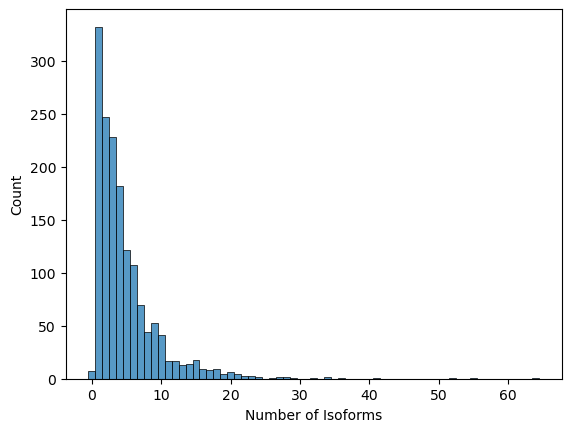

In [5]:
num_isoforms = np.array([len(isos) for isos in seqs.values()])
print("Number of proteins with found isoforms: " + str(len(seqs)))
aveisos = np.sum(num_isoforms)/len(seqs)
print("Average number of isoforms per gene: " + str(aveisos))
sns.histplot(num_isoforms, discrete=True).set(xlabel="Number of Isoforms");

Get and count the number of protein coding transcripts per human gene

Average number of isoforms per gene: 4.352397230256814
4.352397230256814
5.168844001519821
0.11338922373296334


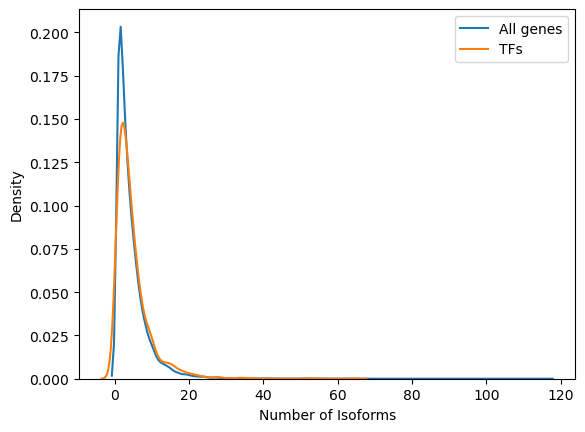

In [14]:
ensembl_rest.info_genome('homo sapiens', params={'expand':True})
all_genes_transcript_counts = {}

with open("all_human_transcripts.txt", "r") as f:
    for line in f.readlines():
        spltln = line.split("\t")
        if spltln[1] not in all_genes_transcript_counts:
            all_genes_transcript_counts[spltln[1]]=1
        else:
            all_genes_transcript_counts[spltln[1]]+=1
all_genes_transcript_counts_values = np.array(list(all_genes_transcript_counts.values()))
print("Average number of isoforms per gene: " + str(sum(all_genes_transcript_counts_values)/len(all_genes_transcript_counts_values)))
sns.kdeplot(np.array(all_genes_transcript_counts_values), label="All genes")
sns.kdeplot(num_isoforms, label="TFs").set(xlabel="Number of Isoforms")
plt.pyplot.legend();
print(np.mean(all_genes_transcript_counts_values))
print(np.std(num_isoforms))
print((np.mean(num_isoforms)-np.mean(all_genes_transcript_counts_values))/np.std(all_genes_transcript_counts_values))

Identify the domains in the isoforms

In [9]:
i=0
for gene_id in seqs:
    #if i==1:
    #    break
    #print(seqs[gene_id])
    for prot_id in seqs[gene_id]:
        results = ensembl_rest.overlap_translation(prot_id, 
                                                   type="domain")
        seqs[gene_id][prot_id]["domains"] = [res for res in results]
    i+=1

Get Uniprot IDs

In [3]:
mg = mygene.MyGeneInfo()
for gene_id in seqs:
    get_gene_result = mg.getgene(gene_id)
    if get_gene_result is not None and "uniprot" in get_gene_result:
        seqs[gene_id]["uniprot"] = get_gene_result["uniprot"]
#these are missing for some reason
seqs["ENSG00000106331"]["uniprot"] = {'Swiss-Prot':"O43316"}
seqs["ENSG00000185670"]["uniprot"] = {'Swiss-Prot':"Q9H5J0"}
seqs["ENSG00000225614"]["uniprot"] = {'Swiss-Prot':"Q96JG9"}
seqs["ENSG00000243660"]["uniprot"] = {'Swiss-Prot':"B1APH4"}
seqs["ENSG00000189144"]["uniprot"] = {'Swiss-Prot':"Q86YE8"}
seqs["ENSG00000258834"]["uniprot"] = {'Swiss-Prot':"Q9HBT8"}
seqs["ENSG00000255104"]["uniprot"] = {'Swiss-Prot':"P0CG31"}
seqs["ENSG00000249459"]["uniprot"] = {'Swiss-Prot':"P0CG31"}
seqs["ENSG00000175105"]["uniprot"] = {'Swiss-Prot':"Q8IZM8"}
seqs["ENSG00000160229"]["uniprot"] = {'Swiss-Prot':"Q6ZN08"}
seqs["ENSG00000135747"]["uniprot"] = {'Swiss-Prot':"Q9BS34"}
seqs["ENSG00000181450"]["uniprot"] = {'Swiss-Prot':"Q5SXM1"}
seqs["ENSG00000196826"]["uniprot"] = {'Swiss-Prot':"Q8N972"}
seqs["ENSG00000196081"]["uniprot"] = {'Swiss-Prot':"A8MTY0"}
seqs["ENSG00000196381"]["uniprot"] = {'Swiss-Prot':"Q8N8C0"}
seqs["ENSG00000224689"]["uniprot"] = {'Swiss-Prot':"P0C7V5"}
seqs["ENSG00000204532"]["uniprot"] = {'Swiss-Prot':"A6NGD5"}
seqs["ENSG00000267908"]["uniprot"] = {'Swiss-Prot':"P0CG00"}


In [40]:
mg = mygene.MyGeneInfo()
for gene_id in seqs:
    for prot_id in seqs[gene_id]:
        print(prot_id)
        get_gene_result = mg.query(f"q=ensembl.protein:{prot_id}")
        print(get_gene_result)
        if get_gene_result is not None and "uniprot" in get_gene_result:
            print(get_gene_result["uniprot"])
#these are missing for some reason
seqs["ENSG00000106331"]["uniprot"] = {'Swiss-Prot':"O43316"}
seqs["ENSG00000185670"]["uniprot"] = {'Swiss-Prot':"Q9H5J0"}
seqs["ENSG00000225614"]["uniprot"] = {'Swiss-Prot':"Q96JG9"}
seqs["ENSG00000243660"]["uniprot"] = {'Swiss-Prot':"B1APH4"}
seqs["ENSG00000189144"]["uniprot"] = {'Swiss-Prot':"Q86YE8"}
seqs["ENSG00000258834"]["uniprot"] = {'Swiss-Prot':"Q9HBT8"}
seqs["ENSG00000255104"]["uniprot"] = {'Swiss-Prot':"P0CG31"}
seqs["ENSG00000249459"]["uniprot"] = {'Swiss-Prot':"P0CG31"}
seqs["ENSG00000175105"]["uniprot"] = {'Swiss-Prot':"Q8IZM8"}
seqs["ENSG00000160229"]["uniprot"] = {'Swiss-Prot':"Q6ZN08"}
seqs["ENSG00000135747"]["uniprot"] = {'Swiss-Prot':"Q9BS34"}
seqs["ENSG00000181450"]["uniprot"] = {'Swiss-Prot':"Q5SXM1"}
seqs["ENSG00000196826"]["uniprot"] = {'Swiss-Prot':"Q8N972"}
seqs["ENSG00000196081"]["uniprot"] = {'Swiss-Prot':"A8MTY0"}
seqs["ENSG00000196381"]["uniprot"] = {'Swiss-Prot':"Q8N8C0"}
seqs["ENSG00000224689"]["uniprot"] = {'Swiss-Prot':"P0C7V5"}
seqs["ENSG00000204532"]["uniprot"] = {'Swiss-Prot':"A6NGD5"}
seqs["ENSG00000267908"]["uniprot"] = {'Swiss-Prot':"P0CG00"}


ENSP00000360662
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000483881
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000501294
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000493755
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000379346
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000379349
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000342905
{'took': 1, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000495540
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
uniprot
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000262198
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000453418
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000453275
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000468397
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
ENSP00000467370
{'took': 0, 'total': 0, 'max_score': None, 'hits': []}
uniprot
{'took

KeyboardInterrupt: 

In [4]:
with open("seqs.pickle", "wb") as f:
    pickle.dump(seqs, f)

In [19]:
with open("seqs.pickle", "rb") as f:
    seqs = pickle.load(f)

Get descriptions for manual curation of DNA-binding domains on Nov 27, 2023

In [27]:
interpro_superfamily_domains = pd.DataFrame(columns=["Name","Description"])
for gene_id in seqs:
    if len(seqs[gene_id])<=1:
        continue
    for prot_id in seqs[gene_id]:
        if not prot_id.startswith("ENS"):
            continue
        for domain in seqs[gene_id][prot_id]['domains']:
            if domain['interpro']=='' or domain['type']!='SuperFamily':
                continue
            #print(interpro_domains[domain['interpro']])
            if domain['interpro'] in interpro_superfamily_domains.index:
                continue
            interpro_url = f"https://www.ebi.ac.uk:443/interpro/api/entry/InterPro/{domain['interpro']}/?page_size=200"
            req = request.Request(interpro_url, headers = {"Accept": "application/json"})
            res = request.urlopen(req)
            json_res = json.loads(res.read().decode())
            #print(json_res)
            accession = json_res['metadata']['accession']
            name = json_res['metadata']['name']['name']
            description = ' '.join(json_res['metadata']['description'])
            #print([accession, name, description])
            interpro_superfamily_domains.loc[accession] = [name, description]
    #break
print(interpro_superfamily_domains)

                                                        Name  \
IPR009057                   Homeobox-like domain superfamily   
IPR036236                       Zinc finger C2H2 superfamily   
IPR036638    Helix-loop-helix DNA-binding domain superfamily   
IPR035965                             PAS domain superfamily   
IPR011011                         Zinc finger, FYVE/PHD-type   
...                                                      ...   
IPR036792  Aspartate carbamoyltransferase regulatory subu...   
IPR036875                 Zinc finger, CCHC-type superfamily   
IPR035896                               AN1-like Zinc finger   
IPR038765         Papain-like cysteine peptidase superfamily   
IPR008981                            F-MuLV receptor-binding   

                                                 Description  
IPR009057  <p>Homeobox domain (also known as homeodomain)...  
IPR036236  <p>C2H2-type (classical) zinc fingers (ZnF) we...  
IPR036638  <p>This domain is found in a nu

In [24]:
interpro_superfamily_domains.to_csv("interpro_superfamily_domains.tsv", sep="\t")

In [2]:
interpro_superfamily_domains_DBD = pd.read_csv("interpro_superfamily_domains_DBD.tsv", sep='\t', index_col=0)
print(interpro_superfamily_domains_DBD)

                                                        Name  \
IPR009057                   Homeobox-like domain superfamily   
IPR036236                       Zinc finger C2H2 superfamily   
IPR036638    Helix-loop-helix DNA-binding domain superfamily   
IPR035965                             PAS domain superfamily   
IPR011011                         Zinc finger, FYVE/PHD-type   
...                                                      ...   
IPR036792  Aspartate carbamoyltransferase regulatory subu...   
IPR036875                 Zinc finger, CCHC-type superfamily   
IPR035896                               AN1-like Zinc finger   
IPR038765         Papain-like cysteine peptidase superfamily   
IPR008981                            F-MuLV receptor-binding   

                                                 Description  DNA-binding  \
IPR009057  <p>Homeobox domain (also known as homeodomain)...         True   
IPR036236  <p>C2H2-type (classical) zinc fingers (ZnF) we...         True   


Interpro domain type counting and domain type classifying

In [28]:
ppi_domains = pd.read_csv("3did_pfam_pairs.txt", sep='\t',header=None)
print(ppi_domains.head())

for gene_id in seqs:
    if len(seqs[gene_id])<=1:
        continue
    for prot_id in seqs[gene_id]:
        if 'domains' not in seqs[gene_id][prot_id]: continue
        if 'Swiss-Prot' in seqs[gene_id]["uniprot"]:
            uniprot_id = seqs[gene_id]["uniprot"]['Swiss-Prot']
            if type(uniprot_id)!=str:
                uniprot_id = uniprot_id[0]
        else:
            #print(seqs[gene_id]["uniprot"])
            uniprot_id = seqs[gene_id]["uniprot"]['TrEMBL']
        if type(uniprot_id)==list:
            uniprot_id = uniprot_id[0]
        interpro_url = f"https://www.ebi.ac.uk:443/interpro/api/entry/InterPro/protein/UniProt/{uniprot_id}/?page_size=200"
        req = request.Request(interpro_url, headers = {"Accept": "application/json"})
        res = request.urlopen(req)
        json_res = json.loads(res.read().decode())
        #print(json_res['results'])
        interpro_domains = {domain['metadata']['accession']:domain 
                            for domain in json_res['results'] }
        ppi_locations = None
        for domain in interpro_domains:
            #print(interpro_domains[domain]['metadata']['member_databases'])
            if 'pfam' in interpro_domains[domain]['metadata']['member_databases']:
                pfam_id = list(interpro_domains[domain]['metadata']['member_databases']['pfam'].keys())[0]
                #print(pfam_id)
                if pfam_id in ppi_domains.values:
                    #print(f"PPI domain {pfam_id} in {gene_id}")
                    for epl in interpro_domains[domain]['proteins'][0]['entry_protein_locations']:
                        #print(epl['fragments'])
                        if ppi_locations == None:
                            ppi_locations = SeqFeature.FeatureLocation(start=epl['fragments'][0]['start'],
                                                                       end=epl['fragments'][0]['end'])
                        else:
                            ppi_locations += SeqFeature.FeatureLocation(start=epl['fragments'][0]['start'],
                                                                       end=epl['fragments'][0]['end'])
                    #print(html_res)
                else:
                    print(f"Not a PPI domain {pfam_id} in {gene_id}")
        #print(ppi_locations)
        for domain in seqs[gene_id][prot_id]['domains']:
            for interpro_id in interpro_domains:
                if domain['interpro']==interpro_id:
                    this_domain_locations = None
                    for epl in interpro_domains[interpro_id]['proteins'][0]['entry_protein_locations']:
                        #print(epl['fragments'])
                        if this_domain_locations == None:
                            this_domain_locations = SeqFeature.FeatureLocation(start=epl['fragments'][0]['start'],
                                                                       end=epl['fragments'][0]['end'])
                        else:
                            this_domain_locations += SeqFeature.FeatureLocation(start=epl['fragments'][0]['start'],
                                                                       end=epl['fragments'][0]['end'])
                    #print(this_domain_locations)
                    #print(ppi_locations)
                    if this_domain_locations == None or ppi_locations==None:
                        domain['PPI'] = False
                    elif sum([this_i in ppi_locations \
                                          for this_i in this_domain_locations])!=0:
                        domain['PPI'] = True
                    else:
                        domain['PPI'] = False
                    break

          0        1
0   PF10417  PF10417
1   PF10417  PF00578
2   PF10417  PF02195
3   PF10417  PF00085
4   PF12574  PF12574
Not a PPI domain PF19627 in ENSG00000101126
Not a PPI domain PF19627 in ENSG00000101126
Not a PPI domain PF19627 in ENSG00000101126
Not a PPI domain PF19627 in ENSG00000101126
Not a PPI domain PF19627 in ENSG00000101126
Not a PPI domain PF19627 in ENSG00000101126
Not a PPI domain PF19627 in ENSG00000101126
Not a PPI domain PF19627 in ENSG00000101126
Not a PPI domain PF19627 in ENSG00000101126
Not a PPI domain PF19627 in ENSG00000101544
Not a PPI domain PF19627 in ENSG00000101544
Not a PPI domain PF19627 in ENSG00000101544
Not a PPI domain PF19627 in ENSG00000101544
Not a PPI domain PF19627 in ENSG00000101544
Not a PPI domain PF19627 in ENSG00000101544
Not a PPI domain PF18875 in ENSG00000144218
Not a PPI domain PF18875 in ENSG00000144218
Not a PPI domain PF18875 in ENSG00000144218
Not a PPI domain PF18875 in ENSG00000144218
Not a PPI domain PF18875 in ENSG000001

Not a PPI domain PF03859 in ENSG00000171735
Not a PPI domain PF03859 in ENSG00000171735
Not a PPI domain PF03859 in ENSG00000171735
Not a PPI domain PF03859 in ENSG00000108509
Not a PPI domain PF03859 in ENSG00000108509
Not a PPI domain PF03859 in ENSG00000108509
Not a PPI domain PF03859 in ENSG00000108509
Not a PPI domain PF03859 in ENSG00000108509
Not a PPI domain PF03859 in ENSG00000108509
Not a PPI domain PF03859 in ENSG00000108509
Not a PPI domain PF04731 in ENSG00000113722
Not a PPI domain PF04731 in ENSG00000113722
Not a PPI domain PF04731 in ENSG00000165556
Not a PPI domain PF04731 in ENSG00000165556
Not a PPI domain PF04731 in ENSG00000131264
Not a PPI domain PF04731 in ENSG00000131264
Not a PPI domain PF03914 in ENSG00000115816
Not a PPI domain PF03914 in ENSG00000115816
Not a PPI domain PF03914 in ENSG00000115816
Not a PPI domain PF16367 in ENSG00000080802
Not a PPI domain PF16367 in ENSG00000080802
Not a PPI domain PF16367 in ENSG00000080802
Not a PPI domain PF16367 in ENSG

Not a PPI domain PF21255 in ENSG00000119772
Not a PPI domain PF21255 in ENSG00000119772
Not a PPI domain PF21255 in ENSG00000119772
Not a PPI domain PF21255 in ENSG00000119772
Not a PPI domain PF21255 in ENSG00000119772
Not a PPI domain PF21255 in ENSG00000119772
Not a PPI domain PF21255 in ENSG00000088305
Not a PPI domain PF21255 in ENSG00000088305
Not a PPI domain PF21255 in ENSG00000088305
Not a PPI domain PF21255 in ENSG00000088305
Not a PPI domain PF21255 in ENSG00000088305
Not a PPI domain PF21255 in ENSG00000088305
Not a PPI domain PF21255 in ENSG00000088305
Not a PPI domain PF21255 in ENSG00000088305
Not a PPI domain PF21255 in ENSG00000088305
Not a PPI domain PF21255 in ENSG00000142182
Not a PPI domain PF21255 in ENSG00000142182
Not a PPI domain PF21255 in ENSG00000142182
Not a PPI domain PF21255 in ENSG00000142182
Not a PPI domain PF16866 in ENSG00000133884
Not a PPI domain PF14051 in ENSG00000133884
Not a PPI domain PF16866 in ENSG00000133884
Not a PPI domain PF14051 in ENSG

Not a PPI domain PF16676 in ENSG00000150907
Not a PPI domain PF16675 in ENSG00000150907
Not a PPI domain PF16676 in ENSG00000118689
Not a PPI domain PF16675 in ENSG00000118689
Not a PPI domain PF16676 in ENSG00000118689
Not a PPI domain PF16675 in ENSG00000118689
Not a PPI domain PF16676 in ENSG00000118689
Not a PPI domain PF16675 in ENSG00000118689
Not a PPI domain PF16676 in ENSG00000118689
Not a PPI domain PF16675 in ENSG00000118689
Not a PPI domain PF16676 in ENSG00000184481
Not a PPI domain PF16676 in ENSG00000184481
Not a PPI domain PF16676 in ENSG00000184481
Not a PPI domain PF16676 in ENSG00000204060
Not a PPI domain PF16675 in ENSG00000204060
Not a PPI domain PF16676 in ENSG00000204060
Not a PPI domain PF16675 in ENSG00000204060
Not a PPI domain PF16676 in ENSG00000204060
Not a PPI domain PF16675 in ENSG00000204060
Not a PPI domain PF16159 in ENSG00000114861
Not a PPI domain PF16159 in ENSG00000114861
Not a PPI domain PF16159 in ENSG00000114861
Not a PPI domain PF16159 in ENSG

Not a PPI domain PF02178 in ENSG00000149948
Not a PPI domain PF02178 in ENSG00000149948
Not a PPI domain PF02178 in ENSG00000149948
Not a PPI domain PF02178 in ENSG00000149948
Not a PPI domain PF02178 in ENSG00000149948
Not a PPI domain PF02178 in ENSG00000149948
Not a PPI domain PF02178 in ENSG00000149948
Not a PPI domain PF18717 in ENSG00000113716
Not a PPI domain PF18717 in ENSG00000113716
Not a PPI domain PF18717 in ENSG00000113716
Not a PPI domain PF18717 in ENSG00000113716
Not a PPI domain PF13775 in ENSG00000100281
Not a PPI domain PF13775 in ENSG00000100281
Not a PPI domain PF13775 in ENSG00000100281
Not a PPI domain PF13775 in ENSG00000100281
Not a PPI domain PF04812 in ENSG00000135100
Not a PPI domain PF04813 in ENSG00000135100
Not a PPI domain PF04814 in ENSG00000135100
Not a PPI domain PF04812 in ENSG00000135100
Not a PPI domain PF04813 in ENSG00000135100
Not a PPI domain PF04814 in ENSG00000135100
Not a PPI domain PF04812 in ENSG00000135100
Not a PPI domain PF04813 in ENSG

Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF01530 in ENSG00000136504
Not a PPI domain PF16866 in ENSG00000173120
Not a PPI domain PF17811 in ENSG00000173120
Not a PPI domain PF16866 in ENSG00000173120
Not a PPI domain PF17811 in ENSG00000173120
Not a PPI domain PF16866 in ENSG00000173120
Not a PPI domain PF17811 in ENSG00000173120
Not a PPI domain PF16866 in ENSG00000173120
Not a PPI domain PF17811 in ENSG

Not a PPI domain PF16833 in ENSG00000105610
Not a PPI domain PF16832 in ENSG00000105610
Not a PPI domain PF05965 in ENSG00000118058
Not a PPI domain PF16866 in ENSG00000118058
Not a PPI domain PF05965 in ENSG00000118058
Not a PPI domain PF16866 in ENSG00000118058
Not a PPI domain PF05965 in ENSG00000118058
Not a PPI domain PF16866 in ENSG00000118058
Not a PPI domain PF05965 in ENSG00000118058
Not a PPI domain PF16866 in ENSG00000118058
Not a PPI domain PF05965 in ENSG00000118058
Not a PPI domain PF16866 in ENSG00000118058
Not a PPI domain PF05965 in ENSG00000118058
Not a PPI domain PF16866 in ENSG00000118058
Not a PPI domain PF05965 in ENSG00000118058
Not a PPI domain PF16866 in ENSG00000118058
Not a PPI domain PF05965 in ENSG00000118058
Not a PPI domain PF16866 in ENSG00000118058
Not a PPI domain PF05965 in ENSG00000118058
Not a PPI domain PF16866 in ENSG00000118058
Not a PPI domain PF05965 in ENSG00000118058
Not a PPI domain PF16866 in ENSG00000118058
Not a PPI domain PF05965 in ENSG

Not a PPI domain PF16493 in ENSG00000105419
Not a PPI domain PF16493 in ENSG00000105419
Not a PPI domain PF16493 in ENSG00000105419
Not a PPI domain PF16493 in ENSG00000105419
Not a PPI domain PF16493 in ENSG00000105419
Not a PPI domain PF16493 in ENSG00000105419
Not a PPI domain PF16493 in ENSG00000105419
Not a PPI domain PF16493 in ENSG00000105419
Not a PPI domain PF16493 in ENSG00000105419
Not a PPI domain PF16493 in ENSG00000105419
Not a PPI domain PF16493 in ENSG00000105419
Not a PPI domain PF16059 in ENSG00000174197
Not a PPI domain PF16059 in ENSG00000174197
Not a PPI domain PF16059 in ENSG00000174197
Not a PPI domain PF16059 in ENSG00000174197
Not a PPI domain PF16059 in ENSG00000174197
Not a PPI domain PF16059 in ENSG00000174197
Not a PPI domain PF16059 in ENSG00000174197
Not a PPI domain PF16059 in ENSG00000174197
Not a PPI domain PF19426 in ENSG00000198160
Not a PPI domain PF19426 in ENSG00000198160
Not a PPI domain PF19426 in ENSG00000198160
Not a PPI domain PF19426 in ENSG

Not a PPI domain PF01530 in ENSG00000186487
Not a PPI domain PF08474 in ENSG00000186487
Not a PPI domain PF01530 in ENSG00000186487
Not a PPI domain PF08474 in ENSG00000186487
Not a PPI domain PF01530 in ENSG00000186487
Not a PPI domain PF08474 in ENSG00000186487
Not a PPI domain PF01530 in ENSG00000186487
Not a PPI domain PF08474 in ENSG00000186487
Not a PPI domain PF01530 in ENSG00000186487
Not a PPI domain PF08474 in ENSG00000186487
Not a PPI domain PF01530 in ENSG00000186487
Not a PPI domain PF08474 in ENSG00000186487
Not a PPI domain PF01530 in ENSG00000186487
Not a PPI domain PF08474 in ENSG00000186487
Not a PPI domain PF01530 in ENSG00000186487
Not a PPI domain PF08474 in ENSG00000186487
Not a PPI domain PF01530 in ENSG00000186487
Not a PPI domain PF08474 in ENSG00000186487
Not a PPI domain PF01530 in ENSG00000186487
Not a PPI domain PF08474 in ENSG00000186487
Not a PPI domain PF01530 in ENSG00000186487
Not a PPI domain PF08474 in ENSG00000186487
Not a PPI domain PF01530 in ENSG

Not a PPI domain PF00859 in ENSG00000008441
Not a PPI domain PF10524 in ENSG00000008441
Not a PPI domain PF00859 in ENSG00000008441
Not a PPI domain PF10524 in ENSG00000008441
Not a PPI domain PF00859 in ENSG00000008441
Not a PPI domain PF10524 in ENSG00000008441
Not a PPI domain PF00859 in ENSG00000008441
Not a PPI domain PF10524 in ENSG00000008441
Not a PPI domain PF00859 in ENSG00000008441
Not a PPI domain PF10524 in ENSG00000008441
Not a PPI domain PF00859 in ENSG00000008441
Not a PPI domain PF10524 in ENSG00000008441
Not a PPI domain PF00859 in ENSG00000008441
Not a PPI domain PF10524 in ENSG00000008441
Not a PPI domain PF00859 in ENSG00000008441
Not a PPI domain PF10524 in ENSG00000008441
Not a PPI domain PF00859 in ENSG00000008441
Not a PPI domain PF10524 in ENSG00000008441
Not a PPI domain PF00859 in ENSG00000008441
Not a PPI domain PF10524 in ENSG00000008441
Not a PPI domain PF00859 in ENSG00000008441
Not a PPI domain PF10524 in ENSG00000008441
Not a PPI domain PF00859 in ENSG

Not a PPI domain PF03792 in ENSG00000185630
Not a PPI domain PF03792 in ENSG00000185630
Not a PPI domain PF03792 in ENSG00000185630
Not a PPI domain PF03792 in ENSG00000185630
Not a PPI domain PF03792 in ENSG00000185630
Not a PPI domain PF03792 in ENSG00000185630
Not a PPI domain PF03792 in ENSG00000185630
Not a PPI domain PF03792 in ENSG00000185630
Not a PPI domain PF03792 in ENSG00000185630
Not a PPI domain PF03792 in ENSG00000185630
Not a PPI domain PF03792 in ENSG00000185630
Not a PPI domain PF03792 in ENSG00000204304
Not a PPI domain PF03792 in ENSG00000204304
Not a PPI domain PF03792 in ENSG00000167081
Not a PPI domain PF03792 in ENSG00000167081
Not a PPI domain PF03792 in ENSG00000167081
Not a PPI domain PF03792 in ENSG00000167081
Not a PPI domain PF03792 in ENSG00000167081
Not a PPI domain PF03792 in ENSG00000167081
Not a PPI domain PF03792 in ENSG00000167081
Not a PPI domain PF03792 in ENSG00000105717
Not a PPI domain PF03792 in ENSG00000105717
Not a PPI domain PF02161 in ENSG

Not a PPI domain PF21206 in ENSG00000056586
Not a PPI domain PF21206 in ENSG00000056586
Not a PPI domain PF20878 in ENSG00000089902
Not a PPI domain PF20878 in ENSG00000089902
Not a PPI domain PF20878 in ENSG00000167771
Not a PPI domain PF20878 in ENSG00000167771
Not a PPI domain PF20878 in ENSG00000117625
Not a PPI domain PF20878 in ENSG00000117625
Not a PPI domain PF20878 in ENSG00000117625
Not a PPI domain PF20878 in ENSG00000117625
Not a PPI domain PF20878 in ENSG00000117625
Not a PPI domain PF20878 in ENSG00000117625
Not a PPI domain PF20878 in ENSG00000117625
Not a PPI domain PF20878 in ENSG00000117625
Not a PPI domain PF20878 in ENSG00000117625
Not a PPI domain PF16180 in ENSG00000104856
Not a PPI domain PF16181 in ENSG00000104856
Not a PPI domain PF16180 in ENSG00000104856
Not a PPI domain PF16181 in ENSG00000104856
Not a PPI domain PF16180 in ENSG00000104856
Not a PPI domain PF16181 in ENSG00000104856
Not a PPI domain PF16180 in ENSG00000104856
Not a PPI domain PF16181 in ENSG

Not a PPI domain PF02376 in ENSG00000182568
Not a PPI domain PF16557 in ENSG00000182568
Not a PPI domain PF02376 in ENSG00000182568
Not a PPI domain PF16557 in ENSG00000182568
Not a PPI domain PF02376 in ENSG00000182568
Not a PPI domain PF16557 in ENSG00000182568
Not a PPI domain PF02376 in ENSG00000182568
Not a PPI domain PF16557 in ENSG00000182568
Not a PPI domain PF02376 in ENSG00000182568
Not a PPI domain PF16557 in ENSG00000182568
Not a PPI domain PF02376 in ENSG00000182568
Not a PPI domain PF16557 in ENSG00000182568
Not a PPI domain PF02376 in ENSG00000119042
Not a PPI domain PF16557 in ENSG00000119042
Not a PPI domain PF02376 in ENSG00000119042
Not a PPI domain PF16557 in ENSG00000119042
Not a PPI domain PF02376 in ENSG00000119042
Not a PPI domain PF16557 in ENSG00000119042
Not a PPI domain PF02376 in ENSG00000119042
Not a PPI domain PF16557 in ENSG00000119042
Not a PPI domain PF02376 in ENSG00000119042
Not a PPI domain PF16557 in ENSG00000119042
Not a PPI domain PF02376 in ENSG

Not a PPI domain PF12162 in ENSG00000115415
Not a PPI domain PF21354 in ENSG00000115415
Not a PPI domain PF12162 in ENSG00000115415
Not a PPI domain PF21354 in ENSG00000115415
Not a PPI domain PF12162 in ENSG00000115415
Not a PPI domain PF21354 in ENSG00000115415
Not a PPI domain PF12162 in ENSG00000115415
Not a PPI domain PF21354 in ENSG00000115415
Not a PPI domain PF12162 in ENSG00000115415
Not a PPI domain PF21354 in ENSG00000115415
Not a PPI domain PF12162 in ENSG00000115415
Not a PPI domain PF21354 in ENSG00000115415
Not a PPI domain PF12162 in ENSG00000115415
Not a PPI domain PF21354 in ENSG00000115415
Not a PPI domain PF12162 in ENSG00000115415
Not a PPI domain PF21354 in ENSG00000115415
Not a PPI domain PF12162 in ENSG00000115415
Not a PPI domain PF21354 in ENSG00000115415
Not a PPI domain PF12188 in ENSG00000170581
Not a PPI domain PF21354 in ENSG00000170581
Not a PPI domain PF12188 in ENSG00000170581
Not a PPI domain PF21354 in ENSG00000170581
Not a PPI domain PF12188 in ENSG

Not a PPI domain PF11851 in ENSG00000112561
Not a PPI domain PF15951 in ENSG00000112561
Not a PPI domain PF11851 in ENSG00000112561
Not a PPI domain PF15951 in ENSG00000112561
Not a PPI domain PF11851 in ENSG00000112561
Not a PPI domain PF15951 in ENSG00000112561
Not a PPI domain PF11851 in ENSG00000112561
Not a PPI domain PF15951 in ENSG00000112561
Not a PPI domain PF11851 in ENSG00000112561
Not a PPI domain PF15951 in ENSG00000112561
Not a PPI domain PF11851 in ENSG00000112561
Not a PPI domain PF15951 in ENSG00000112561
Not a PPI domain PF11851 in ENSG00000105967
Not a PPI domain PF11851 in ENSG00000105967
Not a PPI domain PF11851 in ENSG00000105967
Not a PPI domain PF11851 in ENSG00000105967
Not a PPI domain PF11851 in ENSG00000105967
Not a PPI domain PF11851 in ENSG00000105967
Not a PPI domain PF05485 in ENSG00000131931
Not a PPI domain PF05485 in ENSG00000131931
Not a PPI domain PF05485 in ENSG00000131931
Not a PPI domain PF05485 in ENSG00000131931
Not a PPI domain PF05485 in ENSG

Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG00000169554
Not a PPI domain PF05605 in ENSG

Not a PPI domain PF01352 in ENSG00000141946
Not a PPI domain PF01352 in ENSG00000106261
Not a PPI domain PF01352 in ENSG00000106261
Not a PPI domain PF01352 in ENSG00000106261
Not a PPI domain PF01352 in ENSG00000106261
Not a PPI domain PF01352 in ENSG00000106261
Not a PPI domain PF01352 in ENSG00000106261
Not a PPI domain PF01352 in ENSG00000155592
Not a PPI domain PF13837 in ENSG00000155592
Not a PPI domain PF01352 in ENSG00000155592
Not a PPI domain PF13837 in ENSG00000155592
Not a PPI domain PF01352 in ENSG00000189298
Not a PPI domain PF01352 in ENSG00000189298
Not a PPI domain PF01352 in ENSG00000189298
Not a PPI domain PF01352 in ENSG00000189298
Not a PPI domain PF01352 in ENSG00000187626
Not a PPI domain PF01352 in ENSG00000187626
Not a PPI domain PF01352 in ENSG00000196652
Not a PPI domain PF01352 in ENSG00000196652
Not a PPI domain PF01352 in ENSG00000196652
Not a PPI domain PF01352 in ENSG00000196652
Not a PPI domain PF01352 in ENSG00000196345
Not a PPI domain PF01352 in ENSG

Not a PPI domain PF01352 in ENSG00000136870
Not a PPI domain PF01352 in ENSG00000136870
Not a PPI domain PF01352 in ENSG00000136870
Not a PPI domain PF01352 in ENSG00000157429
Not a PPI domain PF01352 in ENSG00000157429
Not a PPI domain PF01352 in ENSG00000157429
Not a PPI domain PF01352 in ENSG00000157429
Not a PPI domain PF01352 in ENSG00000157429
Not a PPI domain PF01352 in ENSG00000157429
Not a PPI domain PF01352 in ENSG00000157429
Not a PPI domain PF01352 in ENSG00000157429
Not a PPI domain PF01352 in ENSG00000157429
Not a PPI domain PF01352 in ENSG00000157429
Not a PPI domain PF01352 in ENSG00000157429
Not a PPI domain PF01352 in ENSG00000005801
Not a PPI domain PF01352 in ENSG00000005801
Not a PPI domain PF01352 in ENSG00000005801
Not a PPI domain PF01352 in ENSG00000005801
Not a PPI domain PF01352 in ENSG00000005801
Not a PPI domain PF01352 in ENSG00000005801
Not a PPI domain PF01352 in ENSG00000005801
Not a PPI domain PF01352 in ENSG00000005801
Not a PPI domain PF01352 in ENSG

Not a PPI domain PF01352 in ENSG00000198105
Not a PPI domain PF01352 in ENSG00000198105
Not a PPI domain PF01352 in ENSG00000198105
Not a PPI domain PF01352 in ENSG00000198105
Not a PPI domain PF01352 in ENSG00000198105
Not a PPI domain PF01352 in ENSG00000198105
Not a PPI domain PF01352 in ENSG00000175395
Not a PPI domain PF01352 in ENSG00000175395
Not a PPI domain PF01352 in ENSG00000196150
Not a PPI domain PF01352 in ENSG00000196150
Not a PPI domain PF01352 in ENSG00000196150
Not a PPI domain PF01352 in ENSG00000196150
Not a PPI domain PF01352 in ENSG00000196150
Not a PPI domain PF01352 in ENSG00000196150
Not a PPI domain PF01352 in ENSG00000196150
Not a PPI domain PF01352 in ENSG00000198169
Not a PPI domain PF01352 in ENSG00000198169
Not a PPI domain PF01352 in ENSG00000198169
Not a PPI domain PF01352 in ENSG00000256771
Not a PPI domain PF01352 in ENSG00000256771
Not a PPI domain PF01352 in ENSG00000256771
Not a PPI domain PF01352 in ENSG00000256771
Not a PPI domain PF01352 in ENSG

Not a PPI domain PF01352 in ENSG00000182986
Not a PPI domain PF01352 in ENSG00000182986
Not a PPI domain PF01352 in ENSG00000182986
Not a PPI domain PF01352 in ENSG00000182986
Not a PPI domain PF01352 in ENSG00000182986
Not a PPI domain PF01352 in ENSG00000083812
Not a PPI domain PF01352 in ENSG00000083812
Not a PPI domain PF01352 in ENSG00000083812
Not a PPI domain PF01352 in ENSG00000083812
Not a PPI domain PF01352 in ENSG00000249471
Not a PPI domain PF01352 in ENSG00000249471
Not a PPI domain PF01352 in ENSG00000249471
Not a PPI domain PF01352 in ENSG00000249471
Not a PPI domain PF01352 in ENSG00000249471
Not a PPI domain PF01352 in ENSG00000249471
Not a PPI domain PF01352 in ENSG00000249471
Not a PPI domain PF04988 in ENSG00000162664
Not a PPI domain PF04988 in ENSG00000162664
Not a PPI domain PF04988 in ENSG00000162664
Not a PPI domain PF04988 in ENSG00000162664
Not a PPI domain PF01352 in ENSG00000130844
Not a PPI domain PF01352 in ENSG00000130844
Not a PPI domain PF01352 in ENSG

Not a PPI domain PF01352 in ENSG00000105136
Not a PPI domain PF01352 in ENSG00000197050
Not a PPI domain PF01352 in ENSG00000197050
Not a PPI domain PF01352 in ENSG00000197050
Not a PPI domain PF01352 in ENSG00000197050
Not a PPI domain PF01352 in ENSG00000197050
Not a PPI domain PF01352 in ENSG00000197050
Not a PPI domain PF01352 in ENSG00000197050
Not a PPI domain PF01352 in ENSG00000204947
Not a PPI domain PF01352 in ENSG00000204947
Not a PPI domain PF01352 in ENSG00000204947
Not a PPI domain PF01352 in ENSG00000130818
Not a PPI domain PF01352 in ENSG00000130818
Not a PPI domain PF01352 in ENSG00000130818
Not a PPI domain PF01352 in ENSG00000130818
Not a PPI domain PF01352 in ENSG00000130818
Not a PPI domain PF01352 in ENSG00000197013
Not a PPI domain PF01352 in ENSG00000197013
Not a PPI domain PF01352 in ENSG00000197013
Not a PPI domain PF01352 in ENSG00000197013
Not a PPI domain PF01352 in ENSG00000198521
Not a PPI domain PF01352 in ENSG00000198521
Not a PPI domain PF01352 in ENSG

Not a PPI domain PF01352 in ENSG00000103199
Not a PPI domain PF01352 in ENSG00000103199
Not a PPI domain PF01352 in ENSG00000103199
Not a PPI domain PF01352 in ENSG00000103199
Not a PPI domain PF01352 in ENSG00000103199
Not a PPI domain PF01352 in ENSG00000103199
Not a PPI domain PF01352 in ENSG00000103199
Not a PPI domain PF01352 in ENSG00000081665
Not a PPI domain PF01352 in ENSG00000081665
Not a PPI domain PF01352 in ENSG00000081665
Not a PPI domain PF01352 in ENSG00000081665
Not a PPI domain PF01352 in ENSG00000081665
Not a PPI domain PF01352 in ENSG00000081665
Not a PPI domain PF01352 in ENSG00000081665
Not a PPI domain PF01352 in ENSG00000081665
Not a PPI domain PF01352 in ENSG00000081665
Not a PPI domain PF01352 in ENSG00000081386
Not a PPI domain PF01352 in ENSG00000081386
Not a PPI domain PF01352 in ENSG00000081386
Not a PPI domain PF21367 in ENSG00000243943
Not a PPI domain PF21276 in ENSG00000243943
Not a PPI domain PF21367 in ENSG00000243943
Not a PPI domain PF21276 in ENSG

Not a PPI domain PF01352 in ENSG00000188321
Not a PPI domain PF01352 in ENSG00000188321
Not a PPI domain PF01352 in ENSG00000188321
Not a PPI domain PF01352 in ENSG00000188321
Not a PPI domain PF01352 in ENSG00000188321
Not a PPI domain PF01352 in ENSG00000188321
Not a PPI domain PF01352 in ENSG00000188321
Not a PPI domain PF01352 in ENSG00000270011
Not a PPI domain PF01352 in ENSG00000270011
Not a PPI domain PF01352 in ENSG00000270011
Not a PPI domain PF01352 in ENSG00000270011
Not a PPI domain PF01352 in ENSG00000198028
Not a PPI domain PF01352 in ENSG00000198028
Not a PPI domain PF01352 in ENSG00000171469
Not a PPI domain PF01352 in ENSG00000171469
Not a PPI domain PF01352 in ENSG00000171469
Not a PPI domain PF01352 in ENSG00000171469
Not a PPI domain PF01352 in ENSG00000171469
Not a PPI domain PF01352 in ENSG00000171469
Not a PPI domain PF01352 in ENSG00000171469
Not a PPI domain PF01352 in ENSG00000171466
Not a PPI domain PF01352 in ENSG00000171466
Not a PPI domain PF01352 in ENSG

Not a PPI domain PF01352 in ENSG00000153896
Not a PPI domain PF01352 in ENSG00000153896
Not a PPI domain PF01352 in ENSG00000153896
Not a PPI domain PF01352 in ENSG00000153896
Not a PPI domain PF01352 in ENSG00000196458
Not a PPI domain PF01352 in ENSG00000196458
Not a PPI domain PF01352 in ENSG00000196458
Not a PPI domain PF01352 in ENSG00000166704
Not a PPI domain PF01352 in ENSG00000166704
Not a PPI domain PF01352 in ENSG00000166704
Not a PPI domain PF01352 in ENSG00000166704
Not a PPI domain PF01352 in ENSG00000166704
Not a PPI domain PF01352 in ENSG00000166704
Not a PPI domain PF01352 in ENSG00000166704
Not a PPI domain PF01352 in ENSG00000198182
Not a PPI domain PF01352 in ENSG00000198182
Not a PPI domain PF01352 in ENSG00000198182
Not a PPI domain PF01352 in ENSG00000198182
Not a PPI domain PF01352 in ENSG00000198182
Not a PPI domain PF01352 in ENSG00000167554
Not a PPI domain PF01352 in ENSG00000167554
Not a PPI domain PF01352 in ENSG00000167554
Not a PPI domain PF01352 in ENSG

Not a PPI domain PF01352 in ENSG00000117010
Not a PPI domain PF01352 in ENSG00000117010
Not a PPI domain PF01352 in ENSG00000117010
Not a PPI domain PF01352 in ENSG00000117010
Not a PPI domain PF01352 in ENSG00000117010
Not a PPI domain PF16622 in ENSG00000143373
Not a PPI domain PF16622 in ENSG00000143373
Not a PPI domain PF16622 in ENSG00000143373
Not a PPI domain PF16622 in ENSG00000143373
Not a PPI domain PF16622 in ENSG00000143373
Not a PPI domain PF16622 in ENSG00000143373
Not a PPI domain PF01352 in ENSG00000229809
Not a PPI domain PF01352 in ENSG00000229809
Not a PPI domain PF01352 in ENSG00000229809
Not a PPI domain PF01352 in ENSG00000229809
Not a PPI domain PF01352 in ENSG00000229809
Not a PPI domain PF01352 in ENSG00000229809
Not a PPI domain PF01352 in ENSG00000156853
Not a PPI domain PF01352 in ENSG00000156853
Not a PPI domain PF01352 in ENSG00000198429
Not a PPI domain PF01352 in ENSG00000198429
Not a PPI domain PF01352 in ENSG00000198429
Not a PPI domain PF01352 in ENSG

Not a PPI domain PF01352 in ENSG00000196214
Not a PPI domain PF01352 in ENSG00000196214
Not a PPI domain PF01352 in ENSG00000196214
Not a PPI domain PF01352 in ENSG00000196214
Not a PPI domain PF01352 in ENSG00000196214
Not a PPI domain PF01352 in ENSG00000196214
Not a PPI domain PF01352 in ENSG00000196214
Not a PPI domain PF01352 in ENSG00000196214
Not a PPI domain PF01352 in ENSG00000196214
Not a PPI domain PF01352 in ENSG00000175691
Not a PPI domain PF01352 in ENSG00000175691
Not a PPI domain PF01352 in ENSG00000197128
Not a PPI domain PF01352 in ENSG00000197128
Not a PPI domain PF01352 in ENSG00000197128
Not a PPI domain PF01352 in ENSG00000197128
Not a PPI domain PF01352 in ENSG00000197128
Not a PPI domain PF01352 in ENSG00000197128
Not a PPI domain PF01352 in ENSG00000197128
Not a PPI domain PF01352 in ENSG00000197128
Not a PPI domain PF01352 in ENSG00000152439
Not a PPI domain PF01352 in ENSG00000152439
Not a PPI domain PF01352 in ENSG00000152439
Not a PPI domain PF01352 in ENSG

Not a PPI domain PF01352 in ENSG00000105750
Not a PPI domain PF01352 in ENSG00000105750
Not a PPI domain PF01352 in ENSG00000105750
Not a PPI domain PF01352 in ENSG00000105750
Not a PPI domain PF01352 in ENSG00000105750
Not a PPI domain PF01352 in ENSG00000105750
Not a PPI domain PF01352 in ENSG00000105750
Not a PPI domain PF01352 in ENSG00000105750
Not a PPI domain PF01352 in ENSG00000105750
Not a PPI domain PF01352 in ENSG00000105750
Not a PPI domain PF01352 in ENSG00000197385
Not a PPI domain PF01352 in ENSG00000197385
Not a PPI domain PF01352 in ENSG00000257446
Not a PPI domain PF01352 in ENSG00000257446
Not a PPI domain PF01352 in ENSG00000234284
Not a PPI domain PF01352 in ENSG00000234284
Not a PPI domain PF01352 in ENSG00000234284
Not a PPI domain PF01352 in ENSG00000234284
Not a PPI domain PF01352 in ENSG00000234284
Not a PPI domain PF01352 in ENSG00000221923
Not a PPI domain PF01352 in ENSG00000221923
Not a PPI domain PF01352 in ENSG00000221923
Not a PPI domain PF01352 in ENSG

In [27]:
res = request.urlopen(req)

Average domains per isoform: 2.2246386248209404
Proportion of isoforms with DNA-binding: 0.6328949081911708
Proportion of isoforms with PPI: 0.6679255111342622
Proportion of isoforms with histone interaction: 0.03333767417632504
Proportion of genes with DNA binding: 0.8944691671964399


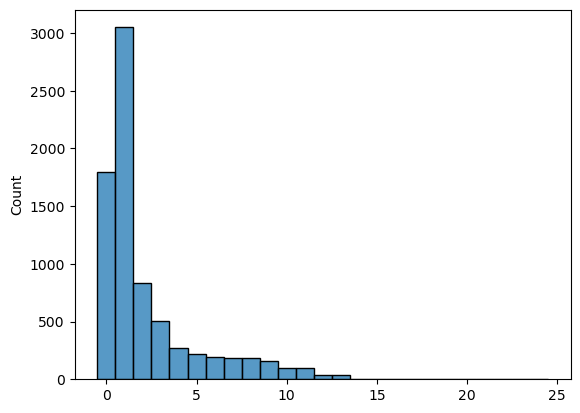

In [30]:
total_domains = 0
total_isoforms = 0
domain_type_counts = {}
isoforms_with_DNAbinding = 0
isoforms_with_PPI = 0
isoforms_with_xhistone = 0
genes_with_DNAbinding = 0
geneList_DNAbinding = []
domain_counts = []
for gene_id in seqs:
    if len(seqs[gene_id])<=1:
        continue
    if 'Swiss-Prot' in seqs[gene_id]["uniprot"]:
        uniprot_id = seqs[gene_id]["uniprot"]['Swiss-Prot']
        if type(uniprot_id)!=str:
            uniprot_id = uniprot_id[0]
    else:
        #print(seqs[gene_id]["uniprot"])
        uniprot_id = seqs[gene_id]["uniprot"]['TrEMBL']
    if type(uniprot_id)==list:
        uniprot_id = uniprot_id[0]
    interpro_url = f"https://www.ebi.ac.uk:443/interpro/api/entry/InterPro/protein/UniProt/{uniprot_id}/?page_size=200"
    req = request.Request(interpro_url, headers = {"Accept": "application/json"})
    res = request.urlopen(req)
    json_res = json.loads(res.read().decode())
    interpro_domains = {domain['metadata']['accession']:domain for domain in json_res['results'] 
                        if 'ssf' in domain['metadata']['member_databases']}
    for prot_id in seqs[gene_id]:
        if not prot_id.startswith("ENS"):
            continue
        total_isoforms+=1
        domain_counts.append(0)
        for domain in seqs[gene_id][prot_id]["domains"]:
            if domain['interpro']=='' or domain['type']!='SuperFamily':
                continue
            total_domains+=1
            domain_counts[-1]+=1
            if domain['interpro'] in domain_type_counts:
                domain_type_counts[domain['interpro']]+=1
            else:
                domain_type_counts[domain['interpro']]=1
            #is_ppi = False
            #if domain['interpro'] in interpro_domains and \
            #   interpro_domains[domain['interpro']]['metadata']['go_terms'] is not None:
            #    for go_term in interpro_domains[domain['interpro']]['metadata']['go_terms']:
            #        if go_term['name']=='protein binding':
            #            is_ppi = True
            #domain['PPI'] = is_ppi
            if 'PPI' not in domain:
                domain['PPI'] = False
        for domain in seqs[gene_id][prot_id]["domains"]:
            if domain['interpro']=='' or domain['type']!='SuperFamily':
                continue
            domain['DNA-binding'] = interpro_superfamily_domains_DBD.loc[domain['interpro'],"DNA-binding"]
        for domain in seqs[gene_id][prot_id]["domains"]:
            if domain['interpro']=='' or domain['type']!='SuperFamily':
                continue
            domain['histone'] = interpro_superfamily_domains_DBD.loc[domain['interpro'],"Histone-interaction"]
        has_DNAbinding = False
        has_PPI = False
        has_histone = False
        for domain in seqs[gene_id][prot_id]["domains"]:
            if domain['interpro']=='' or domain['type']!='SuperFamily':
                continue
            if domain['DNA-binding']:
                has_DNAbinding = True
            if domain['PPI']:
                has_PPI = True
            if domain['histone']:
                has_histone = True
        if has_DNAbinding:
            isoforms_with_DNAbinding += 1
        if has_PPI:
            isoforms_with_PPI += 1
        if has_histone:
            isoforms_with_histone +=1
    has_DNA = False
    for prot_id in seqs[gene_id]:
        if not prot_id.startswith("ENS"):
            continue
        for domain in seqs[gene_id][prot_id]["domains"]:
            if domain['interpro']=='' or domain['type']!="SuperFamily":
                continue
            if domain["DNA-binding"]:
                has_DNA = True
                break
    if has_DNA:
        genes_with_DNAbinding += 1
        geneList_DNAbinding.append(gene_id)
print(f"Average domains per isoform: {total_domains/total_isoforms}")
sns.histplot(domain_counts, discrete=True);
#print(domain_type_counts)
print(f"Proportion of isoforms with DNA-binding: {isoforms_with_DNAbinding/total_isoforms}")
print(f"Proportion of isoforms with PPI: {isoforms_with_PPI/total_isoforms}")
print(f"Proportion of isoforms with histone interaction: {isoforms_with_histone/total_isoforms}")
print(f"Proportion of genes with DNA binding: {genes_with_DNAbinding/len(seqs)}")

Dealing with only the genes with a DNA binding isoform

In [47]:
DNAbinding_seqs = {seq:seqs[seq] for seq in seqs 
                   if seq in geneList_DNAbinding}
len(DNAbinding_seqs)

1407

Get the refseq ids of each protein

In [5]:
server = biomart.BiomartServer('http://useast.ensembl.org/biomart')
mart = server.datasets['hsapiens_gene_ensembl']
#mart.show_filters()
attributes = ['refseq_peptide']
#for gene_id in DNAbinding_seqs:
for gene_id in DNAbinding_seqs:
    print(gene_id)
    for prot_id in DNAbinding_seqs[gene_id]:
        if not prot_id.startswith("ENS") or 'refseq_id' in DNAbinding_seqs[gene_id][prot_id]: continue
        response = mart.search({'attributes': attributes, 
                        'filters': {'ensembl_peptide_id': prot_id}
                       })
        data = response.raw.data.decode('ascii')
        print(prot_id)
        print(data.strip())
        DNAbinding_seqs[gene_id][prot_id]['refseq_id'] = data.strip()

ENSG00000101126
ENSG00000101544
ENSG00000139154
ENSG00000106546
ENSG00000063438
ENSG00000180318
ENSG00000156150
ENSG00000052850
ENSG00000169083
ENSG00000186103
ENSG00000117713
ENSG00000049618
ENSG00000189079
ENSG00000116017
ENSG00000179361
ENSG00000205143
ENSG00000032219
ENSG00000054267
ENSG00000196843
ENSG00000150347
ENSG00000143437
ENSG00000172379
ENSG00000133794
ENSG00000029153
ENSG00000004848
ENSG00000139352
ENSG00000183734
ENSG00000176009
ENSG00000187855
ENSG00000232237
ENSG00000123268
ENSG00000115966
ENSG00000162772
ENSG00000128272
ENSG00000169136
ENSG00000118217
ENSG00000213676
ENSG00000170653
ENSG00000172238
ENSG00000179774
ENSG00000168874
ENSG00000156273
ENSG00000112182
ENSG00000125492
ENSG00000143032
ENSG00000131668
ENSG00000043039
ENSG00000156127
ENSG00000168062
ENSG00000123685
ENSG00000114439
ENSG00000119866
ENSG00000127152
ENSG00000113916
ENSG00000161940
ENSG00000180535
ENSG00000205899
ENSG00000180828
ENSG00000125533
ENSG00000134107
ENSG00000123095
ENSG00000169594
ENSG0000

Remove redundancy in the overlapping domains in a gene from different isoforms

In [85]:
#this is based on SuperFamily and Pfam as first and second, respectively, and the rest sorted 
#by frequency in database
#sourcePriority = ['SuperFamily', 'Pfam', 'MobiDBLite', 'Seg', 'sifts', 'PANTHER', 
#                  'Gene3D', 'PRINTS', 'Smart', 'Prosite_profiles', 'CDD', 'Prosite_patterns', 
#                  'ncoils', 'alphafold', 'PIRSF', 'TIGRfam', 'TMHMM', 'SignalP']
#for gene_id in ["ENSG00000126456"]:
for gene_id in DNAbinding_seqs:
    print(gene_id)
    keeping_domains = []
    for classification in ["DNA-binding", "PPI"]:
        domain_queue = []
        for prot_id in DNAbinding_seqs[gene_id]:
            if not prot_id.startswith("ENS"):
                continue
            if "refseq_id" not in DNAbinding_seqs[gene_id][prot_id] or \
              DNAbinding_seqs[gene_id][prot_id]['refseq_id']=="":
                continue
            domain_queue += [domain for domain in DNAbinding_seqs[gene_id][prot_id]['domains'] 
                             if domain['type']=='SuperFamily' and \
                               domain['interpro']!='' and \
                               domain[classification]]
        #print("domain_queue:")
        #print(domain_queue)
        while len(domain_queue)>0:
            currDomain = domain_queue.pop()
            removeList = []
            for i, domain in enumerate(domain_queue):
                if (currDomain['start'] <= domain['start'] and 
                currDomain['end'] >= domain['start']) or \
                (currDomain['start'] <= domain['end'] and
                currDomain['end'] >= domain['end']) or \
                (currDomain['start'] >= domain['start'] and
                currDomain['end'] <= domain['end']):
                    if currDomain['end']-currDomain['start'] < domain['end']-domain['start']:
                        currDomain = domain
                    removeList.append(i)
            for i in removeList[-1::-1]:
                del domain_queue[i]
            keeping_domains.append(currDomain)
    #print("keeping_domains:")
    #print(keeping_domains)
    for prot_id in DNAbinding_seqs[gene_id]:
        if prot_id.startswith("ENS"):
            DNAbinding_seqs[gene_id][prot_id]['filtered_domains'] = \
              [domain for domain in keeping_domains if domain['seq_region_name']==prot_id]
#print(DNAbinding_seqs[gene_id]["ENSP00000366339"]['filtered_domains'])

ENSG00000101126
ENSG00000101544
ENSG00000139154
ENSG00000106546
ENSG00000063438
ENSG00000180318
ENSG00000156150
ENSG00000052850
ENSG00000169083
ENSG00000186103
ENSG00000117713
ENSG00000049618
ENSG00000189079
ENSG00000116017
ENSG00000179361
ENSG00000205143
ENSG00000032219
ENSG00000054267
ENSG00000196843
ENSG00000150347
ENSG00000143437
ENSG00000172379
ENSG00000133794
ENSG00000029153
ENSG00000004848
ENSG00000139352
ENSG00000183734
ENSG00000176009
ENSG00000187855
ENSG00000232237
ENSG00000123268
ENSG00000115966
ENSG00000162772
ENSG00000128272
ENSG00000169136
ENSG00000118217
ENSG00000213676
ENSG00000170653
ENSG00000172238
ENSG00000179774
ENSG00000168874
ENSG00000156273
ENSG00000112182
ENSG00000125492
ENSG00000143032
ENSG00000131668
ENSG00000043039
ENSG00000156127
ENSG00000168062
ENSG00000123685
ENSG00000114439
ENSG00000119866
ENSG00000127152
ENSG00000113916
ENSG00000161940
ENSG00000180535
ENSG00000205899
ENSG00000180828
ENSG00000125533
ENSG00000134107
ENSG00000123095
ENSG00000169594
ENSG0000

Get all isoforms of gene in fasta

In [28]:
gene_id = "ENSG00000126456"
prot_ids = list(DNAbinding_seqs[gene_id].keys())
print(prot_ids)
for prot_id in prot_ids:
    if not prot_id.startswith("ENS"): continue
    with open(gene_id + "/" + prot_id + ".fa", "w") as f:
        f.write(">" + prot_id + "\n")
        f.write(DNAbinding_seqs[gene_id][prot_id]['seq'] + "\n")

['ENSP00000366339', 'ENSP00000310127', 'ENSP00000470431', 'ENSP00000468911', 'ENSP00000471896', 'ENSP00000366344', 'ENSP00000469113', 'ENSP00000472601', 'ENSP00000470512', 'ENSP00000471358', 'ENSP00000472700', 'ENSP00000470069', 'ENSP00000472582', 'ENSP00000473128', 'ENSP00000472223', 'ENSP00000469067', 'ENSP00000471517', 'ENSP00000471402', 'ENSP00000473176', 'ENSP00000470140', 'ENSP00000400378', 'ENSP00000470905', 'uniprot']


Add the DNA binding sites for case-study

In [ ]:
gene_id = "ENSG00000126456"
prot_id = "ENSP00000471358"
seq = DNAbinding_seqs[gene_id][prot_id]['seq']
binding_site = SeqFeature.FeatureLocation(37,38) + \
               SeqFeature.FeatureLocation(39,42) + \
               SeqFeature.FeatureLocation(73,74) + \
               SeqFeature.FeatureLocation(76,78) + \
               SeqFeature.FeatureLocation(80,81) + \
               SeqFeature.FeatureLocation(85,86) + \
               SeqFeature.FeatureLocation(104,105)
DNAbinding_seqs[gene_id][prot_id]['binding_sites'] = [(binding_site, 'DNA')]
gene_id = "ENSG00000185507"
prot_id = "ENSP00000329411"
seq = DNAbinding_seqs[gene_id][prot_id]['seq']
binding_site = SeqFeature.FeatureLocation(56,57) + \
               SeqFeature.FeatureLocation(58,61) + \
               SeqFeature.FeatureLocation(101,102) + \
               SeqFeature.FeatureLocation(104,105) + \
               SeqFeature.FeatureLocation(108,109) + \
               SeqFeature.FeatureLocation(112,113) + \
               SeqFeature.FeatureLocation(132,133)
DNAbinding_seqs[gene_id][prot_id]['binding_sites'] = [(binding_site, 'DNA')]

print(binding_site.extract(seq))


Get "superisoform" based on CDS positions

In [87]:
mg = mygene.MyGeneInfo()

Entrez.email = "smadha@wpi.edu"
#irf3
#gene_id = "ENSG00000126456"
#irf7
#gene_id = "ENSG00000185507"
#nfkb
#gene_id = "ENSG00000109320"
#print(mg.getgene(gene_id)['genomic_pos'])
#for gene_id in ["ENSG00000126456"]:
for gene_id in DNAbinding_seqs:
    print(gene_id)
    #if 'superisoform' in DNAbinding_seqs[gene_id] and 'superdomains' in DNAbinding_seqs[gene_id]:
    #    continue
    gene_object = mg.getgene(gene_id)
    if gene_object is None:
        continue
    if type(gene_object) is list:
        gene_object = gene_object[0]
    if 'refseq' not in gene_object:
        continue
    if type(gene_object['genomic_pos']) is list:
        start_pos = gene_object['genomic_pos'][0]['start']
        end_pos = gene_object['genomic_pos'][0]['end']
        strand = gene_object['genomic_pos'][0]['strand']
    else:
        start_pos = gene_object['genomic_pos']['start']
        end_pos = gene_object['genomic_pos']['end']
        strand = gene_object['genomic_pos']['strand']
    handle = Entrez.efetch(db="nucleotide", 
                           id=gene_object['refseq']['genomic'][0],
                           seq_start=start_pos,
                           seq_stop=end_pos,
                           rettype="gb")
    record = SeqIO.read(handle, "gb")
    handle.close()
    reformed_exons = {}
    #print(mg.getgene(gene_id)['interpro'])
    symbol = gene_object["symbol"]

    for feature in record.features:
        if feature.type=="CDS" and symbol in feature.qualifiers['gene']:
            #print(feature)
            refseq_id = feature.qualifiers['protein_id'][0]
            for prot_id in DNAbinding_seqs[gene_id]:
                if "refseq_id" in DNAbinding_seqs[gene_id][prot_id] and \
                  DNAbinding_seqs[gene_id][prot_id]['refseq_id']!="" and \
                  re.search(DNAbinding_seqs[gene_id][prot_id]['refseq_id'], refseq_id) is not None:
                    #print(refseq_id)
                    #print(prot_id)
                    break
            these_domains = []
            if 'refseq_id' in DNAbinding_seqs[gene_id][prot_id] and \
              DNAbinding_seqs[gene_id][prot_id]['refseq_id']!="" and \
              re.search(DNAbinding_seqs[gene_id][prot_id]['refseq_id'], refseq_id):
                these_domains = DNAbinding_seqs[gene_id][prot_id]['filtered_domains']
            parts = enumerate(feature.location.parts)
            prepend_seq = ""
            exon_start = 0
            exon_end = 0
            #print(prot_id)
            #print(these_domains)
            for i, location in parts:
                exon_domains = {}
                tail_len = (len(prepend_seq)+len(location))%3
                if location.strand == 1:
                    this_location = SeqFeature.FeatureLocation(
                        location.start,
                        location.end-tail_len,
                        strand=location.strand)
                    next_location = SeqFeature.FeatureLocation(
                        location.end-tail_len, location.end, 
                        strand=location.strand)
                    this_seq = prepend_seq + this_location.extract(record)
                    exon_len = int(len(this_seq)/3)
                    exon_start = exon_end
                    exon_end = exon_start + exon_len
                    for domain in these_domains:
                        domain_start = None
                        domain_end = None
                        #domain in the exon
                        if domain['start'] > exon_start and \
                          domain['end'] < exon_end:
                            domain_start = domain['start']
                            domain_end = domain['end']
                        #domain starts in the exon, but ends after
                        elif domain['start'] > exon_start and \
                          domain['start'] < exon_end and \
                          domain['end'] > exon_end:
                            domain_start = domain['start']
                            domain_end = exon_end
                        #domain starts before exon, but ends in
                        elif domain['start'] < exon_start and \
                          domain['end'] > exon_start and \
                          domain['end'] < exon_end:
                            domain_start = exon_start
                            domain_end = domain['end']
                        #domain contains exon
                        elif domain['start'] < exon_start and \
                          domain['end'] > exon_end:
                            domain_start = exon_start
                            domain_end = exon_end
                        if domain_start is not None:
                            #print(domain)
                            #print(domain['start'], exon_start, domain_start, domain['start'] - exon_start)
                            #print(domain['end'], exon_end, domain_end, exon_end - domain['end'])
                            exon_domains[".".join([str(domain_start), 
                                                   str(domain_end),
                                                   str(max(domain['start'] - exon_start, 0)), 
                                                   str(max(exon_end - domain['end'], 0))])] = domain
                elif location.strand == -1:
                    this_location = SeqFeature.FeatureLocation(
                        location.start+tail_len,
                        location.end,
                        strand=location.strand)
                    next_location = SeqFeature.FeatureLocation(
                        location.start, location.start+tail_len, 
                        strand=location.strand)
                    this_seq =  prepend_seq + this_location.extract(record)
                    exon_len = int(len(this_seq)/3)
                    exon_start = exon_end
                    exon_end = exon_start + exon_len
                    for domain in these_domains:
                        domain_start = None
                        domain_end = None
                        #domain in the exon
                        if domain['start'] > exon_start and \
                          domain['end'] < exon_end:
                            domain_start = domain['start']
                            domain_end = domain['end']
                        #domain starts in the exon, but ends after
                        elif domain['start'] > exon_start and \
                          domain['start'] < exon_end and \
                          domain['end'] > exon_end:
                            domain_start = domain['start']
                            domain_end = exon_end
                        #domain starts before exon, but ends in
                        elif domain['start'] < exon_start and \
                          domain['end'] > exon_start and \
                          domain['end'] < exon_end:
                            domain_start = exon_start
                            domain_end = domain['end']
                        #domain contains exon
                        elif domain['start'] < exon_start and \
                          domain['end'] > exon_end:
                            domain_start = exon_start
                            domain_end = exon_end
                        if domain_start is not None:
                            #print(domain)
                            #print(domain['start'], exon_start, domain_start, domain['start'] - exon_start)
                            #print(domain['end'], exon_end, domain_end, exon_end - domain['end'])
                            exon_domains[".".join([str(domain_start).strip("<>"), 
                                                   str(domain_end).strip("<>"),
                                                   str(max(domain['start'] - exon_start, 0)).strip("<>"), 
                                                   str(max(exon_end - domain['end'], 0)).strip("<>")])] = domain
                exon_key = ".".join([str(location.start).strip("<>"), 
                                         str(location.end).strip("<>"),
                                         prepend_seq, 
                                         str(tail_len)])
                if not exon_key in reformed_exons:
                    reformed_exons[exon_key] = {'seq':this_seq.translate().seq, 'domains': exon_domains}
                else:
                    reformed_exons[exon_key]['domains'].update(exon_domains)
                prepend_seq = str(next_location.extract(record).seq)
                #if isinstance(location.start, SeqFeature.BeforePosition):
                    #print(location.start)
    #print(reformed_exons)
    tmp = [el.split(".") for el in list(reformed_exons.keys())]
    for el in tmp:
        el[0] = int(el[0])
        el[1] = int(el[1])
        el[3] = int(el[3])
    tmp.sort()
    for el in tmp:
        el[0] = str(el[0])
        el[1] = str(el[1])
        el[3] = str(el[3])
    tmp = [".".join(el) for el in tmp]
    superisoform = ""
    #print(tmp)
    if strand == -1:
        tmp = tmp[::-1]
    superdomains = {}
    for exon in tmp:
        if len(reformed_exons[exon]['domains'])>0:
            #print(reformed_exons[exon]['domains'])
            for domain in reformed_exons[exon]['domains']:
                domain_start = int(domain.split(".")[2]) + len(superisoform)
                domain_end = int(domain.split(".")[1]) - int(domain.split(".")[0]) + domain_start
                #print(reformed_exons[exon]['domains'][domain]['seq_region_name'], domain_start, domain_end)
                if str(reformed_exons[exon]['domains'][domain]) not in superdomains:
                    superdomains[str(reformed_exons[exon]['domains'][domain]['interpro'])] = \
                      SeqFeature.FeatureLocation(domain_start, domain_end)
                else:
                    superdomains[str(reformed_exons[exon]['domains'][domain]['interpro'])] += \
                      SeqFeature.FeatureLocation(domain_start, domain_end)
        superisoform += reformed_exons[exon]['seq']
        #print(exon)
        #print(reformed_exons[exon]['seq'])
    DNAbinding_seqs[gene_id]['superisoform'] = superisoform
    DNAbinding_seqs[gene_id]['superdomains'] = superdomains
    print(superisoform)
    print(superdomains)

ENSG00000101126
MHNAKPRPQLLHHDAQGCTFCTELIGGLVVMPCTTILRIWTPFPALLFGPHCQFTPDLSSCSSTFVAETEMLKFAKQETMFQLPVNNLGSLRKARKTVKKILSDIGLEYCKEHIEMFQLPVNNLGSLRKARKTVKKILSDIGLEYCKEHIEDFKQFEPNDFYLKNTTWEDVGLWDPSLTKNQDYRTKPFCCSACPFSSKFFSAYKSHFRNVHSEDFENRILLNCPYCTFNADKKTLETHIKIFHAPNASAPSSSLSTFKDKNKNDGLKPKQADSVEQAVYYCKKCTYRDPLYEIVRKHIYREHFQHVAAPYIAKAGEKSLNGAVPLGSNAREESSIHCKRCLFMPKSYEALVQHVIEDHERIGYQVTAMIGHTNVVVPRSKPLMLIAPKPQDKKSMGLPPRIGSLASGNVRSLPSQQMVNRLSIPKPNLNSTGVNMMSSVHLQQNNYGVKSVGQGYSVGQSMRLGLGGNAPVSIPQQSQSVKQLLPSGNGRSYGLGSEQRSQAPARYSLQSANASSLSSGQLKSPSLSQSQASRVLGQSSSKPAAAATGPPPGNTSSTQKWKICTICNELFPENVYSVHFEKEHKAEKVPAVANYIMKIHNFTSKCLYCNRYLPTDTLLNHMLIHGLSCPYCRSTFNDVEKMAAHMRMVHIDEEMGPKTDSTLSFDLTLQQGSHTNIHLLVTTYNLRDAPAESVAYHAQNNPPVPPKPQPKVQEKADIPVKSSPQAAVPYKKDVGKTLCPLCFSILKGPISDALAHHLRERHQVIQTVHPVEKKLTYKCIHCLGVYTSNMTASTITLHLVHCRGVGKTQNGQDKTNAPSRLNQSPSLAPVKRTYEQMEFPLLKKRKLDDDSDSPSFFEEKPEEPVVLALDPKGHEDDSYEARKSFLTKYFNKQPYPTRREIEKLAASLWLWKSDIASHFSNKRKKCVRDCEKYKPGVLLGFNMKELNKVKHEMDFDAEWLFENHDEKDSRVNASKTADKKLNLG

MEVQLGLGRVYPRPPSKTYRGAFQNLFQSVREVIQNPGPRHPEAASAAPPGASLLLLQQQQQQQQQQQQQQQQQQQQQQQETSPRQQQQQQGEDGSPQAHRRGPTGYLVLDEEQQPSQPQSALECHPERGCVPEPGAAVAASKGLPQQLPAPPDEDDSAAPSTLSLLGPTFPGLSSCSADLKDILSEASTMQLLQQQQQEAVSEGSSSGRAREASGAPTSSKDNYLGGTSTISDNAKELCKAVSVSMGLGVEALEHLSPGEQLRGDCMYAPLLGVPPAVRPTPCAPLAECKGSLLDDSAGKSTEDTAEYSPFKGGYTKGLEGESLGCSGSAAAGSSGTLELPSTLSLYKSGALDEAAAYQSRDYYNFPLALAGPPPPPPPPHPHARIKLENPLDYGSAWAAAAAQCRYGDLASLHGAGAAGPGSGSPSAAASSSWHTLFTAEEGQLYGPCGGGGGGGGGGGGGGGGGGGGGGGEAGAVAPYGYTRPPQGLAGQESDFTAPDVWYPGGMVSRVPYPSPTCVKSEMGPWMDSYSGPYGDMMILWLHSLETARDHVLPIDYYFPPQKTCLICGDEASGCHYGALTCGSCKVFFKRAAERLETARDHVLPIDYYFPPQKTCLICGDEASGCHYGALTCGSCKVFFKRAAERNTRRKRLWKLIIRSINSCICSPRETEVPVRQQK*GKQKYLCASRNDCTIDKFRRKNCPSCRLRKCYEAGMTLGAAVVVSERILRVFGVSEWLP*EKFRVGNCKHLKMTRP*ARKLKKLGNLKLQEEGEASSTTSPTEETTQKLTVSHIEGYECQPIFLNVLEAIEPGVVCAGHDNNQPDSFAALLSSLNELGERQLVHVVKWAKALPGFRNLHVDDQMAVIQYSWMGLMVFAMGWRSFTNVNSRMLYFAPDLVFNEYRMHKSRMYSQCVRMRHLSQEFGWLQITPQEFLCMKALLLFSIIPVDGLKNQKFFDELRMNYIKELDRIIACKRKNPTSCSRRFYQLTKLLDSVQPI

MKLQAVMETLLQRQQRARQELEARQQLPPDPPAAPPGRARAAPDEDREPESARMQRAQMAALAAMRAAAAGLGHPASPGGSEDGPPGSEEEDAAREGTPGSPGRGREGPGEEHFEDMASDEDMKPKWEEEEMEEDLGEDEEEEEEDYEDEEEEEDEEGLGPPGPASLGTTALFPRKAQPPQAFRGDGVPRVLGGQERPGPGPAHPGGAAHVAPQLQPPDHGDWTYEEQFKQMSHPTWLYELDGDPKRKEFLDDLFSFMQKRGTPVNRIPIMAKQVLDLFMLYVLVTEKGGLVEVINKKLWREITKGLNLPTSITSAAFTLRTQYMKYLYPYECEKRGLSNPNELQAAIDSNRREGRRQSFGGSLFAYSPGGAHGMLSSPKLPVSSLGLAASTNGSSITPAPKIKKEEDSAIPITVPGRLPVSLAGHPVVAAQAAAVQAAAAQAAVAAQAAALEQLREKLESAEPPEKKMALVADEQQRLMQRALQQNFLAMAAQLPMSIRINSQASESRQDSAVNLTGTNGSNSISMSVEINGIMYTGVLFAQPPAPTPTSAPNKGGGGGGGSSSNAGGRGGNTGTSGGQAGPAGLSTPSTSTSNNSLP*
{'IPR036431': FeatureLocation(ExactPosition(322), ExactPosition(351))}
ENSG00000179361
MEPLQQQQQQQQQQQKQPHLAPLQMDAREKQGQQMREAQFLYAQKLVTQPTLLSATAGRPSGSTPLGPLARVPPTAAVAQVFERGNMNSEPEEEDGGLEDEDGDDEVAEVAEKETQAASKYFHVQKVARQDPRVAPMSNLLPAPGLPPHGQQAKEDHTKDASKASPSVSTAGQPNWNLDEQLKQNGGLAWSDDADGGRGREISRDFAKLYELDGDPERKEFLDDLFVFMQKRGTPINRIPIMAKQILDLYMLYKLVTEKGGLVEIINKKIWREITKGLNLPTSITSAAFTLRTQYMKYLYAYECEKKALSSP

MATPAAVNPPEMASDIPGSVTLPVAPMAATGQVRMAGAMPARGGKRRSGMDFDDEDGEGPSKFSRENHSEIERRRRNKMTQYITELSDMVPTCSALARKPDKLTILRMAVSHMKSMRGTGNKSTDGAYKPSFLTEQELKHLILEAADGFLFVVAAETGRVIYVSDSVTPVLNQPQSEWFGSTLYEQVHPDDVEKLREQLCTSENSMTGRILDLKTGTVKKEGQQSSMRMCMGSRRSFICRMRCGNAPLDHLPLNRITTMRKRFRNGLGPVKEGEAQYAVVHCTGYIKAWPPAGMTIPEEDADVGQGSKYCLVAIGRLQVTSSPVCMDMNGMSVPTEFLSRHNSDGIITFVDPRCISVIGYQPQDLLGKDILEFCHPEDQSHLRESFQQVVKLKGQVLSVMYRFRTKNREWMLIRTSSFTFQNPYSDEIEYIICTNTNVKQLQQQQAELEVHQRDGLSSYDLSQVPVPNLPAGVHEAGKSVEKADAIFSQERDPRFAEMFAGISASEKKMMSSASAAGTQQIYSQGSPFPSGHSGKAFSSSVVHVPGVNDIQSSSSTGQNMSQISRQLNQSQVAWTGSRPPFPGQQIPSQSSKTQSSPFGIGTSHTYPADPSSYSPLSSPATSSPSGNAYSSLANRTPGFAESGQSSGQFQGRPSEVWSQWQSQHHGQQSGEQHSHQQPGQTEVFQDMLPMPGDPTQGTGNYNIEDFADLGMFPPFSE*
{'IPR036638': FeatureLocation(ExactPosition(136), ExactPosition(148))}
ENSG00000133794
MTAPVGHLEVMMNAKNVVLARVYTFGPKLNFSNVESWAFIDHPMADQRMDISSTISDFMSPGPTDLLSSSLGTSGVDCNRKRKGSSTDYMADQRMDISSTISDFMSPGPTDLLSSSLGTSGVDCNRKRKGSSTDYMSFLLKFTGRIWGAQWLEVRCPLGDAMINMINIESMDTDKDDPHGQESMDTDKDDPHGR

MKYGRRQTVCVQCPGLWTMGDDRPFVCNAPGCGQRFTNEDHLAVHKHKHEMTLKFGPARTDSVIIADQTPTPTRFLKNCEEDQTPTPTRFLKNCEEVGLFNELASSFEHEFKKAADEDEKKDQTPTPTRFLKNCEEVGLFNELASSFEHEFKKAADEDEKKARSRTVAKKLVDQTPTPTRFLKNCEEVGLFNELASSFEHEFKKAADEDEKKARSRTVAKKLVVFRPRLFLLCFGIIFLIG*AAAGPLDMSLPSTPDIKIKEEEPVEAAAGPLDMSLPSTPDIKIKEEEPVEVDSSPPDSPASSPCSPPLKEKEVTPKPVLISTPTPTIVRPGSLPLHLGYDPLHPTLPSPTSVITQAPPSNRQMGSPTGSLPLVMHLANGQTMPVLPGPPVQMPSVISLARPVSMVPNIPGIPGPPVNSSGSISPSGHPIPSEAKMRLKATLTHQVSSINGGCGMVVGTASTMVTARPEQSQILIQHPDAPSPAQPQVSPAQPTPSTGGRRRRTVDEDPDERRQRFLERNRAAASRCRQKRKLWVSSLEKKAEELTSQNIQLSNEVTLLRNEVAQLKQLLLAHKDCPVTALQKKTQGYLESPKESSEPTGSPAPVIQHSSATAPSNGLSVRSAAEAVATSVLTQMASQRTELSMPIQSHVIMTPQSQSAGR*
{'IPR036236': FeatureLocation(ExactPosition(34), ExactPosition(49))}
ENSG00000172238
MSRLLHAEEWAEVKELGDHHRQPQPHHLPQPPPPPQPPATLQAREHPVYPPELSLLDSTDPRAWLAPTLQGICTARAAQYLLHSPELGASEAAAPRDEVDGRGELVRRSSGGASSSKSPGPVKVREQLCKLKGGVVVDELGCSRQRAPSSKQVNGVQKQRRLAANARERRRMHGLNHAFDQLRNVIPSFNNDKKLSKYETLQMAQIYINALSELLQTPSGGEQPPPPPASCKSDHHHLRTAASYEGGAGNA

MSRRKQGNPQHLSQRELITPEADHVEAAILEEDEGLEIEEPSGLGLMVGGPDPDLLTCGQCQMNFPLGDILVFIEHKRKQCGGSLGACYDKALDKDSPPPSSRSELRKVSEPVEIGIQVTPDEDDHLLSPTKGICPKQENIAQADHVEAAILEEDEGLEIEEPSGLGLMVGGPDPDLLTCGQCQMNFPLGDILVFIEHKRKQCGGSLGACYDKALDKDSPPPSSRSELRKVSEPVEIGIQVTPDEDDHLLSPTKGICPKQENIAMVGGPDPDLLTCGQCQMNFPLGDILVFIEHKRKQCGGSLGACYDKALDKDSPPPSSRSELRKVSEPVEIGIQVTPDEDDHLLSPTKGICPKQENIAGPCRPAQLPAVAPIAASSHPHSSVITSPLRALGALPPCLPLPCCSARPVSGDGTQGEGQTEAPFGCQCQLSRPCRPAQLPAVAPIAASSHPHSSVITSPLRALGALPPCLPLPCCSARPVSGDGTQGEGQTEAPFGCQCQLSGKDEPSSYICTTCKQPFNSAWFLLQHAQNTHGFRIYLEPGPASSSLTPRLTIPPPLGPEAVAQSPLMNFLGDSNPFNLLRMTGPILRDHPGFGEGRLPGTPPLFSPPPRHHLDPHRLSAEEMGLVAQHPSAFDRVMRLNPMAIDSPAMDFSRRLRELAGNSSTPPPVSPGRGNPMHRLLNPFQPSPKSPFLSTPPLPPMPPGGTPPPQPPAKSKSCEFCGKTFKFQSNLIVHRRSHTGEKPYKCQLCDHACSQASKLKRHMKTHMHKAGSLAGRSDDGLSAASSPEPGTSELAGEGLKAADGDFRHHESDPSLGHEPEEEDEEEEEEEEELLLENESRPESSFSMDSELSRNRENGGGGVPGVPGAGGGAAKALADEKALVLGKVMENVGLGALPQYGELLADKQKRGAFLKRAAGGGDAGDDDDAGGCGDAGAGGAVNGRGGGFAPGTEPFPGLFPRKPAPLPSPGLNSAAKRIKVEKDLELPPAALIPSENVYSQW

MPRIMIKGGVWRNTEDEILKAAVMKYGKNQWSRIASLLHRKSAKQCKARWYEWLDPSIKKTEWSREEEEKLLHLAKLMPTQWRTIAPIIGRTAAQCLEHYEFLLDKAAQRDNEEETTDDPRKLKPGEIDPNPETKPARPDPIDMDEDELEMLSEARARLANTQGKKAKRKAREKQLEEAMCIYVYICTLTFIQSWIILYGFNEKSAVNLTEISRRLAALQKRRELRAAGIEIQKKRKRKRGVDYNAEIPFEKKPALGFYDTSEENYQALDADFRKLRQQDLDGELRLRLAALQKRRELRAAGIEIQKKRKRKRGVDYNAEIPFEKKPALGFYDTSEENYQALDADFRKLRQQDLDGELRSEKEGRDRKKDKQHLKRKKESDLPSAILQTSGVSEFTKKRSKLVLPAPQISDAELQEVVKVGQASEIARQTAEESGITNSASSTLLSEYNVTNNSVALRTPRTPASQDRILQEAQNLMALTNVDTPLKGGLNTPLHESDFSGVTPQRQVVQTPNTVLSTPFRTPSNGAEGLTPRSGTTPKPVINSTPGRTPLRDKLNINPEDGMADYSDPSYVKQMERESREHLRLGLLGLPAPKNDFEIVLPENAEKELEEREIDDTYIEDAADVDARKQAIRDAERVKEMKRMHKAVQKDLPRPSEVNETILRPLNVEPPLTDLQKSEELIKKEMITMLHYDLLHHPYEPSGNKKGKTVGFGTNNSEHITYLEHNPYEKFSKEELKKAQDVLVQEMEVVKQGMSHGELSSEAYNQVWEECYSQVLYLPGQSRYTRANLASKKDRIESLEKRLEINRGHMTTEAKRAAKMEKKMKILLGGYQSRAMGLMKQLNDLWDQIEQAHLELRTFEELKKHEDSAIPRRLECLKEDVQRQQEREKELQHRYADLLLEKETLKSKF*
{'IPR009057': FeatureLocation(ExactPosition(103), ExactPosition(112))}
ENSG00000113722
MY

MLFTVSCSKMSSIVDRDDSSIFDGLVEEDDKDKAKRVSRNKSEKKRRDQFNVLIKELGSMLPGNARKMDKSTVLQKSIDFLRKHKEITAQSDASEIRQDWKPTFLSNEEFTQLMLEALDGFFLAIMTDGSIIYVSESVTSLLEHLPSDLVDQSIFNFIPEGEHSEVYKILSTHLLESDSLTPEYLKSKNQLEFCCHMLRGTIDPKEPSTYEYVKFIGNFKSLNSVSSSAHNGFEGTIQRTHRPSYEDRVCFVATVRLATPQFIKEMCTVEEPNEEFTSRHSLEWKFLFLDHRAPPIIGYLPFEVLGTSGYDYYHVDDLENLAKCHEHLMQYGKGKSCYYRFLTKGQQWIWLQTHYYITYHQWNSRPEFIVCTHTVVSYAEVRAERRRELGIEESLPETAADKSQDSGSDNRINTVSLKEALERFDHSPTPSASSRSSRKSSHTAVSDPSSTPTKIPTDTSTPPRQHLPAHEKMVQRRSSFSSQSINSQSVGSSLTQPVMSQATNLPIPQGMSQFQFSAQLGAMQHLKDQLEQRTRMIEANIHRQQEELRKIQEQLQMVHGQGLQMFLQQSNPGLNFGSVQLSSGNSSNIQQLAPINMQGQVVPTNQIQSGMNTGHIGTTQHMIQQQTLQSTSTQSQQNVLSGHSQQTSLPSQTQSTLTAPLYNTMVISQPAAGSMVQIPSSMPQNSTQSAAVTTFTQDRQIRFSQGQQLVTKLVTAPVACGAVMVPSTMLMGQVVTAYPTFATQQQQSQTLSVTQQQQQQSSQEQQLTSVQQPSQAQLTQPPQQFLQTSRLLHGNPSTQLILSAAFPLQQSTFPQSHHQQHQSQQQQQLSRHRTDSLPDPSKVQPQ*
{'IPR036638': FeatureLocation(ExactPosition(85), ExactPosition(104))}
ENSG00000118260
MTMESGAENQQSGDAAVTEAENQQMTVQAQPQIATLAQVSMPAAHATSSAPTVTLVQLPNGQTVQV

MAATEISVLSEQFTKIKELELMPEKGLKEEEKDGVCREKDHRSPSELEAERTSGAFQDSVLEEEVELVLAPSEESEKYILTLQTVHFTSEAVELQDMSLLSIQQQEGVQVVVQQPGPGLLWLEEGPRQSLQQCVAISIQQELYSPQEMEVLQFHALEENVMVASEDSKLAVSLAETTGLIKLEEEQEKNQLLAERTKEQLFFVETMSGDERSDEIVLTVSNSNVEEQEDQPTAGQADAEKAKSTKNQRKTKMSGDERSDEIVLTVSNSNVEEQEDQPTAGQADAEKAKSTKNQRKTKGAKGTFHCDVCMFTSSRMSSFNRHMKTHTSEKPHLCHLCLKTFRTVTLLRNHVNTHTMFTSSRMSSFNRHMKTHTSEKPHLCHLCLKTFRTVTLLRNHVNTHTGTRPYKCNDCNMAFVTSGELVRHRRYKHTHEKPFKCSMCKYASVEGTRPYKCNDCNMAFVTSGELVRHRRYKHTHEKPFKCSMCKYASVEVKPFLDLKLHGILVEAAVQVTPSVTNSRICYKQAFYYSYKIYAGNNMHSLL*ASKLKRHVRSHTGERPFQCCQCSYASRDTYKLKRHMRTHSGEKPYECHICHTRFTQSGTMKIHILQKHGENVPKYQCPHCATIIARKSDLGVHMRNLHAYSAAELKCRYCSAVFHERYALIQHQKTHKNEKRFKCKHCSYACKQRVHMRNLHAYSAAELKCRYCSAVFHERYALIQHQKTHKNEKRFKCKHCSYACKQERHMTAHIRTHTGEKPFTCLSCNKCFRQKQLLNAHFRKYHDANFIPTVYKCSKCGKGFSRWVLY*ITSKWSGLKPQTFIT*ILWVGNSEVAELGGPGSGPLLRLQSGCPPGLHHPKAGLGPEDPLPGQLRHTTAGTGLSSLLQGPLCRAA*INLHRHSEKCGSGEAKSAASGKGRRTRKRKQTILKEATKGQKEAAKGWKEAANGDGVISAHRNLCLLGSSDSHASVSGAGITDARHHAWLIVLLFLVEMGFYHVSHS*E

MTGVFDSLVADMHSTQIAASSTYHQHQQPPSGGGAGPGGNSSSSSSLHKPQESPTLPVSTATDSSYYTNQQHPAGGGGGGGSPYAHMGSYQYQASGLNNVPYSAKSSYDLGYTAAYTSYAPYGTSSSPANNEPEKEDLEPEIRIVNGKPKKVRKPRTIYSSFQLAALQRRFQKTQYLALPERAELAASLGLTQTQVKIWFQNRRSKFKKMWKSGEIPSEQHPGASASPPCASPPVSAPASWDFGVPQRMAGGGGPGSGGSGAGSSGSSPSSAASAFLGNYPWYHQTSGSASHLQATAPLLHPTQTPQPHHHHHHHGGGGAPVSAGTIF*
{'IPR009057': FeatureLocation(ExactPosition(195), ExactPosition(210))}
ENSG00000064195
MSGSFDRKLSSILTDISSSLSCHAGSKDSPTLPESSVTDLGYYSAPQHDYYSGQPYGQTVNPYTYHHQFNLNGLAGTGAYSPKSEYTYGASYRQYGAYREQPLPAQDPVSVKEEPEAEVRMVNGKPKKVRKPRTIYSSYQLAALQRRFQKAQYLALPERAELAAQLGLTQTQVKIWFQNRRSKFKKLYKNGEVPLEHSPNNSDSMACNSPPSPALWDTSSHSTPAPARSQLPPPLPYSASPSYLDDPTNSWYHAQNLSGPHLQQQPPQPATLHHASPGPPPNPGAVY*
{'IPR009057': FeatureLocation(ExactPosition(172), ExactPosition(187))}
ENSG00000108813
MTSLPCPLPGRDASKAVFPDLAPVPSVAAAYPLGLSPTTAASPNLSYSRPYGHLLSYPYTEPANPGDSYLSCQQPAALSQPLCGPAEHPQELEAMKLSVLPPRSLLAPYTVLCCPPDSEKPRLSPEPSERRPQAPAKKLRKPRTIYSSLQLQHLNQRFQHTQYLALPERAQLAAQLGLTQTQDSEKPRLSPEPSERRPQAPAKKLRK

MLLLPSAADGRGTAITHALTSASTLCQVEPVGRWFEAFVKRRNRNASASFQELEDKKELSEESEDEELQLEEFPMLKTLDPKDWKMLKTLDPKDWKNQDHYAVLGLGHVRYKATQRQIKAAHKAMVLKHHPDKRKAAGEPIKEGDNDYFTCITKAYEMLSDPVKRRAFNSVDPTFDNSVPSKSEAKDNFFEVFTPVFERNSMLSDPVKRRAFNSVDPTFDNSVPSKSEAKDNFFEVFTPVFERNSRWSNKKNVPKLGDMNSSFEDVDIFYSFMNSSFEDVDIFYSFWYNFDSWREFSYLDEEEKEKAECRDERRWIEKQNRATRAQRKKEEMNRIRTLVDNAYSCDPRIKKFKEEEKAKKEAEKKAKAEAKRKEQEAKEKQRQAELEAARLAKEKEEEEVRQQALLAKKEKDIQKKAIKKERQKLRNSCKTWNHFSDNEAERVKMMEEVEKLCDRLELASLQCLNETLTSCTKEVGKAALEKQIEEINEQIRKEKEEAEARMRQASKNTEKSTGGGGNGSKNWSEDDLQLLIKAVNLFPAGTNSRWEVIANYMNIHSSSGVKRTAKDVIGKAKSLQKLDPHQKDDINKKAFDKFKKEHGVVPQADNATPSERFEGPYTDFTPWTTEEQKLLEQALKTYPVNTPERWEKIAEAVPGRTKKDCMKRYKELVEMVKAKKAAQEQVLNASRAKK*
{}
ENSG00000133884
MAAVVENVVKLLGEQYYKDAMEQCHNYNARLCAERSVRLPFLDSQTGVAQSNCYIWMEKRHRGPMEQCHNYNARLCAERSVRLPFLDSQTGVAQSNCYIWMEKRHRGPGLASGQLYSYPARRWRKKRRAHPPEDPRLSFPSIKPDTDQTLKKEGLISQDGSSLEALLRTDPLEKRGAPDPRVDDDSLGEFPVTNSRARKRILEPDDFLDDLDDEDYEEDTPKRRGKGKSKGKGVGSARKKLDASILEDRDKPYACDNSFKQKHTSKAPQRICGKRYKNRPGLSYHYAHS

MAAAKAEMQLMSPLQISDPFGSFPHSPTMDNYPKLEEMMLLSNGAPQFLGAAGAPEGSGSNSSSSSSGGGGGGGGGSNSSSSSSTFNPQADTGEQPYEHLTAESFPDISLNNEKVLVETSYPSQTTRLPPITYTGRFSLEPAPNSGNTLWPEPLFSLVSGLVSMTNPPASSSSAPSPAASSASASQSPPLSCAVPSNDSSPIYSAAPTFPTPNTDIFPEPQSQAFPGSAGTALQYPPPAYPAAKGGFQVPMIPDYLFPQQQGDLGLGTPDQKPFQGLESRTQQPSLTPLSTIKAFATQSGSQDLKALNTSYQSQLIKPSRMRKYPNRPSKTPPHERPYACPVESCDRRFSRSDELTRHIRIHTGQKPFQCRICMRNFSRSDHLTTHIRTHTGEKPFACDICGRKFARSDERKRHTKIHLRQKDKKADKSVVASSATSSLSSYPSPVATSYPSPVTTSYPSPATTSYPSPVPTSFSSPGSSTYPSPVHSGFPSPSVATTYSSVPPAFPAQVSSFPSSAVTNSFSASTGLSDMTATFSPRTIEIC*
{'IPR036236': FeatureLocation(ExactPosition(362), ExactPosition(414))}
ENSG00000122877
MRVGLPSEASSCPWSARGPRDPPERRRSGLAHVMMTAKAVDKIPVTLSGFVHQLSDNIYPVEDLAATSVTIFPNAELGGPFDQMNGVAGLSDNIYPVEDLAATSVTIFPNAELGGPFDQMNGVAGMNGVAGDGMINIDMTGEKRSLDLPYPSSFAPVSAPRNQTFTYMGKFSIDPQYPGASCYPEGIINIVSAGILQGVTSPASTTASSSVTSASPNPLATGPLGVCTMSQTQPDLDHLYSPPPPPPPYSGCAGDLYQDPSAFLSAATTSTSSSLAYPPPPSYPSPKPATDPGLFPMIPDYPGFFPSQCQRDLHGTAGPDRKPFPCPLDTLRVPPPLTPLSTIRNFTLGGPSAGVTGPGASGGSEGPR

MDSAITLWQFLLQLLQKPQNKHMICWTSNDGQFKLLQAEEVARLWGIRKNKPNMNYDKLSRALRYYYVKNIIKKVNGQKFVYKFVSYPEILNMDPMTVGRIEGDCESLNFSEVSSSSKDVENGGKDKPPQPGAKTSSRNDYIHSGLYSSFTLNSLNSSNVKLFKLIKTENPAEKLAEKKSPQEPTPSVIKFVTTPSKKPPVEPVAATISIGPSISPSSEETIQALETLVSPKLPSLEAPTSASNVMTAFATTPPISSIPPLQEPPRTPSPPLSSHPDIDTDIDSVASQPMELPENLSLEPKDQDSVLLEKDKVNNSSRSKKPKGLELAPTLVITSSDPSPLGILSPSLPTASLTPAFFSQNIIKKVNGQKFVYKFVSYPEILNMDPMTVGRIEGDCESLNFSEVSSSSKDVENGGKDKPPQPGAKTSSRNDYIHSGLYSSFTLNSLNSSNVKLFKLIKTENPAEKLAEKKSPQEPTPSVIKFVTTPSKKPPVEPVAATISIGPSISPSSEETIQALETLVSPKLPSLEAPTSASNVMTAFATTPPISSIPPLQEPPRTPSPPLSSHPDIDTDIDSVASQPMELPENLSLEPKDQDSVLLEKDKVNNSSRSKKPKGLELAPTLVITSSDPSPLGILSPSLPTASLTPAFFSQVACSLFMVSPLLSFICPFKQIQNLYTQVCFLLLRFVLERLCVTVM*TPIILTPSPLLSSIHFWSTLSPVAPLSPARLQGANTLFQFPSVLNSHGPFTLSGLDGPSTPGPFSPDLQKT*
{'IPR036390': FeatureLocation(ExactPosition(360), ExactPosition(446))}
ENSG00000156030
MNLQAQPKAQNKRKRCLFGGQEPAPKEQPPPLQPPQQSIRVKEEQYLGHEGPGGAVSTSQPVELPPPSSLALLNSVVYGPERTSAAMLSQQVASVKWPNSVMAPGRGPERGGGGGVSDSSWQQQPGQPPPHSTWNCHSLSLYS

MDIKNSPSSLNSPSSYNCSQSILPLEHGSIYIPSSYVDSHHEYPAMTFYSPAVMNYSIPSNVTNLEGGPGRQTTSPNVLWPTPGHLSPLVVHRQLSHLYAEPQKSPWCEARSLEHTLPVNRETLKRKVSGNRCASPVTGPGSKRDAHFCAVCSDYASGYHYGVWSCEGCKAFFKRSIQGHNDYICPATNQCTIDKNRRKSCQACRLRKCYEVGMVKCGSRRERCGYRLVRRQRSADEQLHCAGKAKRSGGHAPRVRELLLDALSPEQLVLTLLEAEPPHVLISRPSAPFTEASMMMSLTKLADKELVHMISWAKKIPGFVELSLFDQVRLLESCWMEVLMMGLMWRSIDHPGKLIFAPDLVLDGMRGNA*RDEGKCVEGILEIFDMLLATTSRFRELKLQHKEYLCVKAMILLNSGMYPLVTATQDADSSRKLAHLLNAVTDALVWVIAKSGISSQQQSMRLANLLMLLSHVRHASMYPLVTATQDADSSRKLAHLLNAVTDALVWVIAKSGISSQQQSMRLANLLMLLSHVRHASNKGMEHLLNMKCKNVVPVYDLLLEMLNAHVLRGCKSSITGSECSPAEDSKSKEGSQNPQSQ*RSCVYK*RWGEKQFIHLKLS*RAEKASQTLTSFGMKMETLLPEATMEQ*
{'IPR035500': FeatureLocation(ExactPosition(535), ExactPosition(565))}
ENSG00000173153
MGLSVQVTSAMSSQVVGIEPLYIKAEPASPDSPKGSSETETEPPVALAPGPAPTRCLPGHKEEEDGEGAGPGEQGGGKLVLSSLPKRLCLVCGDVASGYHYGVASCEACKAFFKRTIQMSSQVVGIEPLYIKAEPASPDSPKGSSETETEPPVALAPGPAPTRCLPGHKEEEDGEGAGPGEQGGGKLVLSSLPKRLCLVCGDVASGYHYGVASCEACKAFFKRTIQMGRGLGLASRAVGSWCSAPCPSASAWSVGTWPPATTMVW

MERRMKAGYLDQQVPYTFSSKSPGNGSLREALIGPLGKLMDPGSLPPLDSEMDPGSLPPLDSEDLFQDLSHFQETWLAEAQVPDSDEQFVPDFHSENLAFHSPTTRIKKEPQSPRTDPALSCSRKPPLPYHHGEQCLYSPFHSPTTRIKKEPQSPRTDPALSCSRKPPLPYHHGEQCLYSSAYDPPRQIAIKSPAPGALGQSPLQPFPRAEQRNFLRSSGTSQPHPGHGYLGEHMGTSGNISSVFQQPLDICHSFTSQGGGREPLPAPYQHQLSEPCPPYPQQSFKQEYHDPLYEQAGQPAVDQGGVNGHRYPGAGVVIKQEQTDFAYDSDVTGCASMYLHTEGFSGPSPDVTGCASMYLHTEGFSGPSPGDGAMMYLHTEGFSGPSPGDGAMGYGYEKPLRPFPDDVCVVPEKFEGDIKQEGVGAFREGPPYQRRGALQLWQFLVALLDDPTNAHFIAWTGRGMEFKLIEPEEVARLWGIQKNRPAMNYDKLSRSLRYYYEKGIMQKVAGERYVYKFVCEPEALFSLAFPDNQRPALKAEFDRPVSEEDTVPLSHLDESPAYLPELAGPAQPFGPKGGYSY*
{'IPR036390': FeatureLocation(ExactPosition(508), ExactPosition(576))}
ENSG00000244405
MDGFYDQQVPFMVPGKSRSEECRGRPVIDRKRKFLDTDLAHDSEELFQDLSQLQEAWLAEAQVPDDEQFVPDFQSDNLVLHAPPPTKIKRELHSPSSELSSCSHEQALGANYGEKCLYNYCAYDRKPPSGFKPLTPPTTPLSPTHQNPLFPPPQATLPTSGHAPAAGPVQGVGPAPAPHSLPEPGPQQQTFAVPRPPHQPLQMPKMMPENQYPSEQRFQRQLSEPCHPFPPQPGVPGDNRPSYHRQMSEPIVPAAPPPPQGFKQEYHDPLYEHGVPGMPGPPAHGFQSPMGIKQEPRDYCVDSEVPNCQSSYMRGGYFSSSHEGFSYEK

MFRDFGEPGPSSGNGGGYGGPAQPPAAAQAAQQKFHLVPSINTMSGSQELQWMVQPHFLGPSSYPRPLTYPQYSPPQPRPGVIRALGPPPGVRRRPCEQISPEEEERRRVRRERNKLAAAKCRNRRKELTDFLQAPGGRGAPPSKARAEQAGCGQVQEPEEGTDRLPAGGD*ETDKLEDEKSGLQREIEELQKQKERLELVLEAHRPICKIPEGAKEGDTGSTSGTSSPPAPCRPVPCISLSPGPVLEPEALHTPTLMTTPSLTPFTPSLVFTYPSTPEPCASAHRKSSSSSGDPSSDPLGSPTLLAL*
{'IPR046347': FeatureLocation(ExactPosition(172), ExactPosition(202))}
ENSG00000075426
MYQDYPGNFDTSSRGSSGSPAHAESYSSGGGGQQKFRVDMPGSGSAFIPTINAITTSQDLQWMVQPTVITSMSNPYPRSHPYSPLPGLASVPGHMALPRPGVIKTIGTTVGRRRRDEQMPGSGSAFIPTINAITTSQDLQWMVQPTVITSMSNPYPRSHPYSPLPGLASVPGHMALPRPGVIKTIGTTVGRRRRDEQLSPEEEEKRRIRRERNKLAAAKCRNRRRELTEKLQAEASQKLMTFVRPLRQTETVFHSGICCPLLNEALAIGPWQVAVPHIPLFPWQETEELEEEKSGLQKEIAELQKEKEKLEFMLVAHGPVCKISPEERRSPPAPGLQPMRSGGGSVGAVVVKQEPLEEDSPSSSSAGLDKAQRSVIKPISIAGGFYGEEPLHTPIVVTSTPAVTPGTSNLVFTYPSVLEQESPASPSESCSKAHRRSSSSGDQSSDSLNSPTLLAL*RDRGAGGGEVRPAEGDC*ETEELEEEKSGLQKEIAELQKEKEKLEFMLVAHGPVCKISPEERRSPPAPGLQPMRSGGGSVGAVVVKQEPLEEDSPSSSSAGLDKAQRSVIKPISIAGGFYGEEPLHTPIVVTSTPAVTPGTSNLVF

MNLPRAERPRSTPQRSLRDSDGEDGKIDVLGEEEDEDEVEDEEEEARQQFLEQSLQPGLQVARWGGVALPREHIEGGGGPSDPSEFGTKFRAPPRSAAASEDARQPAKPPYSYIALITMAILQNPHKRLTLSGICAFISGRFPYYRRKFPAWQNSIRHNLSLNDCFVKIPREPGHPGKGNYWSLDPASQDMFDNGSFLRRRKRFKRHQLTPGAHLPHPFPLPAAHAALHNPHPGPLLGAPAPPQPVPGAYPNTAPGRRPYALLHPHPLRYLLLSARVYAGAPKKAEGADLATPAPFPCCSPHLVLSLGRRARVWRRHREADASLSALRVLCKGSGERVQGLRRVCPRPRGATATCSSDHQACCIPKPLPLCCKCPPPLLLGQFCSNSSSIRRTAPTAALPPRARCWAGTCRPRRRC*
{'IPR036390': FeatureLocation(ExactPosition(107), ExactPosition(202))}
ENSG00000204779
MNLPRAERPRSTPQRSLRDSDGEDGKIDVLGEEEDEDEVEDEEEEARQQFLEQSLQPGLQVARWGGVALPREHIEGGGGPSDPSEFGTKFRAPPRSAAASEDARQPAKPPYSYIALITMAILQNPHKRLTLSGICAFISGRFPYYRRKFPAWQNSIRHNLSLNDCFVKIPREPGHPGKGNYWSLDPASQDMFDNGSFLRRRKRFKRHQLTPGAHLPHPFPLPAAHAALHNPHPGPLLGAPAPPQPVPGAYPNTAPGRCPYALLHPHPLRYLLLSAPVYAGAPKKAEGADLATPAPFPCCSPHLVLSLGRRARVWRRHREADASLSALRVLCKGSGERVQGLRRVCPRPRGATATCSSDHQACCIPKPLPLCCKCPPPLLLGQFCSNSSSIRRTAPTAALPPRARCWAGTCRPRRRC*
{'IPR036390': FeatureLocation(ExactPosition(107), ExactPosition(202))}
ENSG00

MAAAAAALSGAGTPPAGGGAGGGGAGGGGSPPGGWAVARLEGREFEYLMKKRSVTIGRNSSQGSVDVSMGHSSFISRRHLEIFTPPGGGGHGGAAPELPPAQPRPDAGGDFYLRCLGKNGVFVDGVFQRRGAPPLQLPRVCTFRFPSTNIKITFTALSSEKREKQEASESPVKAVQPHISPLTINIPDTMAHLISPLPSPTGTISAANSCPSSPRGAGSSGYKVGRVMPSDLNLMADNSQPENEKEASGGDSPKDDSKPPYSYAQLIVQAITMAPDKQLTLNGIYTHITKNYPYYRTADKGWQNSIRHNLSLNRYFIKVPRSQEEPGKGSFWRIDPASESKLIEQAFRKRRPRGVPCFRTPLGPLSSRSAPASPNHAGVLSAHSSGAQTPESLSREGSPAPLEPEPGAAQPKLAVIQEARFAQSAPGHLCPVSQS*GSPLSSQPVLITVQRQLPQAIKPVTYTVATPVTTSTSQPPVVQTVHVVHQIPAVSVTSVAGLAPANTYTVSGQAVVTPAAVLAPPKAEAQENGDHREVKVKVEPIPAIGHATLGTASRIIQTAQTTPVQTVTIVQQAPLGQHQLPIKTVTQNGTHVASVPTAVHGQVNNGPLGLRRPPCASSDWSCLS*AAASPLHMLATHASASASLPTKRHNGDQPEQPELKRIKTEDGEGIVIALSVDTPPAAVREKGVQN*
{'IPR008984': FeatureLocation(ExactPosition(28), ExactPosition(132)), 'IPR036390': FeatureLocation(ExactPosition(303), ExactPosition(352))}
ENSG00000176678
MSHLFDPRLPALAASPMLYLYGPERPGLPLAFAPAAALAASGRAETPQKPPYSYIALIAMAIQDAPEQRVTLNGIYQFIMDRFPFYHDNRQGWQNSIRHNLSLNDCFVKVPREKGRPGKGSYWTLDPRCLDMFENGNYRRRKRKPKPGPGAP

MDPGNENSATEAAAIIDLDPDFEPQSRPRSCTWPLPRPEIANQPSEPPEVEPDLGEKMDPGNENSATEAAAIIDLDPDFEPQSRPRSCTWPLPRPEIANQPSEPPEVEPDLGEKVHTEGRSEPILLPSRLPEPAGGPQPGILGAVTGPRKGGSRRNAWGNQSYAELISQAIESAPEKRLTLAQIYEWMVRTVPYFKDKGDSNSSAGWKAIESAPEKRLTLAQIYEWMVRTVPYFKDKGDSNSSAGWKNSIRHNLSLHSKFIKVHNEATGKSSWWMLNPEGGKSGKAPRRRAASMDSSSKLLRGRSKAPKKKPSVLPAPPEGATPTSPVGHFAKWSGSPCSRNREEADMWTTFRPRSSSNASSVSTRLSPLRPESEVLAEEIPASVSSYAGGVPPTLNEGLELLDGLNLTSSHSLLSRSGLSGFSLQHPGVTGPLHTYSSSLFSPAEGPLSAGEGCFSSSQALEALLTSDTPPPPADVLMTQVDPILSQAPTLLLLGGLPSSSKLATGVGLCPKPLEAPGPSSLVPTLSMIAPPPVMASAPIPKALGTPVLTPPTEAASQDRMPQDLDLDMYMENLECDMDNIISDLMDEGEGLDFNFEPDP*
{'IPR036390': FeatureLocation(ExactPosition(247), ExactPosition(279))}
ENSG00000204060
MAAKLRAHQVDVDPDFAPQSRPRSCTWPLPQPDLAGDEDGALGAGVAEGAEDCGPERRATAPAMAPAPPLGAEVGPLRKAKSSRRNAWGNLSYADLITKAIESAPDKRLTLSQIYDWMVRYVPYFKDKGDSNSSAGWKNSIRHNLSLHTRFIRVQNEGTGKSSWWMLNPEGGKTGKTPRRRAVSMDNGAKFLRIKGKASKKKQLQAPERSPDDSSPSAPAPGPVPAAAKWAASPASHASDDYEAWADFRGGGRPLLGEAAELEDDEALEALAPSSPLMYPSPASALSPALGSRCPGELPRLAELGGPLGL

MPAAAVQEAVGVCSYGMQLSWDINDPQMPQELALFDQFREWPDGYVRFIYSSDEKKAQRHLSGWAMRNTNNHNGHILKKSCLGVVVCTQACTLPDGSRLQLRPAICDKARLKQQKKACPNCHSALELIPCRGHSGYPVTNFWRLDGNAIFFQAKGVHDHPRPESKSETEARRSAIKRQMASFYQPQKKRIRESEAEENQDSSGHFSNIPPLENPEDFDIVTETSFPIPGQPCPSFPKSDVYKATCDLATFQGDKMPPFQKYSSPRIYLPRPPCSYELANPGYTNSSPYPTLYKDSTSIPNDTDWVHLNTLQCNVNSYSSYERSFDFTNKQHGWKPALGKPSLVERTNHGQFQAMATRPYYNPELPCRYLTTPPPGAPALQTVITTTTKVSYQAYQPPAMKYSDSVREVKSLSSCNYAPEDTGMSVYPEPWGPPVTVTRAASPSGPPPMKIAGDCRAIRPTVAIPHEPVSSRTDEAETWDVCLSGLGSAVSYSDRVGPFFTYNNEDF*
{'IPR036115': FeatureLocation(ExactPosition(152), ExactPosition(174))}
ENSG00000162676
MPRSFLVKSKKAHSYHQPRSPGPDYSLRLENVPAPSRADSTSNAGGAKAEPRDRLSPESQLTEAPDRASASPDSCEGSVCERSSEFEDFWRPPSPSASPASEKSMCPSLDEAQPFPLPFKPYSWSGLAGSDLRHLVQSYRPCGALERGAGLGLFCEPAPEPGHPAALYGPKRAAGGAGAGAPGSCSAGAGATAGPGLGLYGDFGSAAAGLYERPTAAAGLLYPERGHGLHADKGAGVKVESELLCTRLLLGGGSYKCIKCSKVFSTPHGLEVHVRRSHSGTRPFACEMCGKTFGHAVSLEQHKAVHSQERSFDCKICGKSFKRSSTLSTHLLIHSDTRPYPCQYCGKRFHQKSDMKKHTFIHTGEKPHKCQVCGKAFSQSSNLITHSRKHTGFKPFGCDLCGKGF

MDGLFLNFFQACFSLPSAMSGSGLRPSPEAKQMTAPGFLYSLQNMNGRSCSMSLHRTSGTPQGPRMVSGHHIPAIRAHSGTPGPSPCGSTSSPTMASLANNLHLKMPSGGGMAPQNNVAESRIHLPALSPRRQMLTNGKPRFQVTQAGGMSGSHTLKPKQQEFGSPFPPNPGKGALGFGPQCKSIGKGSCNNLVVTSSPMMVQRLGLISPPASQVSTACNQISPSLQRAMNAANLNIPPSDTRALGFGPQCKSIGKGSCNNLVVTSSPMMVQRLGLISPPASQVSTACNQISPSLQRAMNAANLNIPPSDTMMVQRLGLISPPASQVSTACNQISPSLQRAMNAANLNIPPSDTRSLISRESLASTTLSLTESQSASSMKQEWSQGYRALPSLSNHGSQNGLDLGDLLSLPPGTSMSSNSVSNSLPSYLFGTESSHSPYPSPRHSSTRSHSARSKKRALSLSPLSDGIGIDFNTIIRTSPTSLVAYINGSRASPANLSPQPEVYGHFLGVRGSCIPQPRPVPGSQKGVLVAPGGLALPAYGEDGALEHERMQQLEHGGLQPGLVNHMVVQHGLPGPDSQSAGLFKTERLEEFPGSTVDLPPAPPLPPLPPPPGPPPPYHAHAHLHHPELGPHAQQLALPQATLDDDGEMDGIGGKHCCRWIDCSALYDQQEELVRHIEKVHIDQRKGEDFTCFWAGCPRRYKPFNARYKLLIHMRVHSGEKPNKCTVFLVEIFTCLKPLIGKHPRNR*AA*TAISVPAEPVGPD*FEGCEKAFSRLENLKIHLRSHTGEKPYLCQHPGCQKAFSNSSDRAKHQRTHLDTKPYACQIPGCTKRYTDPSSLRKHVKAHSSKEQQARKKLRSSTELHPDLLTDCLTVQSLQPATSPRDAAAEGTVGRSPGPGPDLYSAPIFSSNYSSRSGTAAGAVPPPHPVSHPSPGHNVQGSPHNPSSQLPPLTAVDAGAERFAPSAPSPHHISPRRVPAPSSILQRTQPPYTQQPSGSHL

MNLRSVFTVEQQRILQRYYENGMTNQSKNCFQLILQCAQETKLDFSVVRTWVGNKRRKMSSKNSESGTATTGTSLSAPDITVRNVVNIARPSSQQSSWTSANNDVIVTGIYSPASSSSRQGTNKHTDTQITEAHKIPIQKTATKNDTEFQLHIPVQRQVAHCKNASLLLGEKTIILSRQTSVLNAGNSVFNHAKKNYGNSSVQASEMTVPQKPSVCHRPCKIEPVGIQRSYKPEHTGPALHNLCGQKPTIRDPYCRTQNLEIREVFSLAVSDYPQRILGGNAPQKPSSAEGNCLSIAMETGDAEDEYAREEELASMRAQIPSYSRFYESGSSLRAENQSTTLPGPGRNMPNSQMVNIRDMSDNVLYQNRNYHLTPRTSLHTASSTMYSNTNPLRSNFSPHFASSNQLRLSQNQNNYQMSSKNSESGTATTGTSLSAPDITVRNVVNIARPSSQQSSWTSANNDVIVTGIYSPASSSSRQGTNKHTDTQITEAHKIPIQKTATKNDTEFQLHIPVQRQVAHCKNASLLLGEKTIILSRQTSVLNAGNSVFNHAKKNYGNSSVQASEMTVPQKPSVCHRPCKIEPVGIQRSYKPEHTGPALHNLCGQKPTIRDPYCRTQNLEIREVFSLAVSDYPQRILGGNAPQKPSSAEGNCLSIAMETGDAEDEYAREEELASMRAQIPSYSRFYESGSSLRAENQSTTLPGPGRNMPNSQMVNIRDMSDNVLYQNRNYHLTPRTSLHTASSTMYSNTNPLRSNFSPHFASSNQLRLSQNQNNYQISGNLTVPWITGCSRKRALLFCLIISGHSKTSTDLFYCINNRILSNYIFL*LQDRTQFSDRDLATLKKYWDNGMTSLGSVCREKIEAVATELNVDCEIVRTWIGNRRRKYRLMGIEVPPPRGGPADFSEQPESGSLSALTPGEEAGPEVGEDNDRNDEVSICLSEGSSQEEPNEVVPNDARAHKEEDHHAVTTDNVKIEIIDDEESDMISNSEVEQVNSFLDYK

MKRPCEETTSESDMDETIDVGSENNYSGQSTSSVIRLNSPTTTSQIMARKKRRGMARKKRRGIIEKRRRDRINNSLSELRRLVPTAFEKQGSAKLEKAEILQMTVDHLKMLQATGGKGYFDAHALAMDFMSIGFRECLTEVARYLSSVEGLDSSDPLRVRLVSHLSTCATQREAAAMTSSMAHHHHPLHPHHWAAAFHHLPAALLQPNGLHASESTPCRLSTTSEVPPAHGSALLTATFAHADSALRMPSTGSVAPCVPPLSTSLLSLSATVHAAAAAATAAAHSFPLSFAGAFPMLPPNAAAAVAAATAISPPLSVSATSSPQQTSSGTNNKPYRPWGTEVGAF*
{'IPR036638': FeatureLocation(ExactPosition(90), ExactPosition(113))}
ENSG00000163909
MKRPKEPSGSDGESDGPIDVGQEGQLSQMARPLSTPSSSQMQARKKHRGMARPLSTPSSSQMQARKKHRGIIEKRRRDRINSSLSELRRLVPTAFEKQGSSKLEKAEVLQMTVDHLKMLHATGGTGFFDARALAVDFRSIGFRECLTEVIRYLGVLEGPSSRADPVRIRLLSHLNSYAAEMEPSPTPTGPLAFPAWPWSFFHSCPGLPALSNQLAILGRVPSPVLPGVSSPAYPIPALRTAPLRRATGIILPARRNVLPSRGASSTRRARPLERPATPVPVAPSSRAARSSHIAPLLQSSSPTPPGPTGSAAYVAVPTPNSSSPGPAGRPAGAMLYHSWVSEITEIGAF*
{'IPR036638': FeatureLocation(ExactPosition(98), ExactPosition(120))}
ENSG00000132005
MATQAYTELQAAPPPSQPPQAPPQAQPQPPPPPPPAAPQPPQPPTAAATPQPQYVTELQSPQPQAQPPGGQKQYVTELPAVPAPSQPTGAPTPSPAPQQYIVVTVSEGAMRASETVSEASPGSTASQTGV

MPRTKQIHPRNLRMLSWVPWRRVTGLHGVALPHGLMADKIEEAQKELNGAEVSKKEILQAGVKGTSESLKGVKRKKIVAENHLKKIPKSPLRNPLQAKHKQNTEESSFAVLHSASESHKKQNYIPVKNGKQFTKQNGETPGIIAEASKSEESVSPKKPLFLQQPSELRRWRSEGADPAKFSDLDEQCDSSSLSSKTRTDNSECISSHCGTTSPSYTNTAFDVLLKAMEPELSTLSQKGSPCAIKTEKLRPNKTARSPPKLKNSSMDAPNQTSQELVAESQSSCTSYTVHMSAAQKNEQGAMQSASHLYHQHEHFVPKSNQHNQQLPGCSGFTGSLTNLQNQENAKLEQVYNIAVTSSVGLTSPSSRSQVTPQNQQMDSASPLSISPANSTQSPPMPIYNSTHVASVVNQSVEQMCNLLLKDQKPKKQGKYICEYCNRACAKPSVLLKHIRSHTGERPYPCVTCGFSFKTKSNLYKHKKSHAHTIKLGLVLQPDAGGLFLSHESPKALSIHSDVEDSGESEEEGATDERQHDLGAMELQPVHIIKRMSNAETLLKSSFTPSSPENVIGDFLLQDRSAESQAVTELPKVVVHHVTVSPLRTDSPKAMDPKPELSSAQKQKDLQVTNVQPLSANMSQGGVSRLETNENSHQKGDMNPLEGKQDSHVGTVHAQLQRQQATDYSQEQQGKLLSPRSLGSTDSGYFSRSESADQTVSPPTPFARRLPSTEQDSGRSNGPSAALVTTSTPSALPTGEKALLLPGQMRPPLATKTLEERISKLISDNEALVDDKQLDSVKPRRTSLSRRGSIDSPKSYIFKDSFQFDLKPVGRRTSSSSDIPKSPFTPTEKSKQVFLLSVPSLDCLPITRSNSMPTTGYSAVPANIIPPPHPLRGSQSFDDKIGAFYDDVFVSGPNAPVPQSGHPRTLVRQAAIEDSSANESHVLGTGQSLDESHQGCHAAGEAMSVRSKALAQGPHIEKKKSHQGRGTMFECETCRNRYRKLENFEN

MLPHLMGARPHPNLLGSRCQHPKMGIGCSGDFCDIPDPNCGALERTALHFVGRVFPPRPLLFLFTSPDLSSETLPFSRKSTQETRKMATGLLRAKKEMATGLLRAKKEMRVNHTVSTMLPTCMVHRQTMSCSGAGGITAFVAFRDVAVYFTQEEWRLLSPAQRTLHREVMLETYNHLVSLEEWRLLSPAQRTLHREVMLETYNHLVSLMLETYNHLVSLEIPSSKPKLIAQLERGEAPWREERKCPLDLCPMSTGPLSDGALLCCQAGIQWCYIGSLQPLPPGFKQFPCLSLLSSWDYRCTPPHLANFLYFSRDGVSPCWPGWSQSPDLVIHPPQPPKVLGLQA*AESKPEIQLSPSCPLIFSSQQALSQHVWLSHLSQLFSSLWAGNPLHLGKHYPEDQKQQQDPFCFSGKAEWIQEGEDSRLLFGRVSKNGTSKALSSPPEEQQPAQSKEDNTVVDIGSSPERRADLEETDKVLHGLEVSGFGEIKYEEFGPGFIKESNLLSLQKTQTGETPYMYTEWGDSFGSMSVLIKNPRTHSGGKPYVCRECGRGFTWKSNLITHQRTHSGEKPYVCKDCGRGFTWKSNLFTHQRTHSGLKPYVCKECGQSFSLKSNLITHQRAHTGEKPYVCRECGRGFRQHSHLVRHKRTHSGEKPYICRECEQGFSQKSHLIRHLRTHTGEKPYVCTECGRHFSWKSNLKTHQRTHSGVKPYVCLECGQCFSLKSNLNKHQRSHTGEKPFVCTECGRGFTRKSTLSTHQRTHSGEKPFVCAECGRGFNDKSTLISHQRTHSGEKPFMCRECGRRFRQKPNLFRHKRAHSGAFVCRECGQGFCAKLTLIKHQRAHAGGKPHVCRECGQGFSRQSHLIRHQRTHSGEKPYICRKCGRGFSRKSNLIRHQRTHSG*ESKPEIQLSPSCPLIFSSQQALSQHVWLSHLSQLFSSLWAGNPLHLGKHYPEDQKQQQDPFCFSGKAEWIQEGEDSRLLFGRVSKNGTSKALSSPPEE

MVSKLTSLQQELLSALLSSGVTKEVLVQALEELLPSPNFGVKLETLPLSPGSGAEPDTKPVFHTLTNGHAKGRLSGDEGSEDGDDYDTPPILKELQALNTEEAAEQRAEVDRMLSEDPWRAAKMIKGYMQQHNIPQREVVDVTGLNQSHLSQHLNKGTPMKTQKRAALYTWYVRKQREILRQFNQTVQSSGNMTDKSSQDQLLFLFPEFSQQSHGPGQSDDACSEPTNKKMRRNRFKWGPASQQILYQAYDRQKNPSKEEREALVEECNQFSQQSHGPGQSDDACSEPTNKKMRRNRFKWGPASQQILYQAYDRQKNPSKEEREALVEECNRAECLQRGVSPSKAHGLGSNLVTEVRVYNWFANRRKEEAFRQKLAMDAYSSNQTHSLNPLLSHGSPHHQPSSSPPNKLSGTVCC*GVLWMETEMSGRSSSLSTTLQPGELEGLHPYL*GVRYSQQGNNEITSSSTISHHGNSAMVTSQSVLQQVSPASLDPGHNLLSPDGKMISVSGGGLPPVSTLTNIHSLSHHNPQQSQNLIMTPLSGVMAIAQSLNTSQAQSVPVINSVAGSLAALQPVQFSQQLHSPHQQPLMQQSPGSHMAQQPFMAAVTQLQNSHMYAHKQEPPQYSHTSRFPSAMVVTDTSSISTLTNMSSSKQCPLQAW*MSSTSLVMPTHHLLRAQQQGPCFPHHHPLGSCHGKAQ*
{'IPR010982': FeatureLocation(ExactPosition(181), ExactPosition(184)), 'IPR023219': FeatureLocation(ExactPosition(1), ExactPosition(32)), 'IPR009057': FeatureLocation(ExactPosition(331), ExactPosition(380))}
ENSG00000101076
MVSVNAPLGAPVESSYMSDWGQGFPQDPPMRLSKTLVDMDMADYSAALDPAYTTLEFENVQVLTMGNMILLPLRLARL

MAPPALPTPRRAPVSCRSSRLATWPALKARVQLGARRARGSRSPARPGRSGSFSGNWRLPRPECQIRALLGPWRPNKAGGGGGGGVGASASGPLPQLGGTLGGCWGLLRVERLGCGWLRRRSPSLGRGSGAWQSAPARTQRPAARRCPRPSGRPHRRGDLSPAARSGARCEYILCLPVLPSSVAKMQKATYYDNAAAALFGGYSSYPGSNGFGFDVPPQPPFQAATHLEGDYQRSACSLQSLGNAAPHAKSKELNGSCMRPGLAPEPLSAPPGSPPPSAAPTSATSNSSNGGGPSKSGPPKCGPGTNSTLTKQIFPWMKESRQTSKLKNNSPGTAATHLEGDYQRSACSLQSLGNAAPHAKSKELNGSCMRPGLAPEPLSAPPGSPPPSAAPTSATSNSSNGGGPSKSGPPKCGPGTNSTLTKQIFPWMKESRQTSKLKNNSPGTMRPGLAPEPLSAPPGSPPPSAAPTSATSNSSNGGGPSKSGPPKCGPGTNSTLTKQIFPWMKESRQTSKLKNNSPGTMKESRQTSKLKNNSPGTAEGCGGGGGGGGGGGSGGSGGGGGGGGGGDKSPPGSAASKRARTAYTSAQLVELEKEFHFNRYLCRPRRVEMANLLNLSERQIKIWFQNRRMKYKKDQKAKGLASSSGGPSPAGSPPQPMQSTAGFMNALHSMTPSYESPSPPAFGKAHQNAYALPSNYQPPLKGCGAPQKYPPTPAPEYEPHVLQANGGAYGTPTMQGSPVYVGGGGYADPLPPPAGPSLYGLNHLSHHPSGNLDYNGAPPMAPSQHHGPCEPHPTYTDLSSHHAPPPQGRIQEAPKLTHL*EGCGGGGGGGGGGGSGGSGGGGGGGGGGDKSPPGSAASKRARTAYTSAQLVELEKEFHFNRYLCRPRRVEMANLLNLSERQIKIWFQNRRMKYKKDQKAKGLASSSGGPSPAGSPPQPMQSTAGFMNALHSMTPSYESPSPPAFGKAHQNAYALPSNYQPPLKGCGAPQKYPPTPAPEY

MSRAGSWDMDGLRADGGGAGGAPASSSSSSVAAAAASGQCRGFLSAPVFAGTHSGRAAAAAAAAAAAAAAASGFAYPGTSERTGSSSSSSSSAVVAARPEAPPAKECPAPTPAAAAAAPPSAPALGYGYHFGNGYYSCRMSHGVGLQQNALKSSPHASLGGFPVEKYMDVSGLASSSVPANEVPARAKEVSFYQGYTSPYQHVPGYIDMVSTFGSGEPRHEAYISMEGYQSWTLANGWNSQVYCTKDQPQGSHFWKSSFPGMWL*ISRTCASTEEGGRRECLTPNCSLKNWRTSMPLTNSLTRTSGGVSRLLRTYLRDK*PFGFRTEE*RTRKLSPSSKILSPGDVALNQPDMCVYRRGRKKRVPYTKLQLKELENEYAINKFINKDKRRRISAATNLSERQVTIWFQNRRVKDKKIVSKLKDTVS*
{'IPR009057': FeatureLocation(ExactPosition(344), ExactPosition(416))}
ENSG00000128652
MLFEQGQQALELPECTMQKAAYYENPGLFGGYGYSKTTDTYGYSTPHQPYPPPAAASSLDTDYPGSACSIQSSAPLRAPAHKGAELNGSCMRPGTGNSQGGGGGSQPPGLNSEQQPPQPPPPPPTLPPSSPTNPGGGVPAKKPKGGPNASSSSATISKQIFPWMKESRQNSKQKNSCATAGESCEDKSPPGPASKRVRTAYTSAQLVELEKEFHFNRYLCRPRRVEMANLLNLTERQIKIWFQNRRMKYKKDQKAKGILHSPASQSPERSPPLGGAAGHVAYSGQLPPVPGLAYDAPSPPAFAKSQPNMYGLAAYTAPLSSCLPQQKRYAAPEFEPHPMASNGGGFASANLQGSPVYVGGNFVESMAPASGPVFNLGHLSHPSSASVDYSCAAQIPGNHHHGPCDPHPTYTDLSAHHSSQGRLPEAPKLTHL*
{'IPR009057': FeatureLocation(ExactPosition(185), E

MKALSPVRGCYEAVCCLSERSLAIARGRGKGPAAEEPLSLLDDMNHCYSRLRELVPGVPRGTQLSQVEILQRVIDYILDLQVVLAEPAPGPPDGPHLPIQTAELTPELVISNDKRSFCH*
{'IPR036638': FeatureLocation(ExactPosition(42), ExactPosition(86))}
ENSG00000172201
MKAVSPVRPSGRKAPSGCGGGELALRCLAEHGHSLGGSAAAAAAAAAARCKAAEAAADEPALCLQCDMNDCYSRLRRLVPTIPPNKKVSKVEILQHVIDYILDLQLALETHPALLRQPPPPAPPHHPAGTCPAAPPRTPLTALNTDPAGAVNKQGDSILCR*
{'IPR036638': FeatureLocation(ExactPosition(67), ExactPosition(128))}
ENSG00000185811
MQPCLIT*GPWMLMRVKTCPKFQDNLRTMDADEGQDMSQVSMDADEGQDMSQVSGRKAPL*AILQMRAMSPCRSPRTSPPPREDSKAPRVTESWGKESPPVSDTPDEGDEPMPIPEDLSTTSGGQQSSKSDRVVLHMGLMTLGISMQ*FPNLSLVTYGADDFRDFHAIIPKSFSVTYGADDFRDFHAIIPKSFSRKYMPCFWKTKACLHLLSCKYRTCMFLHQPPRYIKYSLFYSLDTYHIIFGYLYHKVQNEGLGSCAVSWEHGSGVTVRVGVTVALMGLLLRRCCWTALRLLL*LLEL*PVMLK*RLRVMKRMGVPVK*MGKNVRRIYECLMPRERK*MAPTGTKAARLCRELEAFDFLTEN*SVISVGSFASGPMCSWFTKEATLPSNVKVETQSDEENGRACEMNGEECAEDLRMLDASGEKMNGSHRDQGSSALSGVGGIRLPNGKLKCDICGIICIGPNVLMVHKRSHTASNVKVETQSDEENGRACEMNGEECAEDLRMLDASGEKMNGSHRDQGSSALSGVGGIRLPNGKLKCDICG

MNLEGGGRGGEFGMSAVSCGNGKLRQWLIDQIDSGKYPGLVWENEEKSIFRIPWKHAGKQDYNREEDAALFKAWALFKGKFREGIDKPDPPTWKTRLRCALNKSNDFEELVERSQLDISDPYKVYRIVPEGAKKGAKQLTLEDPQMSMSHPYTMTTPYPSLPAQQVHNYMMPPLDRSWRDYVPDQPHPEIPYQCPMTFGPRGHHWQGPACENVHNYMMPPLDRSWRDYVPDQPHPEIPYQCPMTFGPRGHHWQGPACENGCQVTGTFYACAPPESQAPGVPTEPSIRSAEALAFSDCRLHICLYYREILVKELTTSSPEGCRISHGHTYDASNLDQVLFPYPEDNGQRKNIEKLLSHLERGVVLWMAPDGLYAKRLCQSRIYWDGPLALCNDRPNKLERDQTCKLFDTQQFLSELQAFAHHGRSLPRFQVTLCFGEEFPDPQRQRKLITAHVEPLLARQLYYFAQQNSGHFLRGYDLPEHISNPEDYHRSIRHSSIQE*
{'IPR036390': FeatureLocation(ExactPosition(72), ExactPosition(129)), 'IPR008984': FeatureLocation(ExactPosition(451), ExactPosition(489))}
ENSG00000128604
MNQSIPVAPTPPRRVRLKPWLVAQVNSCQYPGLQWVNGEKKLFCIPWRHATRHGPSQDGDNTIFKAWAKETGKYTEGVDEADPAKWKANLRCALNKSRDFRLIYDGPRDMPPQPYKIYEVCSNGPAPTDSQPPEDYSFGAGEEEEEEEELQRMLPSLSLTDAVQSGPHMTPYSLLKEDVKWPPDAVQSGPHMTPYSLLKEDVKWPPTLQPPTLRPPTLQPPTLQPPVVLGPPAPDPSPLAPPPGNPAGFRELLSEVLEPGPLPASLPPAGEQLLPDLLISPHMLPEDVKWPPEDVKWPPTLQPPTLRPPTLQPPTLQPPVVLGPPAPDPSPLAPPPGNPAGFRE

MSFPHFGHPYRGASQFLASASSSTTCCESTQRSVSDVASGSTPAPALCCAPYDSRLLGSARPELGAALGIYGAPYAAAAAAQSYPGYLPYSPEPPSLYGALNPQYEFKEAAGSFTSSLAQPGAYYPYERTLGQYQYERYGAVELSGAGRRKNATRETTSTLKAWLNEHRKNPYPTKGEKIMLAIITKMTLTQVSTWFANARRRLKKENKMTWAPKNKGGEERKAEGGEEDSLGCLTADTKEVTASQEARGLRLSDLEDLEEEEEEEEEAEDEEVVATAGDRLTEFRKGAQSLPGPCAAAREGRLERRECGLAAPRFSFNDPSGSEEADFLSAETGSPRLTMHYPCLEKPRIWSLAHTATASAVEGAPPARPRPRSPECRMIPGQPPASARRLSVPRDSACDESSCIPKAFGNPKFALQGLPLNCAPCPRRSEPVVQCQYPSGAEAG*G*
{'IPR009057': FeatureLocation(ExactPosition(148), ExactPosition(213))}
ENSG00000016082
MGDMGDPPKKKRLISLCVGCGNQIHDQYILRVSPDLEWHAACLKCAECNQYLDESCTCFVRDGKTYCKRDYIMEPIKIVPRLYGIKCAKCSIGFSKNDFVMRARSKVYHIECFRCVACSRQLIPGDEFALREDGLFCRADHDVVERASLGAGDPLSPLHPARPLQMAWLYGIKCAKCSIGFSKNDFVMRARSKVYHIECFRCVACSRQLIPGDEFALREDGLFCRADHDVVERASLGAGDPLSPLHPARPLQMAAEPISARQPALRPHVHKQPEKTTRVRTVLNEKQLHTLRTCYAANPRPDALMKEQLVEMTGLSPRVIRVWFQNKRCKDKKRSIMMKQLQQQQPNDKTNIQGMTGTPMVAASPERHDGGLQANPVEVQSYQPPWKVLSDFALQSDIDQPAFQQLVNFSEGGPGSNSTGSEVASMSSQLPDTPNSMVASPIEA*
{'IPR009057': Fea

MVKLANPLYTEWILEAIQKIKKQKQRPSEERICHAVSTSHGLDKKTVSEQLELSVQDGSVLKVTNKGLASYKDPDNPGRFSSVKPGTFPKSAKGSRGSCNDLRNVDWNKLLRRAIEGLEEPNGSSLKNIEKYLRSQSDLTSTTNNPAFQQRLRLGAKRAVNNGRLLKDGPQYRVNYGSLDGKGAPQYPSAFPSSLPPVSLLPHEKDQMAKGHLSIPVHSHPRSHLSAFYPMRKTPRADPIPICSFCLGTKESNREKKPEELLSCADCGSSSPVLIPFQYVASVWGLKNQIVKRNQKNSSLVQIVAVVGHPSCLKFCPELTTNVKALRWQCIECKTCSACRVQGRNADNMLFCDSCDRGFHMECCDPPLSRMPKGMWICQVCRPKKKGRKLLHEKAAQIKRRYAKPIGRPKNKLKQRLLSVTSDEGSMNAFTGRGSPLSVTSDEGSMNAFTGRGSPGRGQKTKVCTTPSSGHAASGKDSSSRLAVTDPTRPGATTKITTTSTYISASTLKVNKKTKGLIDGLTKFFTPSPDGRRSRGEIIDFSKHYRPRKKVSQKQSCTSHVLATLSVTSDEGSMNAFTGRGSPGRGQKTKVCTTPSSGHAASGKDSSSRLAVTDPTRPGATTKITTTSTYISASTLKVNKKTKGLIDGLTKFFTPSPDGRRSRGEIIDFSKHYRPRKKVSQKQSCTSHVLATGTTQKLKPPPSSLPPPTPISGQSPSSQKSSTATSSPSPQSSSSQCSVPSLSSLTTNSQLKALFDGLSHIYTTQGQSRKKGHPSYAPPKRMRRKTELSSTAKSKAHFFGKRDIRSRFISHSSSSSWGMARGSIFKAIAHFKRTTFLKKHRMLGRLKYKVTPQMGTPSPGKGSLTDGRIKPDQDDDTEIKINIKQESADVNVIGNKDVVTEEDLDVFKQAQELSWEKIECESGVEDCGRYPSVIEFGKYEIQTWYSSPYPQEYARLPKLYLCEFCLKYMKSKNILLRHSKKCGWFHPPANEIYRRKDLSV

MEPGCDEFLPPPECPVFEPSWAEFQDPLGYIAKIRPIAEKSGICKIRPPADWQPPFAVEVDNFRFTPRVQRLNELEAQTRVKLNYLDQIAKFWEIQGSSLKIPNVERKILDLYSLSKIVIEEGGYEAICKDRRWARVAQRLHYPPGKNIGSLLRSHYERIIYPYEMFQSGANHVQCNTHPFDNEVKDKEYKPHSIPLRQSVQPSKFSSYSRRAKRLQPDPEPTEEDIEKHPELKKLQIYGPGPKMMGLGLMAKDKDKTVHKKVTCPPTVTVKDEQSGGGNVSSTLLKQHLSLEPCTKTTMQLRKNHSSAQFIDSYICQVCSRGDEDDKLLFCDGCDDNYHIFCLLPPLPEIPRGIWRCPKCILAECKQPPEAFGFEQATQEYSLQSFGEMADSFKSDYFNMPVHMVPTELVEKEFWRLVSSIEEDVTVEYGADIHSKEFGSGFPVSNSKQNLSPEEKRQSLTVLTRLISSFWAQAVLPPWPPKVLGLQEYATSGWNLNVMPVLDQSVLCHINADISGMKVPWLYVGMVFSAFCWHIEDHWSYSINYLHWGEPKTWYGVPSLAAEHLEEVMKMLTPELFDSQPDLLHQLVTLMNPNTLMSHGVPVVRTNQCAGEFVITFPRAYHSGFNQGYNFAEAVNFCTADWLPAGRQCIEHYRRLRRYCVFSHEELICKMAAFPETLDLNLAVAVHKEMFIMVQEERRLRKALLEKLSLQGRHGG*GVTEAEREAFELLPDDERQCIKCKTTCFLSALACYDCPDGLVCLSHINDLCKCSSSRQYLRYRYTLDELPTMLHKLKIRAESFDTWANKVRVALEVEDGRKRRYRYTLDELPTMLHKLKIRAESFDTWANKVRVALEVEDGRKRSE*SFEELRALESEARERRFPNSELLQRLKNCLSEVEACIAQVLGLVSGQVARMDTPQLTLTELRVLLEQMGSLPCAMHQIGDVKVLSWKWRRYVFPYHLCVYSMQGNILPD*DVLEQVEAYQAEAREALATLPSSPG

MRQPPGESDMAVSDALLPSFSTFASGPAGREKTLRQAGAPNNRWREELSHMKRLPPVLPGRPYDLAAATVATDLESGGAGAACGGSNLAPLPRRETEEFNDLLDLDFILSNSLTHPPESVAATVSSSASASSSSSPSSSGPASAPSTCSFTYPIRAGNDPGVAPGGTGGGLLYGRESAPPPTAPFNLADINDVSPSGGFVAELLRPELDPVYIPPQQPQPPGGGLMGKFVLKASLSAPGSEYGSPSVISVSKGSPDGSHPVVVAPYNGGPPRTCPKIKQEAVSSCTHLGAGPPLSNGHRPAAHDFPLGRQLPSRTTPTLGLEEVLSSRDCHPALPLPPGFHPHPGPNYPSFLPDQMQPQVPPLHYQRWREELSHMKRLPPVLPGRPYDLAAATVATDLESGGAGAACGGSNLAPLPRRETEEFNDLLDLDFILSNSLTHPPESVAATVSSSASASSSSSPSSSGPASAPSTCSFTYPIRAGNDPGVAPGGTGGGLLYGRESAPPPTAPFNLADINDVSPSGGFVAELLRPELDPVYIPPQQPQPPGGGLMGKFVLKASLSAPGSEYGSPSVISVSKGSPDGSHPVVVAPYNGGPPRTCPKIKQEAVSSCTHLGAGPPLSNGHRPAAHDFPLGRQLPSRTTPTLGLEEVLSSRDCHPALPLPPGFHPHPGPNYPSFLPDQMQPQVPPLHYQGQSRGFVARAGEPCVCWPHFGTHGMMLTPPSSPLELMPPGSCMPEEPKPKRGRRSWPRKRTATHTCDYAGCGKTYTKSSHLKAHLRTHTELMPPGSCMPEEPKPKRGRRSWPRKRTATHTCDYAGCGKTYTKSSHLKAHLRTHTGEKPYHCDWDGCGWKFARSDELTRHYRKHTGHRPFQCQKCDRAFSRSDHLALHMKRHF*
{}
ENSG00000102554
MATRVLSMSARLGPVPQPPAPQDEPVFAQLKPVLGAANPARDAALFPGEELKHAHHRPQAQPAPAQAPQPAQPPATGPRLPPEDLVQ

MDKGRERMAAAAAAAAAAAAAAQCRSPRCAAERRGFRRELDSWRHRLMHCVGFESILEGLYGPRLRRDLSLFEDCEPEELTDWSMDEKCSFCNLQREAVSMDEKCSFCNLQREAVSDCIPSLDSSQSTPTEELSSQGQSNTDKIECQAENYLNALFRKKDLPQNCDPNIPLVAQELMKKMIRQFAIEYISKSGKTQENRNGSIGPSIVCKSIQMNQAENSLQEEQEGPLDLTVNRMQEQNTQQMKKMIRQFAIEYISKSGKTQENRNGSIGPSIVCKSIQMNQAENSLQEEQEGPLDLTVNRMQEQNTQQELSAGAPVFSPSKPFSEEYLPVHKTHSQCSAPLTYHMRYISSVNCLHNLYF*GDGVLDLSTKKTSIKSEESSICDPSSENSVAGDYTETERTMWKEVLSLQMVCSQKL*GRLHRNREDYVERSAEFADGLLSKALKDIQSGALDINKAGILYGIPQKTLLLHLEALPAGKPASFKNKTRDFHDSYSYKDSKETCAVLQKVALWARAQAERTEKSKLNLLETSEIKFPTASTYLHQLTLQKMVTQFKEKNESLQYETSNPTVQLKIPQLRVSSVSKSQPDGSGLLDVMYQVSKTSSVLEGSALQKLKNILPKQNKIECSGPVTHSSVDSYFLHGDLSPLCLNSKNGTVDGTSENTEDGLDRKDSKQPRKKRGRYRQYDHEIMEEAIAMVMSGKMSVSKAQGIYGVPHSTLEYKVKERSGTLKTPPKKKLRLPDTGLYNMTDSGTGSCKNSSKPV*GSTVDAKSEEATKMEKRKSALNKVLESLCIHHQQQVLAMLKFLVQEQNAASLCCCNTSCVVSSESQKPLIEDDLCGLFCSCEYRLAERGCLQNEKQSPGLEPLPVCIKDLHCLSCQTVTVEHVKPVVNRGIADSYNSHRCCSGLLPNIHSTKSAFRSPLLSKEVCDLSVTLKDACRSRSPSPPPLSPIETEGFEKLKDVISEISALENNKLEANINQPPSLTPAEISSNKSDHQDK

MDIATGPESLERCFPRGQTDCAKMLDGIKMEEHALRPGPATLGVLLGSDCPHPAVCEGCQRPISDRFLMRVNESSWHEECLQCAACQQALTTSCYFRDRKLYCKQDYQQLFAAKCSGCMEKIAPTEFVMRALECVYHLGCFCCCVCERQLRKGDEFVLKEGQLLCKGDYEKEKDLLSSVSPDESDSVKSEDEDGDMKPAKGQGSQSKGSGDDGKDPRRPKRPRTILTTQQRRAFKASFEVSSKPCRKVRETLAAETGLSVRVVQVWFQNQRAKMKKLARRHQQQQEQQNSQRLGQMKKLARRHQQQQEQQNSQRLGQGEPGPGQGLGQEVLSSRMEGMMASYTPLAPPQQQIVAMEQSPYGSSDPFQQGLTPPQMPEVLSSRMEGMMASYTPLAPPQQQIVAMEQSPYGSSDPFQQGLTPPQMPGDHMNPYGNDSIFHDIDSDTSLTSLSDCFLGSSDVGSLQARVGNPIDRLYSMQSSYFAS*
{'IPR009057': FeatureLocation(ExactPosition(295), ExactPosition(299))}
ENSG00000145220
MVFFTCNACGESVKKIQVEKHVSVCRNCECLSCIDCGKDFWGDDYKNHVKCISEDQKYGGKGYEGKTHKGDIKQQAWIQKISELIKRPNVSPKVRELLEQISAFDNVPRKKAKFQNWMKNSLKVHNESILDQVWNIFSEASNSEPVNKEQDQRPLHPVANPHAEISTKVPASKVKDAVEQQGEVKKNKRERKEERQKKRKREKKELKLENHQENSRNQKPKKRKKGQEADLEAGGEEVPEANGSAGKRSKKKKQRKDSASEEEARVGAGKRKRRHSEVETDSKKKKMKLPEHPEGGEPEDDEAPAKGKFNWKGTIKAILKQAPDNEITIKKLRKKVLAQYYTVTDEHHRSEEELLVIFNKKISKNPTFKLLKDKVKLVK*
{'IPR036236': FeatureLocation(ExactPosition(40)

MGRKKIQISRILDQRNRQVTFTKRKFGLMKKAYELSVLCDCEIALIIFNSANRLFQYASTDMDRVLLKYTEYSEPHESRTNTDILETLKRRGIGLDGPELEPDEGPEEPGEKFRRLAGEGGDPALPRPRLYPAAPAMPSPDVVYGALPPPGCDPSGLGEALPAQSRPSPFRPAAPKAGPPGLVHPLFSPSHLTSKTPPPLYLPTEGRRSDLPGGLAGPRGGLNTSRSLYSGLQNPCSTATPGPPLGSFPFLPGGPPEYGLGDPPPPPGLLQPPTLAPWQPSRGDGPPAVSSQPSGGRSLGEEGPPTRGASPPTPPVSIKSERLSPAPGGPGDFPKTFPYPLLLARSLAEPLRPGPALRRLPLADGWPR*VGAEAWARRVPQPAAPPRRPPQSASSLSASLRPPGAPATFLRPSPIPCSSPGPWQSLCGLGPPCAGCPWPTAGPGRRSPGGTSPERSPGTARARGDPTSLQASSEKTQQ*
{}
ENSG00000081189
MGRKKIQITRIMDERNRQVTFTKRKFGLMKKAYELSVLCDCEIALIIFNSTNKLFQYASTDMDKVLLKYTEYNEPHESRTNSDIVETLRKKGLNGCDSPDPDADDSTLRKKGLNGCDSPDPDADDSVGHSPESEDKYRKINEDIDLMISRQRLCMISRQRLCALNKKENKGCESPDPDSSYALTPRTEEKYKKINEEFDNMIKSHKIPAVPPPNFEMPVSIPVSSHNSLVYSNPVSSLGNPNLLPLAHPSLQRNSMSPGVTHRPPSAGNTMPVSIPVSSHNSLVYSNPVSSLGNPNLLPLAHPSLQRNSMSPGVTHRPPSAGNTGGLMGGDLTSGAGTSAGNGYGNPRNSPGLLVSPGNLNKNMQAKSPPPMNLGMNNRKPDLRVLIPPGSKNTMPSVSEDVDLLLNQRINNSQSAQSLATPVVSVATPTLPGQGMGGYPSAISTTYGTEYSLSSADLSSLSGFNTASALHLGSVTGWQQQHLHNMPPSALSQLGPYHHPF

MDGASSGGGGSSEGGGGSSGSGYGVVARFSQCLAEFRTWLRTNWLRFNADKTDVMLMLKMCIRCLCLIGLQTVCGLFSCQITMCIRCLCLIGLQTVCGLFSCQITMFMFNWFTDCLWTLFLSNYQTVCGLFSCQITMAEPSVESSSPSHLLNLQVQKWMKGLTAHESTMKGLTAHESTGGSATSDDHEFDPSADMLVHDFDDERTLEEEEMMEGETNFSSEIEDLARGGSATSDDHEFDPSADMLVHDFDDERTLEEEEMMEGETNFSSEIEDLARVNNM*MLVHDFDDERTLEEEEMMEGETNFSSEIEDLAREGDMPIHELLSLYGYGSTVRLPEEDEEEEEEEEEGEDDEDADNDDNSGCSGENKMPIHELLSLYGYGSTVRLPEEDEEEEEEEEEGEDDEDADNDDNSGCSGENKEENIKDSSGQEDETQSSNDDPSQSVASQDAQEIIRPRRCKYFDTNSEVEEESEEDEDYIPSEDWKKEIMVGSMFQAEIPVGICRYKENEKVYENDDQLLWDPEYLPEDKVIIFLKDASRRTGDEKGVEAIPEGSHIKDNEQALYELVKCNFDTEEALRRLRFNVKAAREELSVWTEEECRNFEQGLKAYGKDFHLIQANKGPNKVSW*VRTRSVGECVAFYYMWKKSERYDFFAQQTRFGKKKYNLHPGVTDYMDRLLDESESAASSRAPSPPPTASNSSNSQSEKEDGTVSTANQNGVSSNGPGVSSNGPGEILNKEEVKVEGLHINGPTGVSSNGPGEILNKEEVKVEGLHINGPTGGNKKPLHADMDTNGYETDNLTTDPKLAHMTARNENDFDEKSERPAKRRRVNSNGKESPGSSEFFQEAVSHGKFEELENTDD*GILQMLLPVHFSAISSRANAFLK*
{'IPR009057': FeatureLocation(ExactPosition(627), ExactPosition(650))}
ENSG00000105556
MAEMERDNASSLGRQSPRVVSCLEHSLC

MEKSKNFRIDALLAVDPPRAASAQSAPLALVTSLAAAASGTGGGGGGGGASGGTSGSCSPASSEPPAAPADRLRAESPSPPRLLAAHCALLPKPGFLGAGGGGGGTGGGHGGPHHHAHPGAAAAAAAAAAAAAAGGLALGLHPGGAQGGAGLPAQAALYGHPVYGYSAAAAAAALAGQHPALSYSYPQVQGAHPAHPADPIKLGAGTFQLDQWLRASTAGMILPKMPDFNMGGLSTVGACPGILGAQQSQAQSNLLGKCRRPRTAFTSQQLLELEHQFKLNKYLSRPKRFEVATSLMLTETQAQAQSNLLGKCRRPRTAFTSQQLLELEHQFKLNKYLSRPKRFEVATSLMLTETQVKIWFQNRRMKWKRSKKAKEQAAQEAEKQKGGGGGAGKGGAEEPGAEELLGPPAPGDKGSGRRLRDLRDSDPEEDEDEDDEDHFPYSNGASVHAASSDCSSEDDSPPPRPSHQPAPQ*
{'IPR009057': FeatureLocation(ExactPosition(356), ExactPosition(372))}
ENSG00000178860
MSTGSVSDPEEMELRGLQREYPVPASKRPPLRGVERSYASPSDNSSAEEEDPDGEEERCALGTAGSAEGCKRKRPRVAGGGGAGGSAGGGGKKPLPAKGSAAECKQSQRNAANARERARMRVLSKAFSRLKTSLPWVPPDTKLSKLDTLRLASSYIAHLRQLLQEDRYENGYVHPVNLTWPFVVSGRPDSDTKEVSAANRLCGTTA*
{'IPR036638': FeatureLocation(ExactPosition(178), ExactPosition(182))}
ENSG00000151379
MDNLRETFLSLEDGLGSSDSPGLLSSWDWKDRAGPFELNQASPSQSLSPAPSLESYSSSPCPAVAGLPCEHGGASSGGSEGCSVGGASGLVEVDYNMLAFQPTHLQGGGGPKAQKGTKVRMSVQRRRKASEREKLRMRTLADA

MSRRTRCEDLDELHYQDTDSDVPEQRDSKCKVKWTHEEDEQLRALVRQFGQQDWKFLASHFPNRTDQQCQYRWLRVLNPDLVKGPWTKEEDQKVIELVKKYGTKQWTLIAKHLKGRLGKQCRERWHNHLNPEVKKSCWTEEEDRIICEAHKVLGNRWAEIAKMLPGRTDNAVKNHWNSTIKRKVDTGGFLSESKDCKPPVYLLLELEDKDGLQSAQPTEGQGSLLTNWPSVPPTIKEEENSEEELAAATTSKEQEPIGTDLDAVRTPEPLEEFPKREDQEGSPPETSLPYKWVVEAANLLIPAVGSSLSEALDLIESDPDAWCDLSKFDLPEEPSAEDSINNSLVQLQASHQQQVLPPRQPSALVPSVTEYRLDGHTISDLSRSSRGELIPISPSTEVGGSGIGTPPSVLKRQRKRRVALSPVTENSTSLSFLDSCNSLTPKSTPVKTLPFSPSQFLNFWNKQDTLELESPSLTSTPVCSQKVVVTTPLHRDKTPLHQKHAAFVTPDQKYSMDNTPHTPTPFKNALEKYGPLKPLPQTPHLEEDLKEVLRSEAGIELIIEDDIRPEKQKRKPGLRRSPIKKVRKSLALDIVDEDVKLMMSTLPKSLSLPTTAPSNSSSLTLSGIKEDNSLLNQGFLQAKPEKAAVAQKPRSHFTTPAPMSSAWKTVACGGTRDQLFMQEKARQLLGRLKPSHTSRTLILS*
{'IPR009057': FeatureLocation(ExactPosition(166), ExactPosition(176))}
ENSG00000136997
LDFFRVVENQQPPATMPLNVSFTNRNYDLDYDSVQPYFYCDEEENFYQQQQQSELQPPAPSEDIWKKFELLPTPPLSPSRRSGLCSPSYVAVTPFSLRGDNDGGGGSFSTADQLEMVTELLGGDMVNQSFICDPDDETFIKNIIIQDCMWSGFSAAAKLVSEKLASYQAARKDSGSPNPARGHSVCSTSSLYLQDLSAAASECIDPSVVFP

MPTHGFEAGSMGRSGQMILRCHPLHKRRFLPKAAAAEGTARGGEGRHWPQIPDLVPSMRPAVLGSPDRAPPEDEGPVMVKLEDSEEEGEAALWDPGPEAARLRFRCFRYEEATGPQEALAQLRELCRQWLRPEVRSKEQMLELLVLEQFLGALPPEIQARVQGQRPGSPEEAAALVDGLRREPGGPRRWRGRHWPQIPDLVPSMRPAVLGSPDRAPPEDEGPVMVKLEDSEEEGEAALWDPGPEAARLRFRCFRYEEATGPQEALAQLRELCRQWLRPEVRSKEQMLELLVLEQFLGALPPEIQARVQGQRPGSPEEAAALVDGLRREPGGPRRWMRPAVLGSPDRAPPEDEGPVMVKLEDSEEEGEAALWDPGPEAARLRFRCFRYEEATGPQEALAQLRELCRQWLRPEVRSKEQMLELLVLEQFLGALPPEIQARVQGQRPGSPEEAAALVDGLRREPGGPRRWVTVQVQGQEVLSEKMEPSSFQPLPETEPPTPEPGPKTPPRTMQESPLGLQVKEESEVTEDSDFLESGPLAATQESVPTLLPEEAQRCGTVLDQIFPHSKTGPEGPSWREHPRALWHEEAGGIFSPGAGAGAAPALGAGWLGAAVAMYVARCSANAATC*GFALQLGSISAGPGSVSPHLHVPWDLGMAGLSGQIQSPSREGGFAHALLLPSDLRSEQDPTDEDPCRGVGPALITTRWRSPRGRSRGRPSTGGGVVRGGRCDVCGKVFSQRSNLLRHQKIHTGERPFVCSECGRSFSRSSHLLRHQLTHTEERPFVCGDCGQGFVRSARLEEHRRVHTGEQPFRCAECGQSFRQRSNLLQHQRIHGDPPGPGAKPPAPPGAPEPPGPFPCSECRESFARRAVLLEHQAVHTGDKSFGCVECGERFGRRSVLLQHRRVHSGERPFACAECGQSFRQRSNLTQHRRIHTGERPFACAECGKAFRQRPTLTQHLRVHTGEKPFACPECGQRFSQRLKLTRHQRTHTGEKPYHCGECG

MSGSTQPVAQTWRATEPRYPPHSLSYPVQIARTHTDVGLLEYQHHSRDYASHLSPGSIIQPQRRRPSLLSEFQPGNERSQELHLRPESHSYLPELGKSEMEFIESKRPRLELLPDPLLRPSPLLATGQPAGSEDLTKDRSLTGKLEPVSPPSPPHTDPELELVPPRLSKEELIQNMDRVDREITMVEQQISKLKKKQQQLEEEAAKPPEPEKPVSPPPIESKHRSLVQIIYDENRKKAEAAHRILEGLGPQVELPLYNQPSDTRQYHENIKINQAMRKKLILYFKRRNHARKQWEQKFCQRYDQLMEAWEKKVERIENNPRRRAKESKVREYYEKQFPEIRKQRELQERMQSRVGQRGSGLSMSAARSEHEVSEIIDGLSEQERVGQRGSGLSMSAARSEHEVSEIIDGLSEQENLEKQMRQLAVIPPMLYDADQQRIKFINMNGLMADPMKVYKDRQVMNMWSEQEKETFREKFMQHPKNFGLIASFLERKTVAECVLYYYLTKKNENYKSLVRRSYRRRGKSQQQQQQQQQQQQQQQQQPMPRSSQEEKDEKEKEKEAEKEEEKPEVENDKEDLLKEKTDDTSGEDNDEKEAVASKGRKTANSQGRRKGRITRSMANEANSEEAITPQQSAELASMELNESSRWTEEEMETAKKGLLEHGRNWSAIARMVGSKTVSQCKNFYFNYKKRQNLDEILQQHKLKMEKERNARRKKKKAPAAASEEAAFPPVVEDEEMEASGVSGNEEEMVEEAEALHASGNEVPRGECSGPATVNNSSDTESIPSPHTEAAKDTGQNGPKPPATLGADGPPPGPPTPPPEDIPAPTEPTPASEATGAPTPPPAPPSPSAPPPVVPKEEKEEETAAAPPVEEGEEQKPPAAEELAVDTGKAEEPVKSECTEEAEEGPAKGKDAEAAEATAEGALKAEKKEGGSGRATTAKSSGAPQDSDSSATCSADEVDEAEGGDKNRLLSPRPSLLTPTGDPRANASPQKPLDLKQLKQR

MQREAAFRLGHCHPLRIMGSVDQMNAPERQPQPDGGDAPGHEPGGSPQDELDFSILFDYEYLNPNEEEPNAHKVASPPSGPAYPDDVLDYGLKPYSPLASLSGEPPGRFGEPDRVGPQKFLSAAKPAGASGLSPRIEITPSHELIQAVGPLRMRDAGLLVEQPPLAGVAASPRFTLPVPGFEGYREPLCLSPASSGSSASFISDTFSPYTSPCVSPNNGGPDDLCPQFQNIPAHYSPRTSPIMSPRTSLAEDSCLGRHSPVPRPASRSSSPGAKRRHSCAEALVALPPGASPQRSRSPSPQPSSHVAPQDHGSPAGYPPVAGSAVIMDALNSLATDSPCGIPPKMWKTSPDPSPVSAAPSKAGLPRHIYPAVEFLGPCEQGERRNSAPESILLVPPTWPKPLVPAIPICMSPRTSLAEDSCLGRHSPVPRPASRSSSPGAKRRHSCAEALVALPPGASPQRSRSPSPQPSSHVAPQDHGSPAGYPPVAGSAVIMDALNSLATDSPCGIPPKMWKTSPDPSPVSAAPSKAGLPRHIYPAVEFLGPCEQGERRNSAPESILLVPPTWPKPLVPAIPICSIPVTASLPPLEWPLSSQSGSYELRIEVQPKPHHRAHYETEGSRGAVKAPTGGHPVVQLHGYMENKPLGLQIFIGTADERILKPHAFYQVHRITGKTVTTTSYEKIVGNTKVLEIPLEPKNNMRATIDCAGILKLRNADIELRKGETDIGRKNTRVRLVFRVHIPESSGRIVSLQTASNPIECSQRSAHELPMVERQDTDSCLVYGGQQMILTGQNFTSESKVVFTEKTTDGQQIWEMEATVDKDKSQPNMLFVEIPEYRNKHIRTPVKVNFYVINGKRKRSQPQHFTYHPVPAIKTEPTDEYDPTLICSPTHGGLGSQPYYPQHPMVAESPSCLVATMAPCQQFRTGLSSPDARYQQQNPAAVLYQRSKSLSPSLLGYQQPALMAAPLSLADAHRSVLVHAGSQGQSSALLHPSPTNQQASPV

MESCYNPGLDGIIEYDDFKLNSSIVEPKEPAPETADGPYLVIVEQPKQRGFRFRYGCEGPSHGGLPGASSEKGRKTYPTVKICNYEGPAKIEVDLVTHSDPPRAHAHSLVGKQCSELGICAVSVGPKDMTAQFNNLGVLHVTKKNMMGTMIQKLQRQRLRSRPQGLTEAEQRELEQEAKELKKVMDLSIVRLRFSAFLRASDGSFSLPLKPVISQPIHDSKSPGASNLKISRMDKTAGSVRGGDEVYLLCDKVQKDDIEVRFYEDDENGWQAFGDFSPTDVHKQYAIVFRTPPYHKMKIERPVTVFLQLKRKRGGDVSDSKQFTYYPLVEDKEEVQRKRRKALPTFSQPFGGGSHMGGGSGGAAGGYGGAGGGGSLGFFPSSLAYSPYQSGAGPMGCYPGGGGGAQMAATVPSRDSGEEAAEPSAPSRTPQCEPQAPEMLQRAREYNARLFGLAQRSARALLDYGVTADARALLAGQRHLLTAQDENGDTPLHLAIIHGQTSVIEQIVYVIHHAQDLGVVNLTNHLHQTPLHLAVITGQTSVVSFLLRVGADPALLDRHGDSAMHLALRAGAGAPELLRALLQSGAPAVPQLLHMPDFEGLYPVHLAVRARSPECLDLLVDSGAEVEATERQGGRTALHLATEMEELGLVTHLVTKLRANVNARTFAGNTPLHLAAGLGYPTLTRLLLKAGADIHAENEEPLCPLPSPPTSDSDSDSEGPEKDTRSSFRGHTPLDLTCSTKVKTLLLNAAQNTMEPPLTPPSPAGPGLSLGDTALQNLEQLLDGPEAQGSWAELAERLGLRSLVDTYRQTTSPSGSLLRSYELAGGDLAGLLEALSDMGLEEGVRLLRGPETRDKLPSTAEVKEDSAYGSQSVEQEAEKLGPPPEPPGGLCHGHPQPQVH*EVKEDSAYGSQSVEQEAEKLGPPPEPPGGLCHGHPQPQVH*
{'IPR008967': FeatureLocation(ExactPosition(220), ExactPo

MLAVGAMEGTRQSAFLLSSPPLAALHSMAEMKTPLYPAAYPPLPAGPPSSSSSSSSSSSPSPPLGTHNPGGLKPPATGGLSSLGSPPQQLSAATPHGINDILSRPSMPVASGAALPSASPSGSSSSSSSSASASSASAAAAAAAAAAAAASSPAGLLAGLPRFSSLSPPPPPPGLYFSPSAAAVAAVGRYPKPLAELPGRTPIFWPGVMQSPPWRDARLACTPHQGSILLDKDGKRKHTRPTFSGQQIFALEKTFEQTKYLAGPERARLAYSLGMTESQVKVWFQNRRTKWRKKHAAEMATAKKKQDSETERLKGASENEEEDDDYNKPLDPNSDDEKITQLLKKHKSSSGGGGGLLLHASEPESSS*
{'IPR009057': FeatureLocation(ExactPosition(281), ExactPosition(294))}
ENSG00000148826
MDTNRPGAFVLSSAPLAALHNMAEMKTSLFPYALQGPAGFKAPALGGLGAQLPLGTPHGISDILGRPVGAAGGGLLGGLPRLNGLASSAGVYFGPAAAVARGYPKPLAELPGRPPIFWPGVVQGAPWRDPRLAGPAPAGGVLDKDGKKKHSRPTFSGQQIFALEKTFEQTKYLAGPERARLAYSLGMTESQVKVWFQNRRTKWRKRHAVEMASAKKKQDSDAEKLKVGGSDAEDDDEYNRPLDPNSDDEKITRLLKKHKPSNLALVSPCGGGAGDAL*
{'IPR009057': FeatureLocation(ExactPosition(193), ExactPosition(206))}
ENSG00000165066
MESNLQGTFLLNNTPLAQFPEMKAPVCQYSVQNSFYKLSPPGLGPQLAAGTPHGITDILSRPVAAPNNSLLSGYPHVAGFGGLSSQGVYYSPQVGNFSKAGNEYPTRTRNCWADTGQDWRGGRQCSNTPDPLSDSIHKKKHTRPTFTGHQIFALEKTFEQTKYLAGPERARLAYSLGM

MSSPTTSSLDTPLPGNGPPQPGAPSSSPTVKEEGPEPWPGGPDPDVPGTDEASSACSTDWVIPDPEEEPERKRKKGPAPKMLGHELCRVCGDKASGFHYNVLSCEGCKGFFRRSVVRGGARRYACRGGGTCQMDAFMRRKCQQCRLRKCKEAGMREQGVLSEEQIRKKKIRKQQQESQSQSQSPVGPQGSSSSASGPGASPGGSEAGSQGSGEGEGVQLTAAQELMIQQLVAAQLQCNKRSFSDQPKVTCVLSEEQIRKKKIRKQQQESQSQSQSPVGPQGSSSSASGPGASPGGSEAGSQGSGEGEGVQLTAAQELMIQQLVAAQLQCNKRSFSDQPKVTPWPLGADPQSRDARQQRFAHFTELAIISVQEIVDFAKQVPGFLQLGREDQIALLKASTIEIMLLETARRYNHETECITFLKDFTYSKDDFHRAGLQVEFINPIFEFSRAMRRLGLDDAEYALLIAINIFSADRPNVQEPGRVEALQQPYVEALLSYTRIKRPQDQLRFPRMLMKLVSLRTLSSVHSEQVFALRLQDKKLPPLLSEIWDVHE*
{'IPR035500': FeatureLocation(ExactPosition(504), ExactPosition(551))}
ENSG00000025434
MQQTSWNPLGGTCKQPPGRTMSLWLGAPVPDIPPHSAVELWKPGAQDASSQAQGGSSCILREEARMPHSAGGTAGVGLEAAEPTALLTRAEPPSEPTDSAVELWKPGAQDASSQAQGGSSCILREEARMPHSAGGTAGVGLEAAEPTALLTRAEPPSEPTMPHSAGGTAGVGLEAAEPTALLTRAEPPSEPTEIRPQKRKKGPAPKMLGNELCSVCGDKASGFHYNVLSCEGCKGFFRRSVIKGAHYICHSGGHCPMDTYMRRKCQECRLRKCRQAGMREEGVLSEEQIRLKKLKRQEEEQAHATSLPPRASSPPQILPQLSPEQLGMIEKLVAAQQQCNRRSFSDRLRVTCVLSEEQI

METKGYHSLPEGLDMERRWGQVSQAVERSSLGPTERTDENNYMEIVNVSCVSGAIPNNSTQGSSKEKQELLPCLQQDNNRPGILTSDIKTELESKELSATVAESMGLYMDSVRDADYSYEQQNQQGSMSPAKIYQNVEQLVKFYKGNGHRPSTLSCVNTPLRSFMSDSGSSVNGGVMRAVVKSPIMCHEKSPSVCSPLNMTSSVCSPAGINSVSSTTASFGSFPVHSPITQGTPLTCSPNVENRGSRSHSPAHASNVGSPLSSPLSSMKSSISSPPSHCSVKSPVSSPNNVTLRSSVSSPANINNSRCSVSSPSNTNNRSTLSSPAASTVGSICSPVNNAFSYTASGTSAGSSTLRDVVPSPDTQEKGAQEVPFPKTEEVESAISNGVTGQLNIVQYIKPEPDGAFSSSCLGGNSKINSDSSFSVPIKQESTKHSCSGTSFKGNPTVNPFPFMDGSYFSFMDDKDYYSLSGILGPPVPGFDGNCEGSGFPVGIKQEPDDGSYYPEASIPSSAIVGVNSGGQSFHYRIGAQGTISLSRSARDQSFQHLSSFPPVNTLVESWKSHGDLSSRRSDGYPVLEYIPENVSSSTLRSVSTGSSRPSKICLVCGDEASGCHYGVVTCGSCKVFFKRAVESSTLRSVSTGSSRPSKICLVCGDEASGCHYGVVTCGSCKVFFKRAVEGKCSWQHNYLCAGRNDCIIDKIRRKNCPACRLQKCLQAGMNLGGQHNYLCAGRNDCIIDKIRRKNCPACRLQKCLQAGMNLGARKSKKLGKLKGIHEEQPQQQQPPPPPPPPQSPEEGTTYIAPAKEPSVNTALVPQLSTISRALTPSPVMVLENIEPEIVYAGYDSSKPDTAENLLSTLNRLAGKQMIQVVKWAKVLPGFKNLPLEDQITLIQYSWMCLSSFALSWRSYKHTNSQFLYFAPDLVFNELLARVREG*EEKMHQSAMYELCQGMHQISLQFVRLQLTFEEYTIMKVLLLLSTIPKDGLKSQAAFEEMRTNYI

MNSDSSSVSSRASSPDMDEMYLRDHHHRHHHHQESRLNSVSSTQGDMMQKMPGESLSRAGAKAAGESSKYKIKKQLSEQDLQQLRLKINGRERKRMHDLNLAMDGLREVMPYAHGPSVRKLSKIATLLLARNYILMLTSSLEEMKRLVGEIYGGHHSAFHCGTVGHSAGHPAHAANSVHPVHPILGGALSSGNASSPLSAASLPAIGTIRPPHSLLKAPSTPPALQLGSGFQHWAGLPCPCTICQMPPPPHLSALSTANMARLSAESKDLLK*
{'IPR036638': FeatureLocation(ExactPosition(83), ExactPosition(160))}
ENSG00000169856
MNAQLTMEAIGELHGVSHEPVPAPADLLGGSPHARSSVAHRGSHLPPAHPRSMGMASLLDGGSGGGDYHHHHRAPEHSLAGPLHPTMTMACETPPGMSMPTTYTTLTPLQPLPPISTVSDKFPHHHHHHHHHHHPHHHQRLAGNVSGSFTLMRDERGLASMNNLYTPYHKDVAGMGQSLSPLSSSGLGSIHNSQQGLPHYAHPGAAMPTDKMLTPNGFEAHHPAMLGRHGEQHLTPTSAGMVPINGLPPHHPHAHLNAQGHGQLLGTAREPNPSVTGAQVSNGSNSGQMEEINTKEVAQRITTELKRYSIPQAIFAQRVLCRSQGTLSDLLRNPKPWSKLKSGRETFRRMWKWLQEPEFQRMSALRLAACKRKEQEHGKDRGNTPKKPRLVFTDVQRRTLHAIFKENKRPSKELQITISQQLGLELSTVSNFFMNARRRSLDKWQDEGSSNSGNSSSSSSTCTKA*
{'IPR010982': FeatureLocation(ExactPosition(368), ExactPosition(373)), 'IPR009057': FeatureLocation(ExactPosition(385), ExactPosition(456))}
ENSG00000119547
MKAAYTAYRCLTKDLE

MTTLAGAVPRMMRPGPGQNYPRSGFPLEVSTPLGQGRVNQLGGVFINGRPLPNHIRHKIVEMAHHGIRPCVISRQLRVSHGCVSKILCRYQETGSIRPGAIGGSKPKQVTTPDVEKKIEEYKRENPGMFSWEIRDKLLKDAVCDRNTVPSVTTPDVEKKIEEYKRENPGMFSWEIRDKLLKDAVCDRNTVPSVSSISRILRSKFGKGEEEEADLERKEAEESEKKAKHSIDGILSERVSSISRILRSKFGKGEEEEADLERKEAEESEKKAKHSIDGILSERGKRWRLGRRTCWVTWRASAS*GKALVSGVSSH*ASAPQSDEGSDIDSEPDLPLKRKQRRSRTTFTAEQLEELERAFERTHYPDIYTREELAQRAKLTEARVQVWFSNRRARWRKQAGANQLMAFNHLIPGGFPPTAMPTLPTYQLSETSYQPTSIPQAVSDPSSTVHRPQPLPPSTVHQSTIPSNPDSSSAYCLPSTRHGFSSYTDSFVPPSGPSNPMNPTIGNGLSPQVMGLLTNHGGVPHQPQTDYALSPLTGGLEPTTTVSASCSQRLDHMKSLDSLPTSQSYCPPTYSTTGYSMDPVTGYQYGQYGQVMGLLTNHGGVPHQPQTDYALSPLTGGLEPTTTVSASCSQRLDHMKSLDSLPTSQSYCPPTYSTTGYSMDPVTGYQYGQYGQSKPWTF*SAFHYLKPDIVPFIISSQISSAFHYLKPDIA*VPFIISSQISRK*LGFKSF*AWFQILLNTFDKSSGEEEDLEQ*
{'IPR009057': FeatureLocation(ExactPosition(384), ExactPosition(405))}
ENSG00000106331
MHQDGISSMNQLGGLFVNGRPLPLDTRQQIVRLAVSGMRPCDISRILKVSNGCVSKILGRYYRTGVLEPKGIGGSKPRLATPPVVARIAQLKGECPALFAWEIQRQLCAEGLCTQDKTPSVSSINRVLRALQEDQGLPCTRLRSPAVLAPAVLTP

MDERLLGPPPPGGGRGGLGLVSGEPGGPGEPPGGGDPGGGSGGVPGGRGKQDIGDILQQIMTITDQSLDEAQAKKHALNCHRMKPALFSVLCEIKEKTGLSIRSSQEEEPVDPQLMRLDNMLLAEGVAGPEKGGGSAAAAAAAAASGGGVSPDNSIEHSDYRSKLAQIRHIYHSELEKYEQMRLDNMLLAEGVAGPEKGGGSAAAAAAAAASGGGVSPDNSIEHSDYRSKLAQIRHIYHSELEKYEQACNEFTTHVMNLLREQSRTRPVAPKEMERMVSIIHRKFSAIQMQLKQSTCEAVMILRSRFLDARRKRRNFSKQATEVLNEYFYSHLSNPYPSEEAKEELAKKCGITVSQVSNWFGNKRIRYKKNIGKFQEEANIYAVKTAVSVTQGGHSRTSSPTPPSSAGSGGSFNLSGSGDMFLGMPGLNGDSYSASQVESLRHSMGPGGYGDNLGGGQMYSPREMRANGSWQEAVTPSSVTSPTEGPGSVHSDTSN*
{'IPR009057': FeatureLocation(ExactPosition(356), ExactPosition(378))}
ENSG00000167081
MDDQSRMLQTLAGVNLAGHSVQGGMALPPPPHGHEGADGDGRKQDIGDILHQIMTITDQSLDEAQAKKHALNCHRMKPALFSVLCEIKEKTMKPALFSVLCEIKEKTMSSFKLFFNNSWIWSLSYFTSTQGLSIRGAQEEDPPDPQLMRLDNMLLAEGVSGPEKGGGSAAAAAAAAASGGSSDNSIEHSDYRAKLTQIRQIYHTELEKYEQMRLDNMLLAEGVSGPEKGGGSAAAAAAAAASGGSSDNSIEHSDYRAKLTQIRQIYHTELEKYEQACNEFTTHVMNLLREQSRTRPISPKEIERMVGIIHRKFSSIQMQLKQSTCEAVMILRSRFLDAMNLLREQSRTRPISPKEIERMVGIIHRKFSSIQMQLKQSTCEAVMILRSRFLDARRKRRNFSKQATEILNEYFYSHL

MMQHASPAPALTMMATQNVPPPPYQDSPQMSRPHPTRTAHMTATAQPPSKAQAVHISAPSAAASTPVPSAPIDPQAQLEADKRAVYRHPLFPLLTLLFEKCEQATQGSECITSASFDVDIENFVHQQEQEHKPFFSDDPELDNLMVKAIQVLRIHLLELEKVNELCKDFCNRYITCLKTKMHSDNLLRNDLGGPYSPNQPSINLHSQDLLQNSPNSMSGVSNNPQGIVVPASALQQGNIAMTTVNSQVVSNSPNSMSGVSNNPQGIVVPASALQQGNIAMTTVNSQVVSGGALYQPVTMVTSQGQVVTQAIPQGAIQIQNTQVNLDLTSLLDNEDKKSKNKRGVLPKHATNIMRSWLFQHLMHPYPTEDEKRQIAAQTNLTLLQVNNWFINARRRILQPMLDASNPDPAPKAKKIKSQHRPTQRFWPNSIAAGVLQQQGGAPGTNPDGSINLDNLQSLSSDSATMAMQQAMMAAHDDSLDGTEEEDEDEMEEEEEEELEEEVDELQTTNVSDLGLEHSDSLE*
{}
ENSG00000181690
MATVIPGDLSEVRDTQKVPSGKRKRGETKPRKNFPCQLCDKAFNSVEKLKVHSYSHTGERPYKCIQQDCTKAFVSKYKLQRHMATHSPEKTHKCNYCEKMFHRKDHLKNHLHTHDPNKETFKCEECGKNYNTKLGFKRHLALHAATSGDLTCKVCLQTFESTGVLLEHLKSHAGKSSGGVKEKKHQCEHCDRRFYTRKDVRRHMVVHTGRKDFLCQYCAQRFGRKDHLTRHMKKSHNQELLKVKTEPVDFLDPFTCNVSVPIKDELLPVMSLPSSELLSKPFTNTLQLNLYNTPFQSMQSSGSAHQMITTLPLGMTCPIDMDTVHPSHHLSFKYPFSSTSYAISIPEKEQPLKGEIESYLMELQGGVPSSSQDSQASSSSKLGLDPQIGSLDDGAGDLSLSKSSISISDPLNTPALDFSQLFNFIPLNGPPYNPLSVGSLGMSYSQEEAHSSVSQLP

MATAASNHYSLLTSSASIVHAEPPGGMQQGAGGYREAQSLVQGDYGALQSNGHPLSHAHQWITALSHGGGGGGGGGGGGGGGGGGGGGDGSPWSTSPLGQPDIKPSVVVQQGGRGDELHGPGALQQQHQQQQQQQQQQQQQQQQQQQQQRPPHLVHHAANHHPGPGAWRSAAAAAHLPPSMGASNGGLLYSQPSFTVNGMLGAGGQPAGLHHHGLRDAHDEPHHADHHPHPHSHPHQQPPPPPPPQGPPGHPGAHHDPHSDEDTPTSDDLEQFAKQFKQRRIKLGFTQADVGLALGTLYGNVFSQTTICRFEALQLSFKNMCKLKPLLNKWLEEADSSSGSPTSIDKIAAQGRKRKKRTSIEVSVKGALESHFLKCPKPSAQEITSLADSLQLEKEVVRVWFCNRRQKEKRMTPPGGTLPGAEDVYGGSRDTPPHHGVQTPVQ*
{'IPR010982': FeatureLocation(ExactPosition(263), ExactPosition(336)), 'IPR009057': FeatureLocation(ExactPosition(339), ExactPosition(412))}
ENSG00000198914
MATAASNPYLPGNSLLAAGSIVHSDAAGAGGGGGGGGGGGGGGAGGGGGGMQPGSAAVTSGAYRGDPSSVKMVQSDFMQGAMAASNGGHMLSHAHQWVTALPHAAAAAAAAAAAAVEASSPWSGSAVGMAGSPQQPPQPPPPPPQGPDVKGGAGRDDLHAGTALHHRGPPHLGPPPPPPHQGHPGGWGAAAAAAAAAAAAAAAAHLPSMAGGQQPPPQSLLYSQPGGFTVNGMLSAPPGPGGGGGGAGGGAQSLVHPGLVRGDTPELAEHHHHHHHHAHPHPPHPHHAQGPPHHGGGGGGAGPGLNSHDPHSDEDTPTSDDLEQFAKQFKQRRIKLGFTQADVGLALGTLYGNVFSQTTICRFEALQLSFKNMCKLKPLLNKWLEEADSSTGSPTSID

MGETLGDSPIDPESDSFTDTLSANISQEMTMVDTEMPFWPTNFGISSVDLSVMEDHSHSFDIKPFTTVDFSSISTPHYEDIPFTRTDPVVADYKYDLKLQEYQMTMVDTEMPFWPTNFGISSVDLSVMEDHSHSFDIKPFTTVDFSSISTPHYEDIPFTRTDPVVADYKYDLKLQEYQMVDTEMPFWPTNFGISSVDLSVMEDHSHSFDIKPFTTVDFSSISTPHYEDIPFTRTDPVVADYKYDLKLQEYQSAIKVEPASPPYYSEKTQLYNKPHEEPSNSLMAIECRVCGDKASGFHYGVHACEGCKGFFRRTIRLKLIYDRCDLNCRIHKKSRNKCQYCRFQKCLAVGMSHNMTDVILTVGSTKKVEINVSTVGFRNALQWGCLIMAIRFGRMPQAEKEKLLAEISSDIDQLNPESADLRALAKHAIRFGRMPQAEKEKLLAEISSDIDQLNPESADLRALAKHLYDSYIKSFPLTKAKARAILTGKTTDKSAIRFGRMPQAEKEKLLAEISSDIDQLNPESADLRALAKHLYDSYIKSFPLTKAKARAILTGKTTDKSVSSLLLSSLGEAGSCFGFLFL*PFVIYDMNSLMMGEDKIKFKHITPLQEQSKEVAIRIFQGCQFRSVEAVQEITEYAKSIPGFVNLDLNDQVTLLKYGVHEIIYTMLASLMNKDGVLISEGQGFMTREFLKSLRKPFGDFMEPKFEFAVKFNALELDDSDLAIFIAVIILSGTAQVC*LPPRFAECEAH*DRPGLLNVKPIEDIQDNLLQALELQLKLNHPESSQLFAKLLQKMTDLRQIVTEHVQLLQVIKKTETDMSLHPLLQEIYKDLY*
{'IPR035500': FeatureLocation(ExactPosition(751), ExactPosition(831))}
ENSG00000057657
MLDICLEKRVGTTLMTPGILGHWTVCPEHFSAMRGKARDCSEAAPKCNSSTVRFQGLAEGTKGTMKMDMEDADMTLWT

MNQMVNTTEPVAATETLAEVPEHVLRGLPEEVRLFPSAVDKTRIGVWATKPILKGKKFGPFVGDKKKRSQVKNNVYMWEMWEVYYPNLGWMCIDATDPEKGNWLRYVNWACSGEEQNLFPLEINRAIYYKTLKPIAPGEELLVWYNGEDNPEIAAAIEEERASARSKRSSPKSRKGKKKSQENKNKGNKIQDIQLKTSEPDFTSANMRDSAEMRDSAEGPKEDEEKPSASALEQPATLQEVASQEVPPELATPAPAWEPQPEPDERLEAAACEVNDLGEEEEEEEEEDEEEEEDDDDDELEDEGEEEASMPNENSVKEPEIRCDEKPEDLLEEPKTTSEETLEDCSEVTPAMQIPRTKEEANGDVFETFMFPCQHCERKFTTKQGLERHMHIHISTVNHAFKCKYCGKAFGTQINRRRHERRHEAGLKRKPSQTLQPSEDLADGKASGENVASKDDSSPPSLGPDCLIMNSEKASQDTINSSVVEENGEVKELHPCKYCKKVFGTHTNMRRHQRRVHERHLIPKGVRRKGGLEEPQPPAEQAQATQNVYVPSTEPEEEGEADDVYIMDISSNISENLNYYIDGKIQTNNNTSNCDVIEMESASADLYGINCLLTPVTVEITQNIKTTQVPVTEDLPKEPLGSTNSEAKKRRTASPPALPKIKAETDSDPMVPSCSLSLPLSISTTEAVSFHKEKSVYLSSKLKQLLQTQDKLTPAGISATEIAKLGPVCVSAPASMLPVTSSRFKRRTSSPPSSPQHSPALRDFGKPSDGKAAWTDAGLTSKKSKLESHSDSPAWSLSGRDERETVSPPCFDEYKMSKEWTASSAFSSVCNQQPLDLSSGVKQKAEGTGKTPVQWESVLDLSVHKKHCSDSEGKEFKESHSVQPTCSAVKKRKPTTCMLQKVLLNEYNGIDLPVENPADGTRSPSPCKSLEAQPDPDLGPGSGFPAPTVESTPDVCPSSPALQTPSLSSGQLPPLLIPTDPSSPPPCPPVLTVATPPPPL

MTSSYGHVLERQPALGGRLDSPGNLDTLQAKKNFSVSHLLDLEEAGDMVAAQADENVGEAGRSLLESPGLTSGSDTPQQDMVAAQADENVGEAGRSLLESPGLTSGSDTPQQDNDQLNSEEKKKRKQRRNRTTFNSSQLQALERVFERTHYPDAFVREDLARRVNLTEARVQVWFQNRRAKFRRNERAMLANKNASLLKSYSGDVTAVEQPIVPRPAPRPTDYLSWGTASPYRSSSLPRCCLHEGLHNGF*SAMATYSATCANNSPAQGINMANSIANLRLKAKEYSLQRNQVPTVN*
{'IPR009057': FeatureLocation(ExactPosition(172), ExactPosition(190))}
ENSG00000167157
MDSAAAAFALDKPALGPGPPPPPPALGPGDCAQARKNFSVSHLLDLEEVAAAGRLAARPGARAEAREGAAREPSGGSSGSEAAPQDMGPLHRETGPERSGHRLKVTELGCGEGECPSPGRGSAAKRKKKQRRNRTTFNSSQLQALERVFERTHYPDAFVREELARRVNLSEARVQVWFQNRRAKFRRNERAMLASRSASLLKSYSQEAAIEQPVAPRPTALSPDYLSWTASSPYSTVPPYSPGSSGPATPGVNMANSIASLRLKAKEFSLHHSQVPTVN*
{'IPR009057': FeatureLocation(ExactPosition(175), ExactPosition(193))}
ENSG00000168267
MDAVLLEHFPGGLDAFPSSYFDEDDFFTDQSSRDPLEDGDELLADEQAEVEFLSHQLHEYCYRDGACLLLQPAPPAAPLALAPPSSGGLGEPDDGGGGGYCCETGAPPGGFPYSPGSPPSCLAYPCAGAAVLSPGARLRGLSGAAAAAARRRRRVRSEAELQQLRQAANVRERRRMQSINDAFEGLRSHIPTLPYEKRLSKVDTLRLAIGYINFLSELVQADLPLRGGGAGGCGGPGGGGRLGGDS

MASGAYNPYIEIIEQPRQRGMRFRYKCEGRSAGSIPGEHSTDNNRTYPSIQIMNYYGKGKVRITLVTKNDPYKPHPHDLVGKDCRDGYYEAEFGQERRPLMLCFQNLGIRCVKKKEVKEAIITRIKAGINPFNFFQNLGIRCVKKKEVKEAIITRIKAGINPFNVPEKQLNDIEDCDLNVVRLCFQVFLPDEHGNLTTALPPVVSNPIYDNRAPNTAELRICRVNKNCGSVRGGDEIFLLCDKVQKDDIEVRFVLNDWEAKGIFSQADVHRQVAIVFKTPPYCKAITEPVTVKMQLRRPSDQEVSESMDFRYLPDEKDTYGNKAKKQKTTLLFQKLCQDHVETGFRHVDQDGLELLTSGDPPTLASQSAGITVNFPERPRPGLLGSIGEGRYFKKEPNLFSHDAVVREMPTGVSSQAESYYPSPGPISSGLSHHASMAPLPSSSWSSVAHPTPRSGNTNPLSSFSTRTLPSNSQGIPPFLRIPVGNDLNASNACIYNNADDIVGMEASSMPSADLYGISDPNMLSNCSVNMMTTSSDSMGETDNPRLLSMNLENPSCNSVLDPRDLRQLHQMSSSSMSAGANSNTTVFVSQSDAFEGSDFSCADNSMINESGPSNSTNPNSHGFVQDSQYSGIGSMQNEQLSDSFPYEFFQV*
{'IPR008967': FeatureLocation(ExactPosition(211), ExactPosition(221))}
ENSG00000173039
MDELFPLIFPAEPAQASGPYVEIIEQPKQRGMRFRYKCEGRSAGSIPGERSTDTTKTHPTIKMRFRYKCEGRSAGSIPGERSTDTTKTHPTIKVWMSGPLYFGQINGYTGPGTVRISLVTKDPPHRPHPHELVGKDCRDGFYEAELCPDRCIHINGYTGPGTVRISLVTKDPPHRPHPHELVGKDCRDGFYEAELCPDRCIHMASMRLSSARTAASTSFQNLGIQCVKKRDLEQAISQRIQTNNNPFQVPIEEQRGDYD

MAEDEPDAKSPKTGGRAPPGGAEAGEPTTLLQRLRGTISKAVQNKVEGILQDVQKFSDNDKLYLYLQLPSGPTTGDKSSEPSTLSNEEYMYAYRWIRNHLEEHTDTCLPKQSVYDAYRKYCESLACCRPLSTANFGKIIREIFPDIKARRLGGRGQSRKYCESLACCRPLSTANFGKIIREIFPDIKARRLGGRGQSKYCYSGIRRKTLVSMPPLPGLDLKGSESMPPLPGLDLKGSESPEMGPEVTPAPRDELVEAACALTCDWAERILKRSFSSIVEVARFLLQQHLISARSAHAHVLKAMGLAEEDEHAPRERSSKPKNGLENPEGGAHKKPERLAQPPKDLEARTGAGPLARGERKKSVVESSAPGANNLQVNALVARLPLLLPRAPRSLIPPIPVSPPILAPRLSSGALKVATLPLSSRAGAPPAAVPIINMILPTVPALPGPGPGPGRAPPGGLTQPRGTENREVGIGGDQGPHDKGVKRTAEVPVSEASGQAPPAKAAKQDIEDTASDAKRKRGRPRKKSGGSGERNSTPLKSAAAMESAQSSRLPWETWGSGGEGNSAGGAERPGPMGEAEKGAVLAQGQGDGTVSKGGRGPGSQHTKEAEDKIPLVPSKVSVIKGSRSQKEAFPLAKGEVDTAPQGNKDLKEHVLQSSLSQEHKDPKATPP*
{}
ENSG00000185002
MAKVPELEDTFLQAQPAPQLSPGIQEDCCVQLLGKGLLVYPEETVYLAAEGQPGGEQGGGEKGEDPELPGAVKSEMHLNNGNFSSEEEDADNHDSKTKAADQYLSQKKTITQIVKDKKKQTQLTLQMLEENYIVCEGVCLPRCILYAHYLDFCRKEKLEPACAATFGKWLEENYIVCEGVCLPRCILYAHYLDFCRKEKLEPACAATFGKTIRQKFPLLTTRRLGTRGHSKYHYYGIGIKESSAYYHSVYSGKGLTRFSGSKLKNEGGFTRKYSLSSKTGTLLPEFPSAQHLVYQGCISKDKVDTLIMM

MESAPAAPDPAASEPGSSGADAAAGSRETPLNQESARKSEPPAPVRRQSYSSTSRMADVLLEGAVSSSKWETEAIRTTHAVLLKKPPGWKSGISVTKKTHTMNEGAPGDSDLETEARVPWSIMGHCLRTGQARMSATPTPAGEGARSSSTCSSLSRLFWSQLEHINWDGATAKNFINLREFFSFLLPALRKMKFREGTAIMRVTVAPQTKPVFSTNELAHLSPPSAPASQRESGVGLRASCPTEWGQKVVRGAFRGALRAEKRPAATMMYFVIAAMKRDELFGILQILHQCILSSGDAFVLTGVCCSWRQNGKPPYSQKEDKEVQTGYMNSQIEIIPCKICGDKSSGIHYGVITCEGCKAQIEIIPCKICGDKSSGIHYGVITCEGCKGFFRRSQQSNATYSCPRQKNCLIDRTSRNRCQHCRLQKCLAVGMSRDMSRDAVKFGRMSKKQRDSLYAEVQKHRMQQQQRDHQQQPGEAEPLTPTYNISANGLTELHDDLSNYIDGHTPEGSKADSAVSSFYLDIQPSPDQSGLDINGIKPEPICDYTPASGFFPYCSFTNGETSPTVSMAELMSKKQRDSLYAEVQKHRMQQQQRDHQQQPGEAEPLTPTYNISANGLTELHDDLSNYIDGHTPEGSKADSAVSSFYLDIQPSPDQSGLDINGIKPEPICDYTPASGFFPYCSFTNGETSPTVSMAELEHLAQNISKSHLETCQYLREELQQITWQTFLQEEIENYQNKQREVMWQLCAIKITEAIQYVVEFAKRIDGFMELCQNDQIVLLKAGSLEVVFIRMCRAFDSQNNTVYFDGKYASPDVFKSLGCEDFISFVFEFGKSLCSMHLTEDEIALFSAFVLMSADRSWLQEKVKIEKLQQKIQLALQHVLQKNHREDGILTKLICKVSTLRALCGRHTEKLMAFKAIYPDIVRLHFPPLYKELFTSEFEPAMQIDG*
{'IPR035500': FeatureLocation(ExactPosition(893), E

MSRRKQRKPQQLISDCEGPSASENMAHESERSSRLGVPCGEPAELGGDASEEDHPQVCAKCCAQFTDPTEFLAHQNACSTDPPVMVIIGGQENPNNSSASSEPRPEGHNNPQVMDTEHSNPPDSGSSVPTDPTWGPERRGEESSGHFLVAATGDASEEDHPQVCAKCCAQFTDPTEFLAHQNACSTDPPVMVIIGGQENPNNSSASSEPRPEGHNNPQVMDTEHSNPPDSGSSVPTDPTWGPERRGEESSGHFLVAATGTAAGGGGGLILASPKLGATPLPPESTPAPPPPPPPPPPPGVGSGHLNIPLILEELRVLQQRQIHQMQMTEQICRQVLLLGSLGQTVGAPASPSELPGTGTASSTKPLLPLFSPIKPVQTSKTLASSSSSSSSSSGAETPKQAFFHLYHPLGSQHPFSAGGVGRSHKPTPAPSPALPGSTDQLIASPHLAFPSTTGLLAAQCLGAARGLEATASPGLLKPKNGSGELSYGEVMGPLEKPGGRHKCRFCAKVFGSDSALQIHLRSHTGERPYKCNVCGNRFTTRGNLKVHFHRHREKYPHVQMNPHPVPEHLDYVITSSGLPYGMSVPPEKAEEEAATPGGGVERKPLVASTTALSATESLTLLSTSAGTATAPGLPAFNKFVLMKAVEPKNKADENTPPGSEGSAISGVAESSTATRMQLSKLVTSLPSWALLTNHFKSTGSFPFPYVLEPLGASPSETSKLQQLVEKIDRQGAVAVTSAASGAPTTSAPAPSSSASSGPNQCVICLRVLSCPRALRLHYGQHGGERPFKCKVCGRAFSTRGNLRAHFVGHKASPAARAQNSCPICQKKFTNAVTLQQHVRMHLGGQIPNGGTALPEGGGAAQENGSEQSTVSGARSFPQQQSQQPSPEEELSEEEEEEDEEEEEDVTDEDSLAGRGSESGGEKAISVRGDSEEASGAEEEVGTVAAAATAGKEMDSNEKTTQQSSLPPPPPPDSLDQPQPMEQGSSGVLGGKEEGGKPERS

MPRSFLVKKVKLDAFSSADLESAYGRARSDLGAPLHDKGYLSDYVGPSSVYDGDAEAALLKGPSPEPMYAAAVRGELGPAAAGSAPPPTPRPELATAAGGYINGDAAVSEGYAADAFFITDGRSRRKASNAGAAAAPSTASAAAPDGDAGGGGGAGGRSLGSGPGGRGGTRAGAGTEARAGPGAAGAGGRHACGECGKTYATSSNLSRHKQTHRSLDSQLARRCPTCGKVYVSMPAMAMHLLTHDLRHKCGVCGKAFSRPWLLQGHMRSHTGEKPFGCAHCGKAFADRSNLRAHMQTHSAFKHFQCKRCKKSFALKSYLNKHYESACFKGGAGGPAAPAPPQLSPVQA*MYAAAVRGELGPAAAGSAPPPTPRPELATAAGGYINGDAAVSEGYAADAFFITDGRSRRKASNAGAAAAPSTASAAAPDGDAGGGGGAGGRSLGSGPGGRGGTRAGAGTEARAGPGAAGAGGRHACGECGKTYATSSNLSRHKQTHRSLDSQLARRCPTCGKVYVSMPAMAMHLLTHDLRHKCGVCGKAFSRPWLLQGHMRSHTGEKPFGCAHCGKAFADRSNLRAHMQTHSAFKHFQCKRCKKSFALKSYLNKHYESACFKGGAGGPAAPAPPQLSPVQA*
{'IPR036236': FeatureLocation(ExactPosition(191), ExactPosition(244))}
ENSG00000215397
MPRSFLVKKIKGDGFQCSGVPAPTYHPLETAYVLPGARGPPGDNGYAPHRLPPSSYDADQKPGLELAPAEPAYPPAAPEEYSDPESPQSSLSARYFRGEAAVTDSYSMDAFFISDGRSRRRRGGGGGDAGGSGDAGGAGGRAGRAGAQAGGGHRHACAECGKTYATSSNLSRHKQTHRSLDSQLARKCPTCGKAYVSMPALAMHLLTHNLRHKCGVCGKAFSRPWLLQGHMRSHTGEKPFGCAHCGKAFADRSNLRAHMQTHSAFKHYRCRQCDKSFALKS

MNVTSLFSFTSPAVKRLLGWKQGDEEEKWAEKAVDALVKKLKKKKGAMEELEKALSCPGQPSNCVTIPRSLDGRLQVSHRKGLPHVIYCRVWRWPDLQSHHELKPLECCEFPFGSKQKEVCINPYHYKRVESPVLPPVLVPRHSEYNPQHSLLAQFRNLGQNEPHMPLNATFPDSFQQPNSHPFPHSPNSSYPNSPGSSSSTYPHSPTSSDPGSPFQMPADTPPPAYLPPEDPMTQDGSQPMDTNMMAPPLPSEINRGDVQAVAYEEPKHWCSIVYYELNNRVGEAFHASSTSVLVDGFTDPSNNKNRFCLGLLSNVNRNSTIENTRRHIGKGVHLYYVGGEVYAECLSDSSIFVQSRNCNYHHGFHPTTVCKIPSGCSLKIFNNQEFAQLLAQSVNHGFETVYELTKMCTIRMSFVKGWGAEYHRQDVTSTPCWIEIHLHGPLQWLDKVLTQMGSPHNPISSVS*
{'IPR036578': FeatureLocation(ExactPosition(13), ExactPosition(131)), 'IPR008984': FeatureLocation(ExactPosition(418), ExactPosition(456))}
ENSG00000175387
MSSILPFTPPVVKRLLGWKKSAGGSGGAGGGEQNGQEEKWCEKAVKSLVKKLKKTGRLDELEKAITTQNCNTKCVTIPSTCSEIWGLSTPNTIDQWDTTGLYSFSEQTRSLDGRLQVSHRKGLPHVIYCRLWRWPDLHSHHELKAIENCEYAFNLKKDEVCVNPYHYQRVETPVLPPVLVPRHTEILTELPPLDDYTHSIPENTNFPAGIEPQSNYIPETPPPGYISEDGETSDQQLNQSMDTDDTLLEAIIFFFACDGQLLL*GSPAELSPTTLSPVNHSLDLQPVTYSEPAFWCSIAYYELNQRVGETFHASQPSLTVDGFTDPSNSERFCLGLLSNVNRNATVEMTRRHIGRGVRLYYIGGEVFAECLSDSAIF

MAVRKKDGGPNVKYYEAADTVTQFDNVRLWLGKNYKKYIQAEPPTNKSLSSLVVQLLQFQEEVFGKHVSNAPLTKLPIKCFLDFKAGGSLCHILAAAYKFKSDQGWRRYDFQNPSRMDRNVEMFMTIEKSLVQNNCLSRPNIFLCPEIEPKLLGKLKDIIKRHQGTVTEDKNNASHVVYPVPGNLEEEEWVRPVMKRDKQVLLHWGYYPDSYDTWIPASEIEASVEDAPTPEKPRKVHAKWILDTDTFNEWMNEEDYEVNDDKNPVSRRKKISAKTLTDEVNSPDSDRRDKKGGNYKKRKRSPSPSPTPEAKKKNAKKGPSTPYTKSKRGHREEEQEDLTKDMDEPSPVPNVEEVTLPKTVNTKKDSESAPVKGGTMTDLDEQEDESMETTGKDEDENSTGNKGEQTKNPDLHEDNVTEQTHHIIIPSYAAWFDYNSVHAIERRALPEFFNGKNKSKTPEIYLAYRNFMIDTYRLNPQEYLTSTACRRNLAGDVCAIMRVHAFLEQWGLINYQVDAESRPTPMGPPPTSHFHVLADTPSGLVPLQPKTPQGRQVDADTKAGRKGKELDDLVPETAKGKPELQTSASQQMLNFPDKGKEKPTDMQNFGLRTDMYTKKNVPSKTSASQQMLNFPDKGKEKPTDMQNFGLRTDMYTKKNVPSKSKAAASATREWTEQETLLLLEALEMYKDDWNKVSEHVGSRTQDECILHFLRLPIEDPYLEDSEASLGPLAYQPIPFSQSGNPVMSTVAFLASVVDPRVASAAAKSALRSSPK*EEFSKMKEEVPTALVEAHVRKVEEAAKVTGKADPAFGLESSGIAGTTSDEPERIEESGNDEARVEGQATDEKKEPKEPREGGGAIEEEAKEKTSEAPKKDEEKGKEGDSEKESEKSDGDPIVDPEKEKEPKEGQEEVLKEVVESEGERKTKVERDIGEGNLSTAAAAALAAAAVKAKHLAAVEERKIKSLVALLVETQMKKLEIKLRHFEELETIMDREREALEYQR

MSKPSDHIKRPMNAFMVWSRGQRRKMAQENPKMHNSEISKRLGAEWKLLSEAEKRPYIDEAKRLRAQHMKEHPDYKYRPRRKPKNLLKKDRYVFPLPYLGDTDPLKAAGLPVGASDGLLSAPEKARAFLPPASAPYSLLDPAQFSSSAIQKMGEVPHTLATGALPYASTLGYQNGAFGSLSCPSQHTHTHPSPTNPGYVVPCNCTAWSASTLQPPVAYILFPGMTKTGIDPYSSAHATAM*
{'IPR036910': FeatureLocation(ExactPosition(3), ExactPosition(95))}
ENSG00000129194
MALPGSSQDQAWSLEPPAATAAASSSSGPQEREGAGSPAAPGTLPLEKVKRPMNAFMVWSSAQRRQMAQQNPKMHNSEISKRLGAQWKLLDEDEKRPFVEEAKRLRARHLRDYPDYKYRPRRKAKSSGAGPSRCGQGRGNLASGGPLWGPGYATTQPSRGFGYRPPSYSTAYLPGSYGSSHCKLEAPSPCSLPQSDPRLQGELLPTYTHYLPPGSPTPYNPPLAGAPMPLTHL*
{'IPR036910': FeatureLocation(ExactPosition(45), ExactPosition(121))}
ENSG00000164736
MSSPDAGYASDDQSQTQSALPAVMAGLGPCPWAESLSPIGDMKVKGEAPANSGAPAGAAGRAKGESRIRRPMNAFMVWAKDERKRLAQQNPDLHNAELSKMLGKSWKALTLAEKRPFVEEAERLRVQHMQDHPNYKYRPRRRKQVKRLKRVEGGFLHGLAEPQAAALGPEGGRVAMDGLGLQFPEQGFPAGPPLLPPHMGGHYRDCQSLGAPPLDGYPLPTPDTSPLDGVDPDPAFFAAPMPGDCPAAGTYSYAQVSDYAGPPEPPAGPMHPRLGPEPAGPSIPGLLAPPSALHVYYGAMGSPGAGGGRGFQMQPQHQHQHQHQHHPPGPGQPSPPPEALPCRDGTDPSQPAE

MSDQDHSMDEMTAVVKIEKGVGGNNGGNGNGGGAFSQARSSSTGSSSSTGGGGQMDEMTAVVKIEKGVGGNNGGNGNGGGAFSQARSSSTGSSSSTGGGGQESQPSPLALLAATCSRIESPNENSNNSQGPSQSGGTGELDLTATQLSQGANGWQIISSSSGATPTSKEQSGSSTNGSNGSESSKNRTVSGGQYVVAAAPNLQNQQVLTGLPGVMPNIQYQVIPQFQTVDGQQLQFAATGAQVQQDGSGQIQIIPGANQQIITNRGSGGNIIAAMPNLLQQAVPLQGLANNVLSGQTQYVTNVPVALNGNITLLPVNSVSAATLTPSSQAVTISSSGSQESGSQPVTSGTTISSASLVSSQASSSSFFTNANSYSTTTTTSNMGIMNFTTSGSSGTNSQGQTPQRVSGLQGSDALNIQQNQTSGGSLQAGQQKEGEQNQQTQQQQILIQPQLVQGGQALQALQAAPLSGQTFTTQAISQETLQNLQLQAVPNSGPIIIRTPTVGPNGQVSWQTLQLQNLQVQNPQAQTITLAPMQGVSLGQTSSSNTTLTPIASAASIPAGTVTVNAAQLSSMPGLQTINLSALGTSGIQVHPIQGLPLAIANAPGANGWQIISSSSGATPTSKEQSGSSTNGSNGSESSKNRTVSGGQYVVAAAPNLQNQQVLTGLPGVMPNIQYQVIPQFQTVDGQQLQFAATGAQVQQDGSGQIQIIPGANQQIITNRGSGGNIIAAMPNLLQQAVPLQGLANNVLSGQTQYVTNVPVALNGNITLLPVNSVSAATLTPSSQAVTISSSGSQESGSQPVTSGTTISSASLVSSQASSSSFFTNANSYSTTTTTSNMGIMNFTTSGSSGTNSQGQTPQRVSGLQGSDALNIQQNQTSGGSLQAGQQKEGEQNQQTQQQQILIQPQLVQGGQALQALQAAPLSGQTFTTQAISQETLQNLQLQAVPNSGPIIIRTPTVGPNGQVSWQTLQLQNLQVQNPQAQTITLAPMQGVSLGQTSS

MATSILGEEPRFGTTPLAMLAATCNKIGNTSPLTTLPESSAFAKGGFHPWKRSSSSCNLGSSLSGFAVATGGRGSGGLAGGSGAANSAFCLASTSPTSSAFSSDYGGLFSNSAAAAAAAAGVSPQEAGGQSAFISKVHTTAADGLYPRVGMAHPYESWYKSGFHSTLAAGEVTNGAASSWWDVHSSPGSWLEVQNPAGGLQSSLHSGAPQASLHSQLGTYNPDFSSLTHSAFSSTGLGSSAAAASHLLSTSQHLLAQDGFKPVLPSYSDSSAAVAAAAASAMISGAAAAAAGGSSARSARRYSGRATCDCPNCQEAERLGPAGASLRRKGLHSCHIPGCGKVYGKTSHLKAHLRWHTGERPFVCNWLFCGKRFTRSDELQRHLRTHTGEKRFACPVCNKRFMRSDHLSKHIKTHNGGGGGKKGSDSDTDASNLETPRSESPDLILHDSGVSAARAAAAAAAAAAAAAAAASAGGKEAASGPNDS*
{'IPR036236': FeatureLocation(ExactPosition(346), ExactPosition(390))}
ENSG00000124664
MSPCFTAEEAEAKRIGQGASGRSSRAPVTSVCSHALNDPAGQGCGEQETQETSRPLSCGKLGDTAASPNSSGMGSASPGLSSVSPSHLLLPPDTVSRTGLEKAAAGAVGLERRDWSPSPPATPEQGLSAFYLSYFDMLYPEDSSWAAKAPGASSREEPPEEPEQCPVIDSQAPAGSLDLVPGGLTLEEHSLEQVQSMVVGEVLKDIETACKLLNITAMGSASPGLSSVSPSHLLLPPDTVSRTGLEKAAAGAVGLERRDWSPSPPATPEQGLSAFYLSYFDMLYPEDSSWAAKAPGASSREEPPEEPEQCPVIDSQAPAGSLDLVPGGLTLEEHSLEQVQSMVVGEVLKDIETACKLLNITADPMDWSPSNVQKWLLWTEHQYRLPPMGKAFQELAGKELCAMSEEQFRQRSPLGGDVLHAHLDIWK

MWMSQWYELQQLDSKFLEQVHQLYDDSFPMEIRQYLAQWLEKQDMSQWYELQQLDSKFLEQVHQLYDDSFPMEIRQYLAQWLEKQDCSRMKCVNVKSPREHAANDVSFATIRFHDLLSQLDDQYSRFSLENNFLLQHNIRKSKRNLQWEHAANDVSFATIRFHDLLSQLDDQYSRFSLENNFLLQHNIRKSKRNLQDNFQEDPIQMSMIIYSCLKEERKILENAQRFNQAQSGNIQSTVMLDKQKELDSKVRNVKDKVMCIEHEIKSLEDLQDEYDFKCKTLQNRSMKSRAWKIYKMNMTSNAKPCRTEEHETNGVAKSDQKQEQLLLKKMYLMLDNKRKEVVHKIIELLNVTELTQNALINDELVEWKRRQQSACIGGPPNACLDQLQNWFTIVAESLQQVRQQLKKLEELEQKYTYEHDPITKNKQVLWDRTFSLFQQLIQCSFVVERQPCMPTHPQRPLVLKTGVQFTVKLSSFVVERQPCMPTHPQRPLVLKTGVQFTVKLRLLVKLQELNYNLKVKVLFDRDVNERNTVKKDVNERNTVKGFRKFNILGTHTKVMNMEESTNGSLAAEFRHLKFRKFNILGTHTKVMNMEESTNGSLAAEFRHLGKFNILGTHTKVMNMEESTNGSLAAEFRHLQLKEQKNAGTRTNEGPLIVTEELHSLSFETQLCQPGLVIDLETTSLPVVVISNVSQLPSGWASILWYNMLVAEPRNLSFFLTPPCARWAQLSEVLSWQFSSVTKRGLNVDQLNMLGEKLLGPNASPDGLIPWTRFCKENINDKNFPFWLWIESILELIKKHLLPLWNDGCIMGFISKERERALLKDQQPGTFLLRFSESSREGAITFTWVERSQNGGEPDFHAVEPYTKKELSAVTFPDIIRNYKEPDFHAVEPYTKKELSAVTFPDIIRNYKVMAAENIPENPLKYLYPNIDKDHAFGKYYSRPKEAYTMCLFLAPEPMELDGPKGTGYIKTELISVSEAPEPMELDGPKGTGYIKTELI

MAELGKKYCVYCLAEVSPLRFRCTECQDIELCPECFSAGAEIGHHRRYHGYQLVDGGRFTLWGPEAEGGWTSREEQLLLDAIEQFGFGNWEDMAAHVGASRTPQEVMEHYVSMYIHGNLGKACIPDTIPNRVTDHTCPSGGPLSPSLTTPLPPLDISVAEQQQLGYMPLRDDYEIEYDQDAETLISGLSVNYDDDDVEIELKRAHVDMYVRKLKERQRRKNIARDYNLVPAFLGKDKKEKEKALKRKITKEEKELRLKLRPLYQFMSCKEFDDLFENMHKEKMLRAKIRELQRYRRNGITKMEESAEYEAARHKREKRKENKNLAGSKRGKEDGKDSEFAAIENLPGFELLSDREKVLCSSLNLSPARYVTVKTIIIKDHLQKRQGIPSKSRLPSYLDKVLKKRILNFLTESGWISRDAS*
{'IPR009057': FeatureLocation(ExactPosition(90), ExactPosition(118))}
ENSG00000147133
MSDTDSDEDSAGGGPFSLAGFLFGNINGAGQLEGESVLDDECKKHLAGLGALGLGSLITELTANEELTGTDGALVNDEGWVRSTEDAVDYSDINEVAEDESRRYQQTMGSLQPLCHSMGSLQPLCHSDYDEDDYDADCEDIDCKLMPPPPPPPGPMKKDKDQDSITGVSENGEGIILPSIIAPSSLASEKVDFSSSSDSESEMGPQEATQAESEDGKLTLPLAGIMQHDATKLLPSVTELFPEFRPGKEKVDFSSSSDSESEMGPQEATQAESEDGKLTLPLAGIMQHDATKLLPSVTELFPEFRPGKVLRFLRLFGPGKNVPSVWRSARRKRKKKHRELIQEEQIQEVECSVESEVSQKSLWNYDYAPPPPPEQCLSDDEITMMAPVESKFSQSTGDIDKVTDTKPRVAEWRYGPARLWYDMLGVPEDGSGFDYGFKLRKTEHEPVIKSRMIEEFRKLEENNGTDLLADENFLMVTQLHWEDDIIWDGEDV

MREPALAASAMAYHPFHAPRPADFPMSAFLAAAQPSFFPALALPPGALAKPLPDPGLAGAAAAAAAAAAAAEAGLHVSALGPHPPAAHLRSLKSLEPEDEVEDDPKVTLEAKELWDQFHKLGTEMVITKSGRRMFPPFKVRVSGLDKKAKYILLMDIVAADDCRYKFHNSRWMVAGKADPEMPKRMYIHPDSPATGEQWMAKPVAFHKLKLTNNISDKHGFTILNSMHKYQPRFHIVRANDILKLPYSTFRTYVFPETDFIAVTAYQNDKITQLKIDNNPFAKGFRDTGNGRREKRKQLTLPSLRLYEEHCKPERDGAESDASSCDPPPAREPPTSPGAAPSPLRLHRARAEEKSCAADSDPEPERLSEERAGAPLGRSPAPDSASPTRLTEPERARERRSPERGKEPAESGGDGPFGLRSLEKERAEARRKDEGRKEAAEGKEQGLAPLVVQTDSASPLGAGHLPGLAFSSHLHGQQFFGPLGAGQPLFLHPGQFTMGPGAFSAMGMGHLLASVAGGGNGGGGGPGTAAGLDAGGLGPAASAASTAAPFPFHLSQHMLASQGIPMPTFGGLFPYPYTYMAAAAAAASALPATSAAAAAAAAAGSLSRSPFLGSARPRLRFSPYQIPVTIPPSTSLLTTGLASEGSKAAGGNSREPSPLPELALRKVGAPSRGALSPSGSAKEAANELQSIQRLVSGLESQRALSPGRESPK*
{'IPR008967': FeatureLocation(ExactPosition(270), ExactPosition(287))}
ENSG00000164532
MEFTASPKPQLSSRANAFSIAALMSSGGSKEKEATENTIKPLEQFVEKSSCAQPLGELTSLDAHGEFGGGSGSSPSSSSLCTEPLIPTTPIIPSEEMAKIACSLETKELWDKFHELGTEMIITKSGRRMFPTIRVSFSGVDPEAKYIVLMDIVPVDNKRYRYAYHRSSWLVAGKADPPLPARLYVHPDSPFTGEQLLKQ

MPQLDSGGGGAGGGDDLGAPDELLAFQDEGEEQDDKSRDSAAGPERDLAELKSSLVNESEGAAGGAGIPGVPGAGAGARGEAEALGREHAAQRLFPDKLPEPLEDGLKAPECTSGMYKETVYSAFNLLMHYPPPSGAGQHPQPQPPLGLKAPECTSGMYKETVYSAFNLLMHYPPPSGAGQHPQPQPPLVSGPRSQCRPVLAASLTMYKETVYSAFNLLMHYPPPSGAGQHPQPQPPLMQHVGIMHKANQPPHGVPQLSLYEHFNSPHPTPAPADISQKQSTRPISPPTVSPNSLSTNISTAHIPPLHLRTSARSKFTGLCRPLTSLASTP*VHRPLQTPDLSGFYSLTSGSMGQLPHTVSWPSPPLYPLSPSCGYRQHFPAPTAAPGAPYPRFTHPSLMLGSGVPGHPAAIPHPAIVPPSGKQELQPFDRNWFTHPSLMLGSGVPGHPAAIPHPAIVPPSGKQELQPFDRNLKTQAESKAEKEAKKPTIKKPLNAFMLYMKEMRAKVIAECTLKESAAINQILGRRWHALSREEQAKYYELARKERQLHMQLYPGWSARDNYGKKKRRSREKHQESTTDPGSPKKCRARFGLNQQTDWCGPCDPGSPKKCRARFGLNQQTDWCGPCRWVCPHHRSPFALSCFPDSAHVPLGLQPTPLAPQPTSILSRLGAQAS*ETNWPRELKDGNGQESLSMSSSSSPA*SPA*AQLEDWDGWARKP*R*DNSLHYS*GGKRNAFGTYPEKAAAPAPFLPMTVL*
{}
ENSG00000152284
MPQLGGGGGGGGGGSGGGGGSSAGAAGGGDDLGANDELIPFQDEGGEEQEPSSDSASAQRDLDEVKSSLVNESENQSSSSDSEAERRPQPVRDTFQKPRDYFAEVRRPQDSAFFKGPPYPGYPFLMIPDLSSPYLSNGPLSPGGARTYLQMKWPLLDVPSSATVKDTRSPSPAHLSNKVPVVQHPHHMHPLTPLITYSNDHFSPGSPPTHLSPEIDPKTAGIP

MLQALTGLQFQLKEQLGEKERRLQISQEISAHRTEFHMQFSYKPVLHRLVPARPQIYSSQLPSFTRMIFLPESEVPAHLESSARPQLQKAQRQKVNSFMTLDHQIINPTLKWSQPAVPSGGPLVQHAHTTLDSDAGLTENPLTKLLAIGKEDDNAQWHMTLDHQIINPTLKWSQPAVPSGGPLVQHAHTTLDSDAGLTENPLTKLLAIGKEDDNAQWHMEDVIEDIIGMESSFKEEGADSPLLMQRTMMMKEKEKTIAIVKVIDTSKLKLLSGSILDVYSGEQGISPINMGLTSASCPSSLPMKREITMGLTSASCPSSLPMKREITETDTRALAKERQKKDNHNLVERRRRYNINYRIKELGTLIPKSNDIERRRRYNINYRIKELGTLIPKSNDPDMRWNKGTILKASVEYIKWLQKEQQRARELEHRQKKLEQANRRLLLRIQPDMRWNKGTILKASVEYIKWLQKEQQRARELEHRQKKLEQANRRLLLRIQVFIRM*ELEIQARTHGLPTLASLGTVDLGAHVTKQQSHPEQNSVDYCQQLTVSQGPSPELCDQAIAFSDPLSYFTDLSFSAALKEEQRLDGMLLDDTISPFGTDPLLSATSPAVSKESSRRSSFSSDDGDEL*
{'IPR036638': FeatureLocation(ExactPosition(396), ExactPosition(427))}
ENSG00000177426
MTCSGKSCALARSSLTSSQMAAAHSGRMKGKKSIVAASGSETEDEDSMDIPLDLSSSAGSGKRRRRGNLPKESVQILRDWLYEHRYNAYPSEQEKALLSQQTHLSTLQGIVAASGSETEDEDSMDIPLDLSSSAGSGKRRRRGNLPKESVQILRDWLYEHRYNAYPSEQEKALLSQQTHLSTLQMDIPLDLSSSAGSGKRRRRGNLPKESVQILRDWLYEHRYNAYPSEQEKALLSQQTHLSTLQVCNWFINARRRLLPDMLRKDGKDPNQFTISRRGAKISE

MNFETSRCATLQYCPDPYIQFRRNPSSFLLERKLLPIHHVPEHTDK*IPQSRGFPAYLGFSGTRFVETPAHFSWKESYYRSTMSQSTQTNEFLSPEVFQHIWDFLEAYMFSSAH*LELCG*TIRRWCDKQD*D*HGLYPHAGLGPE*PHVQPICSVQPIDLNFVDEPSEDGATNKIEISMDCIRMQDSDLSDPMWMLYLENNAQTQFSEPQYTNLGLLNSMDQQIQNGSSSTSPYNTDHAQNSVTAPSPYAQPSSTFDALSPSPAIPSNTDYPGPHSFDVSFQQSSTAKSATWTATVHEPGAPEQHGPADSERLLVHQSL*HRPRAEQRHGALALRTAQLHLRCSLSITRHPLQHRLPRPAQFRRVLPAVEHRQVGHLDYSTELKKLYCQIAKTCPIQIKVMTPPPQGAVIRAMPVYKKAEHVTEVVKRCPNHELSREFNEVFH*TEETLLPNCKDMPHPDQGDDPTSSGSCYPRHACLQKS*ARHGGGEAVPQP*AEP*IQRGQIAPPSHLIRVEGNSHAQYVEDPITGRQSVLVPYEPPQGTDCPS*SFDSSRGEQPCPVCRRSHHRKTECAGTL*ATPVGTEFTTVLYNFMCNSSCVGGMNRRPILIIVTLETRGWH*IHDSLVQFHV*QQLCWRDEPPSNFNHCYSGNQRDGQVLGRRCFEARICACPGRDRKADEDSIRKQQVSDSTKNGDWASPGPTLL*GPDLCLPRKRQEGG*R*HQKAASFGQYKER*WYEADGQVLGRRCFEARICACPGRDRKADEDSIRKQQVSDSTKNGDGTKRPFRQNTHGIQMTSIKKRRSPDDELLYLPPVSSEHTWYPDDIHQETKIPR**TVILTAFRQNTHGIQMTSIKKRRSPDDELLYLPVRGRETYEMLLKIKESLELMQYLPQHTIETYRQQQQQQHQHLLQKSEGP*DL*NAVEDQRVPGTHAVPSSAHN*NVQATATAAAPALTSETHLLSACFRNELVEPRRETPKQSDVFFRHSKPPNRSVYP

MMDGRLLEHPHAQFGGSLGGVVGFPYPLGHHHVYELAGHQLQSAAAAASVPFSIDGLLGGSCAAAASVVNPTPLLPAACGVGGDGQPFKLSDSGDPDKESPGCKRRRTRTNFTGWQLEELEKAFNESHYPDVFMREALALRLDLVESRVQVWFQNRRAKWRKKENTKKGPGRPAHNSHPTTCSGEPMDPEEIARKELEKMEKKKRKHEKKLLKSQGRHLHSPGGLSLHSAPSSDSDSGGGGLSPEPPEPPPPAAKGPGAHASGAAGTAPAPPGEPPAPGTCDPAFYPSQRSGAGPQPRPGRPADKDAASCGPGAAVAAVERGAAGLPKASPFSVESLLSDSPPRRKAASNAAAAAAAGLDFAPGLPCAPRTLIGKGHFLLYPITQPLGFLVPQAALKGGAGLEPAPKDAPPAPAVPPAPPAQASFGAFSGPGGAPDSAFARRSPDAVASPGAPAPAPAPFRDLASAAATEGGGGDCADAGTAGPAPPPPAPSPRPGPRPPSPAEEPATCGVPEPGAAAGPSPPEGEELDMD*
{'IPR009057': FeatureLocation(ExactPosition(150), ExactPosition(164))}
ENSG00000158773
MKGQQKTAETEEGTVQIQEGAVATGEDPTSVAIASIQSAATFPDPNVKYVFRTENGGQVMYRVIQVSEGQLDGQTEGTGAISGYPATQSMTQMYRVIQVSEGQLDGQTEGTGAISGYPATQSMTQAVIQGAFTSDDAVDTEGTAAETHYTYFPSTAVGDGAGGTTSGSTAAVVTTQGSEALLGQATPPGTGQFFVMMSPQEVLQGGSQRSIAPRTHPYSPKSEAPRTTRDEKRRAQHNEVERRRRDKINNWIVQLSKIIPDCSMESTKSGQSKGGILSKACDYIQELRQSNHRLSEELQGLDQLQLDNDVLRQQVEDLKNKNLLLRAQLRHHGLEVVIKNDSN*
{'IPR036638': FeatureLocation(Exact

LDFLLLQDPASTCVPEPASQHTLRSGPGCLQQPEQQGVRDPGGIWAKLGAAEASAERLQGRRSRGASGSEPQQMGSDVRDLNALLPAVPSLGGGGGCALPVSGAAQWAPVLDFAPPGASAYGSLGGPAPPPAPPPPPPPPPHSFIKQEPSWGGAEPHEEQCLSAFTVHFSGQFTGTAGACRYGPFGPPPPSQASSGQARMFPNAPYLPSCLESQPAIRNQMEKGYSTVTFDGTPSYGHTPSHHAAQFPNHSFKHEDPMGQQGSLMGQQGSLGEQQYSVPPPVYGCHTPTDSCTGSQALLLRTPYSSDNLYQMTSQLECMTWNQMNLGATLKGVAAGSSSSVKWTEGQSGHSTGYESDNHTTPILCGAQYRIHTHGVFRGIQNHSTGYESDNHTTPILCGAQYRIHTHGVFRGIQNTGYESDNHTTPILCGAQYRIHTHGVFRGIQDVRRVPGVAPTLVRSASETSEKRPFMCAYPGCNKRYFKLSHLQMHSRKHTMCAYPGCNKRYFKLSHLQMHSRKHTGEKPYQCDFKDCERRFSRSDQLKRHQRRHTGVKPFQCKTCQRKFSRSDHLKTHTRTHTGVKPFQCKTCQRKFSRSDHLKTHTRTHTGKTGEKPFSCRWPSCQKKFARSDELVRHHNMHQRNMTKLQLAL*SEKPFSCRWPSCQKKFARSDELVRHHNMHQRNMTKLQLAL*
{'IPR036236': FeatureLocation(ExactPosition(550), ExactPosition(564))}
ENSG00000100219
MVVVAAAPNPADGTPKVLLLSGQPASAAGAPAGQALPLMVPAQRGASPEAASGGLPQARKRQRLTHLSPEEKALRMRAPVFQALLLCGRRLVVQPLNSDMRKLKNRVAAQTARDRKKARMSELEQQVVDLEEENQKLLLENQLLREKTHGLVVENQELRQRLGMDALVAEEEAEAKGNEVRPVAGSAESGNEVRPVAGSAESAALRLRAPLQQVQAQLSPL

MSSEESYRAILRYLTNEREPYAPGTEGNVKRKIRKAAACYVVRGGTLYYQRRQRHRKTFAELEVVLQPERRRDLIEAAHLGPGGTHHTRHQTWHYLSKTYWWRMSHGAQLDIRNSECFNNLSPNDVKNAFGNCVALYIRRKGILKQVKDYIKQCSKCQEKLDRSRPISDVSEMLEELGLDLESGEESNESEDDLSNFTSSPTTASKPAKKKPVSKHELVFVDTKGVVKRSSPKHCQAVLKQLNEQRLSNQFCDVTLLIEGEEYKAHKSVLSANSEYFRDLFIEKGAVSSHEAVVDLSGFCKASFLPLLEFAYTSVLSFDFCSMADVAILARHLFMSEVLEICESVHKLMEEKQLTVYKKGEVQTVASTQDLRVQNGGTAPPVASSEGTTTSLPTELGDCEIVLLVNGELPEAEQNGEVGRQPEPQVSSEAESALSSVGCIADSHPEMESVDLITKNNQTELETSNNRENNTVSNIHPKLSKENVISSSPEDSGMGNDISAEDICAEDIPKHRQKVDQPLKDQENLVASTAKTDFGPDDDTYRSRLRQRSVNEGAYIRLHKGMEKKLQKRKAVPKSAVQQMADVAILARHLFMSEVLEICESVHKLMEEKQLTVYKKGEVQTVASTQDLRVQNGGTAPPVASSEGTTTSLPTELGDCEIVLLVNGELPEAEQNGEVGRQPEPQVSSEAESALSSVGCIADSHPEMESVDLITKNNQTELETSNNRENNTVSNIHPKLSKENVISSSPEDSGMGNDISAEDICAEDIPKHRQKVDQPLKDQENLVASTAKTDFGPDDDTYRSRLRQRSVNEGAYIRLHKGMEKKLQKRKAVPKSAVQQVAQKLVQRGKKMKQPKRDAKENTEEASHKCGECGMVFQRRYALIMHKLKHERARDYKCPLCKKQFQYSASLRAHLIRHTRKDAPSSSSSNSTSNEASGTSSEKGRTKREFICSICGRTLPKLYSLRIHMLKHTGVKPHACQVCGKTFIYKHGLKLHQSLHQSQK

MEPSPLSPSGAALPLPLSLAPPPLPLPAAAVVHVSFPEVTSALLESLNQQRLQGQLCDVSIRVQGREFRAHRAVLAASSPYFHDQVLLKGMTSISLPSVMDPGAFETVLASAYTGRLSMAAADIVNFLTVGSVLQMWHIVDKCTELLREGRASATTTITTAAATSVTVPGAGVPSGSGGTVAPATMGSARSHASSRASENQSPSSSNYFSPRESTDFSSSSQEAFAASAVGSGERRGGGPVFPAPVVGSGGATSGKLLLEADELCDDGGDGRGAVVPGAGLRRPTYTPPSIMPQKHWVYVKRGGNCPAPTPLVPQDPDLEEEEEEEDLVLTCEDDEDEELGGSSRVPVGGGPEATLSISDVRTLSEPPDKGEEQVNFCESSNDFGPYEGGGPVAGLDDSGGPTPSSYAPSHPPRPLLPLDMQGNQILVFPSSSSSSSSQAPGQPPGNQAEHGAVTVGGTSVGSLGVPGSVGGVPGGTGSGDGNKIFLCHCGKAFSHKSMRDRHVNMHLNLRPFDCPVCNKKFKMKHHLTEHMKTHTGLKPYECGVCAKKFMWRDSFMRHRGHCERRHRLGGVGAVPGPGTPTGPSLPSKRESPGVGGGSGDEASAATPPSSRRVWSPPRVHKVEMGFGGGGGAN*
{'IPR036236': FeatureLocation(ExactPosition(507), ExactPosition(559))}
ENSG00000112365
MAETSPEPSGQLVVHSDAHSDTVLASFEDQRKKGFLCDITLIVENVHFRAHKALLAASSEYFSMMFAEEGEIGQSIYMLEGMVADTFGILLEFIYTGYLHASEKSTEQILATAQFLKVYDLVKAYTDFQNNHSSPKPTTLNTAGAPVVVISNKKNDPPKRKRGRPKKVNTLQEEKSELAAEEEIQLRVNNSVQNRQNFVVKGDSGVLNEQIAAKEKEESEPTCEPSREEEMPVEKDENYDPKTEDGQASQSRYSKRRIWRSVKLKDYKLVGDQEDHG

MGMRIKLQSTNHPNNLLKELNKCRLSETMCDVTIVVGSRSFPAHKAVLACAAGYFQNLFLNTGLDAARTYVVDFITPANFEKVLSFVYTSELFTDLINVGVIYEVAERLGMEDLLQACHSTFPDLESTARAKPLTSTSESHSGTLSCPSAEPAHPLGELRGGGDYLGADRNYVLPSDAGGSYKEEEKNVASDANHSLHLPQPPPPPPKTEDHDTPAPFTSIPSMMTQPLLGTVSTGIQTSTSSCQPYKVQSNGDFSKNSFLTPDNAVDITTGTNSCLSNSEHSKDPGFGQMDELQLEDLGDDDLQFEDPAEDIGTTEEVIELSDDSEDELAFGENDNRENKAMPCQVCKKVLEPNIQLIRQHARDHVDLLTGNCKVCETHFQDRNSRVTHVLSHIGIFLFSCDMCETKFFTQWQLTLHRRDGIFENNIIVHPNDPLPGKLGLFSGAASPELKCAACGKVLAKDFHVVRGHILDHLNLKGQACSVCDQRHLNLCSLMWHTLSHLGISVFSCSVCANSFVDWHLLEKHMAVHQSLEDALFHCRLCSQSFKSEAAYRYHVSQHKCNSGLDARPGFGLQHPALQKRKLPAEEFLGEELALQGQPGNSKYSCKVCGKRFAHTSEFNYHRRIHTGEKPYQCKVCHKFFRGRSTIKCHLKTHSGALMYRCTVCGHYSSTLNLMSKHVGVHKGSLPPDFTIEQTFMYIIHSKEADKNPDS*
{'IPR036236': FeatureLocation(ExactPosition(502), ExactPosition(556))}
ENSG00000174282
MPPPAEVTDPSHAPAVLRQLNEQRLRGLFCDVTLIAGDTKFPAHRSVLAASSPFFREALLTSAPLPLPPATGGAAPNPATTTAASSSSSSSSSSSSSSSSASSSSSSSSSSPPPASPPASSPPRVLELPGVPAAAFSDVLNFIYSARLALPGGGGDGAAVAEIGALGRRLGISRLQGLGEGGDAWVPPTPAPMATSQPE

MDGSFVQHSVRVLQELNKQREKGQYCDATLDVGGLVFKAHWSVLACCSHFFQSLYGDGSGGSVVLPAGFAEIFGLLLDFFYTGHLALTSGNRDQVLLAARELRVPEAVELCQSFKPKTSVGQAAGGQSGLGPPASQNVNSHVKEPAGLEEEEVSRTLGLVPRDQEPRGSHSPQRPQLHSPAQSEGPSSLCGKLKQALKPCPLEDKKPEDCKVPPRPLEAEGAQLQGGSNEMWEVVVQVEDDGDGDYMSEPEAVLTRRKSNVIRKPCAAEPALSAGSLAAEPAENRKGTAVPVECPTCHKKFLSKYYLKVHNRKHTGEKPFECPKCGKCYFRKENLLEHEARNCMNRSEQMNRSEQRPHPPQADSSQQQAEARAEAAVIGRGPR*ADSSQQQAEARAEAAVIGRGPR*VFTCSVCQETFRRRMELRVHMVSHTGEMPYKMELRVHMVSHTGEMPYKCSSCSQQFMQKKDLQSHMIKLHGAPKPHACPTCAKCFLSRTELQLHEAFKHRGEKLFVCEECGHRASSRNGLQMHIKAKHRNERPHVCEFCSHAFTQKANLNMHLRTHTGEKPFQCHLCGKTFRTQASLDKHNRTHTGERPFSCEFCEQRFTEKGPLLRHVASRHQEGRPHFCQICGKTFKAWTSTTAPTPGKGPSVASSVNSASLRRGPS*AVEQLRVHVRRHKGVRKFECTECGYKFTRQAHLRRHMEIHDRVENYNPRQRKLRNLIIEDEKMVVVALQPPAELEVGSAEVIVESLAQGGLASQLPGQRLCAEESFTGPGVLEPSLIITAAVPEDCDT*
{}
ENSG00000168826
MDPVATHSCHLLQQLHEQRIQGLLCDCMLVVKGVCFKAHKNVLAAFSQYFRSLFQNSSSQKNDVFHLDVKNVSGIGQILDFMYTSHLDLNQDNIQVMLDTAQCLQVQNVLSLCHTFLKSATVVQPPGMPCNSTLSLQSTLTPDATCVISENYPPHLLQECSADAQQNKTLDESHPHASPSVNRH

MADGPRCKRRKQANPRRNNMKMATCAVTNYNTVVETNSDSDDEDKLHIVEEESVTDAADCEGVPEDDLPTDQTVLPGRSSEREGNAKNCWEDDTGKEGQEILGPEAQADEAGCTRKEGQEILGPEAQADEAGCTGKEGQEILGPEAQADEAGCTIKDDECESDAENEQNHDPNVEEFLQQQDTAVIFPEAPEEDQRQGTPEASGHDENVKDDECESDAENEQNHDPNVEEFLQQQDTAVIFPEAPEEDQRQGTPEASGHDENRTPDAFSQLLTCPYCDRGYKRFTSLKEHIKYRHEKNEDNFSCSLCSYTFAYRTQLERHMTSHKSGRDQGTPDAFSQLLTCPYCDRGYKRFTSLKEHIKYRHEKNEDNFSCSLCSYTFAYRTQLERHMTSHKSGRDQMTSHKSGRDQRHVTQSGCNRKFKCTECGKAFKYKHHLKEHLRIHSGEKPYECPNCKKRFSHSGSYSSHISSKKCISLIPVNGRPRTGLKTSQCSSPSLSASPGSPTRPQIRQKIENKPLQEQLSVNQIKTEPVDYEFKPIVVASGINCSTPLQNGVFTGGGPLQATSSPQGMVQAVVLPTVGLVSPISINLSDIQNVLKVAVDGNVIRQVLENNQANLASKEQETINASPIQQGGHSVISAISLPLVDQDGTTKIIINYSLEQPSQLQVVPQNLKKENPVATNSCKSEKLPEDLTVKSEKDKSFEGGVNDSTCLLCDDCPGDINALPELKHYDLKQPTQPPPLPAAEAEKPESSVSSATGDGNLSPSQPPLKNLLSLLKAYYALNAQPSAEELSKIADSVNLPLDVVKKWFEKMQAGQISVQSSEPSSPEPGKVNIPAKNNDQPQSANANEPQDSTVNLQSPLKMTNSPVLPVGSTTNGSRSSTPSPSPLNLSSSRNTQGYLYTAEGAQEEPQVEPLDLSLPKQQGELLERSTITSVYQNSVYSVQEEPLNLSCAKKEPQKDSCVTDSEPVVNVIPPSANPINIAIPTVTAQLPTIVAIADQ

METCDSPPISRQENGQSTSKLCGTTQLDNEVPEKVAGMEPDRENSSTDDNLKTDERKSEALLGFSVENAAATQVTSAKEIPCNECATSFPSLQKYMEHHCPNARLPVLKDDNESEISELEDSDVENLTGEIVYQPDGSAYIIEDSKESGQNAQTGANSKLFSTAMFLDSLASAGEKSDQSASAPMSFYPQIINTFHIASSLGKPFTADQAFPNTSALAGVGPVLHSFRVYDLRHKREKDYLTSDGSAKNSCVSKDVPNNVDLSKFDGCVSDGKRKPVLMCFLCKLSFGYIRSFVTHAVHDHRMTLNDEEQKLLSNKCVSAIIQGIGKDKEPLISFLEPKKSTSVYPHFSTTNLIGPDPTFRGLWSAFHVENGDSLPAGFAFLKGSASTSSSAEQPLGITQMPKAEVNLGGLSSLVVNTPITSVSLSHSSSESSKMSESKDQENNCERPKESNVLHPNGECPVKSEPTEPGDEDEEDAYSNELDDEEVLGELTDSIGNKDFPLLNQSISPLSSSVLKFIEKGTSSSSATVSDDTEKKKQTAAVRASGSVASNYGISGKDFADASASKDSATAAHPSEIARGDEDSSATPHQHGFTPSTPGTPGPGGDGSPGSGIECPKCDTVLGSSRSLGGHMTMMHSRNSCKTLKCPKCNWHYKYQQTLEAHMKEKHPEPGGSCVYCKTGQPHPRLARGESYTCGYKPFRCEVCNYSTTTKGNLSIHMQSDKHLNNVQNLQNGNGEQVFGHSAPAPNTSLSGCGTPSPSKPKQKPTWRCEVCDYETNVARNLRIHMTSEKHMHNMMLLQQNMKQIQHNLHLGLAPAEAELYQYYLAQNIGLTGMKLENPADPQLMINPFQLDPATAAALAPGLVNNELPPEIRLASGQLMGDDLSLLTAGELSPYISDPALKLFQCAVCNKFTSDSLEALSVHVSSERSLPEEEWRAVIGDIYQCKLCNYNTQLKANFQLHCKTDKHMQKYQLVAHIKEGGKSNEWRLKCIAIGNPVHLK

MGTENKEVIPKEEISEESEPHGSLLEKFPKVVYQGHEFGAGCEEDMLEGHSRESMEEVIEQMSPQERDFPSGLMIFKKSPSSEKDRENNESERGCSPSPNLVTHQGDTTEGVSAFATSGQNFLEILESNKTQRSSVGEKPHTCKECGKAFNQNSHLIQHMRVHSGEKPFECKECGKTFGTNSSLRRHLRIHAGEKPFACNECGKAFIQSSHLIHHHRIHTGERPYKCEECGKAFSQNSALILHQRIHTGEKPYECNECGKTFRVSSQLIQHQRIHTEERYHECNECGKAFKHSSGLIRHQKIHTGEKPYLCNECGKGFGQSSELIRHQRIHTGDKPYECNECGKTFGQNSEIIRHIRIHTGEKPYVCKECGKAFRGNSELLRHERIHTGEKPYECFECGKAFRRTSHLIVHQRIHTGEKPHQCNECARTFWDNSELLLHQKIHIGEKPYECSECEKTFSQHSQLIIHQRIHTGEKPYECQECQKTFSRSSHLLRHQSVHCME*
{'IPR036236': FeatureLocation(ExactPosition(345), ExactPosition(402))}
ENSG00000120784
MARDLVMFRDVAVDFSQEEWECLNSYQRNLYRDVILENYSNLVSLAGCSISKPDVITLLEQGKEPWMVVRDEKRRWTLGCSISKPDVITLLEQGKEPWMVVRDEKRRWTLDLESRYDTKKLFQGKDIYEMNLSQWKVMERIKSCGLEEQESPHEVCFRQVTKTTSEKMPTYRKLTSLPLYQKSHNREKPYECGECGKAFRVRQQLTFHQRIHTGEKPYECKECGKAFRQCAHLSRHQRIHTSDKLYECKKCGKIFTCGSDLRVHQRIHIGEKPYECKECGKAFRVRGQLNLHQRIHTGEKPYECKECGKAFRQYAHLTRHQRLNIAEKCYECKECGQAFLCSTGLRLHHKLHTGEKPYECKECGKAFRVRQQLTLHQRIHTGEKPYDCKECGKTFSRGYHLTLHQRIHT

MSRRKQSNPRQIKMDAGPTVQGGPTRSSRAARAGGGLSPGAGGSRWERDTGSAALLWQEWNPWAWWRPRVTAVPSETWRPERRCSWWVPATWSKRPRHLKPRALPAQRSLGDMEAREEVQLVGASHMEQKATAPEAPSPPSAGSLGDMEAREEVQLVGASHMEQKATAPEAPSPPSAMLTHPHRCRPPHPQEAPRSWKDRNQNPGPRRKSRAVPGAGQDVNSPPPLPPPTSPGGPKELEGQEPEPRPTEEEPGSPWSGPMHMSTHQELPSGESLLSRAHPRGLARWARVATSWSRWCRMGRGAYGPDSASPRACPGARSMGVSRPEPHPPGRRSDELEPVVQDGQRRIRARLSLATGLSWGPFHGSVQTRASSPRQAEPSPALTLLLVDEACWLRTLPQALTEAEANTEIHRKRAQP*PCCWWTRPAG*GRCPRP*LRPRPTQRSTGRMTHSGAGSPSRCLRGDS*ACSSRPSPTAPPATL*RRSQQSPRARPLHTTSSSCPSRPGWPPSLPPQ*STDDALWCRVTKPVPAGGLLSVLLTAEPHSTPGHPVKKEPAEPTCPAPAHDLQLLPQQAGMASILATAVINKTSSPARTVASGTAASATCRRTCSTTAPAARAPAPRPQPPQTRSPKRPTPTSASAPSPSAARAAPAPAPWRSTCAATAKDVFPCKDCGIWYRSERNLQAHLLYYCASRQGTGSPAAAATDEKPKETYPNERVCPFPQCRKSCPSASSLEIHMRSHSESGPSCA*SACRPSPPRPTASGTSRCTRTR*AGERPFVCLICLSAFTTKANCERHLKVHTDTLSVSATAVASSPPQGTSSTATWSPTTWSASLAPRVRSTRQGPDTQQPSCPQGVCHSCGFISTTRDILYSHLVTNHMVCQPGSKGEIYSPGAGHPATKLPPTVWAASSSSTRPCKAPWPPRTWAWRPPHRQDWTERPWPRPPTERPERSLWPRMEAAASPRRPPGASRWRRWRSRRRPPSWAPESLGPRPRRGRRRR

MASKRKSTTPCMIPVKTVVLQDASMEAQPAETLPEGPQQDLPPEASAASSEAAQNPSSTDGSTLANGHRSTLDGYLYSCKYCDFRSHDMTQFVGHMNSEHTDFNKDPTFVCSGCSFLAKTPEGLSLHNATCHSGEASFVWNVAKPDNHVVVEQSIPESTSTPDLAGEPSAEGADGQAEIIITKTPIMKIMKGKAEAKKIHTLKENVPSQPVGEALPKLSTGEMEVREGDHSFINGAVPVSQASASSAKNPHAANGPLIGTVPVLPAGIAQFLSLQQQPPVHAQHHVHQPLPTAKALPKVMIPLSSIPTYNAAMDSNSFLKNSFHKFPYPTKAELCYLTVVTKYPEEQLKIWFTAQRLKQGISWSPEEIEDARKKMFNTVIQSVPQPTITVLNTPLVASAGNVQHLIQAALPGHVVGQPEGTGGGLLVTQPLMANGLQATSSPLPLTVTSVPKQPGVAPINTVCSNTTSAVKVVNAAQSLLTACPSITSQAFLDASIYKNKKSHEQLSALKGSFCRNQFPGQSEVEHLTKVTGLSTREVRKWFSDRRYHCRNLKGSRAMIPGDHSSIIIDSVPEVSFSPSSKVPEVTCIPTTATLATHPSAKRQSWHQTPDFTPTKYKERAPEQLRALESSFAQNPLPLDEELDRLRSETKMTRREIDSWFSERRKKVNAEETKKAEENASQEEEEAAEDEGGEEDLASELRVSGENGSLEMPSSHILAERKVSPIKINLKNLRVTEANGRNEIPGLGACDPEDDESNKLAEQLPGKVSCKKTAQQRHLLRQLFVQTQWPSNQDYDSIMAQTGLPRPEVVRWFGDSRYALKNGQLKWYEDYKRGNFPPGLLVIAPGNRELLQDYYMTHKMLYEEDLQNLCDKTQMSSQQMASKRKSTTPCMIPVKTVVLQDASMEAQPAETLPEGPQQDLPPEASAASSEAAQNPSSTDGSTLANGHRSTLDGYLYSCKYCDFRSHDMTQFVGHMNSEHTDFNKDPTFVCSGCSFLAKTPE

MAVALDSQIDAPLEVEGCLIMKVEKDPEWASEPILEGSDSSETFRKCFRQFCYEDVTGPHEAFSKLWELCCRWLKPEMRSKEQILELLVIEQFLTILPEKIQAWAQKQCPQSGEEAVALVVHLEKETGRLRQQVSSPVHREKHSPLGAAWEVADFQPEQVETQPRAVSREEPGSLHSGHQEQLNRKRERRPLPKNARPSPWVPALADEWNTLDQEVTTTRLPAGSQMEYPRSGSDNHTASCWVPVSLQEPVKDVHVARGFSYRKSVHQIPAQRDLYRDFRKENVGNVVSLEPVKDVHVARGFSYRKSVHQIPAQRDLYRDFRKENVGNVVSLGSAVSTSNKITRLEQRKEPWTLGLHSSNKRSILRSNYVKEKSVHAIQVPARSAGKTWREQQQWGLEDEKIAGVHWSYEETKTFLAILKESRFYETLQACPRNSQVYGAVAEWLRECGFLRTPEQCRTKFKSLQKSYRKVRNGHMLEPCAFFEDMDALLNPAARAPSTDKPKEMIPVPRLKRIAISAKEHISLVEEEEAAEDSDDDEIGIEFIRKSEIHGAPVLFQNLSGVHWGYEETKTFLDILRETRFYEALQACHRKSKLYGAVAEQLRECGFLRTPEQCRTKFKSLQKSYRKVKNGHVLESCAFYKEMDALINSRASAPSPSTPEEVPSPSRQERGGIEVEPQEPTGWEPEETSQEAVIEDSCSERMSEEEIVQEPEFQGPPGLLQSPNDFEIGSSIKEDPTQIVYKDMEQHRALIEKSKRVVSQSTDPSKYRKRECISGRQWENLQGIRQGKPMSQPRDLGKAVVHQRPFVGKRPYRLLKYGESFGRSTRLMCRMTHHKENPYKCGVCGKCFGRSRSLIRHQRIHTGEKPFKCLDCGKSFNDSSNFGAHQRIHTGEKPYRCGECGKCFSQSSSLIIHQRTHTGEKPYQCGECGKSFTNSSHFSAHRRVHTGENPYKCVDCEKSFNNCTRFREHRRIHTGEKPYGCAQCGKRFSKSSVLTKHREV

MMHHHAQMPRSGPTLESCLTELIRRDQSFGWCLSGVVANNSRIPQGDKWEKKEPLTFKDVAIEFSLEEWQCLDTAQRDLYRNVLLENYRNLVFLGIAVSKPYLITCLEQKKEPWNIKRHEMVAKPPMVAKPPVMSFHFAQDLWPEQNIKDSFQKVTLRRYGKCEYENLQLRKGCKHVDECTGHKGGHNTVNQCLTATPSKIFQCNKYVKVFDKFSNSNRYKRRHTGNKHFKCKECSKSFCVLSQLTQHRRIHTRVNSYKCEECGKAFNWFSTLTKHKRIHTGEKPYKCEECGKAFNQSSQLTRHKIIHTEEKPNKCEECGKAFKQASHLTIHKIIHTGEKPYKYEECGKVFSQSSHLTTQKILHTGENLYKCKECGKAFNLFSNLTNHKRIHAGEKPYKCKECGRAFNISSNLNKQEKIHTGGKLNKCEECDKAFNRSLKLTAHKKILMEEKPYKCEECGKVFNQFSTLTRHKIIHTGEKPYKCKECGKAFNQSSNLTEHKKIHTAEKSYKCEECGKAFNQHSNLINHRKIYSGEKPYKCEECGKAFNRSSTLTRHKKIHTGEKPYKCEECDRAFSQSSNLTEHKKIHTGEKPYKCEECGKAFNRFSTLTKHKRIHTGEKPYKCEECGKAFNQSYQLTRHKIVHTKEKLNKCEEFGKAFKQSSHRTIHKIIHTGEKPYKCEEHGKVFNQSSNLTTQKIIHTGENLYKFEEHGKAFNLFSNITNHKIIYTGEKPHKCEECGKAYNRFSNLTIHKRIHTGEKPYQCAECGKAFNCSSTLNRHKIIHTGEKPYKCKECGKAFNLSSTLTAHKKIHTGEKPYKCEECGKAFNQSSNLTTHKKIHTSEKPYKCEECGKSFNQFSSLNIHKIIHTGEKPYKCGDYGRAFNLSSNLTTHKKIHTGEKPYKCEYGKT*
{'IPR036236': FeatureLocation(ExactPosition(798), ExactPosition(855))}
ENSG00000062370
MG

MTLVTAGGAWTGPGCWHEVKDEESSSEQSISIAVSHVNTSKAGLPAQTALPCDICGPILKDILHLDEHQGTHHGLKLHTCGACGRQFWFSANLHQYQKCYSIEQPLRRDKSEASIVKNCTVSKEPHPSEKPFTCKEEQKNFQATLGGCQQKAIHSKRKTHRSTESGDAFHGEQMHYKCSECGKAFSRKDTLVQHQRIHSGEKPYECSECGKAFSRKATLVQHQRIHTGERPYECSECGKTFSRKDNLTQHKRIHTGEMPYKCNECGKYFSHHSNLIVHQRVHNGARPYKCSDCGKVFRHKSTLVQHESIHTGENPYDCSDCGKSFGHKYTLIKHQRIHTESKPFECIECGKFFSRSSDYIAHQRVHTGERPFVCSKCGKDFIRTSHLVRHQRVHTGERPYECSECGKAYSLSSHLNRHQKVHTAGRL*
{'IPR036236': FeatureLocation(ExactPosition(212), ExactPosition(269))}
ENSG00000176293
MELGSRRRSVGCRCRGLCLAVRRMTPGVRVSTDPEQVTFEDVVVGFSQEEWGQLKPAQRTLYRDVMLDTFRLLVSVMLDTFRLLVSVGHWLPKPNVISLLEQEAELWAVESRLPQGVYPGHWLPKPNVISLLEQEAELWAVESRLPQGVYPGEMGALRGREKPVHACFLVSPSASAL*EIKGHFQFLLLSDLETRPKVKLSVLKQGISEEISNSVILVERFLWDGLWYCRGEDTEGHWEWSCESLESLAVPVAFTPVKTPVLEQWQRNGFGENISLNPDLPHQPMTPERQSPHTWGTRGKREKPDLNVLQKTCVKEKPYKCQECGKAFSHSSALIEHHRTHTGERPYECHECLKGFRNSSALTKHQRIHTGEKPYKCTQCGRTFNQIAPLIQHQRTHTGEKPYECSECGKSFSFRSSFSQHERTHTGEKPYECSECGKAFRQSIHLTQHLRIHTGEKPYQCGECGKAFSHSSSLTKHQRIHTGE

MVVGRRNCWKIFSEKMLLAQINRDSQGMTEFPGGGMEAQHVTLCLTEAVTVAMLLAQINRDSQGMTEFPGGGMEAQHVTLCLTEAVTVADGDNLENMEGVSLQAVTLADGSTAYIQHNSKDAKLIDGQVIQLEDGSAAYVQHVPIPKSTGDSLRLEDGQAVQLEDGTTAFIHHTSKRDSLRLEDGQAVQLEDGTTAFIHHTSKDSYDQSALQAVQLEDGTTAYIHHAVQVPQSDTILAIQADGTVAGLHTGDATIDPDTISALEQYAAKVSIDGSESVAGTGMIGENEQEKKMQMIGENEQEKKMQIVLQGHATRVTAKSQQSGEKAFRCEYDGCGKLYTTAHHLKVHERSHTGDRPYQCEHAGCGKAFATGYGLKSHVRTHTGEKPYRCSEDNCTKSFKTSGDLQKHIRTHTGERPFKCPFEGCGRSFTTSNIRKVHVRTHTGERPYYCTEPGCGRAFASATNYKNHVRIHTGEKPYVCTVPGCDKRFTEYSSLYKHHVVHTHSKPYNCNHCGKTYKQISTLAMHKRTAHNDTEPIEEEQEAFFEPPPGQGEDVLKGSQITYVTGVEGDDVVSTQVATVTQSGLSQQVTLISQDGTQHVNISQADMQAIGNTITMVTQDGTPITVPAHDAVISSAGTHSVAMVTAEGTEGEQVAIVAQDLAAFHTASSEMGHQQHSHHLVTTETRPLTLVATSNGTQIAVQLGEQPSLEEAIRIASRIQQGETPGLDD*
{'IPR036236': FeatureLocation(ExactPosition(473), ExactPosition(517))}
ENSG00000167635
MSHLSQQRIYSGENPFACKVCGKVFSHKSNLTEHEHFHTREKPFECNECGKAFSQKQYVIKHQNTHTGEKLFECNECGKSFSQKENLLTHQKIHTGEKPFECKDCGKAFIQKSNLIRHQRTHTGEKPFVCKECGKTFSGKSNLTEHEKIHIGEKPFKCSECGTAFGQKKYLIKHQNIHTGEK

MNLTEMLMDAGQDYMVFEDVAIHFSQEEWGILNDVQRHLHSDVMLENFALLSSVGCWHGAKDEEAPSKQCVSVGVSQVTTLKPALSTQKAQPCETCSSLLKDILHLAEHDGTHPKRTAKLYLHQKEHLREKLTRSDEGRPSFVNDSVHLAKRNLTCMQGGKDFTGDSDLQQQALHSGWKPHRDTHGVEAFQSGQNNYSCTQCGKDFCHQHTLFEHQKIHTEERPYECSECGKLFRYNSDLIKHQRNHTGERPYKCSECGKAFSLKYNVVQHQKIHTGERPYECSECGKAFLRKSHLLQHQRIHTRPRPYVCSECGKAFLTQAHLVGHQKIHTGERPYGCNECGKYFMYSSALIRHQKVHTGERPFYCCECGKFFMDSCTLIIHQRVHTGEKPYECNECGKFFRYRSTLIRHQKVHTGEKPYECSECGKFFMDTSTLIIHQRVHTGEKPYECNKCGKFFRYCFTLNRHQRVHSGERPYECSECGKFFVDSCTLKSHQRVHTGERPFECSICGKSFRCRSTLDTHQRIHTGERPYECSECGKFFRHNSNHIRHRRNHFGERSFECTECGRVFSQNSHLIRHQKVHTRERTYKCSKCGKFFMDSSTLISHERVHTGEKPYECSECGKVFRYNSSLIKHRRIHTGERPYQCSECGRVFNQNSHLIQHQKVHTR*
{'IPR036236': FeatureLocation(ExactPosition(513), ExactPosition(570))}
ENSG00000103343
MAAKMEITLSSNTEASSKQERHIIAKLEEKRGPPLQKNCPDPELCRQSFRRFCYQEVSGPQEALSQLRQLCRQWLQPELHTKEQILELLVMEQFLTILPPEIQARVRHRCPMSSKEIVTLVEDFHRASKKPKQWVAVCMQGQKVLLEKTGSQLGEQELPDFQPQTPRRDLRESSPAEPSQAGAYDRLSPHHWEKSPLLQEPTPKLAGTVAVCMQGQKVLLEKTGSQLGEQELPDFQPQTPRR


{}
ENSG00000005801
MMAGAQTLLTFRDVAIEFSLEEWKCLDLAQQNLYRDVMLENYRNLFSVGLTVCKPGLITCLEQRKEPWNVKRQEAADGHPGIFFVVTMEII*EMGFHHATQACLELLGSSDLPASASQSAGITEMGFHHATQACLELLGSSDLPASASQSAGITGVNHRAQPGLNVSVDKFTALCSPGVLQTVKWFLEFRCIFSLAMSSHFTQDLLPEQGIQDAFPKRILRGYGNCGLDNLYLRKDWESLDECKLQKDYNGLNQCSSTTHSKIFQYNKYVKIFDNFSNLHRRNISNTGEKPFKCQECGKSFQMLSFLTEHQKIHTGKKFQKCGECGKTFIQCSHFTEPENIDTGEKPYKCQECNNVIKTCSVLTKNRIYAGGEHYRCEEFGKVFNQCSHLTEHEHGTEEKPCKYEECSSVFISCSSLSNQQMILAGEKLSKCETWYKGFNHSPNPSKHQRNEIGGKPFKCEECDSIFKWFSDLTKHKRIHTGEKPYKCDECGKAYTQSSHLSEHRRIHTGEKPYQCEECGKVFRTCSSLSNHKRTHSEEKPYTCEECGNIFKQLSDLTKHKKTHTGEKPYKCDECGKNFTQSSNLIVHKRIHTGEKPYKCEECGRVFMWFSDITKHKKTHTGEKPYKCDECGKNFTQSSNLIVHKRIHTGEKPYKCEKCGKAFTQFSHLTVHESIHT*
{'IPR036236': FeatureLocation(ExactPosition(300), ExactPosition(354))}
ENSG00000186448
MTRENVAHNALRQEGLVKGKDDTWKWGTSFQGSSSSVWETSHLHFRQLRYHETSGPQEALSRLRELCRRWLRPEARTKAQILELLVLEQFLSILPGEIRTWVQLHHPGSGEEAVALVEELQKDLDGPAIQVPVLVKDQDTLQKVVSAPGTTLPPVLPGSHIAAEICPHPPTDLVAFNLQDPQHDSPAPEASALSQEENPRNQLMALMLLTAQPQ

MALQPGVCSCIPHPSSSVLPFCSFPRSTHPDASPATTGDPSGRLKVQVLGPRLKPTNPEPQARGMAAPLEAQDQAPGEGEGLLIVKVEDSSWEQESAQHEDGRDSEACRQRFRQFCYGDVHGPHEAFSQLWELCCRWLRPELRTKEQILELLVLEQFLTVLPGEIQGWVREQHPGSGEEAVALVEDLQKQPVKAWRQMAAPLEAQDQAPGEGEGLLIVKVEDSSWEQESAQHEDGRDSEACRQRFRQFCYGDVHGPHEAFSQLWELCCRWLRPELRTKEQILELLVLEQFLTVLPGEIQGWVREQHPGSGEEAVALVEDLQKQPVKAWRQDVPSEEAEPEAAGRGSQATGPPPTVGARRRPSVPQEQHSHSAQPPALLKEGRPGETTDTCFVSGVHGPVALGDIPFYFSREEWGTLDPAQRDLFWDIKRENSRNTTLALAPEPRGTEEVASFPLQVLGSKAKVRSPCCRRWCRWCQARQAAT*GFGLKGQSEKSLLQEMVPVVPGQTGSDVTVSWSPEEAEAWESENRPRAALGPVVGARRGRPPTRRRQFRDLAAEKPHSCGQCGKRFRWGSDLARHQRTHTGEKPHKCPECDKSFRSSSDLVRHQGVHTGEKPFSCSECGKSFSRSAYLADHQRIHTGEKPFGCSDCGKSFSLRSYLLDHRRVHTGERPFGCGECDKSFKQRAHLIAHQSLHAKMAQPVG*
{}
ENSG00000149050
MPPFYMGGVEIPGFFSKKTLQGGHVGELHKCHVSLIFDQMAVTFEDVTIIFTWEEWKFLDSSQKRLYREVMWENYTNVMSVMAVTFEDVTIIFTWEEWKFLDSSQKRLYREVMWENYTNVMSVENWNESYKSQEEKFRYLEYENFSYWQGWWNAGAQMYENQNYGETVQGTDSKDLTQQDRSQCQEWLILSTQVPGYGNYELTFESKSLRNLKYKNFMPWQSLETKTTQDYGREIYMSGSHGFQGGRYRLGISRKNLSMEKEQKLIVQHSYIPVEEA

MNMFKEAVTFKDVAVAFTEEELGLLGPAQRKLYRDVMVENFRNLLSVMVENFRNLLSVGHPPFKQDVSPIERNEQLWIMTTATRRQGNLDTLLVKALLLYDLAQT*GEKNQSKLITVQDRESEEELSCWQIWQQIANDLTRCQDSMINNSQCHKQGDFPYQVGTELSIQISEDENYIVNKADGPNNTGNPEFPILRTQDSWRKTFLTESQRLNRDQQISIKNKLCQCKKGVDPIGWISHHDGHRVHKSEKSYRPNDYEKDNMKILTFDHNSMIHTGQKSYQCNECKKPFSDLSSFDLHQQLQSGEKSLTCVERGKGFCYSPVLPVHQKVHVGEKLKCDECGKEFSQGAHLQTHQKVHVIEKPYKCKQCGKGFSRRSALNVHCKVHTAEKPYNCEECGRAFSQASHLQDHQRLHTGEKPFKCDACGKSFSRNSHLQSHQRVHTGEKPYKCEECGKGFICSSNLYIHQRVHTGEKPYKCEECGKGFSRPSSLQAHQGVHTGEKSYICTVCGKGFTLSSNLQAHQRVHTGEKPYKCNECGKSFRRNSHYQVHLVVHTGEKPYKCEICGKGFSQSSYLQIHQKAHSIEKPFKCEECGQGFNQSSRLQIHQLIHTGEKPYKCEECGKGFSRRADLKIHCRIHTGEKPYNCEECGKVFRQASNLLAHQRVHSGEKPFKCEECGKSFGRSAHLQAHQKVHTGDKPYKCDECGKGFKWSLNLDMHQRVHTGEKPYKCGECGKYFSQASSLQLHQSVHTGEKPYKCDVCGKVFSRSSQLQSHQRVHTGEKPYKCEICGKSFSWRSNLTVHHRIHVGDKSYKSNRGGKNIRESTQEKKSIK*
{'IPR036236': FeatureLocation(ExactPosition(317), ExactPosition(372))}
ENSG00000131115
MPSQNYDLPQKKQEKMTKFQEAVTFKDVAVVFSREELRLLDLTQRKLYRDVMVENFKNLVAVMVENFKNLVAVGHLPFQP

MTTFKEGLTFKDVAVVFTEEELGLLDPVQRNLYQDVMLENFRNLLSVGHHPFKHDVFLLEKEKKLDIMKTATQRKGKSEKEKKLDIMKTATQRKGKSADKIQSEVETVPEAGRHEELYWGQIWKQIASDLIKYEDSMISISRFPRQGDLSCQVRAGLYTTHTGQKFYQCDEYKKSFTDVFNFDLHQQLHSGEKSHTCDECGKSFCYISALHIHQRVHMGEKCYKCDVCGKEFSQSSHLQTHQRVHTVEKPFKCVECGKGFSRRSTLTVHCKLHSGEKPYNCEECGRAFIHASHLQEHQRIHTGEKPFKCDTCGKNFRRRSALNNHCMVHTGEKPYKCEDCGKCFTCSSNLRIHQRVHTGEKPYKCEECGKCFIQPSQFQAHRRIHTGEKPYVCKVCGKGFIYSSSFQAHQGVHTGEKPYKCNECGKSFRMKIHYQVHLVVHTGEKPYKCEVCGKAFRQSSYLKIHLKAHSVQKPFKCEECGQGFNQSSRLQIHQLIHTGEKPYKCEECGKGFSRRADLKIHCRIHTGEKPYNCEECGKVFSQASHLLTHQRVHSGEKPFKCEECGKSFSRSAHLQAHQKVHTGEKPYKCGECGKGFKWSLNLDMHQRVHTGEKPYTCGECGKHFSQASSLQLHQSVHTGEKPYKCDVCGKVFSRSSQLQYHRRVHTGEKPYKCEICGKRFSWRSNLVSHHKIHAAGTFYENDENSKNIRELSEGGSSTR*
{'IPR036236': FeatureLocation(ExactPosition(165), ExactPosition(217))}
ENSG00000159917
MTKFQEAVTFKDVAVAFTEEELGLLDSAQRKLYRDVMLENFRNLVSVGHQSFKPDMISQLEREEKLWMKELQTQRGHQSFKPDMISQLEREEKLWMKELQTQRGKHSGDRNQNEMATLHKAGLRCFSLGELSCWQIKRHIASKLARSQDSMINIEGKSSQFPKHHDSPCQVGAGESIQASVDDNCLVNHIGD

MGPLQFRDVAIEFSLEEWHCLDTAQRNLYRDVMLENYRNLVFLGIVVSKPDLVTCLEQGKKPLTMERHEMIAKPPMERHEMIAKPPVMSSHFAQDLWPENIQNSFQIGMLRRYEECRHDNLQLKKGCKSVGEHKVHKGGYNGLNQCLTTTQKEIFQCDKYGKVFHKFSNSNTYKTRHTGINLFKCIICGKAFKRSSTLTTHKKIHTGEKPYRCEECGKAFNQSANLTTHKRIHTGEKPYRCEECGKAFKQSSNLTTHKKIHTGEKPYKCEECGKAFNRSTDLTTHKIVHTGEKPYKCEECGKAFKHPSHVTTHKKIHTRGKPYNCEECGKSFKHCSNLTIHKRIHTGEKPYKCEECGKAFHLSSHLTTHKILHTGEKPYRCRECGKAFNHSTTLFSHEKIHTGEKPYKCDECGKTFTWPSILSKHKRTHTGEKPYKCEECGKSFTASSTLTTHKRIHTGEKPYKCEECGKAFNWSSDLNKHKKIHIERKPYIVKNVTDLLNVPPLLISIR*MSSHFAQDLWPENIQNSFQIGMLRRYEECRHDNLQLKKGCKSVGEHKVHKGGYNGLNQCLTTTQKEIFQCDKYGKVFHKFSNSNTYKTRHTGINLFKCIICGKAFKRSSTLTTHKKIHTGEKPYRCEECGKAFNQSANLTTHKRIHTGEKPYRCEECGKAFKQSSNLTTHKKIHTGEKPYKCEECGKAFNRSTDLTTHKIVHTGEKPYKCEECGKAFKHPSHVTTHKKIHTRGKPYNCEECGKSFKHCSNLTIHKRIHTGEKPYKCEECGKAFHLSSHLTTHKILHTGEKPYRCRECGKAFNHSTTLFSHEKIHTGEKPYKCDECGKTFTWPSILSKHKRTHTGEKPYKCEECGKSFTASSTLTTHKRIHTGEKPYKCEECGKAFNWSSDLNKHKKIHIERKPYIVKNVTDLLNVPPLLISIR*
{'IPR036236': FeatureLocation(ExactPosition(643), ExactPosition(

MGLLTFRDVAVEFSLEEWEHLEPAQKNLYQDVMLENYRNLVSLMLENYRNLVSLGLVVSKPDLITFLEQRKEPWNVKSEETVAIQPDVFSHYNKDLLTEHCTEASFQKVISRRHGSCDLENLHLRKRWKREECEGHNGCYDEKTFKYDQFDESSVESLFHQQILSSCAKSYNFDQYRKVFTHSSLLNQQEEIDIWGKHHIYDKTSVLFRQVSTLNSYRNVFIGEKNYHCNNSEKTLNQSSSPKNHQENYFLEKQYKCKEFEEVFLQSMHGQEKQEQSYKCNKCVEVCTQSLKHIQHQTIHIRENSYSYNKYDKDLSQSSNLRKQIIHNEEKPYKCEKCGDSLNHSLHLTQHQIIPTEEKPCKWKECGKVFNLNCSLYLTKQQQIDTGENLYKCKACSKSFTRSSNLIVHQRIHTGEKPYKCKECGKAFRCSSYLTKHKRIHTGEKPYKCKECGKAFNRSSCLTQHQTTHTGEKLYKCKVCSKSYARSSNLIMHQRVHTGEKPYKCKECGKVFSRSSCLTQHRKIHTGENLYKCKVCAKPFTCFSNLIVHERIHTGEKPYKCKECGKAFPYSSHLIRHHRIHTGEKPYKCKACSKSFSDSSGLTVHRRTHTGEKPYTCKECGKAFSYSSDVIQHRRIHTGQRPYKCEECGKAFNYRSYLTTHQRSHTGERPYKCEECGKAFNSRSYLTTHRRRHTGERPYKCDECGKAFSYRSYLTTHRRSHSGERPYKCEECGKAFNSRSYLIAHQRSHTREKL*
{'IPR036236': FeatureLocation(ExactPosition(208), ExactPosition(264))}
ENSG00000090612
MATRVRTASIWVPPLQERNSSWDRIRKLQGQESILGQGTPGLQPLPGTPRQKQKSRRIEKVLEWLFISQEQPKITKSWGPLSFMDVFVDFTWEEWQLLDPAQKCLYRSVMLENYSNLVSLMDVFVDFTWEEWQLLDPAQKCLYRSVMLENYSNLVSL

MEQSCEEEKEPEPQKNIQETKQVDDEDAELIFVGVEHVNEDAELIFVGVTSNSKPVVSNILNRVTPGSWSRRKKYDHLRKDTARKLQPKSHETVTSEAVTVLPASQLESRSTDSPIIIEPLSKPDYRNSSPQVVPNNSSELPSPLITFTDSLHHPVSTALSVGGINESPRVSKQLSTFEVNSINPKRAKLRDGIIEGNSSASFPSDTFHTMNTQQSTPSNNVHTSLSHVQNGAPFPAAFPKDNIHFKPINTNLDRANELAKTDILSLTSQNKTFDPKKENPIVLLSDFYYGQHKGEGQPEQKTHTTFKCLSCVKVLKNVKFMNHVKHHLEFEKQRNDSWENHTTCQHCHRQFPTPFQLQCHIENVHTAQEPSTVCKICELSFETDQVLLQHMKDHHKPGEMPYVCQVCHYRSSVFADVETHFRTCHENTKNLLCPFCLKIFKTATPYMCHYRGHWGKSAHQCSKCRLQFLTFKEKMEHKTQCHQMFKKPKQLEGLPPETKVTIQVSLEPLQPGSVDVASITVSTSDSEPSLPRSKSKISKKSH*
{'IPR036236': FeatureLocation(ExactPosition(426), ExactPosition(478))}
ENSG00000056277
MDDDKPFQPKNISKMAELFMECEEEELEPWQKKVEETQDEDDDELIFVGEISSSKPAISNILNRGHSSSSSKGIKSEPHSPGIPEIFRTASQRCRDPPSNPVAASPRFHLVSKSSQSSVTVENASKPDFTKNSQVGSDNSSILLFDSTQESLPPSQDIPAIFREGMKNTSYVLKHPSTSKVNSVTPKKPKTSEDVPQINPSTSLPLIGSPPVTSSQVMLSKGTNTSSPYDAGADYLRACPKCNVQFNLLDPLKYHMKHCCPDMITKFLGVIVKSERPCDEDKTDSETGKLIMLVNEFYYGRHEGVTEKEPKTYTTFKCFSCSKVLKNNIRFMNHMKHHLELEKQNNESWENHTTCQHCYRQYPTPFQL

SDAEARSRLSRGAGVSGPGFSGPGWNVQLLAGTLCALRGREVAEPEDPLPLGTEPATQAPVPASPLLPVALGPLRLPVGRVPATMLASSKRMNSSSRSQILLRWKSDKAQSGPYNVEKEILTSRFLRDTETCRQNFRNFPYPDLAGPRKALSQLRELCLKWLRPEIHSKEQILELLVLEQFLTILPGEVRTWVKSQYPESSEEAVTLVEDLTQILEEEAPQNSTLSQDTPEEDPRGKHAFQTGWLNDLVTKESMTFKDVAVDITQEDWELMRPVQKELYKTVTLQNYWNMVSLMTFKDVAVDITQEDWELMRPVQKELYKTVTLQNYWNMVSLGLTVYRPTVIPILEEPWMVIKEILEGPSPEWETKAQACTPVEDMSKLTKEETHTIKLEDSYDYDDRLERRGKGGFWKIHTDERGFSLKSVLSQEYDPTEECLSKYDIYRNNFEKHSNLIVQFDTQLDNKTSVYNEGRATFNHVSYGIVHRKILPGEKPYKCNVCGKKFRKYPSLLKHQSTHAKEKSYECEECGKEFRHISSLIAHQRMHTGEKPYECHQCGKAFSQRAHLTIHQRIHTGEKPYKCDDCGKDFSQRAHLTIHQRTHTGEKPYKCLECGKTFSHSSSLINHQRVHTGEKPYICNECGKTFSQSTHLLQHQKIHTGKKPYKCNECWKVFSQSTYLIRHQRIHSGEKCYKCNECGKAFAHSSTLIQHQTTHTGEKSYICNICGKAFSQSANLTQHHRTHTGEKPYKCSVCGKAFSQSVHLTQHQRIHNGEKPFKCNICGKAYRQGANLTQHQRIHTGEKPYKCNECGKAFIYSSSLNQHQRTHTGERPYKCNECDKDFSQRTCLIQHQRIHTGEKPYACRICGKTFTQSTNLIQHQRVHTGAKHRN*
{}
ENSG00000188994
MADEEAEQERLSCGEGGCVAELQRLGERLQELELQLRESRVPAVEAATDYCQQLCQTLLEYAEKWKTSEDPLPLLEVYTVAIQSYVKARPYLTS

MQEMQEVRRGGSVIHHKEEEGEMQEVRRGGSVIHHKEEEGEVSPRKKESSVVLLDESSGPPSQLLWTRQDTQLPQESALLPAPYPAFTKDGSQGNLPQADITLMSQAQMSQAQDSRSILFQESVTFEDVAVNFTNREWQCLTYAQRHLYKDVMLENYGNMVSLESVTFEDVAVNFTNREWQCLTYAQRHLYKDVMLENYGNMVSLMLENYGNMVSLGFPFPKPPLISHLEREVDPCVQDPQDRESLSCSYPVSADKMWPENEKASSQQEIFENGEAYWMKFNSLLKVDSRDPKVREVCVQDVKLENQWETSIREKLREEKEGSEEVTCKKGKNQKVLSKNLNPNSKHSQCNKVLIAQKLHECARCGKNFSWHSDLILHEQIHSGEKPHVCNECGKAFKTRNQLSMHRIIHTGEKPFNCTQCGKAFNSRSALCRHKKTHSGEKPHECRDCGKAFKTRNRLCMHQLIHTGEKPYKCNCCGKAFQFKHSLTIHGRIHTGEKPYECEECGKAFSGSSDLTKHIRIHTGERPYECSKCGRAFSRSSDLSKHKRIHTREKHYGCPQCGKDFSIKAELTKHRRIHTEEKRYRCEECGKAFRHNCKRRAHEREHTGEKPYQCRDCGKTFQDKHCLTIHQRIHTGEKPYKCLECGKAFSGKSNLTNHRRIHTGEKPHKCEVCGMAFHHSSVLRQHKRIHTGEKPYTCSECGTSFRQGSALIGHKRVHTGEKPYECEECGKAFRVSSNLTGHKKRKHQVWSTHELDGSRKSLSPVTVSQTSVVSILTSA*
{}
ENSG00000205903
MAALHTTPDSPAAQLERAEDGSECDPDQEEEEEEEEKGEEVQEVEEEEEEIVVEEEEEGVAEVVQDAQVEAVAEVEVEADVEEEDVKEVLAEEECPALGTQERLSRGGDAKSPVLQEKGLQASRAPATPRDEDLEEEEEEEEDEDEDDLLTAGCQELVTFEDVAVYFSLEEWERLEADQRGLYQEVMQENYGILVSLGYP

MESVTFEDVAVEFIQEWALLDSARRSLCKYRMLDQCRTLASRGTPPCKPSCVSQLGQRAEPKATERGILRATGVAWESQLKPEELPSMQDLLEEASSRDMQMGPGLFLRMQLVPSIEERETPLTREDRPALQEPPWSLGCTMQLVPSIEERETPLTREDRPALQEPPWSLGCTGLKAAMQIQRVVIPVPTLGHRNPWVARDSMQIQRVVIPVPTLGHRNPWVARDSAVPARDPAWLQEDKVEEEAMAPGLPTACSQMAPGLPTACSQEPVTFADVAVVFTPEEWVFLDSTQRSLYRDVMLENYRNLASVMLENYRNLASVADQLCKPNALSYLEERGEQWTTDRGVLSDTCAEPQCQPQEAIPSQDTFTEILSIDVKGGRISVNLIRPLVFTFSFIDRSNLSLEKNSINIMNLRNLLTALNHFSSTREFMLERHPVNVKRLEIPSSRVPT*EQPQPGEKLYKYNELEKPFNSIEPLFQYQRIHAGEASCECQEIRNSFFQSAHLIVPEKIRSGDKSYACNKCEKSFRYSSDLIRHEKTHTAEKCFDCQECGQAFKYSSNLRRHMRTHTGEKPFECSQCGKTFTRNFNLILHQRNHTGEKPYECKDCGKAFNQPSSLRSHVRTHTGEKPFECSQCGKAFREHSSLKTHLRTHTREKPYECNQCGKPFRTSTHLNVHKRIHTGEKLYECATCGQVLSRLSTLKSHMRTHTGEKPYVCQECGRAFSEPSSLRKHARTHSGKKPYACQECGRAFGQSSHLIVHVRTHSAGRPYQCNQCEKAFRHSSSLTVHKRTHVGRETIRNGSLPLSMSHPYCGPLAN*PPN*
{}
ENSG00000198185
MIPFAILPYPALLSTLLALSQENMKMKKFQMKMKKFQMENEKEMNSPSFLYSVHYFKMCVFLHLLSYIKDTSFIPGPDCELHPRGMAATGPCSEAPVQGCDAGELQQLGLCIPVSFQDLTVNFTQEEWQQLDPAQRLLYRDVMLENYSNLVSVMAATGP

MLLLLSDQLLLTALRKPNPQAMAALFLSAPPQMAALFLSAPPQAEVTFEDVAVYLSREEWGRLGPAQRGLYRDVMLETYGNLVSLGVGPAGPKPGVISQLERGDEPWVLDVQGTSGKEHLRVNSPALGTRTEYKELTSQETFGEEDPQGSEPVEACDHISKSEGSLEKLVEQRGPRAVTLTNGESSRESGGNLRLLSRPVPDQRPHKCDICEQSFEQRSYLNNHKRVHRSKKTNTVRNSGEIFSANLVVKEDQKIPTGKKLHYCSYCGKTFRYSANLVKHQRLHTEEKPYKCDECGKAFSQSCEFINHRRMHSGEIPYRCDECGKTFTRRPNLMKHQRIHTGEKPYKCGECGKHFSAYSSLIYHQRIHTGEKPYKCNDCGKAFSDGSILIRHRRTHTGEKPFECKECGKGFTQSSNLIQHQRIHTGEKPYKCNECEKAFIQKTKLVEHQRSHTGEKPYECNDCGKVFSQSTHLIQHQRIHTGEKPYKCSECGKAFHNSSRLIHHQRLHHGEKPYRCSDCKKAFSQSTYLIQHRRIHTGEKPYKCSECGKAFRHSSNMCQHQRIHLREDFSM*
{'IPR036236': FeatureLocation(ExactPosition(243), ExactPosition(299))}
ENSG00000131061
MAQAIFEALEGMDNQTVLAVQSLLDGQGAVPDPTGQSVNAPPAIQPLMAKEQSLIRQARVSMRPLLSSHWDDEDVFLCGKCKKQFNSLPAFMTHKREQCQGNAPALATVSLATNSIYPPSAAPTAVQQAPTPANRQISTYITVPPSPLIQTLVQGNILVSDDVLMSAMSAFTSLDQPMPQGPPPVQSSLNMHSVPSYLTQPPPPPPPPPPLPPPPPPQPPPPPPQSLGPPGRPNPGGNGVVEVYSAAAPLAGSGTVEIQALGMQPYPPLEVPNQCVEPPVYPTPTVYSPGKQGFKPKGPNPAAPMTSATGGTVATFDSPATLKTRRAKVPNQCVEPPVYP

MSRSSPSGKGHSDGRASI*QPLLLAPSSHHAQPRMAEPRFNNPYFWPPPPTMPSQMAEPRFNNPYFWPPPPTMPSQLDNLVLINKIKEQLMAEKIRPPHLPPTSASSQQPLLVPPAPAESSQAVMSLPKLQQVPGLHPQAVPQPDVALHARPATSTVTAGQPGSD*QDQGAADGREDQAASPAAHVGLVAAAVASAAGTRREQPGRHVAAQAAAGAGAASTGGAAARRGAARTAGHQHRHRSGAVHPDPVCEHF*VKRGRGHGHGYQHPVHTHHHQPEPPHRLVPHPHLRDHQPPSPGLHQDNPGPRPAWPPQVRTRPQKDQGGEPGGSACPCSPLSHPGLGRDCQGGQDVQGLGLSTRTPSVSTSESSAGAGTGTGTSTPSTPTTTSQSRLIASSPTLISGITSPPLLDSIKTIQGHGLLGPPKSERGRKKIKAENPGGPPVLVVPYPILASGETAKEGKTYV*GMPTDLFHQVRDADPLQVAHRGQAPQVPALLQVLCQRLLPGPAPAHPPGRQALPLLLL**VLPAALPPPAAHQRCKVCPLTFFTKSEMQIHSKSHTEAKPHKCPHCSKSFANASYLAQHLRIHLGVKPYHCSYCDKSFRQLSHLQQHTNPHRRQTLQVPTSWLREGFHSALQPPRIHTGDRPYKCPHPGCEKAFTQLSNLQSHQRQHNKDKPYKCPNCYRAYSDSASLQIHLSAHAIKHAKAYCCSMCGRAYTSVSPAPAQQGQALQVSQLLPGLFGLRFFADPPLGPRHQARQGLLLQHVWAGLHLIHLSAHAIKHAKAYCCSMCGRAYTSETYLMKHMSKHTVVEHLVSHHSPQRTESPGIPVRISLI*GDLPDEAHVQTHGGGAPGEPSLAPEDGVPRHPGANLSHL
{'IPR036236': FeatureLocation(ExactPosition(666), ExactPosition(686))}
ENSG00000178175
MQKEMKMIKDEDVHFDLAVKKTPSFPHCLQPVASRGK

MAVESGVISTLIPQDPPEQELILVKVEDNFSWDEKFKQNGSTQSCQELFRQQFRKFCYQETPGPREALSRLQELCYQWLMPELHTKEQILELLVLEQFLSILPEELQIWVQQHNPESGEEAVTLLEDLEREFDDPGQQMAVESGVISTLIPQDPPEQELILVKVEDNFSWDEKFKQNGSTQSCQELFRQQFRKFCYQETPGPREALSRLQELCYQWLMPELHTKEQILELLVLEQFLSILPEELQIWVQQHNPESGEEAVTLLEDLEREFDDPGQQVGTEKSDVGKGIYSLEHVMVPASPQGPAVPWKDLTCLRASQESTDIHLQPLKTQLKSWKPCLSPKSDCENSETATKEGISEEKSQGLPQEPSFRGIDCENSETATKEGISEEKSQGLPQEPSFRGISEHESNLVWKQGSATGEKLRSPSQGGSFSQVIFTNKSLGKRDLYDEAERCLILTTDSIMCQKVPPEERPYRCDVCGHSFKQHSSLTQHQRIHTGEKPYKCNQCGKAFSLRSYLIIHQRIHSGEKAYECSECGKAFNQSSALIRHRKIHTGEKACKCNECGKAFSQSSYLIIHQRIHTGEKPYECNECGKTFSQSSKLIRHQRIHTGERPYECNECGKAFRQSSELITHQRIHSGEKPYECSECGKAFSLSSNLIRHQRIHSGEEPYQCNECGKTFKRSSALVQHQRIHSGDEAYICNECGKAFRHRSVLMRHQRVHTIK*MCQKVPPEERPYRCDVCGHSFKQHSSLTQHQRIHTGEKPYKCNQCGKAFSLRSYLIIHQRIHSGEKAYECSECGKAFNQSSALIRHRKIHTGEKACKCNECGKAFSQSSYLIIHQRIHTGEKPYECNECGKTFSQSSKLIRHQRIHTGERPYECNECGKAFRQSSELITHQRIHSGEKPYECSECGKAFSLSSNLIRHQRIHSGEEPYQCNECGKTFKRSSALVQHQRIHSGDEAYICNECGKAFRHRSVLMRHQRVHTIK*KLSRPPKASSAIRWEC

MSRVDTALKIPVHSTPMTPSLSLSEPTCNRDKGLDQKTSIQACVLPVPGPSLLLPQGLHVGCASAGTRWPLSCIIDFQRLLAHEEETQKRRAKESGMAFTQSIDFQRLLAHEEETQKRRAKESGMAFTQMAFTQMDGDGLTFRDVAIEFSQDEWKCLNSTQRTLYRDVMLENYRNLVSLMPELYTEDFIQGCDVGELQEPGLPMLENYRNLVSLDPSVIASLLIQAKG*MFHSFYKREILFLTRVLSYVGAQERALDHRKPSTSSKKTKRVGMDQRCENGVLSYVGAQERALDHRKPSTSSKKTKRVGMDQRCENEYYPMWEHRKEPWTIESQVRVARKPKGWEWIKGVKTMWEHRKEPWTIESQVRVARKPKGWEWIKGVKTDGVSLLLPRLECNGAISAHCNLRLPDSNDSPASASRVAGITGLECNGAISAHCNLRLPDSNDSPASASRVAGITRLECNGAISAHCNLRLPDSNDSPASASRVAGITDLSRNCVIKELAPQQEGNPGEVFHTVTLEQHEKHDIEEFCFREIKKKIHDFDCQWRDDERNCNKVTTAPKENLTCRRDQRDRRGIGNKSIKHQLGLSFLPHPHELQQFQAEGKIYECNHVEKSVNHGSSVSPPQIISSTIKTHVSNKYGTDFICSSLLTQEQKSCIREKPYRYIECDKALNHGSHMTVRQVSHSGEKGYKCDLCGKVFSQKSNLARHWRVHTGEKPYKCNECDRSFSRNSCLALHRRVHTGEKPYKCYECDKVFSRNSCLALHQKTHIGEKPYTCKECGKAFSVRSTLTNHQVIHSGKKPYKCNECGKVFSQTSSLATHQRIHTGEKPYKCNECGKVFSQTSSLARHWRIHTGEKPYKCNECGKVFSYNSHLASHRRVHTGEKPYKCNECGKAFSVHSNLTTHQVIHTGEKPYKCNQCGKGFSVHSSLTTHQVIHTGEKPYKCNECGKSFSVRPNLTRHQIIHTGKKPYKCSDCGKSFSVRPNLFRHQIIHTKEKPYKRN

MSRRKQAKPRSVKGKLPGEGWILPCKRRKTWMHKKRMHKKRMEFFKSPFYRCGNKDSKSPLPKVTQQATGGVYDQRGLAHPILTSADWSLEGSEKRSHFNPYLPGELCLILRMSTCFCRAIGSISMNVVTCEEVAQCVLTTRAIGSISMNVVTCEEVAQCVLTTMNVVTCEEVAQCVLTTMDEKLEALGLFPGLLISRIPVEEGEASDFSLAWDSSVTAAGGLEGEPECDQKTSRALEDRNSVTSQEERNEDDEDMEDESIYTCDHCQQDFESLADLTDHRAHRCPGMEDESIYTCDHCQQDFESLADLTDHRAHRCPGDGDDDPQLSWVASSPSSKDVASPTQMIGDGCDLGLGEEEGGTGLPYPCQFCDKSFIRLSYLKRHEQIHSDKLPFKCTYCSRLFKHKRSRDRHIKLHTGDKKYHCHECEAAFSRSDHLKIHLKTHSSSKPFKCTVCKRGFSSTSSLQSHMQAHKKNKEHLAKSEKEAKKDDFMCDYCEDTFSQTEELEKHVLTRHPQLSEKADLQCIHCPEVFVDENTLLAHIHQAHANQKHKCPMCPEQFSSVEGVYCHLDSHRQPDSSNHSVSPDPVLGSVASMSSATPDSSASVERGSTPDSTLKPLRGQKKMRDDGQGWTKVVYSCPYCSKRDFNSLAVLEIHLKTIHADKPQQSHTCQICLDSMPTLYNLNEHVRKLHKNHAYPVMQFGNISAFHCNYCPEMFADINSLQEHIRVSHCGPNANPSDGNNAFFCNQCSMGFLTESSLTEHIQQAHCSVGSAKLESPVVQPTQSFMEVYSCPYCTNSPIFGSILKLTKHIKENHKNIPLAHSKKSKAEQSPVSSDVEVSSPKRQRLSASANSISNGEYPCNQCDLKFSNFESFQTHLKLHLELLLRKQACPQCKEDFDSQESLLQHLTVHYMTTSTHYVCESCDKQFSSVDDLQKHLLDMHTFVLYHCTLCQEVFDSKVSIQVHLAVKHSNEKKMYRCTACNWDFRKEADLQVHVKHSH

MMWKLLKEAGIMRPVQMLVLSILLYTCEMFQDSVAFEDVAVTFTQEEWALLDPSQKNLCRDVMQETFRNLASIMFQDSVAFEDVAVTFTQEEWALLDPSQKNLCRDVMQETFRNLASIDSVAFEDVAVTFTQEEWALLDPSQKNLCRDVMQETFRNLASIMQETFRNLASIGKKWKPQNIYVEYENLRRNLRIVGERLFESKEGHQHGEILTQVPDDMLKKTTTGVKSCESSVYGEVGSAHSSLNRHIRDDTGHKAYEYQEYGQKPYKCKYCKKPFNCLSSVQTHERAHSGRKLYVCEECGKTFISHSNLQRHRIMHRGDGPYKCKFCGKALMFLSLYLIHKRTHTGEKPYQCKQCGKAFSHSSSLRIHERTHTGEKPYKCNECGKAFHSSTCLHAHKRTHTGEKPYECKQCGKAFSSSHSFQIHERTHTGEKPYECKECGKAFKCPSSVRRHERTHSRKKPYECKHCGKVLSYLTSFQNHLGMHTGEISHKCKICGKAFYSPSSLQTHEKTHTGEKPYKCNQCGKAFNSSSSFRYHERTHTGEKPYECKQCGKAFRSASLLQTHGRTHTGEKPYACKECGKPFSNFSFFQIHERMHREEKPYECKGYGKTFSLPSLFHRHERTHTGGKTYECKQCGRSFNCSSSFRYHGRTHTGEKPYECKQCGKAFRSASQLQIHGRTHTGEKPYECKQCGKAFGSASHLQMHGRTHTGEKPYECKQCGKSFGCASRLQMHGRTHTGEKPYKCKQCGKAFGCPSNLRRHGRTHTGEKPYKCNQCGKVFRCSSQLQVHGRAHCIDTP*
{'IPR036236': FeatureLocation(ExactPosition(265), ExactPosition(317))}
ENSG00000125945
MAATLLMAGSQAPVTFEDMAMYLTREEWRPLDAAQRDLYRDVMQENYGNVVSLMAMYLTREEWRPLDAAQRDLYRDVMQENYGNVVSLDFEIRSENEVNPKQEISEDVQFGTT

MLAAGNLGENTGHRGSREMMIVFGGEDRSDLFLPDSQTNEERKQYDSVAFEDVAVNFTQEEWALLGPSQKSLYRDVMWETIRNLDCIMWETIRNLDCIGMKWEDTNIEDQHRNPRRSLMKWEDTNIEDQHRNPRRSLRCHIIERFSESRQPDSTVNEKPPGVDPCKSSVCGEIMGCSFLNCYITFDAGHKPDECQEYGEKPHTHKQCGTAFNYHHSFQTQERPHTGKKRYDCKECGKTFSSSGNLRRHIIVQRGGGPYICKLCGKAFFWPSLFRMHERTHTGEKPYECKQCCKAFPIYSSYLRHERTHTGEKPYECKHCSKAFPDYSSYVRHERTHTGEKPYKCKRCGRAFSVSSSLRIHERTHTGEKPYECKQCGKAFHHLGSFQRHMIRHTGDGPHKCKICGKGFDCPSSLQSHERTHTGEKPYECKQCGKALSHHSSFRSHMIMHTGDGPHKCKVCGKAFIYPSVFQGHERTHTGEKPYECKECGKAFRISSSLRRHETTHTGEKPYKCKCGKAFIDFYSFQNHETTHTGEKPYECKECGKAFSCFTYLSQHRRTHMAEKPYECKTCKKAFSHFGNLKVHERIHTGEKPYECKECRKAFSWLTCLLRHERIHTGKKSYECQQCGKAFTRSRFLRGHEKTHTGEKMHECKECGKALSSLSSLHRHKRTHWRDTL*
{'IPR036236': FeatureLocation(ExactPosition(238), ExactPosition(295))}
ENSG00000180855
MASVALEDVAVNFTREEWALLGPCQKNLYKDVMQETIRNLDCVVMKWKDQNIEDQYRYPRKNLRCRMLERFVESKDGTQCGETSSQIQDSIVTKNTLPGVGPCESSMRGEKVMGHSSLNCYIRVGAGHKPHEYHECGEKPDTHKQRGKAFSYHNSFQTHERLHTGKKPYDCKECGKSFSSLGNLQRHMAVQRGDGPYKCKLCGKAFFWPSLLHMHERTHTGEKPYECKQCSKAFS

MKFPTPHPGLPPSSLSPENRILPALSQVLWPDPQEELLWVTMRETLEALSSLMRETLEALSSLGFSVGQPEMAPQSEPREGSHNAQEQMSSSREERALGVCSGHEAPTPEEGAHTEQAEAPCRGQACSAQKAQPVGTCPGEEWMIRKVKVEDEDQEAEEEVEWPQHLSLLPSPFPAPDLGHLAAAYKLEPGAPGALSGLALSGWGPMPEKPYGCGECERRFRDQLTLRLHQRLHRGEGPCACPDCGRSFTQRAHMLLHQRSHRGERPFPCSECDKRFSKKAHLTRHLRTHTGERPYPCAECGKRFSQKIHLGSHQKTHTGERPFPCTECEKRFRKKTHLIRHQRIHTGERPYQCAQCARSFTHKQHLVRHQRVHQTAGPARPSPDSSASPHSTAPSPTPSFPGPKPFACSDCGLSFGWKKNLATHQCLHRSEGRPFGCDECALGATVDAPAAKPLASAPGGPGCGPGSDPVVPQRAPSGERSFFCPDCGRGFSHGQHLARHPRVHTGERPFACTQCDRRFGSRPNLVAHSRAHSGARPFACAQCGRRFSRKSHLGRHQAVHTGSRPHACAVCARSFSSKTNLVRHQAIHTGSRPFSCPQCGKSFSRKTHLVRHQLIHGEAAHAAPDAALAAPAWSAPPEVAPPPLFF*VSRGPCHETAWGEQGDLGCCPKVWPPRDTCFLPAVSASAQHTQLGPPRTETQRTLAGNR*
{'IPR036236': FeatureLocation(ExactPosition(210), ExactPosition(262))}
ENSG00000204604
MALPQMHCQLTVDQDWSSCQWESRINMHEGLLTFRDVAIEFSQEEWKCLDPAQRTLYRDVMLENYRNLVSLMLENYRNLVSLEFWSVIPAKVQWCHLRSLQPPLPRFKQFSCLSLPSTWDYRYLFQMHVEDVVVNRARQYRSDPHRDIAQTSKSSHWRILFP*DISSKCMLKTLSSTGQGNTEVIHTGTLHRQASHHIGEFCFH

MERAVEPWGPDLHRPEEREPQRGARTGLGSENVISQPNEFEHTPQEDDLGFKEEDLAPDHEVGNASLKPEGIQNWDDLWVQREGLGKPQPRDRGPRLLGEPRWGQASSDRAAVCGECGKSFRQMSDLVKHQRTHTGEKPYKCGVCGKGFGDSSARIKHQRTHSGEKPYRARPPAQGPPKIPRSRIPAGERPTICGECGKSFRQSSDLVKHQRTHTGEKPYKCGICGKGFGDSSARIKHQRTHRGEQPPRPVVPRRQPSRAATAATQGPKAQDKPYICTDCGKRFVLSCSLLSHQRSHLGPKPFGCDVCGKEFARGSDLVKHLRVHTGEKPYLCPECGKGFADSSARVKHLRTHSGERPHACPECDRTFSLSSTLLRHRLTHMEPQDFSFPGYPLPALIPSPPPPPLGTSPPLTPRSPSHSGEPFGLPGLEPEPGGPQAGEPPPPLAGDKPHKCPECGKGFRRSSDLVKHHRVHTGEKPYLCPECGKGFADSSARVKHLRTHRGERARPPPPSTLLRPHNPPGPVPMAPRPRVRAQPSGPSQPHVCGFCGKEFPRSSDLVKHRRTHTGEKPYKCAECGKGFGDSSARIKHQRGHLVLTPFGIGDGRARPLKQEAATGLE*MSDLVKHQRTHTGEKPYKCGVCGKGFGDSSARIKHQRTHSGEKPYRARPPAQGPPKIPRSRIPAGERPTICGECGKSFRQSSDLVKHQRTHTGEKPYKCGICGKGFGDSSARIKHQRTHRGEQPPRPVVPRRQPSRAATAATQGPKAQDKPYICTDCGKRFVLSCSLLSHQRSHLGPKPFGCDVCGKEFARGSDLVKHLRVHTGEKPYLCPECGKGFADSSARVKHLRTHSGERPHACPECDRTFSLSSTLLRHRLTHMEPQDFSFPGYPLPALIPSPPPPPLGTSPPLTPRSPSHSGEPFGLPGLEPEPGGPQAGEPPPPLAGDKPHKCPECGKGFRRSSDLVKHHRVHTGEKPYLCPECGKGFADSSARVKHLRTHRGE

MLENYRNLVFVGIAASKPDLITCLEQGKEPWNVKRHEMVAEPPVVCSYFARDLWPKQGKKNYFQKVILRRYKKCGCENLQLRKYCKSMDECKVHKECYNGLNQCLTTTQNKIFQCDKYVKVFHKFSNSNRHTIRHTGKKSFKCKECEKSFCMLSHLAQHKRIHSGEKPYKCKECGKAYNETSNLSTHKRIHTGKKPYKCEECGKAFNRLSHLTTHKIIHTGKKPYKCEECGKAFNQSANLTTHKRIHTGEKPYKCEECGRAFSQSSTLTAHKIIHAGEKPYKCEECGKAFSQSSTLTTHKIIHTGEKFYKCEECGKAFSQLSHLTTHKRIHSGEKPYKCEECGKAFKQSSTLTTHKRIHAGEKFYKCEVCSKAFSRFSHLTTHKRIHTGEKPYKCEECGKAFNLSSQLTTHKIIHTGEKPYKCEECGKAFNQSSTLSKHKVIHTGEKPYKYEECGKAFNQSSHLTTHKMIHTGEKPYKCEECGKAFNNSSILNRHKMIHTGEKLYKPESCNNACDNIAKISKYKRNCAGEK*
{'IPR036236': FeatureLocation(ExactPosition(121), ExactPosition(178))}
ENSG00000196268
MPGPPESLDMGPLTFRDVAIEFSLEEWQCLDTAQQDLYRKVMLENYRNLVFLMLENYRNLVFLAGIAVSKPDLVTCLEQGKDPWNMKGHSTVVKPPGIAVSKPDLVTCLEQGKDPWNMKGHSTVVKPPVETGFHRFSQDGLYLLTS*VICSHFAEDFCPGPGIKDSFQKVILREYVKCGHKDLQLRKGCKSMNECNVHKEGYNELNQYLTTTQSKIFQCDKYVKVFHKLLNSNRHNTKHTGKKPFKCKKCGKSFCMLLHLCQHKRIHIRENSYRCEECGKAFIWFSTLTRHRRVHTGEKSYKYECGKSFNQDSNLTTHKRIHTGQKPYKCEECGTSFYQFSYLTRHKLIHTREKPYKCEQYGKTFNQSSTLTGHKIIHNG

MSSRLGAVPATSGPTTFKQQRSTRIVGAKNSRTQCSIKDNSFQYTIPHDDSLSGSSSASSCEPVSDFPASFRKSTYWMKMRRIKPAATSHVENRTQCSIKDNSFQYTIPHDDSLSGSSSASSCEPVSDFPASFRKSTYWMKMRRIKPAATSHVEMKMRRIKPAATSHVEGSGGVSAKGKRKPRQEEDEDYREFPQKKHKLYGRKQRPKTQPNPKSQARRIRKEPPVYAAGSLEEQWYLEIVDKGSVSCPTCQAVGRKTIEGLKKHMENCKQEMFTCHHCGKQLRSLAGMKYHVMANHNSLPILKAGDEIDEPSERERLRTVLKRLGKLRCMRESCSSSFTSIMGYLYHVRKCGKGAAELEKMTLKCHHCGKPYRSKAGLAYHLRSEHGPISFFPESGQPECLKEMNLESKSGGRVQRRSAKIAVYHLQELASAELAKEWPKRKVLQDLVPDDRKLKYTRPGLPTFSQEVLHKWKTDIKKYHRIQCPNQGCEAVYSSVSGLKAHLGSCTLGNFVAGKYKCLLCQKEFVSESGVKYHINSVHAEDWFVVNPTTTKSFEKLMKIKQRQQEEEKRRQQHRSRRSLRRRQQPGIELPETELSLRVGKDQRRNNEELVVSASCKEPEQEPVPAQFQKVKPPKTNHKRGRK*
{'IPR036236': FeatureLocation(ExactPosition(517), ExactPosition(541))}
ENSG00000196700
MCAARRAACAARTQRPAPRAPRPGPARPGRSPAGRRRLQKNWKWGLSRHLHPRPPGSSGAGMTHAGPVSFQKLQMTHAGPVSFQKLQKMTDPFCVGGRRLPGSSKSGPGKDGSRKEVRLPMLHDPPKMMTDPFCVGGRRLPGSSKSGPGKDGSRKEVRLPMLHDPPKMGMPVVRGGQTVPGQAPLCFDPGSPASDKTEGKKKGRPKAENQALRDIPLSLMNDWKDEFKAHSRVKCPNSGCWLEFPSIYGLKYHYQRCQGGAISDRLA

MELLTFRDVAIEFSPEEWKCLDPAQQNLYRDVMLENYRNLVSLAVYSYYNQGILPEQGIQDSFKKATLGRYGSCGLENICLWKNWESIGEGEGQKECYNLCSQYLTTSHNKHLTVKGDKEYRIFQKKPQFLSAAPTEPCIPMNKYQHKFLKSVFCNKNQINFNHDSNISKHHSTHFLENYYNCNECEKVFYQSSKLIFPENIHIQKKPYNSNECGETSDPFSKLTQHQRIYIGESSQRCNKKCIIVFSQSHLKGHKIINTGEKSVKYKERGKAFTRGLHLGHQKIHTGEKPYKCKKCDKAFNKSSHLAQHQRIHTGEKPFKCKECGKAFNRGSYLTQHQRIHTGERAFKCEECGKAFNRGSYLTQHQRIHTGEKPFRCKECGKAFNRSSYVTQHQRMHTGEKPFKCKECGKAFNRASHLTQHQRIHTGEKHFKCKECGKAFNRGSHLTRHQRIHTGEKSFKCEECGKAFIWGSHLTQHQRVHTGEKFFKCKECGKAFTRSSHLTQHQRIHTGEKPFKCKECGKAFNRRSTLTQHQIIHTR*
{'IPR036236': FeatureLocation(ExactPosition(162), ExactPosition(216))}
ENSG00000198795
MSRRKQAKPRSLKDPNCKLEDKTEDGEALDCKKRPEDGEELEDEAVHSCDSCLQVFESLSDITEHKINQCQLTDGVDVEDDPTCSWPASSPSSKDQTSPSHGEGCDFGEEEGGPGLPYPCQFCDKSFSRLSYLKHHEQSHSDKLPFKCTYCSRLFKHKRSRDRHIKLHTGDKKYHCSECDAAFSRSDHLKIHLKTHTSNKPYKCAICRRGFLSSSSLHGHMQVHERNKDGSQSGSRMEDWKMKDTQKCSQCEEGFDFPEDLQKHIAECHPECSPNEDRAALQCVYCHELFVEETSLMNHMEQVHSGEKKNSCSICSESFHTVEELYSHMDSHQQPESCNHSNSPSLVTVGYTSVSSTTPDSNLSVDSSTMV

MHLSICSSTHPSVHPPTQLSVYQMCPQMFSRLYKKKKIKCFSKMWKEATCQGPLKQIRRKDNDTANTEGQSLSRNTHLNWLMWKEATCQGPLKQIRRKDNDTANTEGQSLSRNTHLNWLKHLLKLMTMGDMKTPDFDDLLAAFDIPDMVDPKAAIESGHDDHESHMKQNAHGEDDSHAPSSSDVGVSVIVKNVRNIDSSEGGEKDGHNPTGNGLHNGFLTASSLDSYSKDGAKSLKGDVPASEVTLKDSTFSQFSPISSAEEFDDDEKIEVDDPPDKEDMRSSFRSNVLTGSAPQQDYDKLKALGGENSSKTGLSTSGNVEKNKAVKRETEASSINLSVYEPFKVRKAEDKLKESSDKVLENRVLDGKLSSEKNDTSLPSVAPSKTKSSSKLSSCIAAIAALSAKKAASDSCKEPVANSRESSPLPKEVNDSPRAADKSPESQNLIDGTKKPSLKQPDSPRSISSENSSKGSPSSPAGSTPAIPKVRIKTIKTSSGEIKRTVTRVLPEVDLDSGKKPSEQTASVMASVTSLLSSPASAAVLSSPPRAPLQSAVVTNAVSPAELTPKQVTIKPVATAFLPVSAVKTAGSQVINLKLANNTTVKATVISAASVQSASSAIIKAANAIQQQTVVVPASSLANAKLVPKTVHLANLNLLPQGAQATSELRQVLTKPQQQIKQAIINAAASQPPKKVSRVQVVSSLQSSVVEAFNKVLSSVNPVPVYIPNLSPPANAGITLPTRGYKCLECGDSFALEKSLTQHYDRRSVRIEVTCNHCTKNLVFYNKCSLLSHARGHKEKGVVMQCSHLILKPVPADQMIVSPSSNTSTSTSTLQSPVGAGTHTVTKIQSGITGTVISAPSSTPITPAMPLDEDPSKLCRHSLKCLECNEVFQDETSLATHFQQAADTSGQEHLLKLMTMGDMKTPDFDDLLAAFDIPDMVDPKAAIESGHDDHESHMKQNAHGEDDSHAPSSSDVGVSVIVKNVRNIDSSEGGEKDGHNPTGN

MAASAQVSVTFEDVAVTFTQEEWGQLDAAQRTLYQEVMLETCGLLMSLGCPLFKPELIYQLDHRQELWMATKDLSQSSYPGDNTKPKTTEPTFSHLALPEEVLLQEQLTQGASKNSQLGQSKDQDGPSEMQEVHLKIGIGPQRGKLLEKMSSERDGLGSDDGVCTKITQKQVSTEGDLYECDSHGPVTDALIREEKNSYKCEECGKVFKKNALLVQHERIHTQVKPYECTECGKTFSKSTHLLQHLIIHTGEKPYKCMECGKAFNRRSHLTRHQRIHSGEKPYKCSECGKAFTHRSTFVLHHRSHTGEKPFVCKECGKAFRDRPGFIRHYIIHTGEKPYECIECGKAFNRRSYLTWHQQIHTGVKPFECNECGKAFCESADLIQHYIIHTGEKPYKCMECGKAFNRRSHLKQHQRIHTGEKPYECSECGKAFTHCSTFVLHKRTHTGEKPYECKECGKAFSDRADLIRHFSIHTGEKPYECVECGKAFNRSSHLTRHQQIHTGEKPYECIQCGKAFCRSANLIRHSIIHTGEKPYECSECGKAFNRGSSLTHHQRIHTGRNPTIVTDVGRPFMTAQTSVNIQELLLGKEFLNITTEENLW*
{'IPR036236': FeatureLocation(ExactPosition(198), ExactPosition(249))}
ENSG00000198131
MLRLCVPGQSESPAPQHLQEMMLVEEVSQAFEGKDWSSEDLCPLHSGLFRCREEMEARSMLVPPQMEARSMLVPPQASVCFEDVAMAFTQEEWEQLDLAQRTLYREASVCFEDVAMAFTQEEWEQLDLAQRTLYREVTLETWEHIVSLMAFTQEEWEQLDLAQRTLYREVTLETWEHIVSLGLFLSKSDVISQLEQEEDLCRAEQEAPRGLFLSKSDVISQLEQEEDLCRAEQEAPRGKSRPCGEQLNV*AGARRGPVQGRAGGPPAGARRGPVQGRAGGPPR*RRSFALVAQTGVQWHNLGSPQPPPPRF

MDTVVFEDVVVDFTLEEWALLNPAQRKLYRDVMLETFKHLASVDNEAQLKASGSISQQDTSGEKLSLKQKIEKFTRKNIWASLLGKNWEEHSVKDKHNTKERHLSRNPRVERPCKSSKGNKRGRTFRKTRNCNRHLRKNCCTSVRRYECSQCGKLFTHSSSLIRHKRAHSGQKLYKCKECGKAFSRPSYLQTHEKTHSGEKPYACQSCGKTFLRSHSLTEHVRTHTGEKPYECGQCGKGFSCPKSFRAHVMMHAGGRPYECKHCGKAFRCQKSFRVHMIMHAGGRPYECKQCGKAYCWATSFQRHVRIHNGEKPYKCGKCGKAFGWPSSLHKHARTHAKKKPVSGGSVGKSSARPRPSTDVKSQTREKVYKCETCGKTYGWSSSLHKHERKHTGEKPVNAASVGKPSGGLCSSKNVRTQIGQKPSKCEKCGKAFSCPKAFQGHVRSHTGKKSCTSK*RNPRVERPCKSSKGNKRGRTFRKTRNCNRHLRKNCCTSVRRYECSQCGKLFTHSSSLIRHKRAHSGQKLYKCKECGKAFSRPSYLQTHEKTHSGEKPYACQSCGKTFLRSHSLTEHVRTHTGEKPYECGQCGKGFSCPKSFRAHVMMHAGGRPYECKHCGKAFRCQKSFRVHMIMHAGGRPYECKQCGKAYCWATSFQRHVRIHNGEKPYKCGKCGKAFGWPSSLHKHARTHAKKKPVSGGSVGKSSARPRPSTDVKSQTREKVYKCETCGKTYGWSSSLHKHERKHTGEKPVNAASVGKPSGGLCSSKNVRTQIGQKPSKCEKCGKAFSCPKAFQGHVRSHTGKKSCTSK*
{'IPR036236': FeatureLocation(ExactPosition(285), ExactPosition(337))}
ENSG00000130544
MAAVVLPPTAALSSLFPASQREGHTEGGELVNELLKSWLKASQREGHTEGGELVNELLKSWLKGLVTFEDVAVEFTQEEWALLDPAQRTLYRDVMLENCRNLA

MAQESVMFSDVSVDFSQEEWECLNDDQRDLYRDVMLENYSNLVSMAGHSISKPNVISYLEQGKEPWLADRELTRGQWPGHSISKPNVISYLEQGKEPWLADRELTRGQWPMLECSGVISAHCNLRLPGSSNSSASASRVSGTTVLESRCETKKLFLKKEIYEIESTQWEIMEKLTRRDFQCSSFRDDWECNRQFKKELGSQGGHFNQLVFTHEDLPTLSHHPSFTLQQIINSKKKFCASKEYRKTFRHGSQFATHEIIHTIEKPYECKECGKSFRHPSRLTHHQKIHTGKKPFECKECGKTFICGSDLTRHHRIHTGEKPYECKECGKAFSSGSNFTRHQRIHTGEKPYECKECGKAFSSGSNFTQHQRIHTGEKPYECKECGNAFSQSSQLIKHQRIHTGEKPYECKECEKAFRSGSDLTRHQRIHTGEKPYECKICGKAYSQSSQLISHHRIHTSEKPYEYRECGKNFNYDPQLIQHQNLYW*MEKLTRRDFQCSSFRDDWECNRQFKKELGSQGGHFNQLVFTHEDLPTLSHHPSFTLQQIINSKKKFCASKEYRKTFRHGSQFATHEIIHTIEKPYECKECGKSFRHPSRLTHHQKIHTGKKPFECKECGKTFICGSDLTRHHRIHTGEKPYECKECGKAFSSGSNFTRHQRIHTGEKPYECKECGKAFSSGSNFTQHQRIHTGEKPYECKECGNAFSQSSQLIKHQRIHTGEKPYECKECEKAFRSGSDLTRHQRIHTGEKPYECKICGKAYSQSSQLISHHRIHTSEKPYEYRECGKNFNYDPQLIQHQNLYW*
{'IPR036236': FeatureLocation(ExactPosition(588), ExactPosition(645))}
ENSG00000189042
MGSSPSAKMAQGSVSFNDVTVDFTQEEWQHLDHAQKTLYMDVMLENYCHLISVMDVMLENYCHLISVGIRGDEFLFVSRMNDCVFTYPVQMNDCVFTYPVQGCHMTKPDVIL

MPRATWANSKERSWAESERGPRDTGNGGSKAERHIQEIETGRGGDRAKAHRRQRMRLRGTERASLGPGRRLGDSRGTDMPGARAQGLAAAMTEESEETVLYIEHRYVCSECNQLYGSLEEVLMHQNSHVPQQHFELVGVADPGVTVATDTASGTGLYQTLVQESQYQCLECGQLLMSPSQLLEHQELHLKMMAPQEAVPAEPSPKAPPLSSSTIHYECVDCKALFASQELWLNHRQTHLRATPTKAPAPVVLGSPVVLGPPVGQARVAVEHSYRKAEEGGEGATVPSAAATTTEVVTEVELLLYKCSECSQLFQLPADFLEHQATHFPAPVPESQEPALQQEVQASSPAEVPVSQPDPLPASDHSYELRNGEAIGRDRRGRRARRNNSGEAGGAATQELFCSACDQLFLSPHQLQQHLRSHREGVFKCPLCSRVFPSPSSLDQHLGDHSSESHFLCVDCGLAFGTEALLLAHRRAHTPNPLHSCPCGKTFVNLTKFLYHRRTHGVGGVPLPTTPVPPEEPVIGFPEPAPAETGEPEAPEPPVSEETSAGPAAPGTYRCLLCSREFGKALQLTRHQRFVHRLERRHKCSICGKMFKKKSHVRNHLRTHTGERPFPCPDCSKPFNSPANLARHRLTHTGERPYRCGDCGKAFTQSSTLRQHRLVHAQHFPYRCQECGVRFHRPYRLLMHRYHHTGEYPYKCRECPRSFLLRRLLEVHQLVVHAGRQPHRCPSCGAAFPSSLRLREHRCAAAAAQAPRRFECGTCGKKVGSAARLQAHEAAHAAAGPGEVLAKEPPAPRAPRATRAPVASPAALGSTATASPAAPARRRGLECSECKKLFSTETSLQVHRRIHTGERPYPCPDCGKAFRQSTHLKDHRRLHTGERPFACEVCGKAFAISMRLAEHRRIHTGERPYSCPDCGKSYRSFSNLWKHRKTHQQQHQAAVRQQLAEAEAAVGLAVMETAVEALPLVEAIEIYPLAEAEGVQISG*MTEESEETVLYIE

MAGEAEAQLDPSLQGLVMFEDVTVYFSREEWGLLNVTQKGLYRDVMLENFALVSSLGLVMFEDVTVYFSREEWGLLNVTQKGLYRDVMLENFALVSSLMFEDVTVYFSREEWGLLNVTQKGLYRDVMLENFALVSSLMLENFALVSSLGLAPSRSPVFTQLEDDEQSWVPSWVDVTPVSRAEARRGFGLGPACSCLSGLRLLIALLCICAELSTVGDSVRVLKCAHILKQMVCVEWRMREPILSI*DGLCRVEDERAHPEHLKSYRVIQHQDTHSEGKPRRHTEHGAAFPPGSSCGQQQEVHVAEKLFKCSDCGKVFLKAFALLDHLITHSEERPFRCPTGRSAFKKSAHINPRKIHTGETAHVCNECGKAFSYPSKLRKHQKVHTGIKPFKCSDCGKTFNRKDALVLHQRIHTGERPYECSKCGKTFSVLSTLIRHRKVHIGERPYECTECGKFFKYNNSFILHQRVHTGERPFECKQCGKGYVTRSGLYQHWKVHTGERPYECSLCGKTFTTRSYRNRHQQFHTEERSYECTECGKAFKHSSTLLQHKKVHTPERRQEDRAHGKVVSC*
{'IPR036236': FeatureLocation(ExactPosition(357), ExactPosition(409))}
ENSG00000196967
MPANWTSPQKSSALAPEDHGSSYEGSVSFRDVAIDFSREEWRHLDPSQRNLYRDVMLETYSHLLSVMLETYSHLLSVGYQVPEAEVVMLEQGKEPWALQGERPRQSCPGEKLWDHNQCRKILSYKQVSSQPQKMYPGEKAYECAKFEKIFTQKSQLKVHLKVLAGEKLYVCIECGKAFVQKPEFIIHQKTHMREKPFKCNECGKSFFQVSSLFRHQRIHTGEKLYECSQCGKGFSYNSDLSIHEKIHTGERHHECTDCGKAFTQKSTLKMHQKIHTGERSYICIECGQAFIQKTHLIAHRRIHTGEKPYECSNCGKSFISKSQLQVHQRVHTRVKPYICTE

MASMPPTPEAQGPILFEDLAVYFSQEECVTLHPAQRSLSKDGTKESLEDAALMGEEGKPEINQQLSLESMELDELALEKYPIAAPLVPYPEKSSEDGVGNPEAKILSGTPTYKRRVISLLVTIENHTPLVELSEYLGTNTLSEILDSPWEGAKNVYKCPECDQNFSDHSYLVLHQKIHSGEKKHKCGDCGKIFNHRANLRTHRRIHTGEKPYKCAKCSASFRQHSHLSRHMNSHVKEKPYTCSICGRGFMWLPGLAQHQKSHSAENTYESTNCDKHFNEKPNLALPEETFVSGPQYQHTKCMKSFRQSLYPALSEKSHDEDSERCSDDGDNFFSFSKFKPLQCPDCDMTFPCFSELISHQNIHTEERPHKCKTCEESFALDSELACHQKSHMLAEPFKCTVCGKTFKSNLHLITHKRTHIKNTT*
{'IPR036236': FeatureLocation(ExactPosition(155), ExactPosition(206))}
ENSG00000153896
MAAPALALVSFEDVVVTFTGEEWGHLDLAQRTLYQEVMLETCRLLVSLMLETCRLLVSLGHPVPKPELIYLLEHGQELWTVKRGLSQSTCAGEKAKPKITEPTASQLAFSEESSFQELLAQRSSRDSRLGQARDEEKLIKIQEGNLRPGTNPHKEICPEKLSYKHDDLEPDDSLGLRVLQERVTPQDALHECDSQGPGKDPMTDARNNPYTCTECGKGFSKKWALVRHQQIHAGVKPYECNECGKACRYMADVIRHMRLHTGEKPYKCIECGKAFKRRFHLTEHQRIHTGDKPYECKECGKAFTHRSSFIQHNMTHTREKPFLCKECGKAFYYSSSFAQHMRIHTGKKLYECGECGKAFTHRSTFIQHNVTHTGEKPFLCKECGKTFCLNSSFTQHMRIHTGEKPYECGECGKAFTHRSTFIRHKRTHTGEKPFECKECGKAFCDSSSLIQHMRIHTGEKPYECSECGKAFTHHSVFIRHNRTHSGQ

MIKSQESLTLEDVAVEFTWEEWQLLGPAQKDLYRDVMLENYSNLVSVMLENYSNLVSVGYQASKPDALFKLEQGEPWTVENEIHSQICPEIKKVDNHLQMHSQKQRCLKRVEQCHKHNAFGNIIHQRKSDFPLRQNHDTFDLHGKILKSNLSLVNQNKRYEIKNSVGVNGDGKSFLHAKHEQFHNEMNFPEGGNSVNTNSQFIKHQRTQNIDKPHVCTECGKAFLKKSRLIYHQRVHTGEKPHGCSICGKAFSRKSGLTEHQRNHTGEKPYECTECDKAFRWKSQLNAHQKIHTGEKSYICSDCGKGFIKKSRLINHQRVHTGEKPHGCSLCGKAFSKRSRLTEHQRTHTGEKPYECTECDKAFRWKSQLNAHQKAHTGEKSYICRDCGKGFIQKGNLIVHQRIHTGEKPYICNECGKGFIQKGNLLIHRRTHTGEKPYVCNECGKGFSQKTCLISHQRFHTGKTPFVCTECGKSCSHKSGLINHQRIHTGEKPYTCSDCGKAFRDKSCLNRHRRTHTGERPYGCSDCGKAFSHLSCLVYHKGMLHAREKCVGSVKLENPCSESHSLSHTRDLIQDKDSVNMVTLQMPSVAAQTSLTNSAFQAESKVAIVSQPVARSSVSADSRICTE*
{'IPR036236': FeatureLocation(ExactPosition(251), ExactPosition(308))}
ENSG00000142556
MIKTQESLTLEDVAVEFSWEEWQLLDTAQKNLYRDVMVENYNHLVSLGYQTSKPDVLSKLAHGQEPWTTDAKIQNKNCPGIGKVDSHLQEHSPNQRLLKSVQQCNGQNTLRNIVHLSKTHFPIVQNHDTFDLYRKNLKSSLSLINQKRRHGINNPVEFIGGEKTLLHGKHERTHTKTRFSENAKCIHTKFQVFKHQRTQKIEKPHACIECEQTFLRKSQLIYHENICIQENPGSGQCEKLSRSVLFTKHLKTNTTDKICIPNEYRKGSTVKSSLITHQQTHTE

MSLQDSTLSREGKPEGEIMAAVFFSVGRLSPEVTQPDEDLHLQAEETQLSPEVTQPDEDLHLQAEETQLVKESVTFKDVAIDFTLEEWRLMDPTQRNLHKDVMLENYRNLVSLGLAVSKPDMISHLENGKGPWVTVREISRIPYPDMEPKPATKKATRTKAISEDLSQEAILEKLTENGLWDSRMEGLWKWNDRILRLQNNQENHLSQRIIPLKKTPTSQRGFRFESILIPEPGIATEELHSRCQTQEENFTENLNLITDTHLGKIICKEMKGSKAIRQTSELTLGKKSNNKEKPYKCSTCEKAFHYRSLLIQHQRTHTKEKPYECNECGKTFSQPSYLSQHKKIHTGEKPYKCNECGKAFIASSSLMVHQRIHTKEKPYQCNVCGKSFSQCARLNQHQRIQTGEKPYKCSECGKAFSDKSKLARHQETHNGEKPYKCDDCGKAFRNKSYLSVHQKTHTEEKPYQCNECGKSFKNTTIFNVHQRIHTGEKPFRCNECGKAYRSNSSLIVHIRTHTGEKPYECNECGKAFNRIANFTEHQRIHTGEKPYKCNECGKAFINYSCLTVHHRMHTGEKPYKCTECGKAFMRSSSLIIHQRIHTEEKPYLCNECGESFRIKSHLTVHQRIHTGEKPYKCTDCERAFTKMVNLKEHQKIHTGVKPYKCYDCGKSFRTKSYLIVHQRTHTGEKPYKCNECEKAFTNTSQLTVHQRRHTGEKPYKCNECGKVFTSNSGFNTHQRTHTGEKPFKCNDCGKAFSQMVHVTEHQKIHSGEKPYKCDVCGKAFRRGSYLTVHWRTHTGEKPYTCKECGKGCITLSQLTLHQRIHTGERPYKCEECGKAFRTNSDFTVHLRMHTGEKPYKCNECGKAFRSSSSLTVHQRIHQRETQLI*
{'IPR036236': FeatureLocation(ExactPosition(294), ExactPosition(346))}
ENSG00000257591
MDSVVFEDVDVNFTQEEWALLDPSQK

MEDTPPSLSCSDCQRHFPSLPELSRHRELLHPSPNQDSEEADSIPRPYRCQQCGRGYRHPGSLVNHRRTHETGLFPCTTCGKDFSNPMALKSHMRTHAPEGRRRHRPPRPKEATPHLQGETVSTDSWGQRLGSSEGWENQTKHTEETPDCESVPDPRAASGTWEDLPTRQREGLASHPGPEDGADGWGPSTNSARAPPLPIPASSLLSNLEQYLAESVVNFTGGQEPTQSPPAEEERRYKCSQCGKTYKHAGSLTNHRQSHTLGIYPCAICFKEFSNLMALKNHSRLHAQYRPYHCPHCPRVFRLPRELLEHQQSHEGERQEPRWEEKGMPTTNGHTDESSQDQLPSAQMLNGSAELSTSGELEDSGLEEYRPFRCGDCGRTYRHAGSLINHRKSHQTGVYPCSLCSKQLFNAAALKNHVRAHHRPRQGVGENGQPSVPPAPLLLAETTHKEEEDPTTTLDHRPYKCSECGRAYRHRGSLVNHRHSHRTGEYQCSLCPRKYPNLMALRNHVRVHCKAARRSADIGAEGAPSHLKVELPPDPVEAEAAPHTDQDHVCKHEEEATDITPAADKTAAHICSICGLLFEDAESLERHGLTHGAGEKENSRTETTMSPPRAFACRDCGKSYRHSGSLINHRQTHQTGDFSCGACAKHFHTMAAMKNHLRRHSRRRSRRHRKRAGGASGGREAKLLAAESWTRELEDNEGLESPQDPSGESPHGAEGNLESDGDCLQAESEGDKCGLERDETHFQGDKESGGTGEGLERKDASLLDNLDIPGEEGGGTHFCDSLTGVDEDQKPATGQPNSSSHSANAVTGWQAGAAHTCSDCGHSFPHATGLLSHRPCHPPGIYQCSLCPKEFDSLPALRSHFQNHRPGEATSAQPFLCCLCGMIFPGRAGYRLHRRQAHSSSGMTEGSEEEGEEEGVAEAAPARSPPLQLSEAELLNQLQREVEALDSAGYGHICGCCGQTYDDLGSLERHHQSQSSGTTADKAPSPLGVAGDAM

MEEIPAQEAAGSPRVQFQSLETQSECLSPEPQFVQDTDMEQGLTGAPPVPQVPALPREGSPGDQAAALLTARYQMIFILWPWCYSVLIPQSSQDVLFQEFVTFEDVAVHLTREEWGYLDPVQRDLYREVMLENYGNVVSLEFVTFEDVAVHLTREEWGYLDPVQRDLYREVMLENYGNVVSLGILLRLPTTRIHSVNSCPALSHTQASAFSGETLAVLTAGISKRWPKYRLPIDIARPCSETPFPRL*GFPISKPDGISQLEQDLQVFDLETKTREVLRDDCSDGETREENKLLIPKQKISEEVHSYKVRVGRLKHDITQVPETREVYKSEDRLERLQEILRKFLYLEREFRQITISKETFTSEKNNECHEPEKSFSLDSTIDADQRVLRIQNTDDNDKYDMSFNQNSASGKHEHLNLTEDFQSSECKESLMDLSHLNKWESIPNTEKSYKCDVCGKIFHQSSALTRHQRIHTREKPYKCKECEKSFSQSSSLSRHKRIHTREKPYKCEASDKSCEASDKSCSPSSGIIQHKKIHTRAKSYKCSSCERVFSRSVHLTQHQKIHKEMPCKCTVCGSDFCHTSYLLEHQRVHHEEKAYEYDEYGLAYIKQQGIHFREKPYTCSECGKDFRLNSHLIQHQRIHTGEKAHECNECGKAFSQTSCLIQHHKMHRKEKSYECNEYEGSFSHSSDLILQQEVLTRQKAFDCDVWEKNSSQRAHLVQHQSIHTKENS*MSFNQNSASGKHEHLNLTEDFQSSECKESLMDLSHLNKWESIPNTEKSYKCDVCGKIFHQSSALTRHQRIHTREKPYKCKECEKSFSQSSSLSRHKRIHTREKPYKCEASDKSCEASDKSCSPSSGIIQHKKIHTRAKSYKCSSCERVFSRSVHLTQHQKIHKEMPCKCTVCGSDFCHTSYLLEHQRVHHEEKAYEYDEYGLAYIKQQGIHFREKPYTCSECGKDFRLNSHLIQHQRIHTGEKAHECNECGKAFSQTSCLIQHHKMHRKE

MLSPVSRDASDALQGRKCLRPRSRRLPLPAAVRAHGPMAELTDSARGCVVFEDVFVYFSREEWELLDDAQRLLYHDVMLENFALLASLMLENFALLASLGIAFSRSRAVMKLERGEEPWVYDQVDMTSATEREAQRGLRPMKLERGEEPWVYDQVDMTSATEREAQRGLRPGCWHGVEDEEVSSEQSIFVAGVSEVRTLMAELESHPCDICGPILKDTLHLAKYHGGKARQKPYLCGACGKQFWFSTDFDQHQNQPNGGKLFPRKEGRDSVKSCRVHVPEKTLTCGKGRRDFSATSGLLQHQASLSSMKPHKSTKLVSGFLMGQRYHRCGECGKAFTRKDTLARHQRIHTGERPYECNECGKFFSQSYDLFKHQTVHTGERPYECSECGKFFRQISGLIEHRRVHTGERLYQCGKCGKFFSSKSNLIRHQEVHTGARPYVCSECGKEFSRKHTLVLHQRTHTGERPYECSECGKAFSQSSHLNVHWRIHSSDYECSRCGKAFSCISKLIQHQKVHSGEKPYECSKCGKAFTQRPNLIRHWKVHTGERPYVCSECGREFIRKQTLVLHQRVHAGEKL*
{}
ENSG00000171161
MFATSGAVAAGKPYSCSECGKSFCYSSVLLRHERAHGGDGRFRCLECGERCARAADLRAHRRTHAGQTLYICSECGQSFRHSGRLDLHLGAHRQRCRTCPCRTCGRRFPHLPALLLHRRRQHLPERPRRCPLCARTFRQSALLFHQARAHPLGTTSDPAAPPHRCAQCPRAFRSGAGLRSHARIHVSRSPTRPRVSDAHQCGVCGKCFGKSSTLTRHLQTHSGEKPFKCPECGKGFLESATLVRHQRTHTGEKPYACGDCGRCFSESSTLLRHRRSHQGERPHACATCGKGFGQRSDLVVHQRIHTGEKPFACPECGRRFSDRSDLTKHRRTHTGEKPYRCELCGKRFTCVSNLNVHRRNHAGHKPHKCPECSKAFSVASKLALHRKTHLGERPAECAECGKC

MEAKMEAKAGNGDMKEESAAQLGCCHRPMALGGTGGSLSPSLDFQLFRGDQGNGDMKEESAAQLGCCHRPMALGGTGGSLSPSLDFQLFRGDQMKEESAAQLGCCHRPMALGGTGGSLSPSLDFQLFRGDQVFSACRPLPDMVDAHGPSCASWLCPLPLAPGRSALLACLQDLDLNLCTPQPAPLGTDLQGLQEDALSMKHEPPGLQASSTDDKKFTVKYPQNKDKLGKQPERAGEGAPCPAFSSHNSSSPPPLQNRKSPSPLAFCPCPPVNSISKELPFLLHAFYPGYPLLLPPPHLFTYGALPSDQCPHLLMLPQDPSYPTMAMPSLLMMVNELGHPSARWETLLPYPGAFQASGQALPSQARNPGAGAAPTDSPGLERGGMASPAKRVPLSSQTGTAALPYPLKKKNGKILYECNICGKSFGQLSNLKARNPGAGAAPTDSPGLERGGMASPAKRVPLSSQTGTAALPYPLKKKNGKILYECNICGKSFGQLSNLKVHLRVHSGERPFQCALCQKSFTQLAHLQKHHLVHTGERPHKCSIPWVPGRNHWKSFQAWREREVCHKRFSSSSNLKTHLRLHSGARPFQCSVCRSRFTQHIHLKLHHRLHAPQPCGLVHTQLPLASLACLAQWHQGALDLMAVASEKHMGYDIDEVKVSSTSQGKARAVSLSSAGTPLVMGQDQNN*
{}
ENSG00000117010
MISFQESVTFQDVAVDFTAEEWQLLDCAERTLYWDVMLENYRNLISVGCPITKTKVILKVEQGQEPWMVEGANPHESSPESDYPLVDEPGKHRESKDNFLKSVLLTFNKILTMERIHHYNMSTSLNPMRKKSYKSFEKCLPPNLDLLKYNRSYTVENAYECSECGKAFKKKFHFIRHEKNHTRKKPFECNDCGKAYSRKAHLATHQKIHNGERPFVCNDCGKAFMHKAQLVVHQRLHTGEKPYECSQCGKTFTWNSSFNQHVKSHTLEKSFECKECGKTFRYSSSLYKHSRFHT

MEEERKTAELQKNRIQDSVVFEDVAVDFTQEEWALLDLAQRNLYRDVMLENFQNLASLGYPLHTPHLISQWEQEEDLQTVKRELIQGIFMGEHREGFETQLKTNESVASQDICGEKISNEQKIVRFKRNDSWFSSLHENQESCGIDYQNKSHERHLRNHMVENIYECYEENQDGQTFSQVPNLDSLKRNTEVKSCECHECGKAFVDHSSLKSHIRSHTGSKPYQCKECGKAFHFLACFKKHMKTPTEEKPYECKECTKAFSCSSFFRAHMKIHIGKTNYECKECGKGFSCSSSLTEHKRIHSGDKPYECKECGKAFSCSSSLSKHKRIHSGDKPYECKECGKAFSSSSHLIIHIRIHTGEKPYECKECGKAFSESSKLTVHGRTHTGEKPYKCKECGKAYNCPSSLSIHMRKHTGEKPYECLECGKAFYLPTSLNTHVKNQSREKPYECKECGKAFSCPSSFRAHVRDHTGKIQYECKECGKTFSRSSSLTEHLRTHSGEKPYECKECGKAFISSSHLTVHIRTHTGEKPYECKKCGKAFIYPSALRIHMRTHTGEKPYECKECGKAFRHSSYLTVHARMHTGEKPFECLECGKAFSCPSSFRRHVRSHTGEKPYECKECGKAFVCPAYFRRHVKTHTRENI*
{'IPR036236': FeatureLocation(ExactPosition(427), ExactPosition(484))}
ENSG00000147789
MMRQRQKGAGTQGFLGCWCVSFQEVVTFGDVAVHFSREEWQCLDPGQRALYREVMLENHSSVAGLKGAGTQGFLGCWCVSFQEVVTFGDVAVHFSREEWQCLDPGQRALYREVMLENHSSVAGLGFLGCWCVSFQEVVTFGDVAVHFSREEWQCLDPGQRALYREVMLENHSSVAGLEVVTFGDVAVHFSREEWQCLDPGQRALYREVMLENHSSVAGLAGFLVFKPELISRLEQGEEPWVLDLQGAEGTEAPRTSKTGFLVFKPELIS

RCPPS*PSRDGGLHGLRDTDGRRGGAVLGSGRRAWPGLRK*ALWSYHKRRGLLPGPGARAFRGSHGRARATRPRRLPAGLQREGLGGAGGGGGAGGGGSL*EAHPAEDAATCAVGAQGQVREGGGGGTGGL*GFCAR*RQGRRASRSPRRGGQWRLRRPGAEQRRQDDRPQRLQPQAPDAPASAPNPEAGAERGPI*PSLPGPGPGWLPRAQHGAAWARGLAHRVWVRATPPGPPE*PRGPQHGVPGACQAGTGLRVAGGQ*VRG*HGGFDRGTPQEGPAGSAGHQRAD*RLLSGGGGRPPEALAVPHVREVLHVQVQPGDAHPGPQRHQATLVPTLQQALQAAQPPADAPADAPGHPAPQVPGMPQGLHADQPPQAPHAAALGGQALQLPLLRPRLRLPQRAQGPRSEA*EWPLPCLRRVRPGLLHPDPAQAPPGLPPGPHPLPVPRV*QVLPLPQPVAEPHAQAPERATLRVH*MRHGVQPDSPPQAALPHPQMEGFMDSGTQTDAVVVLSLAQAAVLGLVSENELFGATISAEAFYPDLGPELSGAAMGEPEPPGPDVYQLACNGRALEEPAEEEVLEVEAACEKHTRRKTRPPVRLVPKVKFEKVEEEEQEVYEVSVPGDDKDAGPAEAPAEAASGGCDALVQSSAVKMIDLSAFSRKPRTLRHLPRTPRPELNVAPYDPHFPAPARDGFPEPSMALPGPEALPTECGFEPPHLAPLSDPEAPSMESPEPVKPEQGFVWQEASEFEADTAGSTVERHKKAQLDRLDINVQIDDSYLVEAGDRQKRWQCRMCEKSYTSKYNLVTHILGHNGIKPHSCPHCSKLFKQPSHLQTHLLTHQGTRPHKCQVCHKAFTQTSHLKRHMLLHSEVKPYSCHFCGRGFAYPSELKAHEVKHESGRCHVCVECGLDFSTLTQLKRHLASHQGPTLYQCLECDKSFHYRSQLQNHMLKHQNVRPFVCTECGMEFSQIHHLKQHSLTHKGVKEFKCEVCGREFTLQAN

MGPLTFMDVAIEFSVEEWQCLDTAQQNLYRNVMLENYRNLVFLMDVAIEFSVEEWQCLDTAQQNLYRNVMLENYRNLVFLGIAVSKPDLITCLEQGKEPWNMERHEMVAKPPMERHEMVAKPPGMCCYFAQDLRPEQSIKASLQRIILRKYEKCGHHNLQLKKGYKSVDEYKVHKGSYNGFNQCLTTTQSKIFQCDKYVKDFHKFSNSNRHKTEKNPFKCKECGKSFCVLSHLTQHKRIHTTVNSYKLEECGKAFNVSSTLSQHKRIHTGQKHYKCEECGIAFNKSSHLNTHKIIHTGEKSYKREECGKAFNISSHLTTHKIIHTGENAYKCKECGKAFNQSSTLTRHKIIHAGEKPYICEHCGRAFNQSSNLTKHKRIHTGDKPYKCEECGKAFNVSSTLTQHKRIHTGEKPYKCEECGKAFNVSSTLTQHKRIHTGEKPYKCEECGKAFNTSSHLTTHKRIHTGEKPYKCEECGKAFNQFSQLTTHKIIHTGEKPYKCKECGKAFKRSSNLTEHRIIHTGEKPYKCEECGKAFNLSSHLTTHKKIHTGEKPYKCKECGKAFNQSSTLARHKIIHAGEKPYKCEECGKAFYQYSNLTQHKIIHTGEKPYKCEECGKAFNWSSTLTKHKVIHTGEKPYKCKECGKAFNQCSNLTTHKKIHAVEKSDK*
{'IPR036236': FeatureLocation(ExactPosition(394), ExactPosition(451))}
ENSG00000213967
MGLLTFRDVAIEFSLEEWQCLDTAQKNLYRNVMLENYRNLAFLGIAVSKPDLIICLEKEKEPWNMKRDEMVDEPPGIAVSKPDLIICLEKEKEPWNMKRDEMVDEPPGR*DGVSLCHPGWSAVA*GICPHFAQDIWPEQGVEDSFQKVILRRFEKCGHENLQLRKGCKSVDECKVHKEGYNGLNQCFTTTQGKASQCGKYLKVFYKFINLNRYKIRHTRKKPFKCKNCVKSFCMFSHKTQHKSI

MAQASLLACEGLAGVSLVPTAASKKMMLSQIASKQAENGERAGSPDVLRCSSQGHRKDSDKSRSRKDDDSLSEASHSKKTVKKVVVVEQNGSFQVKIPKNFVCEHCFGAFRSSYHLKRHILIHTGEKPFECDICDMRFIQKYHLERHKRVHSGEKPYQCERCHQCFSRTDRLLRHKRMCQGCQSKTSDGQFSL*
{'IPR036236': FeatureLocation(ExactPosition(164), ExactPosition(175))}
ENSG00000181220
MAEAVAAPISPWTMAATIQAMERKIESQAARLLSLEGRTGMAEKKLADCEKTAVEFGNQLEGKWAVLGTLLQEYGLLQRRLENVENLLRNRNFWILRLPPGSKGESPKMAATIQAMERKIESQAARLLSLEGRTGMAEKKLADCEKTAVEFGNQLEGKWAVLGTLLQEYGLLQRRLENVENLLRNRNFWILRLPPGSKGESPKVPVTFDDVAVYFSEQEWGKLEDWQKELYKHVMRGNYETLVSLEWGKLEDWQKELYKHVMRGNYETLVSLDYAISKPEVLSQIEQGKEPCNWRRPGPKIPDVPVDPSPGSGPPVPAPDLLMQIKQEGELQLQEQQALGVEAWAAGQPDIGEEPWGLSQLDSGAGDISTDATSGVHSNFSTTIPPTSWQTDLPPHHPSSACSDGTLKLNTAASTEADVKIVIKTEVQEEEVVATPVHPTDLEAHGTLFGPGQATRFFPSPAQEGAWESQGSSFPSQDPVLGLREPARPERDMGELSPAVAQEETPPGDWLFGGVRWGWNFRCKPPVGLNPRTGPEGLPYSSPDNGEAILDPSQAPRPFNEPCKYPGRTKGFGHKPGLKKHPAAPPGGRPFTCATCGKSFQLQVSLSAHQRSCGAPDGSGPGTGGGGSGSGGGGGGSGGGSARDGSALRCGECGRCFTRPAHLIRHRMLHTGERPFPCTECEKRFTERSKLIDHYRTHTGVRPFTCTVCGKSFIRKDH

MALPQGLLTFRDVAIEFSQEEWKCLDPAQRTLYRDVMLENYRNLVSLDISSKCMMKEFSSTAQGNREVFHAGTSQRHESHHNGDFCFQDIDKDIHDIEFQWQEDERNGHEALMTKIKKLTGSTERYDQNYAGNKPVKYQLGFSFHSHLPELHIFHTEEKIDNQVVKSIHDASLVSTAQRISCRPETHISNDYGNNFLNSSLFTQKQEVHMREKSFQCNDSGKAYNCSSLLRKHQLIHLGEKQYKCDICGKVFNSKRYVARHRRCHTGEKPYKCNECGKTFSQTYYLTCHRRLHTGEKPYKCEECDKAFHFKSKLQIHRRIHTGEKPYKCNECGKTFSQKSYLTCHRRLHTGEKPYKCNECGKTFSRKSHFTCHHRVHTGEKPYKCNECSKTFSHKSSLTYHRRLHTEEKPYKCNECGKTFNQQLTLNICRLHSGEKPYKCEECDKAYSFKSNLEIHQKIHTEENPYKCNECGKTFSRTSSLTYHHRLHTGQKPYKCEDCDEAFSFKSNLERHRRIYTGEKLHV*MMKEFSSTAQGNREVFHAGTSQRHESHHNGDFCFQDIDKDIHDIEFQWQEDERNGHEALMTKIKKLTGSTERYDQNYAGNKPVKYQLGFSFHSHLPELHIFHTEEKIDNQVVKSIHDASLVSTAQRISCRPETHISNDYGNNFLNSSLFTQKQEVHMREKSFQCNDSGKAYNCSSLLRKHQLIHLGEKQYKCDICGKVFNSKRYVARHRRCHTGEKPYKCNECGKTFSQTYYLTCHRRLHTGEKPYKCEECDKAFHFKSKLQIHRRIHTGEKPYKCNECGKTFSQKSYLTCHRRLHTGEKPYKCNECGKTFSRKSHFTCHHRVHTGEKPYKCNECSKTFSHKSSLTYHRRLHTEEKPYKCNECGKTFNQQLTLNICRLHSGEKPYKCEECDKAYSFKSNLEIHQKIHTEENPYKCNECGKTFSRTSSLTYHHRLHTGQKPYKCEDCDEAFSFKSNLERHRRIYTGEKLHV*
{'IP

MAAAALRPPAQGTVTFEDVAVNFSQEEWSLLSEAQRCLYHDVMLENLTLISSLGCWYGAKDETPSKQTLSIQQESPLRTHWTGGCWYGAKDETPSKQTLSIQQESPLRTHWTGVCTKKVHLWGMCGPLLGDILHQGTQHNQKLNGFGAYEKKLDDDANHHQDQKQHIGEKSYRSNAKGTSFVKNCKFHMSHEPFIFHEVGKDFLSSLRLLQQEDIHTSGKSNFETKHGIPLQGGKTHYICGESTIPFSNKHSLVLHQRLLPREGPYVCSDSGKFTSKSNSFNNHQGVRTGKRPYQCGQCDESFWYKAHLTEHQRVHTGERPYECGECDKSFSHKHSLVDHQRVHTGERPYECDECGKSFSHKRSLVHHQRVHTGERPYQCGECGKSFNHKCNLIQHQRVHTGERPFECTACGKLFRSNSHLKEHQRVHTGERPYECKECRKSFRYKSHLTEHQRVHTGERPYECRECGKCFHQKGSLIQHQQIHSGERPHECGECGKCFHQKGSLIRHQQIHSGERPHECGECGKCFRQKGNLIKHQRVHTGERHHEC*GNDVTLKLRLEYTGMVIPHCGLKLLGSSDPPASASRVPEISPGNLRIFYRDRVLLFYPD*
{}
ENSG00000196453
MAEAAPAPVRAARARTDARPRGPGDGLRVPGSAARPGISVQQLDMENQRSSPLSFPSVPQEETLRQAPAGLPRETLFQSRVLPPKEIPSLSPTIPRQGSLPQTSSAPKQETSGRMPHVLQKGPSLLCSAASEQETSLQGPLASQEGTQYPPPAAAEQEVSLLSHSPHHQEAPVHSPEAPEKDPLTLSPTVPETDMDPLLQSPVSQKDTPFQISSAVQKEQPLPTAEITRLAVWAAVQAVERKLEAQAMRLLTLEGRTGTNEKKIADCEKTAVEFANHLESKWVVLGTLLQEYGLLQRRLENMENLLKNRNFWILRLPPGSNGEVPKMENQRSSPLSFPSVPQEETLRQAPAGLPRETLFQSRVLPPKEIPS

MFPPARGKMELLSFEDVAMYFTREEWGHLNWGQKDLYRDVMLENYRNMVLLELLSFEDVAMYFTREEWGHLNWGQKDLYRDVMLENYRNMVLLGRTRLEDWALSVF*MYFTREEWGHLNWGQKDLYRDVMLENYRNMVLLVYFQFDAAIPLC*MLQYHCAERLWHIHLGCNCTLGYISKSEMTTAKGFQFPKPEMICQLENWDEQWILDLPRTGNRKASGSACPGSEARHKMKKLTPKQKFSEDLESYKISVVMQESAEKLSEKLHKCKEFVDSCRLTFPTSGDEYSRGFLQNLNLIQDQNAQTRWKQGRYDEDGKPFNQRSLLLGHERILTRAKSYECSECGKVIRRKAWFDQHQRIHFLENPFECKVCGQAFRQRSALTVHKQCHLQNKPYRCHDCGKCFRQLAYLVEHKRIHTKEKPYKCSKCEKTFSQNSTLIRHQVIHSGEKRHKCLECGKAFGRHSTLLCHQQIHSKPNTHKCSECGQSFGRNVDLIQHQRIHTKEEFFQCGECGKTFSFKRNLFRHQVIHTGSQPYQCVICGKSFKWHTSFIKHQGTHKGQIST*MKKLTPKQKFSEDLESYKISVVMQESAEKLSEKLHKCKEFVDSCRLTFPTSGDEYSRGFLQNLNLIQDQNAQTRWKQGRYDEDGKPFNQRSLLLGHERILTRAKSYECSECGKVIRRKAWFDQHQRIHFLENPFECKVCGQAFRQRSALTVHKQCHLQNKPYRCHDCGKCFRQLAYLVEHKRIHTKEKPYKCSKCEKTFSQNSTLIRHQVIHSGEKRHKCLECGKAFGRHSTLLCHQQIHSKPNTHKCSECGQSFGRNVDLIQHQRIHTKEEFFQCGECGKTFSFKRNLFRHQVIHTGSQPYQCVICGKSFKWHTSFIKHQGTHKGQIST*
{}
ENSG00000196152
MLEEGVLPSPGPALPQEENTGEEGMAAGLLTAGPRMAAGLLTAGPRGSTFFSSVTVAFAQERWRCLVSTPRDRFKEGIPGKSRSLVL

MAMALTDPAQVSVTFDDVAVTFTQEEWGQLDLAQRTLYQEVMLENCGLLVSLGCPVPRPELIYHLEHGQEPWTRKEDLSQGTCPGDKGKPKSTEPTTCELALSEGISFWGQLTQGASGDSQLGQPKDQDGFSEMQGERLRPGLDSQKEKLPGKMSPKHDGLGTADSVCSRIIQDRVSLGDDVHDCDSHGSGKNPVIQEEENIFKCNECEKVFNKKRLLARHERIHSGVKPYECTECGKTFSKSTYLLQHHMVHTGEKPYKCMECGKAFNRKSHLTQHQRIHSGEKPYKCSECGKAFTHRSTFVLHNRSHTGEKPFVCKECGKAFRDRPGFIRHYIIHSGENPYECFECGKVFKHRSYLMWHQQTHTGEKPYECSECGKAFCESAALIHHYVIHTGEKPFECLECGKAFNHRSYLKRHQRIHTGEKPYVCSECGKAFTHCSTFILHKRAHTGEKPFECKECGKAFSNRADLIRHFSIHTGEKPYECMECGKAFNRRSGLTRHQRIHSGEKPYECIECGKTFCWSTNLIRHSIIHTGEKPYECSECGKAFSRSSSLTQHQRMHTGRNPISVTDVGRPFTSGQTSVNIQELLLGKNFLNVTTEENLLQEEASYMASDRTYQRETPQVSSL*MQGERLRPGLDSQKEKLPGKMSPKHDGLGTADSVCSRIIQDRVSLGDDVHDCDSHGSGKNPVIQEEENIFKCNECEKVFNKKRLLARHERIHSGVKPYECTECGKTFSKSTYLLQHHMVHTGEKPYKCMECGKAFNRKSHLTQHQRIHSGEKPYKCSECGKAFTHRSTFVLHNRSHTGEKPFVCKECGKAFRDRPGFIRHYIIHSGENPYECFECGKVFKHRSYLMWHQQTHTGEKPYECSECGKAFCESAALIHHYVIHTGEKPFECLECGKAFNHRSYLKRHQRIHTGEKPYVCSECGKAFTHCSTFILHKRAHTGEKPFECKECGKAFSNRADLIRHFSIHTGEKPYECMECGKAFNRRSGLTRHQRIH

MTGKGLGEDTEDRWGAGALGPCGRSGLKGGGCVWEAEAGGSRGQEIETILANMETSLRSGQIPTLDSSEHNLSPEPLELDRMPHSPLISIPHVMPHSPLISIPHVWCHPEEEERMHDELLQAVSKGPVMFRDVSIDFSQEEWECLDADQMNLYKEVMLENFSNLVSVGLSNSKPAVISLLEQGKEPWMVDRELTRGLCSDLESMCETKILSLKKRHFSQVIITREDMSTFIQPTFLIPPQKTMSEEKPWECKICGKTFNQNSQFIQHQRIHFGEKHYESKEYGKSFSRGSLVTRHQRIHTGKKPYECKECGKAFSCSSYFSQHQRIHTGEKPYECKECGKAFKYCSNLNDHQRIHTGEKPYECKVCGKAFTKSSQLFLHLRIHTGEKPYECKECGKAFTQHSRLIQHQRMHTGEKPYECKQCGKAFNSASTLTNHHRIHAGEKLYECEECRKAFIQSSELIQHQRIHTDEKPYECNECGKAFNKGSNLTRHQRIHTGEKPYDCKECGKAFGSRSDLIRHEGIHTG*
{'IPR036236': FeatureLocation(ExactPosition(257), ExactPosition(314))}
ENSG00000167766
MHGRKDDAQKQPVKNQLGLNPQSHLPELQLFQAEGKIYKYDHMEKSVNSSSLVSPPQRISSTVKTHISHTYECNFVDSLFTQKEKANIGTEHYKCSERGKAFHQGLHFTIHQIIHTKETQFKCDICGKIFNKKSNLASHQRIHTGEKPYKCNECGKVFHNMSHLAQHRRIHTGEKPYKCNECGKVFNQISHLAQHQRIHTGEKPYKCNECGKVFHQISHLAQHRTIHTGEKPYECNKCGKVFSRNSYLVQHLIIHTGEKPYRCNVCGKVFHHISHLAQHQRIHTGEKPYKCNECGKVFSHKSSLVNHWRIHTGEKPYKCNECGKVFSHKSSLVNHWRIHTGEKPYKCNECGKVFSRNSYLAQHLIIHAGEKPYKCDECDKAFSQNS


{}
ENSG00000105750
MGPLTFRDVAIEFSLKEWQCLDTAQRNLYRNVMLENYRNLVFLMLENYRNLVFLGITVSKPDLITCLEQGKEAWSMKRHEIMVAKPTMKRHEIMVAKPTMSLSAQPSSSFYKPVSEESYSVTQSGMQ*VSHYVAQADLQLLVSSCLSKRMSYELLRKVYILMLLRSVLYASVRGCLSKRMSYELLRKVYILMLLRSVLYASVRMSYELLRKVYILMLLRSVLYASVRIMCSHFAQDLWPEQNIKDSFQKVTLKRYGKCRHENLPLRKGCESMDECKMHKGGCNGLNQCLTATQSKIFQCDKYVKVAHKFSNSNRHEIRHTKKKPFKCTKCGKSFGMISCLTEHSRIHTRVNFYKCEECGKAFNWSSTLTKHKRIHTGEKPYKCEECGKAFNQSSNLIKHKKIHTGEKPYKCEECGKTFNRFSTLTTHKIIHTGEKPYKCKECGKAFNRSSTLTTHRKIHTGEKPYKCEECGKAFKQSSNLTTHKIIHTGEKPYKCKKCGKAFNQSAHLTTHEVIHTGEKPYKCEKCGKAFNHFSHLTTHKIIHTGEKPYKCKECGKAFKHSSTLTKHKIIHTGEKPYKCKECEKAFNQSSKLTEHKKIHTGEKPYECEKCGKAFNQSSNLTRHKKSHTEEKPYKCEECGKGFKWPSTLTIHKIIHTGEKPYKCEECGKAFNQSSKLTKHKKIHTGEKPYTCEECGKAFNQSSNLTKHKRIHTGEKPYKCEECDKAFKWSSVLTKHKIIHTGEKLQI*VMCSHFAQDLWPEQNIKDSFQKVTLKRYGKCRHENLPLRKGCESMDECKMHKGGCNGLNQCLTATQSKIFQCDKYVKVAHKFSNSNRHEIRHTKKKPFKCTKCGKSFGMISCLTEHSRIHTRVNFYKCEECGKAFNWSSTLTKHKRIHTGEKPYKCEECGKAFNQSSNLIKHKKIHTGEKPYKCEECGKTFNRFSTLTTHKIIHTGEKPYKCKECGKAFNRSSTLTTHRKIHT

MGPLTFRDVKIEFSLEEWQCLDTAQRNLYRDVMLENYRNLVFLGIAVSKPDLITWLEQGKEPWNLKRHEMVDKTPMVDKTPVMCSHFAQDVWPEHSIKDSFQKVILRTYGKYGHENLQLRKDHKSVDACKVYKGGYNGLNQCLTTTDSKIFQCDKYVKVFHKFPNVNRNKIRHTGKKPFKCKNRGKSFCMLSQLTQHKKIHTREYSYKCEECGKAFNWSSTLTKHKIIHTGEKPYKCEECGKAFNRSSNLTKHKIIHTGEKPYKCEECGKAFNRSSTLTKHKRIHTEEKPYKCEECGKAFNQFSILNKHKRIHMEDKPYKCEECGKAFRVFSILKKHKIIHTGEKPYKCEECGKAFNQFSNLTKHKIIHTGEKPYKCDECGKAFNQSSTLTKHKRIHTGEKPYKCEECGKAFKQSSTLTEHKIIHTGEKPYKCEKCGKAFSWSSAFTKHKRNHMEDKPYKCEECGKAFSVFSTLTKHKIIHTREKPYKCEECGKAFNQSSIFTKHKIIHTEGKSYKCEKCGNAFNQSSNLTARKIIYTGEKPYKYEECDKAFNKFSTLITHQIIYTGEKPCKHECGRAFNKSSNYTKEKLQT*MCSHFAQDVWPEHSIKDSFQKVILRTYGKYGHENLQLRKDHKSVDACKVYKGGYNGLNQCLTTTDSKIFQCDKYVKVFHKFPNVNRNKIRHTGKKPFKCKNRGKSFCMLSQLTQHKKIHTREYSYKCEECGKAFNWSSTLTKHKIIHTGEKPYKCEECGKAFNRSSNLTKHKIIHTGEKPYKCEECGKAFNRSSTLTKHKRIHTEEKPYKCEECGKAFNQFSILNKHKRIHMEDKPYKCEECGKAFRVFSILKKHKIIHTGEKPYKCEECGKAFNQFSNLTKHKIIHTGEKPYKCDECGKAFNQSSTLTKHKRIHTGEKPYKCEECGKAFKQSSTLTEHKIIHTGEKPYKCEKCGKAFSWSSAFTKHKRNHMEDKPYKCEECGKAFSVFSTLTKHKIIHTREKPYKC

MMAADIPRVTTPLSSLVQVPQEEDRQEEEVTTMILEDDSWVQEAVLQEDGPESEPFPQSAGKGGPQEEVTRGPQGALGRLRELCRRWLRPEVHTKEQMLTMLPKEIQAWLQEHRPESSEEAAALVEDLTQTLQDSGSQRVHQPFSVLTVCKVSSRSARRALELHLNAVAVVASLPVEVTSL*SVAVVASLPVEVTSL**ETASCVHGCPV*DFEIQSENGENCNQDMFENESRKIFSEMPEGESAQHSDGESDFERDAGIQRLQGHSPGEDHGEVVSQDREVGQLIGLQGTYLGEKPYECPQCGKTFSRKSHLITHERTHTGEKYYKCDECGKSFSDGSNFSRHQTTHTGEKPYKCRDCGKSFSRSANLITHQRIHTGEKPFQCAECGKSFSRSPNLIAHQRTHTGEKPYSCPECGKSFGNRSSLNTHQGIHTGEKPYECKECGESFSYNSNLIRHQRIHTGEKPYKCTDCGQRFSQSSALITHRRTHTGEKPYQCSECGKSFSRSSNLATHRRTHMVEKPYKCGVCGKSFSQSSSLIAHQGMHTGEKPYECLTCGESFSWSSNLLKHQRIHTGEKPYKCSECGKCFSQRSQLVVHQRTHTGEKPYKCLMCGKSFSRGSILVMHQRAHLGDKPYRCPECGKGFSWNSVLIIHQRIHTGEKPYKCPECGKGFSNSSNFITHQRTHMKEKLY*YFEIQSENGENCNQDMFENESRKIFSEMPEGESAQHSDGESDFERDAGIQRLQGHSPGEDHGEVVSQDREVGQLIGLQGTYLGEKPYECPQCGKTFSRKSHLITHERTHTGEKYYKCDECGKSFSDGSNFSRHQTTHTGEKPYKCRDCGKSFSRSANLITHQRIHTGEKPFQCAECGKSFSRSPNLIAHQRTHTGEKPYSCPECGKSFGNRSSLNTHQGIHTGEKPYECKECGESFSYNSNLIRHQRIHTGEKPYKCTDCGQRFSQSSALITHRRTHTGEKPYQCSECGKSFSRSSNLATHRRTHMVEK

MSESIIFRESSLGQAARQPLVLCDAPARSEPDPRPSCETRPAPATELRSSGLLEGHSPTSGARAAGHCSRSRGSVLGSWNSEGISQTQISISSLPHLGSLFRLSLPRMSGEATVLAYHAPEEQEGLLVVKVEEENYVLDQDFGLQENPWSQEVFRQKFRQFSYSDSTGPREALSRLRELCCQWLRPEVHSKEQILELLMLEQFLAILPEELQAWLREHRPENGEEAVTMLEELEKELEEPRQQMSGEATVLAYHAPEEQEGLLVVKVEEENYVLDQDFGLQENPWSQEVFRQKFRQFSYSDSTGPREALSRLRELCCQWLRPEVHSKEQILELLMLEQFLAILPEELQAWLREHRPENGEEAVTMLEELEKELEEPRQQDTTHGQEMFWQEMTSTGALKSLSLNSPVQPLENQCKTETQESQAFQERDGVSLYHPGWSAVVQPQLTAAALNPWVKVILLPQPPE*DGRMVAGKVLMAKQEIVECVASAAMISPGKLPGETHSQRIAEEALGGLDNSKKQKGNAAGNKISQLPSQDRHFSLATFNRRIPTEHSVLESHESEGSFSMNSNDITQQSVDTREKLYECFDCGKAFCQSSKLIRHQRIHTGERPYACKECGKAFSLSSDLVRHQRIHSGEKPYECCECGKAFRGSSELIRHRRIHTGEKPYECGECGKAFSRSSALIQHKKIHTGDKSYECIACGKAFGRSSILIEHQRIHTGEKPYECNECGKSFNQSSALTQHQRIHTGEKPYECSECRKTFRHRSGLMQHQRTHTRV*MVAGKVLMAKQEIVECVASAAMISPGKLPGETHSQRIAEEALGGLDNSKKQKGNAAGNKISQLPSQDRHFSLATFNRRIPTEHSVLESHESEGSFSMNSNDITQQSVDTREKLYECFDCGKAFCQSSKLIRHQRIHTGERPYACKECGKAFSLSSDLVRHQRIHSGEKPYECCECGKAFRGSSELIRHRRIHTGEKPYECGECGKAFSRSSALIQHKKIHTGDK

MDLPALLPAPTARGGQHGGGPGPLRRAPAPLGASPARRRLLLVRGPEDGGPGARPGEASGPSPPPAEDDSDGDSFLVLLEVPHGGAAAEAAGSQEAEPGSRVNLASRPEQGPSGPAAPPGPGVAPAGAVTISSQDLLVRLDRGVLALSAPPGPATAGAAAPRRAPQASGPSTPGYRCPEPQCALAFAKKHQLKVHLLTHGGGQGRRPFKCPLEGCGWAFTTSYKLKRHLQSHDKLRPFGCPVGGCGKKFTTVYNLKAHMKGHEQESLFKCEVCAERFPTHAKLSSHQRSHFEPERPYKCDFPGCEKTFITVSALFSHNRAHFREQELFSCSFPGCSKQYDKACRLKIHLRSHTGERPFICDSDSCGWTFTSMSKLLRHRRKHDDDRRFTCPVEGCGKSFTRAEHLKGHSITHLGTKPFECPVEGCCARFSARSSLYIHSKKHVQDVGAPKSRCPVSTCNRLFTSKHSMKAHMVRQHSRRQDLLPQLEAPSSLTPSSELSSPGQSELTNMDLAALFSDTPANASGSAGGSDEALNSGILTIDVTSVSSSLGGNLPANNSSLGPMEPLVLVAHSDIPPSLDSPLVLGTAATVLQQGSFSVDDVQTVSAGALGCLVALPMKNLSDDPLALTSNSNLAAHITTPTSSSTPRENASVPELLAPIKVEPDSPSRPGAVGQQEGSHGLPQSTLPSPAEQHGAQDTELSAGTGNFYLDLLPQLEAPSSLTPSSELSSPGQSELTNMDLAALFSDTPANASGSAGGSDEALNSGILTIDVTSVSSSLGGNLPANNSSLGPMEPLVLVAHSDIPPSLDSPLVLGTAATVLQQGSFSVDDVQTVSAGALGCLVALPMKNLSDDPLALTSNSNLAAHITTPTSSSTPRENASVPELLAPIKVEPDSPSRPGAVGQQEGSHGLPQSTLPSPAEQHGAQDTELSAGTGNFYLV*ESGGSARTDYRAIQLAKEKKQRGAGSNAEPHSLLREK*GASQSTQRKIKEGKMSPPHFHA

## DNA binding seqs objects saving/loading

Save DNAbinding_seqs object

In [19]:
with open("DNAbinding_seqs.pickle", "wb") as f:
    pickle.dump(DNAbinding_seqs, f)

In [2]:
with open("DNAbinding_seqs.pickle", "rb") as f:
    DNAbinding_seqs = pickle.load(f)

In [88]:
with open("DNAbinding_seqs1.pickle", "wb") as f:
    pickle.dump(DNAbinding_seqs, f)

In [3]:
with open("DNAbinding_seqs1.pickle", "rb") as f:
    DNAbinding_seqs = pickle.load(f)

Doing pairwise alignments for each isoform to the superisoform and calculates the impact factor

In [4]:
#irf3
gene_id = "ENSG00000126456"
#irf7
gene_id = "ENSG00000185507"
#nfkb
gene_id = "ENSG00000109320"
isoform_coverage_percentages = {}
for gene_id in DNAbinding_seqs:
#for gene_id in ["ENSG00000179943", "ENSG00000196628","ENSG00000126456", "ENSG00000185507", "ENSG00000109320"]:
    print(gene_id)
    if gene_id in ["ENSG00000204060", "ENSG00000184937", "ENSG00000197857", "ENSG00000182903"]: continue
    if 'superisoform' not in DNAbinding_seqs[gene_id]: continue
    if len(DNAbinding_seqs[gene_id]['superdomains'])==0: continue
    isoform_coverage_percentages[gene_id] = {}
    for prot_id in DNAbinding_seqs[gene_id]:
        #if prot_id in isoform_coverage_percentages[gene_id]:
        #    continue
        if not prot_id.startswith("ENS"):
            continue
        if len(DNAbinding_seqs[gene_id][prot_id]['domains'])==0:
            continue
        for domain in DNAbinding_seqs[gene_id][prot_id]['domains']:
            tx_id = domain['Parent']
            break
        #print(tx_id)
        #print(DNAbinding_seqs[gene_id][prot_id]['seq'])
        #print(DNAbinding_seqs[gene_id]['superisoform'])
        alignment = pairwise2.align.globalmd(DNAbinding_seqs[gene_id]['superisoform'],
                                  DNAbinding_seqs[gene_id][prot_id]['seq'], match=10, mismatch=-15, 
                                             openA=-20, extendA=-20, openB=-25, extendB=0, one_alignment_only=False)
        isoform_coverage_percentages[gene_id][tx_id] = {}
        #print(len(alignment))
        for i in range(len(alignment)):
            #print(pairwise2.format_alignment(*alignment[i]))
            for domain in DNAbinding_seqs[gene_id]['superdomains']:
                if domain=='': continue
                #if not "ENSP00000329411" in domain:
                #    continue
                #print(domain)
                domain_seqB = DNAbinding_seqs[gene_id]['superdomains'][domain].extract(alignment[i].seqB)
                #print(domain_seqB)
                overlap_perc = 1-domain_seqB.count("-")/len(domain_seqB)
                if domain not in isoform_coverage_percentages[gene_id][tx_id] or \
                  isoform_coverage_percentages[gene_id][tx_id][domain] < overlap_perc:
                        isoform_coverage_percentages[gene_id][tx_id][domain] = overlap_perc
                #print(1-domain_seqB.count("-")/len(domain_seqB))
#print(isoform_coverage_percentages)

ENSG00000101126
ENSG00000101544
ENSG00000139154
ENSG00000106546
ENSG00000063438
ENSG00000180318
ENSG00000156150
ENSG00000052850
ENSG00000169083
ENSG00000186103
ENSG00000117713
ENSG00000049618
ENSG00000189079
ENSG00000116017
ENSG00000179361
ENSG00000205143
ENSG00000032219
ENSG00000054267
ENSG00000196843
ENSG00000150347
ENSG00000143437
ENSG00000172379
ENSG00000133794
ENSG00000029153
ENSG00000004848
ENSG00000139352
ENSG00000183734
ENSG00000176009
ENSG00000187855
ENSG00000232237
ENSG00000123268
ENSG00000115966
ENSG00000162772
ENSG00000128272
ENSG00000169136
ENSG00000118217
ENSG00000213676
ENSG00000170653
ENSG00000172238
ENSG00000179774
ENSG00000168874
ENSG00000156273
ENSG00000112182
ENSG00000125492
ENSG00000143032
ENSG00000131668
ENSG00000043039
ENSG00000156127
ENSG00000168062
ENSG00000123685
ENSG00000114439
ENSG00000119866
ENSG00000127152
ENSG00000113916
ENSG00000161940
ENSG00000180535
ENSG00000205899
ENSG00000180828
ENSG00000125533
ENSG00000134107
ENSG00000123095
ENSG00000169594
ENSG0000

ENSG00000214513
ENSG00000130751
ENSG00000170485
ENSG00000151322
ENSG00000169297
ENSG00000131910
ENSG00000126368
ENSG00000174738
ENSG00000131408
ENSG00000025434
ENSG00000012504
ENSG00000144852
ENSG00000143257
ENSG00000120798
ENSG00000177463
ENSG00000112333
ENSG00000278570
ENSG00000175745
ENSG00000185551
ENSG00000160113
ENSG00000113580
ENSG00000151623
ENSG00000123358
ENSG00000153234
ENSG00000119508
ENSG00000136931
ENSG00000116833
ENSG00000148200
ENSG00000129535
ENSG00000184221
ENSG00000205927
ENSG00000177468
ENSG00000169856
ENSG00000119547
ENSG00000205922
ENSG00000143867
ENSG00000164920
ENSG00000171540
ENSG00000115507
ENSG00000165588
ENSG00000172818
ENSG00000125850
ENSG00000105261
ENSG00000100105
ENSG00000125813
ENSG00000075891
ENSG00000135903
ENSG00000106331
ENSG00000196092
ENSG00000007372
ENSG00000009709
ENSG00000125618
ENSG00000198807
ENSG00000163939
ENSG00000185630
ENSG00000204304
ENSG00000167081
ENSG00000105717
ENSG00000139515
ENSG00000198300
ENSG00000082175
ENSG00000165462
ENSG0000

ENSG00000089335
ENSG00000131845
ENSG00000197935
ENSG00000205903
ENSG00000130803
ENSG00000166188
ENSG00000169740
ENSG00000182986
ENSG00000181315
ENSG00000083812
ENSG00000249471
ENSG00000181894
ENSG00000130844
ENSG00000160961
ENSG00000198185
ENSG00000198026
ENSG00000130684
ENSG00000189180
ENSG00000196693
ENSG00000196378
ENSG00000131061
ENSG00000088876
ENSG00000251247
ENSG00000197937
ENSG00000169981
ENSG00000256683
ENSG00000169131
ENSG00000178338
ENSG00000177932
ENSG00000198816
ENSG00000160094
ENSG00000178175
ENSG00000075407
ENSG00000161298
ENSG00000188283
ENSG00000126746
ENSG00000161642
ENSG00000144331
ENSG00000151789
ENSG00000124613
ENSG00000160908
ENSG00000186496
ENSG00000186812
ENSG00000197024
ENSG00000176222
ENSG00000215421
ENSG00000175213
ENSG00000147124
ENSG00000119725
ENSG00000170954
ENSG00000083817
ENSG00000173480
ENSG00000196724
ENSG00000105136
ENSG00000197050
ENSG00000102935
ENSG00000204947
ENSG00000130818
ENSG00000197013
ENSG00000198521
ENSG00000118620
ENSG00000196705
ENSG0000

Get transcript counts per tissue using the human proteome atlas based on The Human Protein Atlas version 23.0 and Ensembl version 109, downloaded Fri Nov 10, 2023

In [5]:
proteome_atlas = pd.read_table("../transcript_rna_tissue.tsv")
proteome_atlas.index = proteome_atlas["enstid"]
average_tpms = {}
for tx_id in proteome_atlas.index:
    gene_id = proteome_atlas.loc[tx_id, "ensgid"]
    #don't bother with any of the ones not in our list
    if gene_id not in DNAbinding_seqs: continue
    if proteome_atlas.loc[tx_id, "ensgid"] not in average_tpms:
        average_tpms[gene_id] = {}
    tissue_totals = {}
    tissue_counts = {}
    for col_name in proteome_atlas.columns:
        if not col_name.startswith("TPM"): continue
        tissue = col_name.split(".")[1]
        if tissue not in tissue_totals:
            tissue_totals[tissue] = 0
            tissue_counts[tissue] = 0
        tissue_totals[tissue] += proteome_atlas.loc[tx_id, col_name]
        tissue_counts[tissue] += 1
    average_tpms[gene_id][tx_id] = {}
    for tissue in tissue_totals:
        average_tpms[gene_id][tx_id][tissue] = tissue_totals[tissue]/tissue_counts[tissue]
print(proteome_atlas.shape)
print(len(average_tpms))
print(proteome_atlas["ensgid"].nunique())
print(len(DNAbinding_seqs))

(205541, 374)
1407
40538
1407


Calculate impact factor per isoform per tissue using the above

In [6]:
alpha = 6
beta = -3
def sigmoid(x):
    return 1/(1+np.power(np.e,-x))

impact_factors = {}
rel_impact_factors = {}
DNA_binding_lost = {}
for gene_id in average_tpms:
#for gene_id in ["ENSG00000179943", "ENSG00000196628","ENSG00000126456", "ENSG00000185507", "ENSG00000109320"]:
    if gene_id in impact_factors: continue
    if "superdomains" not in DNAbinding_seqs[gene_id]: continue
    if gene_id in ["ENSG00000204060", "ENSG00000184937", "ENSG00000197857", "ENSG00000182903"]: continue
    N = len(DNAbinding_seqs[gene_id]["superdomains"])
    if N==0: continue
    impact_factors[gene_id] = {}
    rel_impact_factors[gene_id] = {}
    DNA_binding_lost[gene_id] = {}
    for tx_id in average_tpms[gene_id]:
        #print(isoform_coverage_percentages[gene_id])
        if tx_id not in isoform_coverage_percentages[gene_id]:
            continue
        #print(transcript.gtex)
        #if len(transcript.gtex) == 0 or max(transcript.gtex) == 0: continue
        impact_factors[gene_id][tx_id] = {}
        rel_impact_factors[gene_id][tx_id] = {}
        for tissue in average_tpms[gene_id][tx_id]:
            tissue_expression = average_tpms[gene_id][tx_id][tissue]
            rel_tissue_expression = tissue_expression/max([average_tpms[gene_id][prot_id][tissue] 
                                                           for prot_id in average_tpms[gene_id]])
            impact_factor = [0, tissue_expression]
            rel_impact_factor = [0, rel_tissue_expression]
            for domain in isoform_coverage_percentages[gene_id][tx_id]:
                #print(isoform_coverage_percentages[gene_id][transcript.protein][domain])
                #print(sigmoid(alpha*(1-isoform_coverage_percentages[gene_id][transcript.protein][domain]) \
                #                            + beta))
                impact_factor[0] += sigmoid(alpha*(1-isoform_coverage_percentages[gene_id][tx_id][domain]) \
                                            + beta)
                if interpro_superfamily_domains_DBD.loc[domain, "DNA-binding"]:
                    DNA_binding_lost[gene_id][tx_id] = \
                      impact_factor[0]
            impact_factors[gene_id][tx_id][tissue] = \
              (tissue_expression*(1/N*impact_factor[0]), impact_factor[1])
            rel_impact_factors[gene_id][tx_id][tissue] = \
              (rel_tissue_expression*(1/N*impact_factor[0]), rel_impact_factor[1])

#print(impact_factors)

/tmp/ipykernel_8929/3797877930.py:29: RuntimeWarning: invalid value encountered in double_scalars
  rel_tissue_expression = tissue_expression/max([average_tpms[gene_id][prot_id][tissue]


In [59]:
gene_id = "ENSG00000126456"
tx_id = 'ENST00000309877'
print(isoform_coverage_percentages[gene_id][tx_id])
print(DNAbinding_seqs[gene_id].keys())
print(DNAbinding_seqs[gene_id]['superdomains'])
for prot_id in DNAbinding_seqs[gene_id]:
    if not prot_id.startswith("ENSP"): continue
    print(DNAbinding_seqs[gene_id][prot_id]['filtered_domains'])
for domain in isoform_coverage_percentages[gene_id][tx_id]:
    print(interpro_superfamily_domains_DBD.loc[domain, :])
print(DNA_binding_lost[gene_id][tx_id])


{'IPR008984': 1.0}
dict_keys(['ENSP00000366339', 'ENSP00000310127', 'ENSP00000470431', 'ENSP00000468911', 'ENSP00000471896', 'ENSP00000366344', 'ENSP00000469113', 'ENSP00000472601', 'ENSP00000470512', 'ENSP00000471358', 'ENSP00000472700', 'ENSP00000470069', 'ENSP00000472582', 'ENSP00000473128', 'ENSP00000472223', 'ENSP00000469067', 'ENSP00000471517', 'ENSP00000471402', 'ENSP00000473176', 'ENSP00000470140', 'ENSP00000400378', 'ENSP00000470905', 'uniprot', 'superisoform', 'superdomains'])
{'IPR008984': FeatureLocation(ExactPosition(486), ExactPosition(546))}
[{'hseqname': 'SSF49879', 'description': 'SMAD/FHA domain superfamily', 'cigar_string': '', 'start': 43, 'end': 280, 'translation_id': 1113362, 'Parent': 'ENST00000377135', 'type': 'SuperFamily', 'hit_end': 0, 'seq_region_name': 'ENSP00000366339', 'id': 'SSF49879', 'feature_type': 'protein_feature', 'interpro': 'IPR008984', 'align_type': None, 'hit_start': 0, 'PPI': True, 'DNA-binding': False}]
[{'start': 4, 'hit_start': 0, 'hseqname

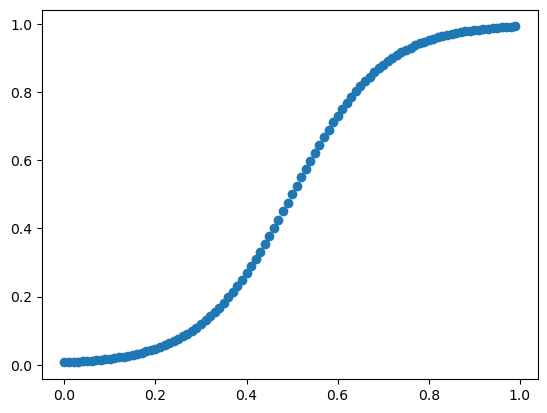

0.9626731126558706

In [67]:
plt.pyplot.scatter(np.arange(0,1,0.01), sigmoid(10*np.arange(0,1,0.01)-5))
plt.pyplot.show()
sigmoid(3.25)

Plot the impact factors per isoform per tissue

ENSG00000179943


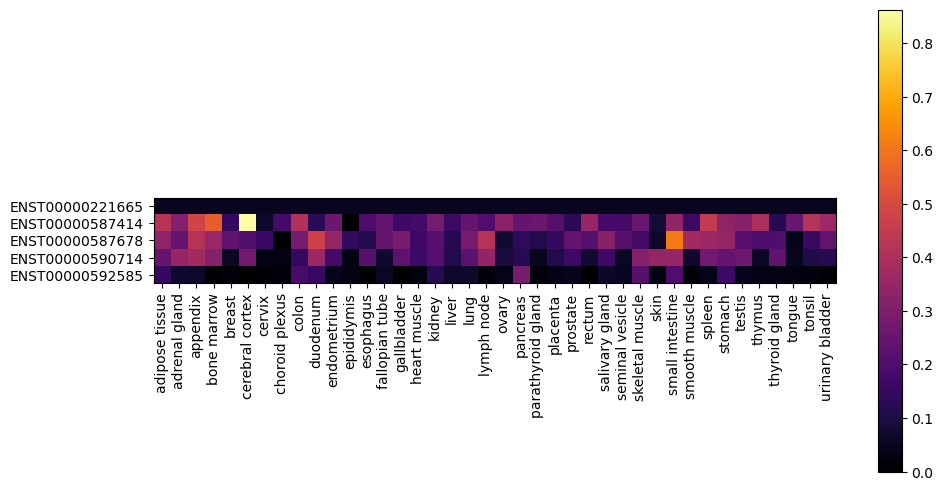

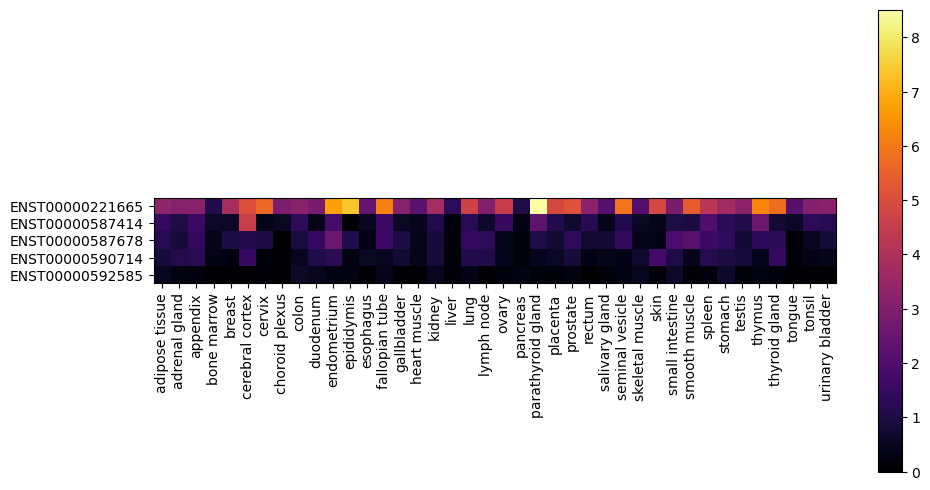

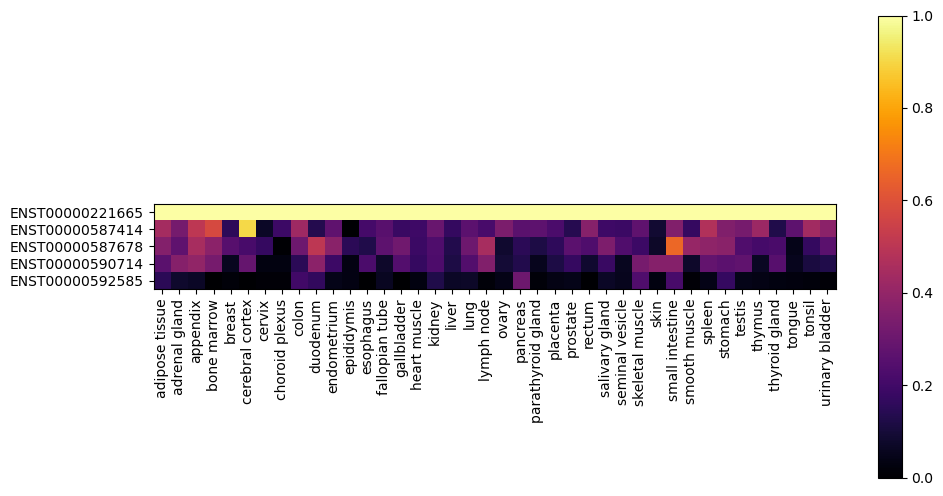

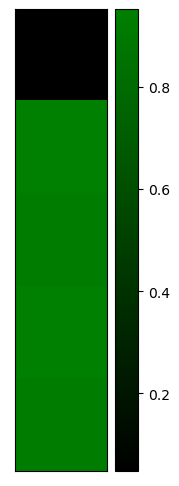

ENSG00000196628


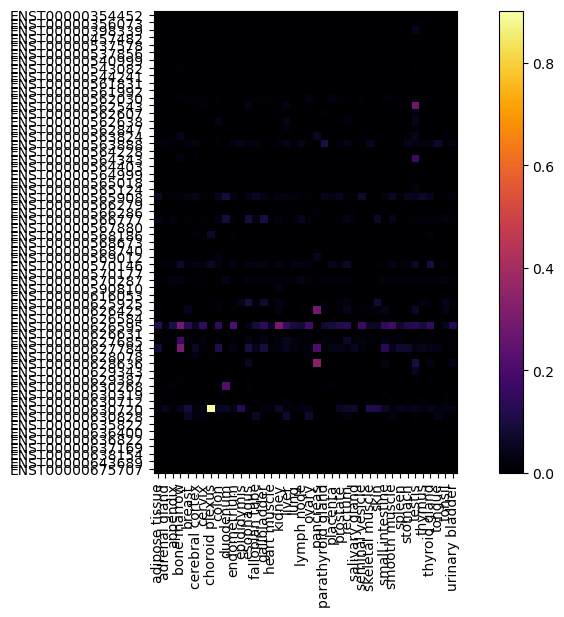

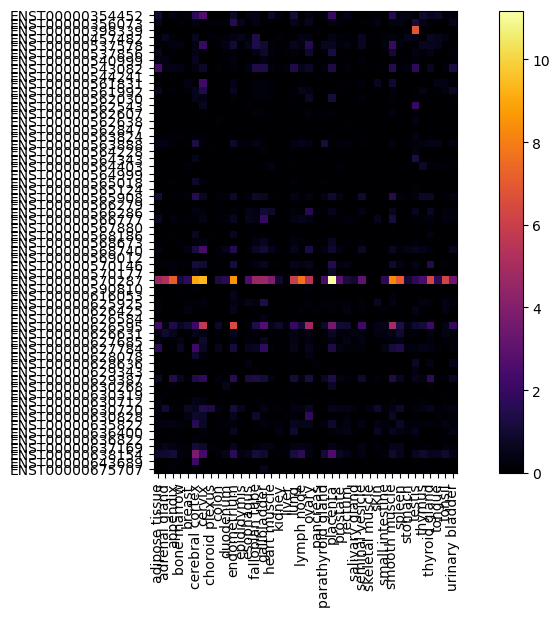

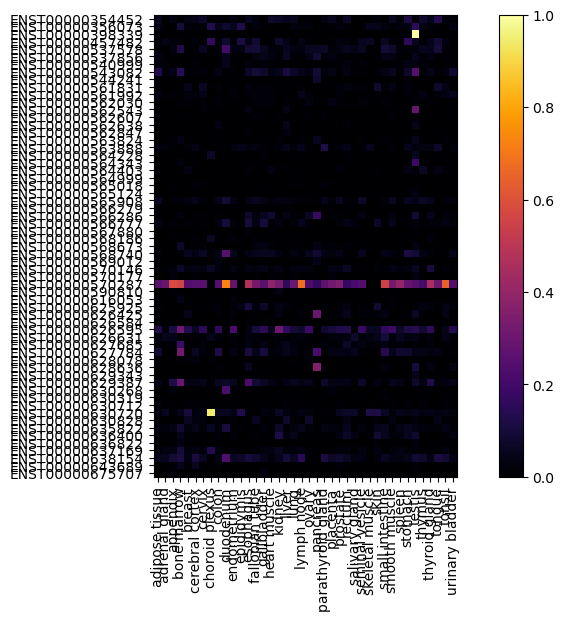

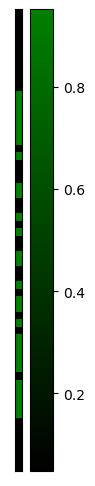

ENSG00000126456


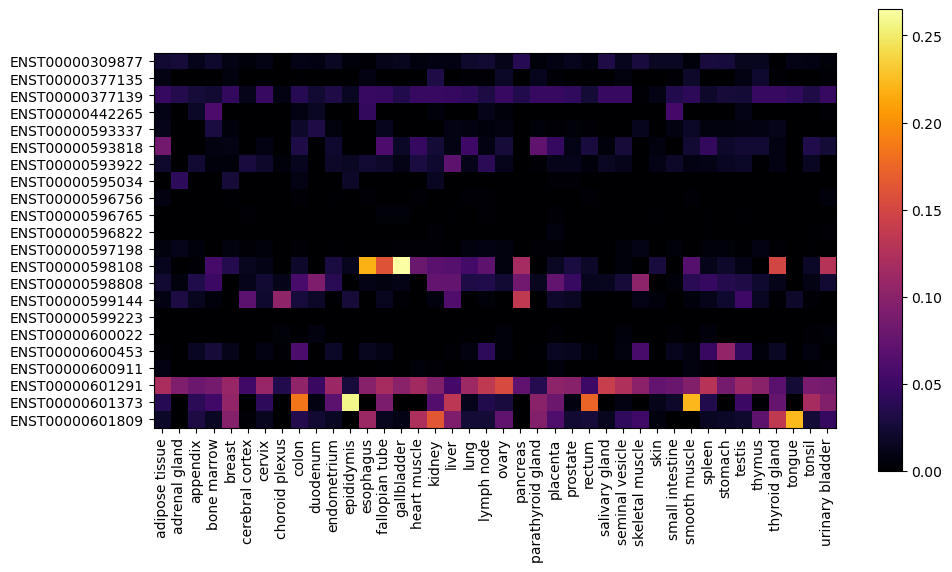

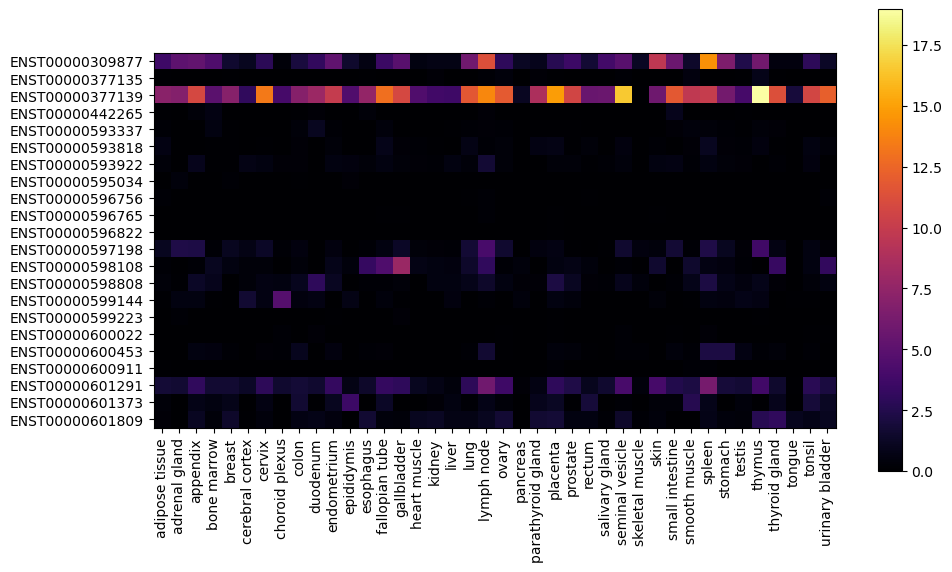

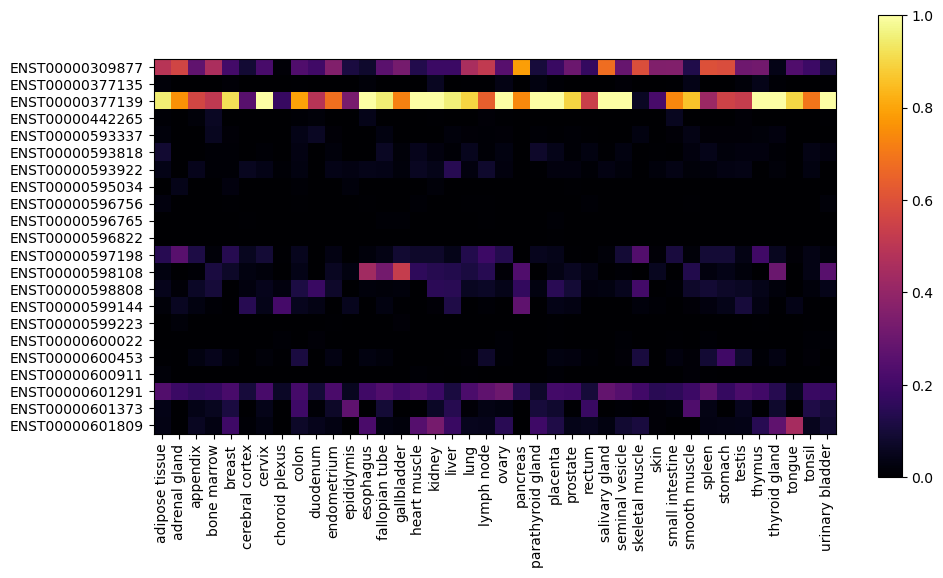

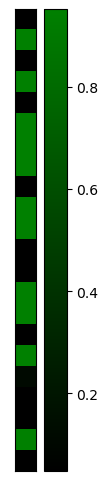

ENSG00000185507


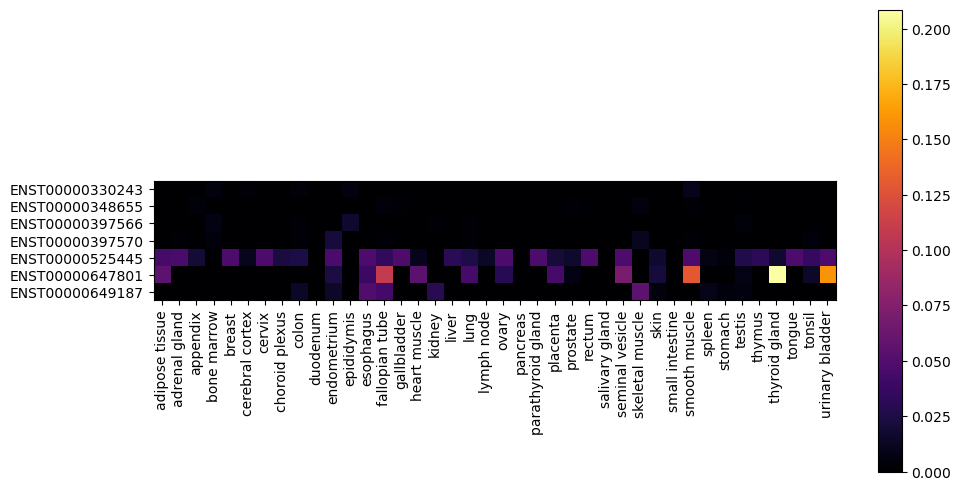

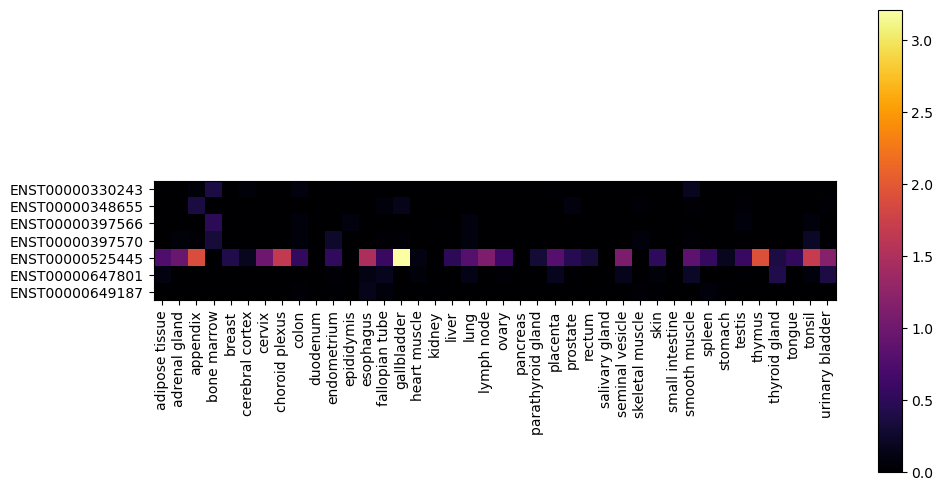

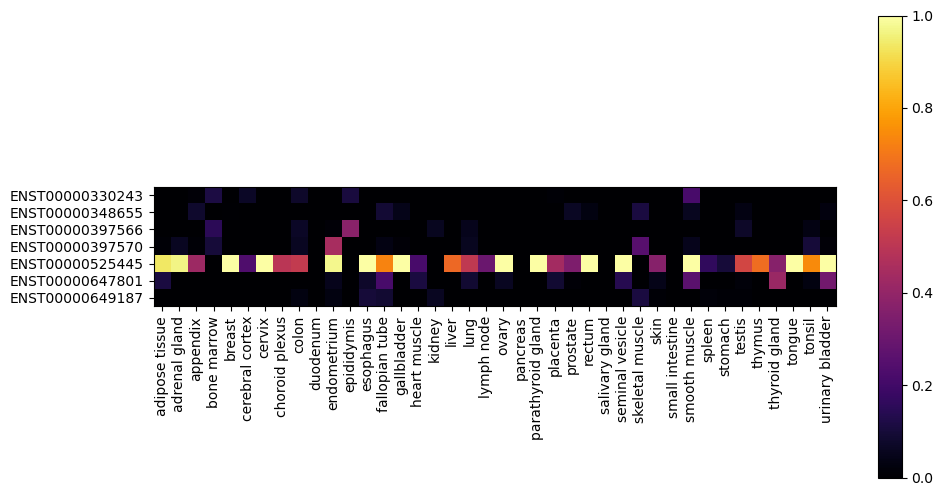

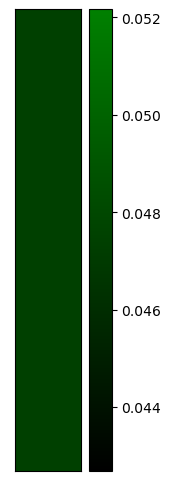

ENSG00000109320


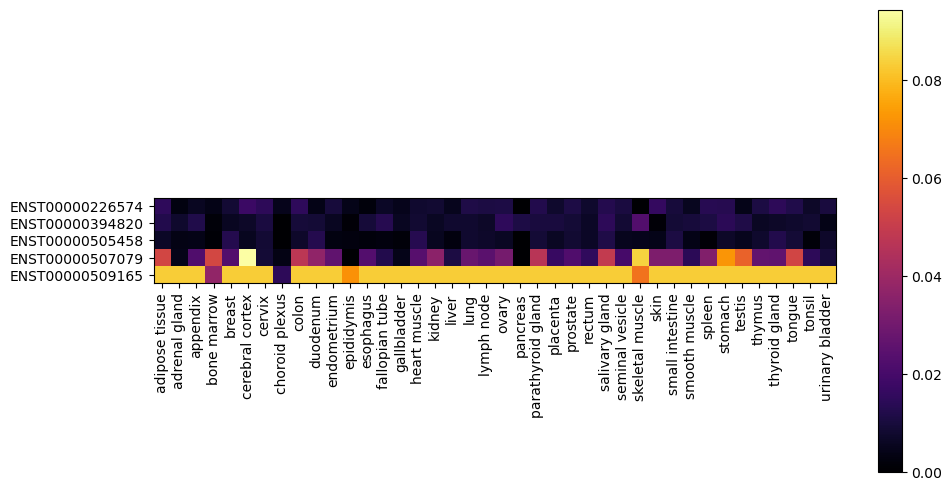

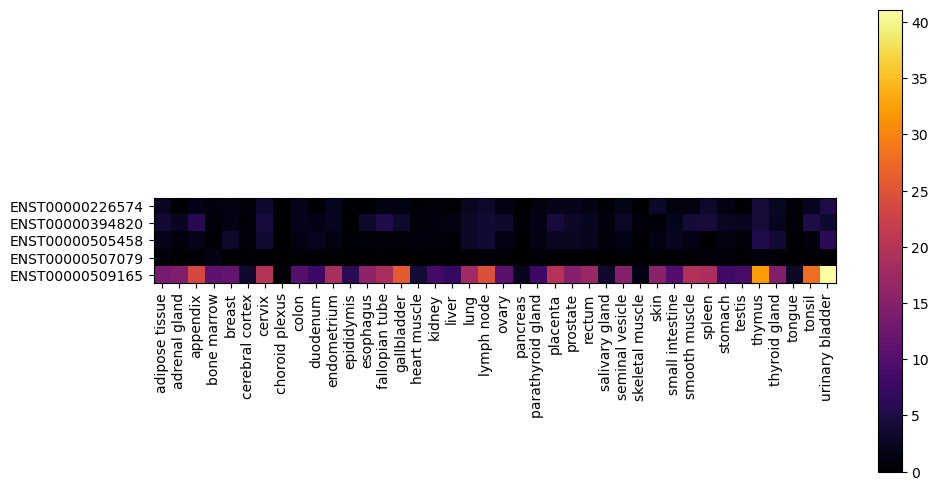

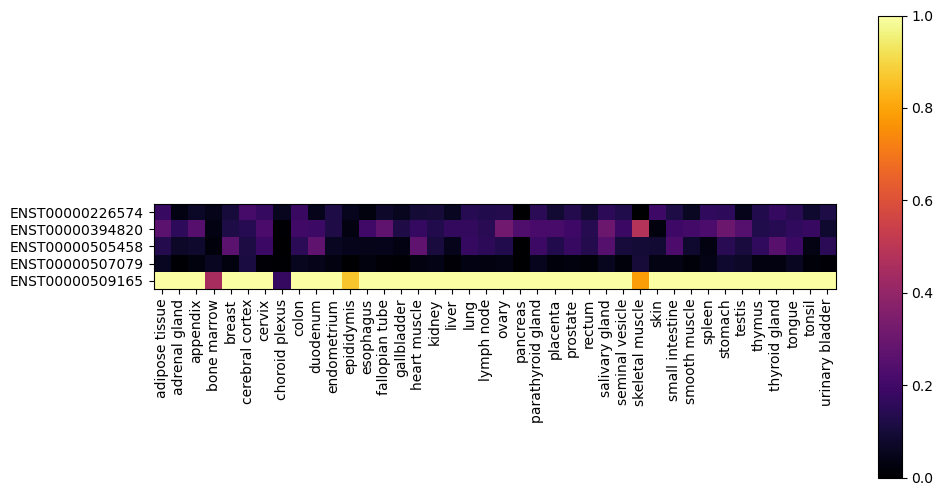

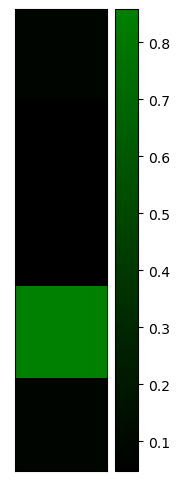

In [16]:
#print(impact_factor)
#for gene_id in impact_factors:
#FIZ1: ENSG00000179943
#TCF4: ENSG00000196628
for gene_id in ["ENSG00000179943", "ENSG00000196628","ENSG00000126456", "ENSG00000185507", "ENSG00000109320"]:
    print(gene_id)
    heatmap_values = list()
    exp_hm_values = list()
    rel_exp_hm_values = list()
    DBD_lost_hm_values = list()
    prot_ids = []
    for prot_id in impact_factors[gene_id]:
        #print(prot_id)
        these_factors = {tissue: rel_impact_factors[gene_id][prot_id][tissue][0] 
                         for tissue in rel_impact_factors[gene_id][prot_id]}
        these_exp = {tissue: impact_factors[gene_id][prot_id][tissue][1] 
                         for tissue in impact_factors[gene_id][prot_id]}
        these_rel_exp = {tissue: rel_impact_factors[gene_id][prot_id][tissue][1] 
                         for tissue in rel_impact_factors[gene_id][prot_id]}
        if len(these_factors)==0 or max(these_factors.values())==0:
            continue
        #print(these_factors.values())
        #print(these_exp.values())
        heatmap_values.append(list(these_factors.values()))
        exp_hm_values.append(list(these_exp.values()))
        rel_exp_hm_values.append(list(these_rel_exp.values()))
        DBD_lost_hm_values.append(DNA_binding_lost[gene_id][prot_id])
        width = 0.35
        #plt.pyplot.figure(figsize=(11,6))
        #plt.pyplot.bar(np.arange(len(these_factors))-width/2, 
        #               np.array(list(these_factors.values())), 
        #               width)
        #plt.pyplot.bar(np.arange(len(these_exp))+width/2, 
        #               np.array(list(these_exp.values())), 
        #               width)
        #plt.pyplot.xticks(range(len(these_factors)), list(these_factors.keys()), rotation=90)
        #plt.pyplot.show()
        prot_ids.append(prot_id)
    
    if len(heatmap_values)==0:
        continue
    heatmap_values = np.array(heatmap_values)
    row_sums = np.sum(heatmap_values, axis=1)
    #keep_rows = row_sums>0.05*sum(row_sums)
    #heatmap_values = heatmap_values[keep_rows,:]
    
    plt.pyplot.figure(figsize=(11,6))
    #TODO: adjust the colors of the heatmap
    plt.pyplot.colormaps()
    plt.pyplot.imshow(heatmap_values, cmap="inferno")
    plt.pyplot.colorbar()
    plt.pyplot.xticks(np.arange(len(these_factors)), list(these_factors.keys()), rotation=90)
    #plt.pyplot.yticks(np.arange(sum(keep_rows)), np.array(prot_ids)[keep_rows])
    plt.pyplot.yticks(np.arange(len(prot_ids)), np.array(prot_ids))
    plt.pyplot.show()
    
    #print(heatmap_values)
    average_tpm_hm_values = list()
    for prot_id in impact_factors[gene_id]:
        average_tpm_hm_values.append(list(average_tpms[gene_id][prot_id].values()))
    average_tpm_hm_values = np.array(average_tpm_hm_values)
    #print(average_tpm_hm_values)
    
    plt.pyplot.figure(figsize=(11,6))
    plt.pyplot.imshow(exp_hm_values, cmap="inferno")
    plt.pyplot.colorbar()
    plt.pyplot.xticks(np.arange(len(these_factors)), list(these_factors.keys()), rotation=90)
    plt.pyplot.yticks(np.arange(len(prot_ids)), np.array(prot_ids))
    plt.pyplot.show()
    
    plt.pyplot.figure(figsize=(11,6))
    plt.pyplot.imshow(rel_exp_hm_values, cmap="inferno")
    plt.pyplot.colorbar()
    plt.pyplot.xticks(np.arange(len(these_factors)), list(these_factors.keys()), rotation=90)
    plt.pyplot.yticks(np.arange(len(prot_ids)), np.array(prot_ids))
    plt.pyplot.show()
    
    DBD_lost_hm_values = np.expand_dims(DBD_lost_hm_values, axis=1)
    DBD_lost_cmap = plt.colors.LinearSegmentedColormap.from_list("DBD_lost_cmap",
                                                                 ["black","green"])
    plt.pyplot.figure(figsize=(2,6))
    plt.pyplot.imshow(DBD_lost_hm_values, cmap=DBD_lost_cmap)
    plt.pyplot.colorbar()
    plt.pyplot.xticks([])
    plt.pyplot.yticks([])
    #plt.pyplot.yticks(np.arange(len(prot_ids)), np.array(prot_ids))
    plt.pyplot.show()

Calculate the impact factor per tissue per gene

In [7]:
impact_factors_gene = {}
rel_impact_factors_gene = {}
for gene_id in impact_factors:
    print(gene_id)
    impact_factors_gene[gene_id] = {}
    rel_impact_factors_gene[gene_id] = {}
    for prot_id in impact_factors[gene_id]:
        for tissue in impact_factors[gene_id][prot_id]:
            if tissue not in impact_factors_gene[gene_id]:
                impact_factors_gene[gene_id][tissue] = [0,0,0]
                rel_impact_factors_gene[gene_id][tissue] = [0,0,0]
            if impact_factors_gene[gene_id][tissue][0] < impact_factors[gene_id][prot_id][tissue][0]:
                impact_factors_gene[gene_id][tissue][0] = impact_factors[gene_id][prot_id][tissue][0]
                impact_factors_gene[gene_id][tissue][2] = impact_factors[gene_id][prot_id][tissue][1]
            impact_factors_gene[gene_id][tissue][1] += impact_factors[gene_id][prot_id][tissue][1]
            if rel_impact_factors_gene[gene_id][tissue][0] < rel_impact_factors[gene_id][prot_id][tissue][0]:
                rel_impact_factors_gene[gene_id][tissue][0] = rel_impact_factors[gene_id][prot_id][tissue][0]
                rel_impact_factors_gene[gene_id][tissue][2] = rel_impact_factors[gene_id][prot_id][tissue][1]
            rel_impact_factors_gene[gene_id][tissue][1] += rel_impact_factors[gene_id][prot_id][tissue][1]
#print(impact_factors_gene)

ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG0000

ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG0000

In [ ]:
### for gene_id in impact_factors_gene:
for gene_id in ["ENSG00000126456"]:
    print(gene_id)
    these_factors = {tissue: rel_impact_factors_gene[gene_id][tissue][0] 
                     for tissue in rel_impact_factors_gene[gene_id]}
    these_factorexp = {tissue: rel_impact_factors_gene[gene_id][tissue][2] 
                 for tissue in rel_impact_factors_gene[gene_id]}
    these_exp = {tissue: rel_impact_factors_gene[gene_id][tissue][1] 
                 for tissue in rel_impact_factors_gene[gene_id]}
    width = .4
    plt.pyplot.figure(figsize=(11,6))
    plt.pyplot.bar(np.arange(len(these_factors))-width/2, 
                   np.array(list(these_factors.values())), 
                   width, color="magenta", label="ASIF")
    plt.pyplot.bar(np.arange(len(these_factorexp))+width/2, 
                   np.array(list(these_factorexp.values())), 
                   width, color="grey", label="Relative Expression")
    #plt.pyplot.bar(np.arange(len(these_exp))+width, 
    #               np.array(list(these_exp.values())), 
    #               width, color="blue", label="Expression")
    
    plt.pyplot.xticks(range(len(these_factors)), list(these_factors.keys()), rotation=90)
    plt.pyplot.legend()
    plt.pyplot.show()
    
    width = .9
    plt.pyplot.figure(figsize=(11,6))
    plt.pyplot.bar(np.arange(len(these_exp)), 
                   np.array(list(these_exp.values())), 
                   width=width, color="blue", label="Expression")
    plt.pyplot.bar(np.arange(len(these_factorexp)), 
                   np.array(list(these_factorexp.values())),
                   bottom=np.array(list(these_exp.values())), 
                   width=width, color="magenta", label="Relative Expression")
    plt.pyplot.bar(np.arange(len(these_factors)), 
                   np.array(list(these_factors.values())), 
                   bottom=np.array(list(these_exp.values()))+np.array(list(these_factorexp.values())), 
                   width=width, color="grey", label="ASIF")
    plt.pyplot.xticks(range(len(these_factors)), list(these_factors.keys()), rotation=90)
    plt.pyplot.legend()
    plt.pyplot.show()

In [49]:
for enst in average_tpms["ENSG00000126456"]:
    print(enst)
    print(average_tpms["ENSG00000126456"][enst])

ENST00000309877
{'adipose tissue': 3.673632, 'adrenal gland': 5.037216666666667, 'appendix': 5.327793333333333, 'bone marrow': 4.386055, 'breast': 1.5708225, 'cerebral cortex': 1.1026033333333334, 'cervix': 2.87669, 'choroid plexus': 0.301681, 'colon': 2.032288769230769, 'duodenum': 3.16568, 'endometrium': 5.232177999999999, 'epididymis': 1.48466, 'esophagus': 0.5983666666666666, 'fallopian tube': 3.5521138, 'gallbladder': 4.8641966666666665, 'heart muscle': 0.5910584999999999, 'kidney': 0.7029580000000001, 'liver': 0.7091253, 'lung': 5.980912222222223, 'lymph node': 11.302597, 'ovary': 3.0084114285714283, 'pancreas': 1.249992, 'parathyroid gland': 0.8895306666666668, 'placenta': 2.711637375, 'prostate': 3.579476666666667, 'rectum': 1.7470807499999998, 'salivary gland': 3.85476, 'seminal vesicle': 4.839484333333333, 'skeletal muscle': 1.208493, 'skin': 9.6934, 'small intestine': 5.74403225, 'smooth muscle': 1.4343763333333335, 'spleen': 14.413791600000001, 'stomach': 6.5380375, 'testis

In [9]:
with open("impact_factors_gene.pickle", "wb") as f:
    pickle.dump(impact_factors_gene, f)
with open("rel_impact_factors_gene.pickle", "wb") as f:
    pickle.dump(rel_impact_factors_gene, f)

In [6]:
with open("impact_factors_gene.pickle", "rb") as f:
    impact_factors_gene = pickle.load(f)
with open("rel_impact_factors_gene.pickle", "rb") as f:
    rel_impact_factors_gene = pickle.load(f)

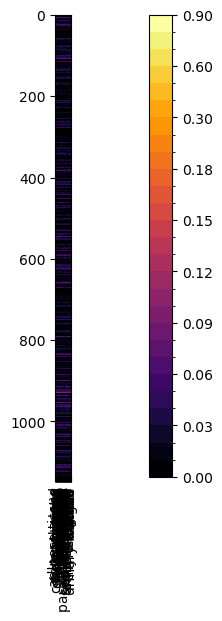

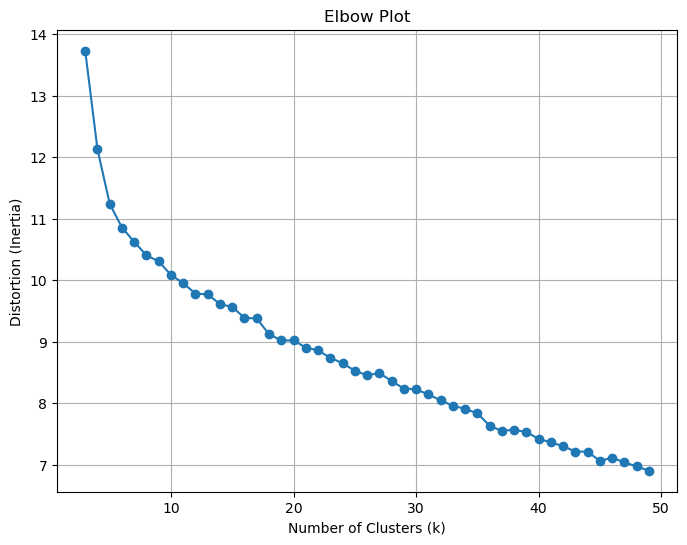

[[ 2  2  6  7 11 11  1  4  2  2  1 11 11  1  2 11 11  2  2  6  1  3 11 11
  11  2  6  1  5  9  2  2  6  2 10  0  1  8  0 11]]


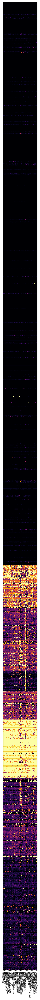

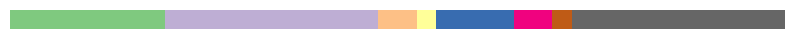

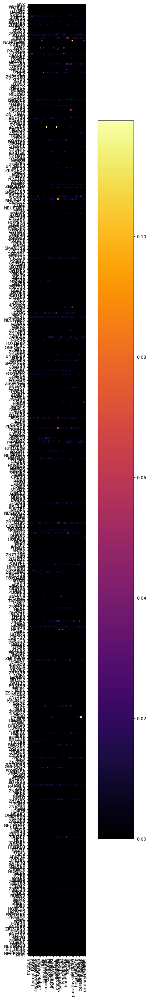

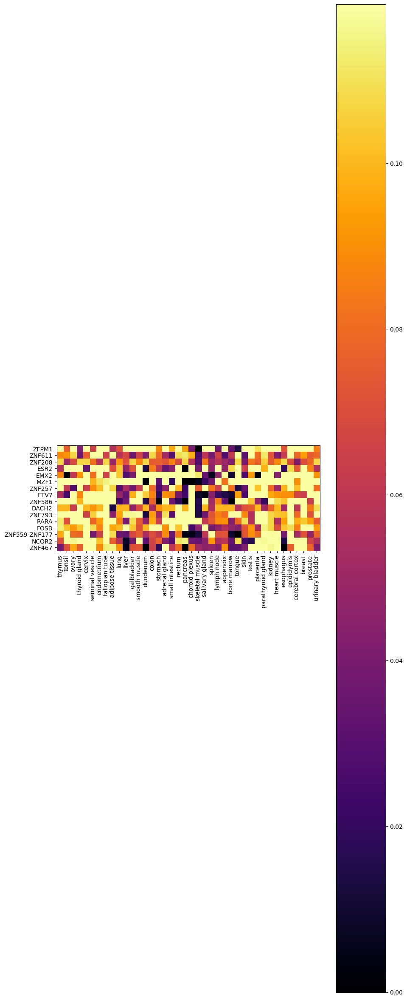

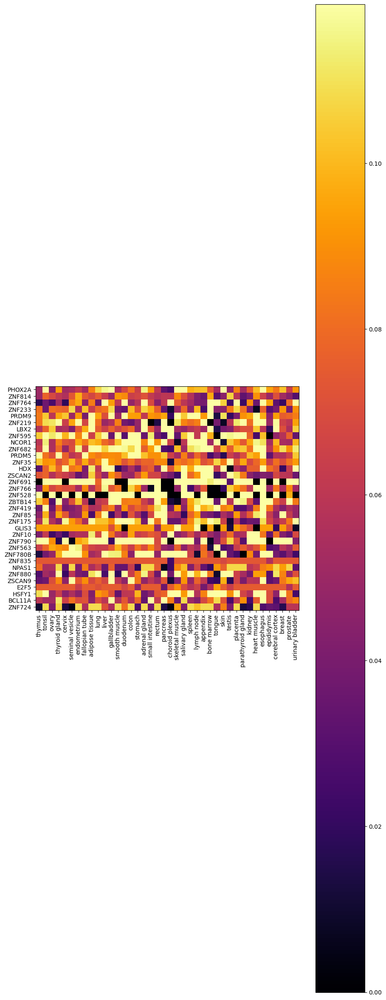

...

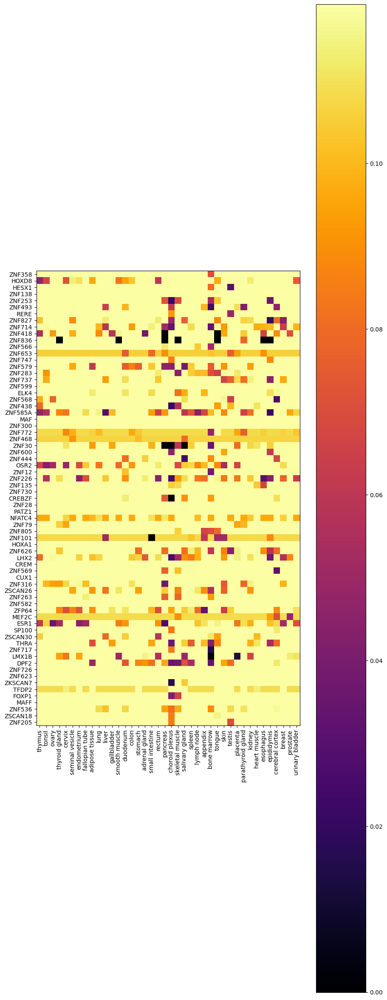

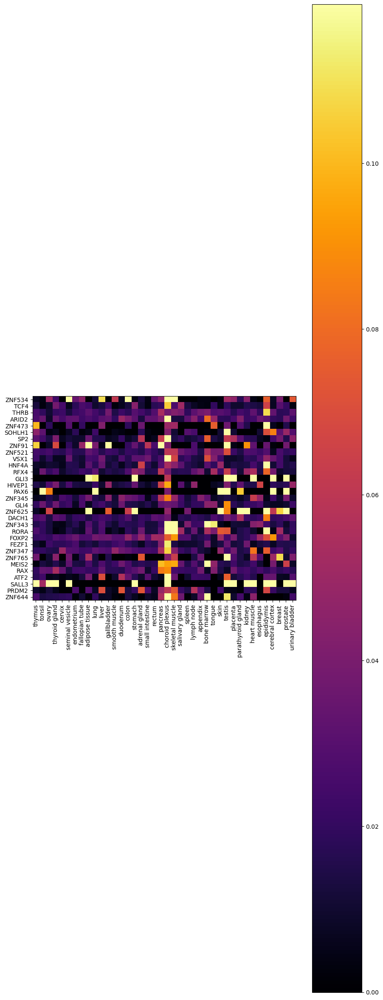

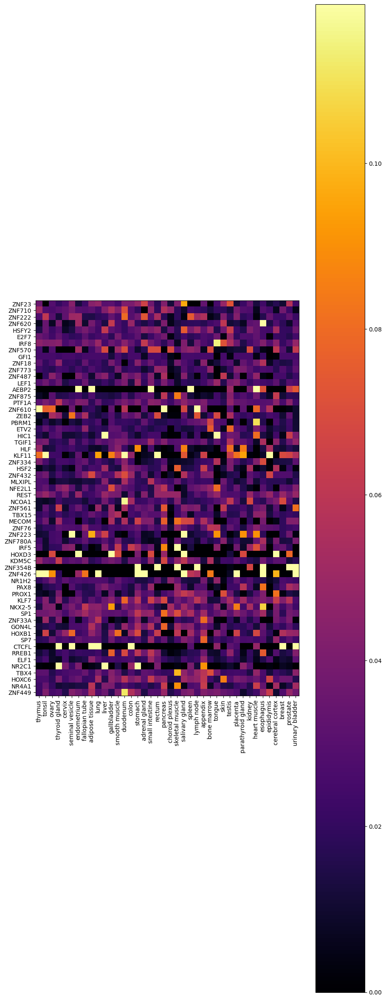

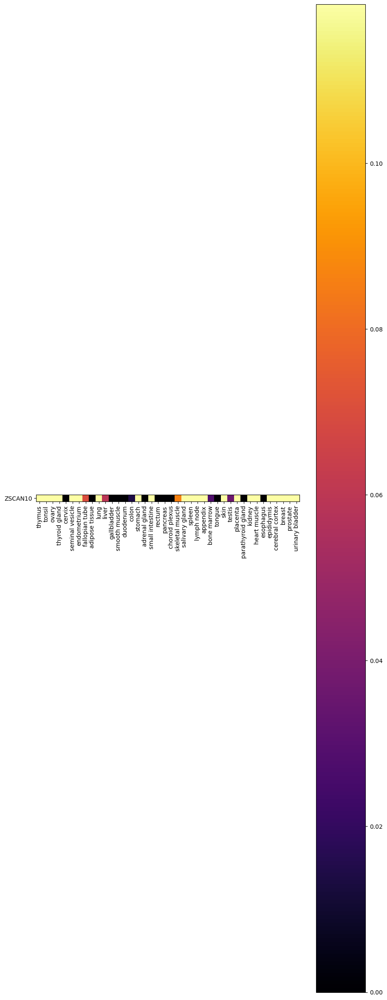

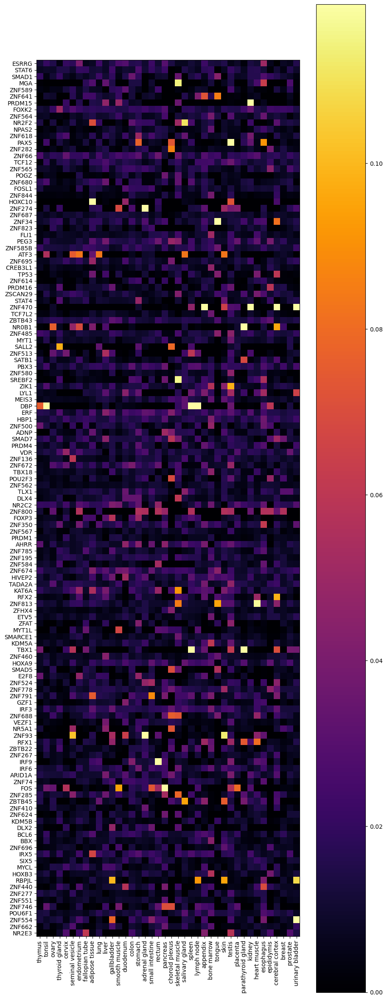

In [5]:
mg = mygene.MyGeneInfo()

gene_IF_table = np.empty((0,40))
rel_gene_IF_table = np.empty((0,40))
row_names = []
TF_interpro_dict = {}
for gene_id in impact_factors_gene:
    #print(gene_id)
    these_factors = np.array([impact_factors_gene[gene_id][tissue][0] 
                              for tissue in impact_factors_gene[gene_id]])
    rel_these_factors = np.array([rel_impact_factors_gene[gene_id][tissue][0] 
                                  for tissue in rel_impact_factors_gene[gene_id]])
    if(len(these_factors)==0): continue
    for prot_id in DNAbinding_seqs[gene_id]:
        if not prot_id.startswith("ENS"): continue
        for domain in DNAbinding_seqs[gene_id][prot_id]['domains']:
            #print(domain['interpro'])
            if domain['interpro']=='':
                continue
            elif domain['interpro'] not in TF_interpro_dict:
                TF_interpro_dict[domain['interpro']] = [gene_id]
            else:
                if gene_id not in TF_interpro_dict[domain['interpro']]:
                    TF_interpro_dict[domain['interpro']] += [gene_id]
    gene_IF_table = np.vstack((gene_IF_table, these_factors))
    rel_gene_IF_table = np.vstack((rel_gene_IF_table, rel_these_factors))
    row_names.append(gene_id)
    #break
for gene_id in impact_factors_gene:
    tissues = list({tissue: impact_factors_gene[gene_id][tissue][0] 
                    for tissue in impact_factors_gene[gene_id]}.keys())
    break
gene_IF_table = pd.DataFrame(gene_IF_table, index=row_names, columns=tissues)
rel_gene_IF_table = pd.DataFrame(rel_gene_IF_table, index=row_names, columns=tissues)
#print(gene_IF_table)
#print(tissues)
'''
for interpro_id in TF_interpro_dict:
    print(interpro_id)
    print(TF_interpro_dict[interpro_id])
    plt.pyplot.figure(figsize=(12,6))
    plt.pyplot.imshow(gene_IF_table.loc[TF_interpro_dict[interpro_id]], cmap="inferno")
    plt.pyplot.colorbar()
    plt.pyplot.xticks(range(len(tissues)), tissues, rotation=90)
    plt.pyplot.yticks(range(len(TF_interpro_dict[interpro_id])), TF_interpro_dict[interpro_id])
    plt.pyplot.show()

plt.pyplot.figure(figsize=(12,6))
custom_breakpoints = list(range(0,50,1)) + list(range(50,200,5))
cmap = plt.pyplot.get_cmap("inferno")
norm = plt.colors.BoundaryNorm(custom_breakpoints, cmap.N)
plt.pyplot.imshow(gene_IF_table, cmap=cmap, norm=norm)
plt.pyplot.colorbar()
plt.pyplot.xticks(range(len(tissues)), tissues, rotation=90)
plt.pyplot.show()

gene_IF_zscores = gene_IF_table.apply(zscore, axis=1)
plt.pyplot.figure(figsize=(12,6))
plt.pyplot.imshow(gene_IF_zscores, cmap="inferno")
plt.pyplot.colorbar()
plt.pyplot.xticks(range(len(tissues)), tissues, rotation=90)
plt.pyplot.show()

k_values = range(3,50)
distortions = []
for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(gene_IF_zscores)
    distortions.append(kmeans.inertia_)
plt.pyplot.figure(figsize=(8, 6))
plt.pyplot.plot(k_values, distortions, marker='o', linestyle='-')
plt.pyplot.title('Elbow Plot')
plt.pyplot.xlabel('Number of Clusters (k)')
plt.pyplot.ylabel('Distortion (Inertia)')
plt.pyplot.grid(True)
plt.pyplot.show()

n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters)
kmeans.fit(gene_IF_zscores)
#print(kmeans.labels_[:5])
cluster_labels_matrix = np.expand_dims(kmeans.labels_, axis=0)
cmap = plt.pyplot.cm.get_cmap('tab10', n_clusters)
kmeans_order = np.argsort(kmeans.labels_)
plt.pyplot.figure(figsize=(6,20))
plt.pyplot.imshow(gene_IF_zscores.iloc[kmeans_order,:], cmap="inferno")
plt.pyplot.colorbar()
plt.pyplot.xticks(range(len(tissues)), tissues, rotation=90)
plt.pyplot.show()

for i in range(n_clusters):
    rnames = gene_IF_zscores.index[kmeans.labels_==i]
    rnames1 = []
    #print(mg.getgene("ENSG00000156273")[0]['symbol'])
    for rname in rnames:
        try:
            symbol = mg.getgene(rname)['symbol'] 
        except:
            symbol = mg.getgene(rname)[0]['symbol'] 
        rnames1.append(symbol)
    plt.pyplot.figure(figsize=(10,40))
    plt.pyplot.imshow(gene_IF_zscores.iloc[[lab==i for lab in kmeans.labels_],:], cmap="inferno")
    #plt.pyplot.colorbar()
    plt.pyplot.xticks(range(len(tissues)), tissues, rotation=90)
    plt.pyplot.yticks(range(len(rnames1)), rnames1)
    plt.pyplot.show()
'''
plt.pyplot.figure(figsize=(20,6))
rel_custom_breakpoints = list(np.arange(0,0.20,0.01)) + list(np.arange(0.20,1,0.1))
rel_cmap = plt.pyplot.get_cmap("inferno")
rel_norm = plt.colors.BoundaryNorm(rel_custom_breakpoints, rel_cmap.N)
plt.pyplot.imshow(rel_gene_IF_table, cmap=rel_cmap, norm=rel_norm)
plt.pyplot.colorbar()
plt.pyplot.xticks(range(len(tissues)), tissues, rotation=90)
plt.pyplot.show()

k_values = range(3,50)
distortions = []
for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(rel_gene_IF_table)
    distortions.append(kmeans.inertia_)
plt.pyplot.figure(figsize=(8, 6))
plt.pyplot.plot(k_values, distortions, marker='o', linestyle='-')
plt.pyplot.title('Elbow Plot')
plt.pyplot.xlabel('Number of Clusters (k)')
plt.pyplot.ylabel('Distortion (Inertia)')
plt.pyplot.grid(True)
plt.pyplot.show()

kmeans_tissues = KMeans(n_clusters=12)
kmeans_tissues.fit(rel_gene_IF_table.T)
tissue_cluster_labels_matrix = np.expand_dims(kmeans_tissues.labels_, axis=0)
tissue_order = np.argsort(kmeans_tissues.labels_)
print(tissue_cluster_labels_matrix)
n_clusters = 12
kmeans = KMeans(n_clusters=n_clusters)
kmeans.fit(rel_gene_IF_table)
#print(kmeans.labels_[:5])
cluster_labels_matrix = np.expand_dims(kmeans.labels_, axis=0)
cmap = plt.pyplot.cm.get_cmap('tab20', n_clusters)
kmeans_order = np.argsort(kmeans.labels_)
#fig, axes = plt.pyplot.subplots(2,2,figsize=(20,60), 
#                                gridspec_kw={'width_ratios': [1, 20], 'height_ratios': [1, 50]})
#
#axes[0,0].axis('off')



In [41]:
with open("rel_gene_IF_table.pickle", "wb") as f:
    pickle.dump(rel_gene_IF_table, f)
with open("tissue_cluster_labels_matrix.pickle", "wb") as f:
    pickle.dump(tissue_cluster_labels_matrix, f)
with open("cluster_labels_matrix.pickle", "wb") as f:
    pickle.dump(cluster_labels_matrix, f)
with open("kmeans_order.pickle", "wb") as f:
    pickle.dump(kmeans_order, f)
with open("tissue_order.pickle", "wb") as f:
    pickle.dump(tissue_order, f)

In [9]:
with open("rel_gene_IF_table.pickle", "rb") as f:
    rel_gene_IF_table = pickle.load(f)
with open("tissue_cluster_labels_matrix.pickle", "rb") as f:
    tissue_cluster_labels_matrix = pickle.load(f)
with open("cluster_labels_matrix.pickle", "rb") as f:
    cluster_labels_matrix = pickle.load(f)
with open("kmeans_order.pickle", "rb") as f:
    kmeans_order = pickle.load(f)
with open("tissue_order.pickle", "rb") as f:
    tissue_order = pickle.load(f)

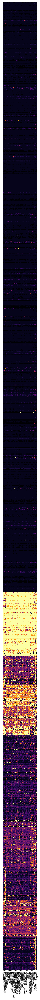

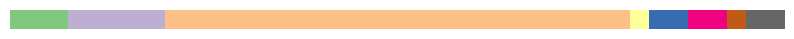

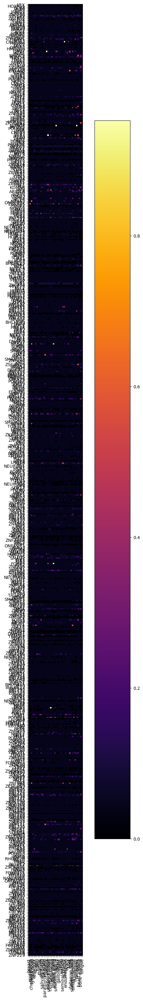

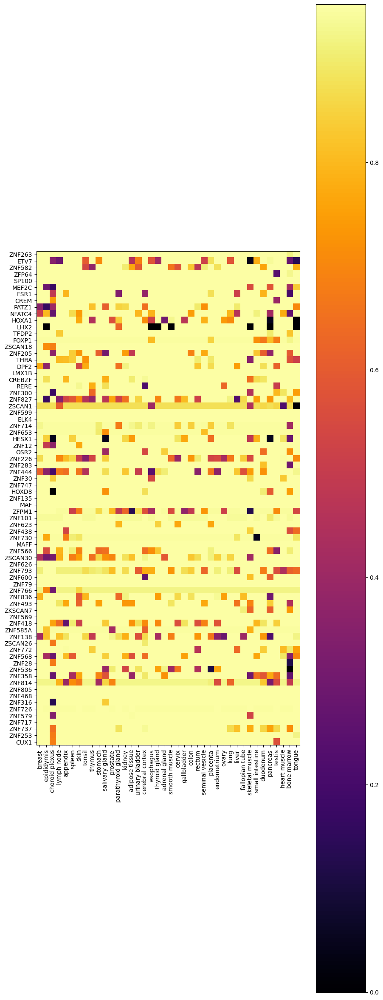

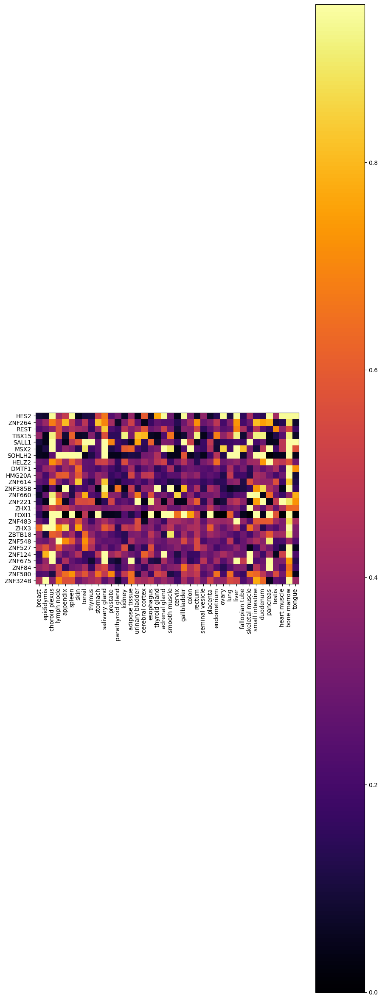

...

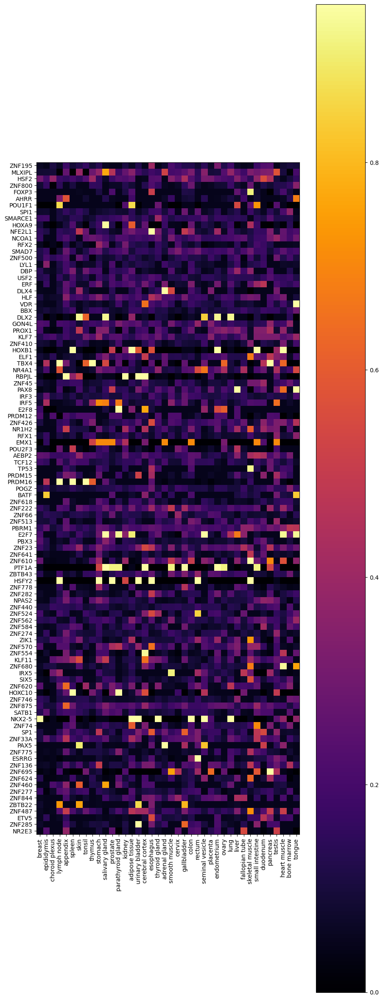

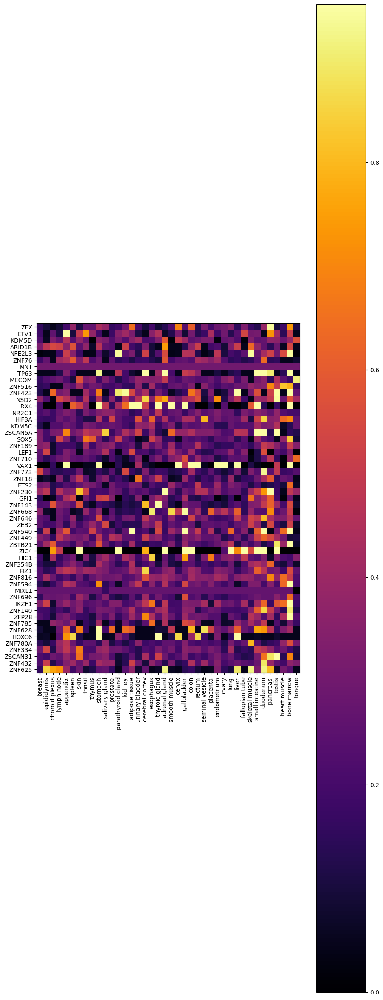

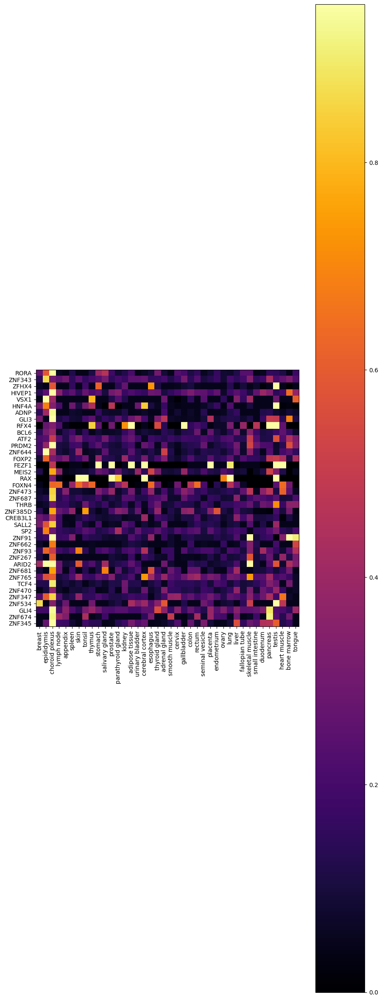

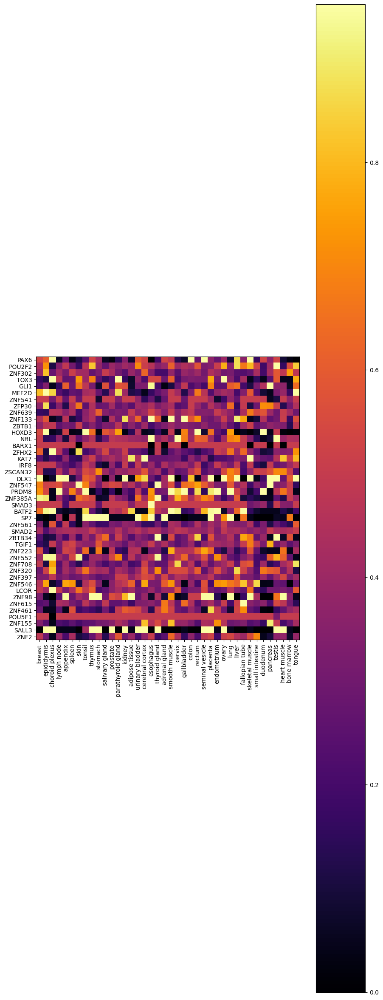

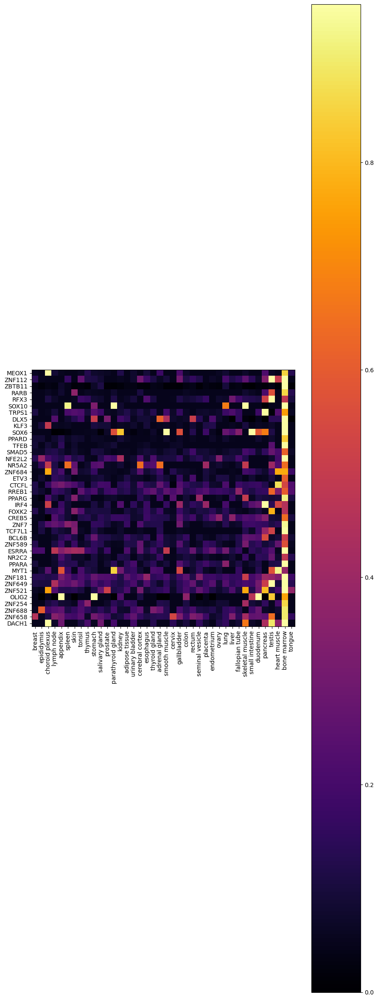

In [12]:
##need to fix still
mg = mygene.MyGeneInfo()

for gene_id in impact_factors_gene:
    tissues = list({tissue: impact_factors_gene[gene_id][tissue][0] 
                    for tissue in impact_factors_gene[gene_id]}.keys())
    break
n_clusters = 12

plt.pyplot.figure(figsize=(20,60))
#axes[1,1].set_position([0.0,0.05,0.9,0.85])
plt.pyplot.imshow(rel_gene_IF_table.iloc[kmeans_order,tissue_order], cmap="inferno")#rel_cmap, norm=rel_norm)
plt.pyplot.xticks(range(len(tissues)), np.array(tissues)[tissue_order], rotation=90)
plt.pyplot.yticks([])
plt.pyplot.show()

plt.pyplot.figure(figsize=(10,15))
#axes[0,1].set_position([0.1,0.95,0.10,0.05])
plt.pyplot.imshow(tissue_cluster_labels_matrix[:,tissue_order], cmap="Accent")
plt.pyplot.xticks([])
plt.pyplot.yticks([])
plt.pyplot.axis('off')
#plt.pyplot.show()

plt.pyplot.figure(figsize=(20,60))
#axes[1,0].set_position([0.05, 0.05,0.1,0.90])
plt.pyplot.imshow(cluster_labels_matrix.T[kmeans_order,:], cmap="tab20")
plt.pyplot.xticks([])
plt.pyplot.yticks([])
plt.pyplot.axis('off')

#fig.subplots_adjust(wspace=0.01, hspace=0.01)
#fig.colorbar(plt.pyplot.cm.ScalarMappable(cmap="inferno"), ax=axes)
plt.pyplot.show()

for i in range(n_clusters):
    rnames = rel_gene_IF_table.index[[lab==i for lab in cluster_labels_matrix[0]]]
    rnames1 = []
    #print(mg.getgene("ENSG00000156273")[0]['symbol'])
    for rname in rnames:
        try:
            symbol = mg.getgene(rname)['symbol'] 
        except:
            symbol = mg.getgene(rname)[0]['symbol'] 
        rnames1.append(symbol)
    plt.pyplot.figure(figsize=(10,40))
    plt.pyplot.imshow(rel_gene_IF_table.iloc[[lab==i 
                                              for lab in cluster_labels_matrix[0]],
                                             tissue_order]
                      , cmap="inferno")#rel_cmap, norm=rel_norm)
    plt.pyplot.colorbar()
    plt.pyplot.xticks(range(len(tissues)), np.array(tissues)[tissue_order], rotation=90)
    plt.pyplot.yticks(range(len(rnames1)), rnames1)
    plt.pyplot.show()


In [10]:
rel_gene_IF_table_melted = rel_gene_IF_table.melt(ignore_index=False, 
                                                  var_name="Tissue", 
                                                  value_name="ASIF")
rel_gene_IF_table_melted["Expression"] = [sum([average_tpms[rel_gene_IF_table_melted.index[i]][transcript_id][rel_gene_IF_table_melted.iloc[i, 0]] 
                                               for transcript_id in average_tpms[rel_gene_IF_table_melted.index[i]]]) for i in range(rel_gene_IF_table_melted.shape[0])]
#print(proteome_atlas)
#print(rel_gene_IF_table_melted.index.to_list()[:5])
#print(average_tpms[rel_gene_IF_table_melted.index[0]])
print(rel_gene_IF_table_melted)

                          Tissue      ASIF  Expression
ENSG00000004848   adipose tissue  0.047426    0.016074
ENSG00000005073   adipose tissue  0.047426    0.733566
ENSG00000005102   adipose tissue  0.047879   24.172264
ENSG00000005513   adipose tissue  0.047426    1.058416
ENSG00000005801   adipose tissue  0.060205   10.933514
...                          ...       ...         ...
ENSG00000276234  urinary bladder  0.157263    8.482612
ENSG00000276644  urinary bladder  0.188898    2.608617
ENSG00000278129  urinary bladder  0.047426    1.133628
ENSG00000278318  urinary bladder  0.037478    1.679224
ENSG00000278570  urinary bladder  0.123330    0.107324

[45440 rows x 3 columns]


In [13]:
rel_gene_IF_table.iloc[kmeans_order, tissue_order].to_csv("ASIF_byGene.csv", 
                                                          index_label="Gene")
rel_gene_IF_table_melted.to_csv("ASIF_melted.csv", index_label="Gene")

np.savetxt("tissue_cluster_ordered.csv", 
           np.vstack([np.array([tissues])[:, tissue_order], 
                      tissue_cluster_labels_matrix[:, tissue_order]]), 
           delimiter=",",
           fmt="%s")
np.savetxt("gene_cluster_ordered.csv", 
           np.vstack([np.array([rel_gene_IF_table.index[kmeans_order]]),
                      cluster_labels_matrix[:, kmeans_order]]), 
           delimiter=",",
           fmt="%s")

In [25]:
rel_transcript_IF_table_melted = pd.DataFrame(columns=["Gene", "Tissue", "Transcript", "ASIF", "Expression", "Percent Expression"])
for i in range(rel_gene_IF_table_melted.shape[0]):
    gene_id = rel_gene_IF_table_melted.index[i]
    tissue = rel_gene_IF_table_melted.iloc[i, 0]
    print(gene_id)
    for transcript_id in rel_impact_factors[gene_id]:
        #print(impact_factors[gene_id][transcript_id][tissue][1])
        #print(rel_gene_IF_table_melted.iloc[i, 2])
        rel_transcript_IF_table_melted.loc[rel_transcript_IF_table_melted.shape[0],] = [gene_id,
                                                                                   tissue,
                                                                                   transcript_id,
                                                                                   rel_impact_factors[gene_id][transcript_id][tissue][0],
                                                                                   impact_factors[gene_id][transcript_id][tissue][1],
                                                                                   impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
                                                                                  ]
print(rel_transcript_IF_table_melted)

ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197124
ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134
ENSG00000197162


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928
ENSG00000213967
ENSG00000213973


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928
ENSG00000213967
ENSG00000213973


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175329
ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387
ENSG00000175592


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119866
ENSG00000119919
ENSG00000119950


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125618
ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125533
ENSG00000125618
ENSG00000125740


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387
ENSG00000175592


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174306
ENSG00000174332


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107249
ENSG00000107807
ENSG00000107859


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631
ENSG00000164651


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107249
ENSG00000107807
ENSG00000107859


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175329
ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000175329
ENSG00000175387
ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135903
ENSG00000136327
ENSG00000136352


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000135903
ENSG00000136327
ENSG00000136352


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173673
ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933
ENSG00000197937
ENSG00000197951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529
ENSG00000275004


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757
ENSG00000173875


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996
ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331
ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000164631
ENSG00000164651
ENSG00000164683


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408
ENSG00000131668


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891
ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194
ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310
ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169548
ENSG00000169554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887
ENSG00000177045


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349
ENSG00000274529


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG0000

ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419
ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672
ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750
ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618
ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702
ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568
ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983
ENSG00000182986
ENSG00000183072


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812
ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921
ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852
ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106689
ENSG00000106852


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906
ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816
ENSG00000125820


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451
ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814
ENSG00000153879


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163508
ENSG00000163623
ENSG00000163666
ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164600
ENSG00000164631
ENSG00000164651
ENSG00000164683


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169297
ENSG00000169548
ENSG00000169554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371
ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033
ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092
ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611
ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920
ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508
ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG00000103460
ENSG00000103495
ENSG00000104447
ENSG00000104903
ENSG00000105136
ENSG00000105261
ENSG00000105392
ENSG00000105419


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105497
ENSG00000105516
ENSG00000105610
ENSG00000105672


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000105698
ENSG00000105708
ENSG00000105717
ENSG00000105722
ENSG00000105732
ENSG00000105750


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000105856
ENSG00000105866
ENSG00000105880
ENSG00000105967
ENSG00000105991
ENSG00000105996


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106004
ENSG00000106006
ENSG00000106031
ENSG00000106261
ENSG00000106331


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000106689
ENSG00000106852


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312
ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087
ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120068
ENSG00000120075
ENSG00000120093


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407
ENSG00000123411


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000130182
ENSG00000130544
ENSG00000130584


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000130751
ENSG00000130803
ENSG00000130818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000135374
ENSG00000135547
ENSG00000135625


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000135638
ENSG00000135903


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378
ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000139651
ENSG00000139800
ENSG00000140009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190
ENSG00000143257


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000143355
ENSG00000143365


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920
ENSG00000165066
ENSG00000165156
ENSG00000165259


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000168348
ENSG00000168505
ENSG00000168610


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169297
ENSG00000169548
ENSG00000169554


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926
ENSG00000169946


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169951
ENSG00000169953
ENSG00000169955


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172379
ENSG00000172468
ENSG00000172789
ENSG00000172818


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673
ENSG00000173757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842
ENSG00000176887


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606
ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180053
ENSG00000180257
ENSG00000180318
ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492
ENSG00000184635


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188868
ENSG00000188909
ENSG00000189042
ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196946
ENSG00000196967
ENSG00000197008


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921
ENSG00000197933


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927
ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000217236
ENSG00000218891
ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544
ENSG00000229676


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835
ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000106410
ENSG00000106511
ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249
ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG00000119919
ENSG00000119950
ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125285
ENSG00000125347
ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711
ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170
ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532
ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009
ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612
ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164651
ENSG00000164683
ENSG00000164736


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016
ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653
ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000174332
ENSG00000174963


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928
ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184635
ENSG00000184659
ENSG00000184677


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184895
ENSG00000185002
ENSG00000185022
ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG00000197921


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
ENSG00000004848
ENSG00000005073
ENSG00000005102
ENSG00000005513
ENSG00000005801
ENSG00000005889
ENSG00000006194
ENSG00000006377
ENSG00000006468
ENSG00000007372
ENSG00000007968
ENSG00000008083
ENSG00000009709
ENSG00000009950
ENSG00000010030
ENSG00000010539
ENSG00000010818
ENSG00000011451
ENSG00000011590
ENSG00000012504
ENSG00000012817
ENSG00000016082
ENSG00000018869
ENSG00000019549
ENSG00000020256
ENSG00000020633
ENSG00000025156
ENSG00000028277
ENSG00000032219
ENSG00000037965
ENSG00000039600
ENSG00000043039
ENSG00000043355
ENSG00000048405
ENSG00000049618
ENSG00000049768
ENSG00000050344
ENSG00000052850
ENSG00000053254
ENSG00000054267
ENSG00000054598
ENSG00000056277
ENSG00000057657
ENSG00000057935
ENSG00000060566
ENSG00000061455
ENSG00000062370
ENSG00000063438
ENSG00000063515
ENSG00000064195
ENSG00000064218
ENSG00000064835


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000064961
ENSG00000065029
ENSG00000065970
ENSG00000066336
ENSG00000066422
ENSG00000066827
ENSG00000067066
ENSG00000069011
ENSG00000069667
ENSG00000069812
ENSG00000070444
ENSG00000070476
ENSG00000072736
ENSG00000073282
ENSG00000073584
ENSG00000073614
ENSG00000073861
ENSG00000075426
ENSG00000075891


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000077092
ENSG00000077150
ENSG00000078399
ENSG00000078900
ENSG00000080298
ENSG00000081189
ENSG00000081386
ENSG00000081665
ENSG00000082175
ENSG00000082641
ENSG00000083168
ENSG00000083812
ENSG00000083828
ENSG00000083838
ENSG00000083844
ENSG00000084093
ENSG00000084676
ENSG00000085274
ENSG00000085276
ENSG00000087903
ENSG00000088876
ENSG00000089116
ENSG00000089225
ENSG00000089335
ENSG00000089902
ENSG00000090447
ENSG00000091010
ENSG00000091656
ENSG00000091831
ENSG00000092067
ENSG00000092607
ENSG00000095574
ENSG00000095794
ENSG00000095951
ENSG00000096401
ENSG00000099326
ENSG00000100105
ENSG00000100146
ENSG00000100219
ENSG00000100426
ENSG00000100625
ENSG00000100644
ENSG00000100811
ENSG00000100968
ENSG00000100987
ENSG00000101057
ENSG00000101076
ENSG00000101096
ENSG00000101115
ENSG00000101126
ENSG00000101412
ENSG00000101493
ENSG00000101544
ENSG00000101665
ENSG00000102034
ENSG00000102554
ENSG00000102908
ENSG00000102935
ENSG00000102974
ENSG00000103199
ENSG00000103241
ENSG00000103449
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value en

ENSG00000106536
ENSG00000106546
ENSG00000106571
ENSG00000106689
ENSG00000106852
ENSG00000107175
ENSG00000107187
ENSG00000107249


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000107807
ENSG00000107859
ENSG00000108064
ENSG00000108312


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000108511
ENSG00000108788
ENSG00000108813
ENSG00000108924
ENSG00000109101
ENSG00000109132
ENSG00000109320
ENSG00000109685
ENSG00000109705
ENSG00000109787
ENSG00000109851
ENSG00000109906


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000110693
ENSG00000110851
ENSG00000111046
ENSG00000111049
ENSG00000111087


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000111269
ENSG00000111424
ENSG00000111704
ENSG00000111783
ENSG00000112033
ENSG00000112182
ENSG00000112238
ENSG00000112242
ENSG00000112333
ENSG00000112365
ENSG00000112561
ENSG00000112837
ENSG00000113196
ENSG00000113430
ENSG00000113580
ENSG00000113658
ENSG00000113722
ENSG00000113916
ENSG00000114126
ENSG00000114315
ENSG00000114439
ENSG00000114853
ENSG00000114861
ENSG00000115297
ENSG00000115415
ENSG00000115507
ENSG00000115738
ENSG00000115844
ENSG00000115966
ENSG00000116017
ENSG00000116035
ENSG00000116044
ENSG00000116132
ENSG00000116580
ENSG00000116604
ENSG00000116731
ENSG00000116809
ENSG00000116833
ENSG00000116990
ENSG00000117000
ENSG00000117010
ENSG00000117036
ENSG00000117139
ENSG00000117318
ENSG00000117595
ENSG00000117707
ENSG00000117713
ENSG00000118156
ENSG00000118263
ENSG00000118513
ENSG00000118526
ENSG00000118689
ENSG00000118707
ENSG00000119042
ENSG00000119138
ENSG00000119508
ENSG00000119547
ENSG00000119574
ENSG00000119608
ENSG00000119614
ENSG00000119725
ENSG00000119866
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000120068
ENSG00000120075
ENSG00000120093
ENSG00000120094
ENSG00000120149
ENSG00000120669
ENSG00000120690
ENSG00000120738
ENSG00000120784
ENSG00000120798
ENSG00000121068
ENSG00000121075
ENSG00000121406
ENSG00000121413
ENSG00000121417
ENSG00000121454
ENSG00000121864
ENSG00000122034
ENSG00000122180
ENSG00000122386
ENSG00000122482
ENSG00000122592
ENSG00000122691
ENSG00000122859
ENSG00000122877
ENSG00000123095
ENSG00000123307
ENSG00000123358
ENSG00000123364
ENSG00000123388
ENSG00000123405
ENSG00000123407


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000123411
ENSG00000123576
ENSG00000123685
ENSG00000123933
ENSG00000124092
ENSG00000124151
ENSG00000124191
ENSG00000124216
ENSG00000124232
ENSG00000124440
ENSG00000124444
ENSG00000124459
ENSG00000124496
ENSG00000124664
ENSG00000124766
ENSG00000124782
ENSG00000124813
ENSG00000124827
ENSG00000124920
ENSG00000125285
ENSG00000125347


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125398
ENSG00000125492
ENSG00000125533
ENSG00000125618


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125740
ENSG00000125798
ENSG00000125812
ENSG00000125813
ENSG00000125816


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000125820
ENSG00000125846
ENSG00000125850
ENSG00000125878
ENSG00000125945
ENSG00000125968
ENSG00000126003
ENSG00000126012
ENSG00000126351
ENSG00000126368
ENSG00000126456
ENSG00000126561
ENSG00000126603
ENSG00000126733
ENSG00000126767
ENSG00000126778
ENSG00000126804
ENSG00000127081
ENSG00000127124
ENSG00000127528
ENSG00000127903
ENSG00000128000
ENSG00000128272
ENSG00000128573
ENSG00000128604
ENSG00000128610
ENSG00000128645
ENSG00000128652
ENSG00000128709
ENSG00000128710
ENSG00000128713
ENSG00000128714
ENSG00000129152
ENSG00000129173
ENSG00000129194


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000129514
ENSG00000129535
ENSG00000129654
ENSG00000129911
ENSG00000130182
ENSG00000130544
ENSG00000130584
ENSG00000130589
ENSG00000130675
ENSG00000130684
ENSG00000130711


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000130751
ENSG00000130803
ENSG00000130818
ENSG00000130856
ENSG00000131196
ENSG00000131264
ENSG00000131408


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000131668
ENSG00000131721
ENSG00000131759
ENSG00000131845
ENSG00000131848
ENSG00000131849
ENSG00000131910
ENSG00000132005
ENSG00000132170


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000133740
ENSG00000133884
ENSG00000133937
ENSG00000134107
ENSG00000134138
ENSG00000134438
ENSG00000134532


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000134595
ENSG00000134852
ENSG00000134954
ENSG00000135100
ENSG00000135111
ENSG00000135164
ENSG00000135374
ENSG00000135547
ENSG00000135625
ENSG00000135638
ENSG00000135903
ENSG00000136327
ENSG00000136352
ENSG00000136367
ENSG00000136451


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000136504
ENSG00000136535
ENSG00000136630
ENSG00000136770
ENSG00000136866
ENSG00000136870
ENSG00000136931
ENSG00000136944
ENSG00000136997
ENSG00000137166
ENSG00000137185
ENSG00000137265
ENSG00000137270
ENSG00000137273
ENSG00000137504
ENSG00000137709
ENSG00000137834
ENSG00000138083
ENSG00000138136
ENSG00000138378


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000138738
ENSG00000138795
ENSG00000139154
ENSG00000139352
ENSG00000139445
ENSG00000139515
ENSG00000139613
ENSG00000139651
ENSG00000139800
ENSG00000140009


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000140044
ENSG00000140262
ENSG00000140265
ENSG00000140382
ENSG00000140548
ENSG00000140836
ENSG00000140968
ENSG00000140987
ENSG00000141027
ENSG00000141510
ENSG00000141568
ENSG00000141646
ENSG00000141946
ENSG00000141956
ENSG00000142025
ENSG00000142409
ENSG00000142528
ENSG00000142556
ENSG00000142599
ENSG00000142611
ENSG00000142684
ENSG00000142700
ENSG00000143006
ENSG00000143032
ENSG00000143067
ENSG00000143178
ENSG00000143190


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000143257
ENSG00000143355
ENSG00000143365
ENSG00000143373
ENSG00000143442
ENSG00000143842
ENSG00000143867
ENSG00000143995
ENSG00000144331
ENSG00000144355
ENSG00000144485
ENSG00000144792
ENSG00000144852
ENSG00000145220
ENSG00000145908
ENSG00000146592
ENSG00000146618
ENSG00000146757
ENSG00000147117
ENSG00000147118
ENSG00000147596
ENSG00000147789
ENSG00000148704
ENSG00000148737
ENSG00000148826
ENSG00000149136
ENSG00000149480
ENSG00000149922
ENSG00000150347
ENSG00000150907
ENSG00000151090
ENSG00000151379
ENSG00000151612


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000151615
ENSG00000151623
ENSG00000151650
ENSG00000151702
ENSG00000151789
ENSG00000152192
ENSG00000152284
ENSG00000152433
ENSG00000152439
ENSG00000152467
ENSG00000152475
ENSG00000152784
ENSG00000152804
ENSG00000152926
ENSG00000152977
ENSG00000153147
ENSG00000153234
ENSG00000153266
ENSG00000153779
ENSG00000153814


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000153879
ENSG00000153896
ENSG00000154727
ENSG00000154957
ENSG00000155090
ENSG00000155545
ENSG00000155592
ENSG00000156030
ENSG00000156127
ENSG00000156150
ENSG00000156650
ENSG00000156853
ENSG00000156925
ENSG00000157554
ENSG00000157557
ENSG00000157613
ENSG00000157657
ENSG00000158711
ENSG00000158773
ENSG00000158805
ENSG00000159184
ENSG00000159387
ENSG00000159556
ENSG00000159882
ENSG00000159885
ENSG00000159905
ENSG00000159915
ENSG00000160094
ENSG00000160113
ENSG00000160199
ENSG00000160229
ENSG00000160321
ENSG00000160352
ENSG00000160685
ENSG00000160908
ENSG00000160973
ENSG00000161405
ENSG00000161642
ENSG00000161914
ENSG00000161940
ENSG00000162367
ENSG00000162624
ENSG00000162676
ENSG00000162761
ENSG00000162772
ENSG00000162924
ENSG00000162992
ENSG00000163064
ENSG00000163132
ENSG00000163497
ENSG00000163508
ENSG00000163623
ENSG00000163666


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000163792
ENSG00000163795
ENSG00000163884
ENSG00000163909
ENSG00000163939
ENSG00000164011
ENSG00000164048
ENSG00000164107
ENSG00000164256
ENSG00000164379
ENSG00000164438
ENSG00000164458
ENSG00000164600
ENSG00000164631


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000164651
ENSG00000164683
ENSG00000164736
ENSG00000164749
ENSG00000164778
ENSG00000164853
ENSG00000164900
ENSG00000164916
ENSG00000164920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165066
ENSG00000165156
ENSG00000165259
ENSG00000165462
ENSG00000165512
ENSG00000165606
ENSG00000165643
ENSG00000165702


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000165804
ENSG00000165821
ENSG00000165891
ENSG00000166211
ENSG00000166478
ENSG00000166704
ENSG00000166716
ENSG00000166823
ENSG00000166860
ENSG00000166888
ENSG00000166949
ENSG00000167034
ENSG00000167074
ENSG00000167081
ENSG00000167157
ENSG00000167182
ENSG00000167232
ENSG00000167377
ENSG00000167380
ENSG00000167384
ENSG00000167394
ENSG00000167395
ENSG00000167528
ENSG00000167554
ENSG00000167555
ENSG00000167562
ENSG00000167635
ENSG00000167637
ENSG00000167685
ENSG00000167785
ENSG00000167800
ENSG00000167840
ENSG00000167967
ENSG00000167981
ENSG00000168062
ENSG00000168214
ENSG00000168267
ENSG00000168269
ENSG00000168310


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000168348
ENSG00000168505
ENSG00000168610
ENSG00000168661
ENSG00000168779
ENSG00000168795
ENSG00000168813
ENSG00000168874
ENSG00000168875
ENSG00000169016


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169155
ENSG00000169297
ENSG00000169548
ENSG00000169554
ENSG00000169594
ENSG00000169635
ENSG00000169840
ENSG00000169856
ENSG00000169926


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000169946
ENSG00000169951
ENSG00000169953
ENSG00000169955
ENSG00000169957
ENSG00000169981
ENSG00000170100
ENSG00000170122
ENSG00000170166
ENSG00000170178
ENSG00000170260
ENSG00000170265
ENSG00000170325
ENSG00000170345
ENSG00000170365
ENSG00000170370
ENSG00000170374
ENSG00000170485
ENSG00000170549
ENSG00000170561
ENSG00000170577
ENSG00000170608
ENSG00000170653


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000170684
ENSG00000171056
ENSG00000171116
ENSG00000171161
ENSG00000171163
ENSG00000171223
ENSG00000171295
ENSG00000171425
ENSG00000171443
ENSG00000171466
ENSG00000171469
ENSG00000171476
ENSG00000171532
ENSG00000171540
ENSG00000171574
ENSG00000171606
ENSG00000171649
ENSG00000171786
ENSG00000171817
ENSG00000171827
ENSG00000171872
ENSG00000171956
ENSG00000171970
ENSG00000172000
ENSG00000172006
ENSG00000172059
ENSG00000172201
ENSG00000172238
ENSG00000172379
ENSG00000172468


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000172789
ENSG00000172818
ENSG00000172845
ENSG00000173011
ENSG00000173039
ENSG00000173041
ENSG00000173153
ENSG00000173258
ENSG00000173275
ENSG00000173276
ENSG00000173404
ENSG00000173473
ENSG00000173480
ENSG00000173673


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000173757
ENSG00000173875
ENSG00000173917
ENSG00000173976
ENSG00000174197
ENSG00000174255
ENSG00000174279
ENSG00000174282
ENSG00000174306
ENSG00000174332
ENSG00000174963
ENSG00000175322
ENSG00000175325
ENSG00000175329
ENSG00000175387


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000175592
ENSG00000175691
ENSG00000175727
ENSG00000175745
ENSG00000175832
ENSG00000175879
ENSG00000176009
ENSG00000176024
ENSG00000176160
ENSG00000176165
ENSG00000176222
ENSG00000176293
ENSG00000176302
ENSG00000176371


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176399
ENSG00000176678
ENSG00000176679
ENSG00000176692
ENSG00000176842


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000176887
ENSG00000177045
ENSG00000177125
ENSG00000177374
ENSG00000177426
ENSG00000177463
ENSG00000177468
ENSG00000177485
ENSG00000177494
ENSG00000177508
ENSG00000177599
ENSG00000177606


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000177732
ENSG00000177842
ENSG00000177873
ENSG00000177888
ENSG00000177932
ENSG00000178175
ENSG00000178229
ENSG00000178338
ENSG00000178386
ENSG00000178403
ENSG00000178573
ENSG00000178665
ENSG00000178860
ENSG00000178919
ENSG00000178928


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000178935
ENSG00000178951
ENSG00000179059
ENSG00000179111
ENSG00000179195
ENSG00000179361
ENSG00000179388
ENSG00000179456
ENSG00000179528
ENSG00000179588
ENSG00000179627
ENSG00000179772
ENSG00000179774
ENSG00000179909
ENSG00000179922
ENSG00000179930
ENSG00000179943
ENSG00000180053
ENSG00000180257
ENSG00000180318


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000180479
ENSG00000180535
ENSG00000180626
ENSG00000180787
ENSG00000180818
ENSG00000180828
ENSG00000180855
ENSG00000180884
ENSG00000180938
ENSG00000181220
ENSG00000181315
ENSG00000181444
ENSG00000181449
ENSG00000181472
ENSG00000181638
ENSG00000181666
ENSG00000181827
ENSG00000181894
ENSG00000181896
ENSG00000181965
ENSG00000182111
ENSG00000182141
ENSG00000182568


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182742
ENSG00000182759
ENSG00000182968
ENSG00000182979
ENSG00000182983


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000182986
ENSG00000183072
ENSG00000183309
ENSG00000183434
ENSG00000183621
ENSG00000183733
ENSG00000183734
ENSG00000183770
ENSG00000183850
ENSG00000184058
ENSG00000184221
ENSG00000184271
ENSG00000184302
ENSG00000184481
ENSG00000184486
ENSG00000184492


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000184635
ENSG00000184659
ENSG00000184677
ENSG00000184895
ENSG00000185002
ENSG00000185022


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000185122
ENSG00000185155
ENSG00000185177
ENSG00000185252
ENSG00000185507
ENSG00000185551
ENSG00000185591
ENSG00000185610
ENSG00000185630
ENSG00000185668
ENSG00000185669
ENSG00000185730
ENSG00000185811
ENSG00000185869
ENSG00000185947
ENSG00000185960
ENSG00000186017
ENSG00000186026
ENSG00000186051
ENSG00000186103
ENSG00000186130
ENSG00000186272
ENSG00000186300
ENSG00000186376
ENSG00000186446
ENSG00000186487
ENSG00000186564
ENSG00000186766
ENSG00000186777
ENSG00000186790
ENSG00000186812


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000186814
ENSG00000186951
ENSG00000187098
ENSG00000187140
ENSG00000187187
ENSG00000187559
ENSG00000187792
ENSG00000187801
ENSG00000187815
ENSG00000187821
ENSG00000187855
ENSG00000187987
ENSG00000188033


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000188095
ENSG00000188171
ENSG00000188227
ENSG00000188290
ENSG00000188295
ENSG00000188620
ENSG00000188785
ENSG00000188786
ENSG00000188816
ENSG00000188868
ENSG00000188909
ENSG00000189042


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000189079
ENSG00000189120
ENSG00000189164
ENSG00000189180
ENSG00000189190
ENSG00000189298
ENSG00000189299
ENSG00000196081
ENSG00000196092


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000196109
ENSG00000196110
ENSG00000196132
ENSG00000196152
ENSG00000196172
ENSG00000196214
ENSG00000196233
ENSG00000196247
ENSG00000196267
ENSG00000196268
ENSG00000196345
ENSG00000196350
ENSG00000196357
ENSG00000196378
ENSG00000196387
ENSG00000196391
ENSG00000196417
ENSG00000196418
ENSG00000196437
ENSG00000196453
ENSG00000196456
ENSG00000196458
ENSG00000196466
ENSG00000196482
ENSG00000196498
ENSG00000196628
ENSG00000196646
ENSG00000196700
ENSG00000196724
ENSG00000196757
ENSG00000196767
ENSG00000196793
ENSG00000196867
ENSG00000196946
ENSG00000196967
ENSG00000197008
ENSG00000197016
ENSG00000197024
ENSG00000197044
ENSG00000197062
ENSG00000197063
ENSG00000197123
ENSG00000197124
ENSG00000197128
ENSG00000197134
ENSG00000197162
ENSG00000197360
ENSG00000197362
ENSG00000197372
ENSG00000197385
ENSG00000197472
ENSG00000197483
ENSG00000197566
ENSG00000197576
ENSG00000197619
ENSG00000197647
ENSG00000197714
ENSG00000197757
ENSG00000197782
ENSG00000197808
ENSG00000197841
ENSG00000197863
ENSG0000

/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000197933
ENSG00000197937
ENSG00000197951
ENSG00000197961
ENSG00000198026
ENSG00000198040
ENSG00000198081
ENSG00000198093
ENSG00000198146
ENSG00000198160
ENSG00000198169
ENSG00000198176
ENSG00000198185
ENSG00000198205
ENSG00000198298
ENSG00000198300
ENSG00000198315
ENSG00000198342
ENSG00000198346
ENSG00000198353
ENSG00000198453
ENSG00000198455
ENSG00000198464
ENSG00000198466
ENSG00000198517
ENSG00000198521
ENSG00000198538
ENSG00000198546
ENSG00000198597
ENSG00000198633
ENSG00000198740
ENSG00000198795
ENSG00000198807
ENSG00000198815
ENSG00000198816
ENSG00000198839
ENSG00000198846
ENSG00000198911
ENSG00000198914
ENSG00000198939
ENSG00000198963
ENSG00000203326
ENSG00000203883
ENSG00000203989
ENSG00000204103
ENSG00000204304
ENSG00000204335
ENSG00000204366
ENSG00000204514
ENSG00000204519
ENSG00000204524
ENSG00000204531
ENSG00000204532
ENSG00000204595
ENSG00000204604
ENSG00000204611


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204612
ENSG00000204644
ENSG00000204779
ENSG00000204920


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000204947
ENSG00000205189
ENSG00000205250
ENSG00000205857
ENSG00000205899
ENSG00000205903
ENSG00000205922
ENSG00000205927


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213015
ENSG00000213020
ENSG00000213096
ENSG00000213347
ENSG00000213676
ENSG00000213762
ENSG00000213799
ENSG00000213921


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000213928
ENSG00000213967
ENSG00000213973
ENSG00000213988
ENSG00000214029
ENSG00000214336
ENSG00000214513
ENSG00000214652
ENSG00000214717
ENSG00000215343
ENSG00000215397
ENSG00000215421
ENSG00000217236
ENSG00000218891


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000221869
ENSG00000221923
ENSG00000223547
ENSG00000223614
ENSG00000225614
ENSG00000227124
ENSG00000229544


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000229676
ENSG00000229809
ENSG00000230797
ENSG00000232237
ENSG00000233608
ENSG00000235109
ENSG00000235608
ENSG00000236104
ENSG00000237440
ENSG00000242852


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000243660
ENSG00000243943
ENSG00000244405
ENSG00000245680
ENSG00000248483
ENSG00000249471
ENSG00000249709
ENSG00000250312
ENSG00000250571
ENSG00000251192
ENSG00000251247
ENSG00000251493
ENSG00000253293
ENSG00000253831
ENSG00000254004
ENSG00000255009
ENSG00000256087
ENSG00000256223
ENSG00000256229
ENSG00000256463
ENSG00000256683
ENSG00000256771
ENSG00000257446
ENSG00000257591
ENSG00000257923
ENSG00000258873
ENSG00000260027
ENSG00000260428
ENSG00000261678
ENSG00000263002
ENSG00000266265
ENSG00000267508


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000269699
ENSG00000270011
ENSG00000272602
ENSG00000273274
ENSG00000273514
ENSG00000273706
ENSG00000274349


/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]
/tmp/ipykernel_8929/2166179396.py:14: RuntimeWarning: invalid value encountered in double_scalars
  impact_factors[gene_id][transcript_id][tissue][1]/rel_gene_IF_table_melted.iloc[i, 2]


ENSG00000274529
ENSG00000275004
ENSG00000275111
ENSG00000275410
ENSG00000276234
ENSG00000276644
ENSG00000278129
ENSG00000278318
ENSG00000278570
                   Gene           Tissue       Transcript      ASIF  \
0       ENSG00000004848   adipose tissue  ENST00000379044  0.047426   
1       ENSG00000005073   adipose tissue  ENST00000006015  0.047426   
2       ENSG00000005073   adipose tissue  ENST00000517402       0.0   
3       ENSG00000005102   adipose tissue  ENST00000318579  0.047426   
4       ENSG00000005102   adipose tissue  ENST00000393661  0.006127   
...                 ...              ...              ...       ...   
213115  ENSG00000278318  urinary bladder  ENST00000613197  0.005991   
213116  ENSG00000278318  urinary bladder  ENST00000614049  0.037478   
213117  ENSG00000278570  urinary bladder  ENST00000617575   0.02591   
213118  ENSG00000278570  urinary bladder  ENST00000621098   0.12333   
213119  ENSG00000278570  urinary bladder  ENST00000621736  0.047426   

   

In [28]:
rel_transcript_IF_table_melted.to_csv("ASIF_transcript_melted.csv", index_label="Gene")
rel_transcript_IF_table_melted[rel_transcript_IF_table_melted['Expression']!=0].to_csv("ASIF_transcript_melted_no0.csv", index_label="Gene")


Get PPI interactions between TFs

In [57]:
ppi_domains = pd.read_csv("3did_pfam_pairs.txt", sep='\t',header=None)
print(ppi_domains.head())
ppi_dict = {}
for i in range(ppi_domains.shape[0]):
    ppi0 = ppi_domains.iloc[i,0].strip()
    ppi1 = ppi_domains.iloc[i,1].strip()
    if ppi0 not in ppi_dict:
        ppi_dict[ppi0] = [ppi1]
    else:
        ppi_dict[ppi0].append(ppi1)
    # so it doesn't get added twice
    if ppi0==ppi1: continue
    if ppi1 not in ppi_dict:
        ppi_dict[ppi1] = [ppi0]
    else:
        ppi_dict[ppi1].append(ppi0)

ensg_to_pfam = dict()
enst_to_pfam = dict()
pfam_to_ensg = dict()
pfam_to_enst = dict()
for gene_id in DNAbinding_seqs:
#for gene_id in ["ENSG00000179943", "ENSG00000196628","ENSG00000126456", "ENSG00000185507", "ENSG00000109320"]:
    print(gene_id)
    if len(DNAbinding_seqs[gene_id])<=1:
        continue
    if 'superdomains' not in DNAbinding_seqs[gene_id] or \
      len(DNAbinding_seqs[gene_id]['superdomains'])==0: continue
    for prot_id in DNAbinding_seqs[gene_id]:
        if 'domains' not in DNAbinding_seqs[gene_id][prot_id]: continue
        # only check the ones that have a PPI domain
        if not any([domain['PPI'] for domain in DNAbinding_seqs[gene_id][prot_id]['filtered_domains']]): continue
        if 'Swiss-Prot' in DNAbinding_seqs[gene_id]["uniprot"]:
            uniprot_id = DNAbinding_seqs[gene_id]["uniprot"]['Swiss-Prot']
            if type(uniprot_id)!=str:
                uniprot_id = uniprot_id[0]
        else:
            #print(seqs[gene_id]["uniprot"])
            uniprot_id = DNAbinding_seqs[gene_id]["uniprot"]['TrEMBL']
        if type(uniprot_id)==list:
            uniprot_id = uniprot_id[0]
        interpro_url = f"https://www.ebi.ac.uk:443/interpro/api/entry/InterPro/protein/UniProt/{uniprot_id}/?page_size=200"
        req = request.Request(interpro_url, headers = {"Accept": "application/json"})
        res = request.urlopen(req)
        json_res = json.loads(res.read().decode())
        #print(json_res['results'])
        interpro_domains = {domain['metadata']['accession']:domain 
                            for domain in json_res['results'] }
        ppi_locations = {}
        for domain in interpro_domains:
            if 'pfam' in interpro_domains[domain]['metadata']['member_databases']:
                pfam_id = list(interpro_domains[domain]['metadata']['member_databases']['pfam'].keys())[0]
                ppi_locations[pfam_id] = None
                if interpro_domains[domain]['proteins'][0]['entry_protein_locations']!=None and \
                  pfam_id in ppi_domains.values:
                    for epl in interpro_domains[domain]['proteins'][0]['entry_protein_locations']:
                        if ppi_locations[pfam_id] == None:
                            ppi_locations[pfam_id] = SeqFeature.FeatureLocation(start=epl['fragments'][0]['start'],
                                                                       end=epl['fragments'][0]['end'])
                        else:
                            ppi_locations[pfam_id] += SeqFeature.FeatureLocation(start=epl['fragments'][0]['start'],
                                                                       end=epl['fragments'][0]['end'])
        for domain in DNAbinding_seqs[gene_id][prot_id]['filtered_domains']:
            if not domain['PPI']: continue
            for interpro_id in interpro_domains:
                if domain['interpro']==interpro_id:
                    #print(interpro_domains[interpro_id])
                    this_domain_locations = None
                    for epl in interpro_domains[interpro_id]['proteins'][0]['entry_protein_locations']:
                        if this_domain_locations == None:
                            this_domain_locations = SeqFeature.FeatureLocation(start=epl['fragments'][0]['start'],
                                                                       end=epl['fragments'][0]['end'])
                        else:
                            this_domain_locations += SeqFeature.FeatureLocation(start=epl['fragments'][0]['start'],
                                                                       end=epl['fragments'][0]['end'])
                    for ppi_id in ppi_locations:
                        if this_domain_locations == None or ppi_locations[ppi_id]==None:
                            continue
                        elif sum([this_i in ppi_locations[ppi_id] \
                                  for this_i in this_domain_locations])!=0:
                            if gene_id not in ensg_to_pfam:
                                ensg_to_pfam[gene_id] = [ppi_id]
                            else:
                                ensg_to_pfam[gene_id].append(ppi_id)
                                
                            if ppi_id not in pfam_to_ensg:
                                pfam_to_ensg[ppi_id] = [gene_id]
                            else:
                                pfam_to_ensg[ppi_id].append(gene_id)
                                
                            if prot_id not in enst_to_pfam:
                                enst_to_pfam[prot_id] = [ppi_id]
                            else:
                                enst_to_pfam[prot_id].append(ppi_id)
                            
                            if ppi_id not in pfam_to_enst:
                                pfam_to_enst[ppi_id] = [prot_id]
                            else:
                                pfam_to_enst[ppi_id].append(prot_id)
                    break

ppi_edges = pd.DataFrame(columns=["source", "target", "coverage"])
for ppi_source in ppi_dict:
    if ppi_source not in pfam_to_ensg: continue
    for ensg_source in pfam_to_ensg[ppi_source]:
        for ppi_target in ppi_dict[ppi_source]:
            if ppi_target not in pfam_to_ensg: continue
            for ensg_target in pfam_to_ensg[ppi_target]:
                ppi_edges.loc[len(ppi_edges.index)] = [ensg_source, ensg_target, 1]
print(ppi_edges)

          0        1
0   PF10417  PF10417
1   PF10417  PF00578
2   PF10417  PF02195
3   PF10417  PF00085
4   PF12574  PF12574
ENSG00000101126
ENSG00000101544
ENSG00000139154
ENSG00000106546
ENSG00000063438
ENSG00000180318
ENSG00000156150
ENSG00000052850
ENSG00000169083
ENSG00000186103
ENSG00000117713
ENSG00000049618
ENSG00000189079
ENSG00000116017
ENSG00000179361
ENSG00000205143
ENSG00000032219
ENSG00000054267
ENSG00000196843
ENSG00000150347
ENSG00000143437
ENSG00000172379
ENSG00000133794
ENSG00000029153
ENSG00000004848
ENSG00000139352
ENSG00000183734
ENSG00000176009
ENSG00000187855
ENSG00000232237
ENSG00000123268
ENSG00000115966
ENSG00000162772
ENSG00000128272
ENSG00000169136
ENSG00000118217
ENSG00000213676
ENSG00000170653
ENSG00000172238
ENSG00000179774
ENSG00000168874
ENSG00000156273
ENSG00000112182
ENSG00000125492
ENSG00000143032
ENSG00000131668
ENSG00000043039
ENSG00000156127
ENSG00000168062
ENSG00000123685
ENSG00000114439
ENSG00000119866
ENSG00000127152
ENSG00000113916
ENSG000001

ENSG00000185630
ENSG00000204304
ENSG00000167081
ENSG00000105717
ENSG00000139515
ENSG00000198300
ENSG00000082175
ENSG00000165462
ENSG00000109132
ENSG00000069011
ENSG00000164093
ENSG00000107859
ENSG00000160199
ENSG00000165495
ENSG00000181690
ENSG00000118495
ENSG00000126003
ENSG00000143442
ENSG00000064835
ENSG00000143190
ENSG00000028277
ENSG00000137709
ENSG00000185668
ENSG00000184486
ENSG00000198914
ENSG00000196767
ENSG00000152192
ENSG00000151615
ENSG00000091010
ENSG00000204531
ENSG00000212993
ENSG00000248483
ENSG00000184271
ENSG00000106536
ENSG00000186951
ENSG00000112033
ENSG00000132170
ENSG00000057657
ENSG00000170325
ENSG00000130711
ENSG00000112238
ENSG00000147596
ENSG00000141956
ENSG00000142611
ENSG00000116731
ENSG00000110851
ENSG00000138738
ENSG00000061455
ENSG00000152784
ENSG00000164256
ENSG00000138073
ENSG00000175325
ENSG00000117707
ENSG00000119608
ENSG00000116132
ENSG00000167157
ENSG00000168267
ENSG00000131759
ENSG00000077092
ENSG00000172819
ENSG00000134438
ENSG00000173976
ENSG0000

In [58]:
ppi_edges.to_csv("ppi_edges_byGene.csv", index=False)

PPI by STRING

In [33]:
#based on https://string-db.org/cgi/help.pl?subpage=api%23getting-the-string-network-interactions
string_api_url = "https://version-11-5.string-db.org/api"
output_format = "tsv-no-header"
method = "get_string_ids"

##
## Construct URL
##

request_url = "/".join([string_api_url, output_format, method])

##
## Set parameters
##

my_genes = list(impact_factors_gene.keys())

params = {
    "identifiers" : "%0d".join(my_genes), # your protein
    "species" : 9606, # species NCBI identifier 
}

##
## Call STRING
##

string_to_ensg = {}
response = requests.post(request_url, data=params)
for line in response.text.strip().split("\n"):
    l = line.split("\t")
    string_to_ensg[l[1]] = my_genes[int(l[0])]

ppi_edges_string = pd.DataFrame(columns=["source", "target", "coverage"])
method="network"
request_url = "/".join([string_api_url, output_format, method])
params["identifiers"] = "%0d".join(string_to_ensg.keys())
response = requests.post(request_url, data=params)
for line in response.text.strip().split("\n"):

    l = line.strip().split("\t")
    p1, p2 = string_to_ensg[l[0]], string_to_ensg[l[1]]

    ## filter the interaction according to experimental score
    experimental_score = float(l[10])
    if experimental_score > 0.4:
        ## print 
        ppi_edges_string.loc[len(ppi_edges_string),:] = [p1, p2, experimental_score]

print(ppi_edges_string)

               source           target coverage
0     ENSG00000005073  ENSG00000143995    0.464
1     ENSG00000005073  ENSG00000143995    0.464
2     ENSG00000037965  ENSG00000185630    0.462
3     ENSG00000037965  ENSG00000185630    0.462
4     ENSG00000037965  ENSG00000170365    0.496
...               ...              ...      ...
1887  ENSG00000113658  ENSG00000169554    0.464
1888  ENSG00000111424  ENSG00000136997    0.501
1889  ENSG00000111424  ENSG00000136997    0.501
1890  ENSG00000105419  ENSG00000134138    0.423
1891  ENSG00000105419  ENSG00000134138    0.423

[1892 rows x 3 columns]


In [34]:
ppi_edges_string.to_csv("ppi_edges_string_byGene.csv", index=False)

Playing with Vasilli's ENCODE stuff

In [8]:
cerberus_gtf = pd.read_csv("../ENCODE_FILES/cerberus.gtf", 
                           sep='\t', 
                           comment="#", 
                           header=None, 
                           names=['seqname', 'source', 'feature', 
                                  'start', 'end', 'score', 'strand', 
                                  'frame', 'attribute']
                          )
cerberus_gtf.head()

,seqname,source,feature,start,end,score,strand,frame,attribute
0,chr1,NaN,gene,169794680,169854130,.,+,.,"gene_id ""ENSG00000000460.16""; gene_status ""KNO..."
1,chr1,TALON,transcript,169794680,169853135,.,+,.,"gene_id ""ENSG00000000460.16""; gene_status ""KNO..."
2,chr1,TALON,exon,169794680,169795213,.,+,.,"gene_id ""ENSG00000000460.16""; gene_status ""KNO..."
3,chr1,TALON,exon,169798919,169798958,.,+,.,"gene_id ""ENSG00000000460.16""; gene_status ""KNO..."
4,chr1,TALON,exon,169800883,169800971,.,+,.,"gene_id ""ENSG00000000460.16""; gene_status ""KNO..."


In [19]:
mg = mygene.MyGeneInfo()
for i in range(cerberus_gtf.shape[0]):
    if cerberus_gtf.loc[i, "feature"]!="gene": continue
    ensg = cerberus_gtf.loc[i,"attribute"].split(";")[0][9:-1]
    gene_object = mg.getgene(ensg)
    if gene_object == None: continue
    print(gene_object["symbol"])
    break
    handle = Entrez.efetch(db="nucleotide", 
                           id=gene_object['refseq']['genomic'][0],
                           #seq_start=start_pos,
                           #seq_stop=end_pos,
                           rettype="gb")
    record = SeqIO.read(handle, "gb")
    print(record)

KeyboardInterrupt: 

### Below is old stuff in case I need it

Get the transcript counts per tissue (thanks Vasilli)

In [9]:
import geneminer

listofgenes = DNAbinding_seqs.keys()
if 'genes' not in locals():
    genes={}
for s in listofgenes:
    if s in genes: continue
    if s=="ENSG00000204060": continue
    #print(s)
    g = geneminer.Mygene2(s)
    g.fill()
    genes[s] = g
genes = list(genes.values())

calculate impact factor per isoform per tissue

In [28]:
alpha = 6
beta = -3
def sigmoid(x):
    return 1/(1+np.power(np.e,-x))

impact_factors = {}
rel_impact_factors = {}
for gene in genes:
    N = len(DNAbinding_seqs[gene.name]["superdomains"])
    if N==0: continue
    if gene_id=="ENSG00000204060": continue
    impact_factors[gene.name] = {}
    rel_impact_factors[gene.name] = {}
    for transcript in gene.transcripts:
        if transcript.protein=="No Protein" or \
          transcript.protein not in isoform_coverage_percentages[gene.name]:
            continue
        #print(transcript.protein)
        #print(transcript.gtex)
        if len(transcript.gtex) == 0 or max(transcript.gtex) == 0: continue
        impact_factors[gene.name][transcript.protein] = {}
        rel_impact_factors[gene.name][transcript.protein] = {}
        for i in range(len(transcript.gtex)):
            tissue = transcript.columns[i]
            tissue_expression = transcript.gtex[i]
            rel_tissue_expression = tissue_expression/max(transcript.gtex)
            impact_factor = [0, tissue_expression]
            rel_impact_factor = [0, rel_tissue_expression]
            for domain in isoform_coverage_percentages[gene.name][transcript.protein]:
                #print(isoform_coverage_percentages[gene.name][transcript.protein][domain])
                #print(sigmoid(alpha*(1-isoform_coverage_percentages[gene.name][transcript.protein][domain]) \
                #                            + beta))
                impact_factor[0] += sigmoid(alpha*(isoform_coverage_percentages[gene.name][transcript.protein][domain]) \
                                            + beta)
                rel_impact_factor[0] += sigmoid(alpha*(isoform_coverage_percentages[gene.name][transcript.protein][domain]) \
                                                + beta)
            impact_factors[gene.name][transcript.protein][tissue] = \
              (tissue_expression*(1/N*impact_factor[0]), impact_factor[1])
            rel_impact_factors[gene.name][transcript.protein][tissue] = \
              (rel_tissue_expression*(1/N*rel_impact_factor[0]), rel_impact_factor[1])

#print(impact_factors)

Generate consensus domains of interest

In [ ]:
for gene_id in DNAbinding_seqs:
    for prot_id in DNAbinding_seqs[gene_id]:
        if prot_id=="ref":
            continue
        #for each domain, classify it as certain type
        for domain in DNAbinding_seqs[gene_id][prot_id]['domains']:
            if 'DNA' in domain['description']:
                domain['class'] = "DNA"
            elif 'PPI' in domain['description']:
                domain['class'] = "PPI"
            elif 'Transcription' in domain['description'] or 'transcription' in domain['description']:
                domain['class'] = "TR"
            else:
                domain['class'] = "other"
        for classification in ["DNA", "PPI", "TR", "other"]:
            domain_queue = [domain for domain in DNAbinding_seqs[gene_id][prot_id]['domains'] 
                            if domain['class']==classification]
            consensus_domains = []
            #pprint.pprint(domain_queue)
            while len(domain_queue)>0:
                currDomain = domain_queue.pop()
                removeList = []
                for i, domain in enumerate(domain_queue):
                    if (currDomain['start'] <= domain['start'] and 
                    currDomain['end'] >= domain['start']) or \
                    (currDomain['start'] <= domain['end'] and
                    currDomain['end'] >= domain['end']) or \
                    (currDomain['start'] >= domain['start'] and
                    currDomain['end'] <= domain['end']):
                        currDomain['start'] = min(currDomain['start'], domain['start'])
                        currDomain['end'] = max(currDomain['end'], domain['end'])
                        removeList.append(i)
                        #print("currDomain")
                        #pprint.pprint(currDomain)
                #print(removeList)
                #pprint.pprint(domain_queue)
                for i in removeList[-1::-1]:
                    del domain_queue[i]
                consensus_domains.append(currDomain)
        DNAbinding_seqs[gene_id][prot_id]['consensus_domains'] = consensus_domains
    #break

Original domain type counting

2.3396275556713113
0.17801797108998568
0.21169739351557534


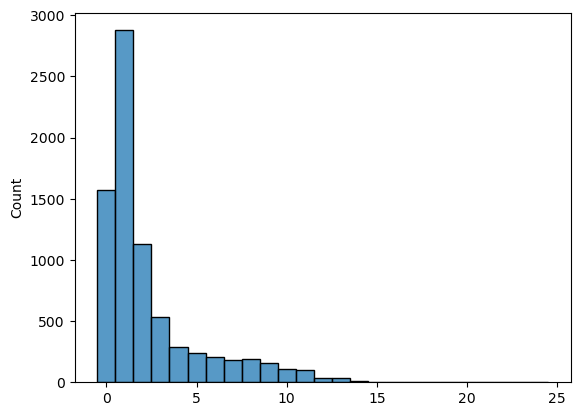

In [3]:
total_domains = 0
total_isoforms = 0
domain_type_counts = {}
isoforms_with_DNAbinding = 0
genes_with_DNAbinding = 0
geneList_DNAbinding = []
domain_counts = []
for gene_id in seqs:
    for prot_id in seqs[gene_id]:
        if not prot_id.startswith("ENS"):
            continue
        total_isoforms+=1
        domain_counts.append(0)
        for domain in seqs[gene_id][prot_id]["domains"]:
            if domain['type']!='SuperFamily':
                continue
            total_domains+=1
            domain_counts[-1]+=1
            if domain['description'] in domain_type_counts:
                domain_type_counts[domain['description']]+=1
            else:
                domain_type_counts[domain['description']]=1
        for domain in seqs[gene_id][prot_id]["domains"]:
            if domain['type']!='SuperFamily':
                continue
            if "DNA-binding" in domain['description']:
                isoforms_with_DNAbinding+=1
                break
    has_DNA = False
    for prot_id in seqs[gene_id]:
        if not prot_id.startswith("ENS"):
            continue
        for domain in seqs[gene_id][prot_id]["domains"]:
            if domain['type']!="SuperFamily":
                continue
            if "DNA-binding" in domain['description']:
                has_DNA = True
                break
    if has_DNA:
        genes_with_DNAbinding += 1
        geneList_DNAbinding.append(gene_id)
print(total_domains/total_isoforms)
sns.histplot(domain_counts, discrete=True);
#print(domain_type_counts)
print(isoforms_with_DNAbinding/total_isoforms)
print(genes_with_DNAbinding/len(seqs))

2.1952077093371534
0.17801797108998568
0.021617398098710768
0.21169739351557534


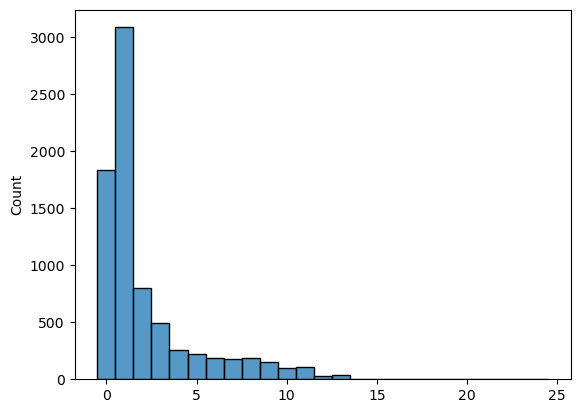

In [3]:
total_domains = 0
total_isoforms = 0
domain_type_counts = {}
isoforms_with_DNAbinding = 0
isoforms_with_PPI = 0
genes_with_DNAbinding = 0
geneList_DNAbinding = []
domain_counts = []
for gene_id in seqs:
    if len(seqs[gene_id])<=1:
        continue
    if 'Swiss-Prot' in seqs[gene_id]["uniprot"]:
        uniprot_id = seqs[gene_id]["uniprot"]['Swiss-Prot']
        if type(uniprot_id)!=str:
            uniprot_id = uniprot_id[0]
    else:
        #print(seqs[gene_id]["uniprot"])
        uniprot_id = seqs[gene_id]["uniprot"]['TrEMBL']
    if type(uniprot_id)==list:
        uniprot_id = uniprot_id[0]
    interpro_url = f"https://www.ebi.ac.uk:443/interpro/api/entry/InterPro/protein/UniProt/{uniprot_id}/?page_size=200"
    req = request.Request(interpro_url, headers = {"Accept": "application/json"})
    res = request.urlopen(req)
    json_res = json.loads(res.read().decode())
    interpro_domains = {domain['metadata']['accession']:domain for domain in json_res['results'] 
                        if 'ssf' in domain['metadata']['member_databases']}
    for prot_id in seqs[gene_id]:
        if not prot_id.startswith("ENS"):
            continue
        total_isoforms+=1
        domain_counts.append(0)
        for domain in seqs[gene_id][prot_id]["domains"]:
            if domain['interpro'] not in interpro_domains or domain['type']!='SuperFamily':
                continue
            total_domains+=1
            domain_counts[-1]+=1
            if domain['description'] in domain_type_counts:
                domain_type_counts[domain['description']]+=1
            else:
                domain_type_counts[domain['description']]=1
            is_ppi = False
            if interpro_domains[domain['interpro']]['metadata']['go_terms'] is not None:
                for go_term in interpro_domains[domain['interpro']]['metadata']['go_terms']:
                    if go_term['name']=='protein binding':
                        is_ppi = True
            if is_ppi:
                domain['class'] = "PPI"
                isoforms_with_PPI+=1
                break
        for domain in seqs[gene_id][prot_id]["domains"]:
            if domain['type']!='SuperFamily':
                continue
            if "DNA-binding" in domain['description']:
                isoforms_with_DNAbinding+=1
                domain['class'] = "DNA"
                break
        for domain in seqs[gene_id][prot_id]["domains"]:
            if 'class' not in domain:
                domain['class'] = "Other"
    has_DNA = False
    for prot_id in seqs[gene_id]:
        if not prot_id.startswith("ENS"):
            continue
        for domain in seqs[gene_id][prot_id]["domains"]:
            if domain['type']!="SuperFamily":
                continue
            if "DNA-binding" in domain['description']:
                has_DNA = True
                break
    if has_DNA:
        genes_with_DNAbinding += 1
        geneList_DNAbinding.append(gene_id)
print(total_domains/total_isoforms)
sns.histplot(domain_counts, discrete=True);
#print(domain_type_counts)
print(isoforms_with_DNAbinding/total_isoforms)
print(isoforms_with_PPI/total_isoforms)
print(genes_with_DNAbinding/len(seqs))

Identify a reference isoform for each gene, with priority given to:
 1. DNA binding domains
 2. Protein binding domains
 3. Transcription regulation domains
 4. Number of present domains

In [18]:
i=0
for gene_id in DNAbinding_seqs:
    domainCounts = {}
    
    for prot_id in DNAbinding_seqs[gene_id]:
        nDNAbind = 0
        nPPI = 0
        nTrans = 0
        nDomains = 0 
        for domain in DNAbinding_seqs[gene_id][prot_id]["consensus_domains"]:
            nDomains += 1
            if domain['class']=='DNA':
                nDNAbind += 1
            if domain['class']=='PPI':
                nPPI += 1
            if domain['class']=='TR':
                nTrans += 1
        domainCounts[prot_id] = [nDNAbind, nPPI, nTrans, nDomains]
    maxDNAbind = 0
    maxPPI = 0
    maxTrans = 0
    maxDomains = 0
    ref = ''
    for prot_id in domainCounts:
        if domainCounts[prot_id][0]>maxDNAbind:
            maxDNAbind = domainCounts[prot_id][0]
            ref = prot_id
            continue
        if domainCounts[prot_id][1]>maxPPI:
            maxPPI = domainCounts[prot_id][1]
            ref = prot_id
            continue
        if domainCounts[prot_id][2]>maxTrans:
            maxTrans = domainCounts[prot_id][2]
            ref = prot_id
            continue
        if domainCounts[prot_id][3]>maxDomains:
            maxDomains = domainCounts[prot_id][3]
            ref = prot_id
            continue
    DNAbinding_seqs[gene_id]['ref'] = ref

Identify the most common sources of domain information as a way to get a source priority list

In [7]:
types = {}
for gene_id in DNAbinding_seqs:
    for prot_id in DNAbinding_seqs[gene_id]:
        for domain in DNAbinding_seqs[gene_id][prot_id]['domains']:
            if not domain['type'] in types:
                types[domain['type']] = 1
            else:
                types[domain['type']] += 1
print([k for k, v in sorted(types.items(), key= lambda item:item[1], reverse=True)])

['MobiDBLite', 'Seg', 'sifts', 'PANTHER', 'Pfam', 'PRINTS', 'Gene3D', 'SuperFamily', 'Smart', 'Prosite_profiles', 'CDD', 'ncoils', 'Prosite_patterns', 'alphafold', 'PIRSF', 'TIGRfam', 'TMHMM', 'SignalP']


In [15]:
print(seqs[gene_id])
print([domain['description'] for domain in seqs["ENSG00000140987"]['ENSP00000483210']['domains']])

{'ENSP00000483210': {'seq': 'MAEGLWEQGFLRTPEQCRTKFKSLQLSYRKVRRGRVPEPCIFYEEMNALSGSWASAPPMASDAVPGQEGSDIEAGELNHQNGEPTEVEDGTVDGADRDEKDFRNPGQEVRKLDLPVLFPNRLGFEFKNEIKKENLKWDDSEEVEINKALQRKSRGVYWHSELQKGLESEPTSRRQCRNSPGESEEKTPSQEKMSHQSFCARDKACTHILCGKNCSQSVHSPHKPALKLEKVSQCPECGKTFSRSSYLVRHQRIHTGEKPHKCSECGKGFSERSNLTAHLRTHTGERPYQCGQCGKSFNQSSSLIVHQRTHTGEKPYQCIVCGKRFNNSSQFSAHRRIHTGESPYKCAVCGKIFNNSSHFSAHRKTHTGEKPYRCSHCERGFTKNSALTRHQTVHMKAVLSSQEGRDAL', 'domains': [{'end': 284, 'type': 'Gene3D', 'translation_id': 1145084, 'feature_type': 'protein_feature', 'seq_region_name': 'ENSP00000483210', 'align_type': None, 'id': '3.30.160.60', 'Parent': 'ENST00000618425', 'description': '', 'hit_start': 7, 'hit_end': 40, 'hseqname': '3.30.160.60', 'interpro': '', 'cigar_string': '', 'start': 257}, {'type': 'Gene3D', 'end': 256, 'translation_id': 1145084, 'feature_type': 'protein_feature', 'seq_region_name': 'ENSP00000483210', 'align_type': None, 'id': '3.30.160.60', 'description': '', 'Parent': 'ENST00000618425',

Write to fasta

In [6]:
#gene = 'ENSG00000001167'
#prot = 'ENSP00000345702'
for gene_id in seqs:
    for prot_id in seqs[gene_id]:
        with open("fastas/"+prot_id+".fa", "w") as f:
            f.write(">" + prot_id + "\n")
            f.write(seqs[gene_id][prot_id]['seq'])